In [1]:
import numpy as np
import random as rd
import tensorflow as tf

from keras.layers import Dense, Embedding, Flatten, Input, concatenate, average, minimum, maximum, add
from keras.models import Model
from keras.optimizers import Adagrad

#Import another jupyter notebook
import import_ipynb
from Productive_CrossValidation_inclTest import *
from Productive_Data_GetTrainTest import samEval

C:\Users\Anja Tetzner\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


importing Jupyter notebook from Productive_CrossValidation_inclTest.ipynb
importing Jupyter notebook from Productive_TimeHistory.ipynb
importing Jupyter notebook from AttentionLayer.ipynb
importing Jupyter notebook from Productive_Data_GetTrainTest.ipynb


In [2]:
#for reproducability of the results
seed = 7
np.random.seed(seed)
tf.set_random_seed(seed)
rd.seed(seed)

In [3]:
path = 'data/'
outputpath ='outputs/03_aditionalFeatures_samEval2018/'

In [4]:
#Load necessary data
train_data, train_labels, test_data, test_labels, word_index, MAX_SEQUENCE_LENGTH = samEval()

In [5]:
#Load pretrained embeddings
import gensim
from gensim.models import KeyedVectors

#Pretrained Google News Embeddings, Dimension 300
GOOGLEEMB = path + 'GoogleNews-vectors-negative300.bin'

embedding= KeyedVectors.load_word2vec_format(GOOGLEEMB, binary=True)

word_vectors = embedding.wv

C:\Users\Anja Tetzner\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).
  # Remove the CWD from sys.path while we load stuff.


In [6]:
#Create embedding-matrix, serves the Keras Embedding Layer as weigths
EMBEDDING_DIM=300

embedding_matrix = np.zeros((len(word_index)+1, EMBEDDING_DIM))

for word, i in word_index.items():
    try:
        embedding_vector = word_vectors[word]
        embedding_matrix[i] = embedding_vector   
    except:
        # words not found in embeddings will be zero
        pass

In [7]:
#Load POS data
def get_pos(file):
    pos =[]
    with open(file, 'r') as f:
        for line in f:
            pos.append([int(i) for i in line.split(',')])
    pos= np.asarray(pos)
    return pos

train_pos =get_pos('output_trainTestData/SamEval_train_pos.csv')
test_pos = get_pos('output_trainTestData/SamEval_test_pos.csv')

In [8]:
#Load Sentiment data
def get_sentiment(file):
    senti =[]
    with open(file, 'r') as f:
        for line in f:
            senti.append([float(i) for i in line.split(',')])
    senti= np.asarray(senti)
    return senti

train_senti_blob =get_sentiment('output_trainTestData/SamEval_train_data_sentiment_blob.csv')
test_senti_blob = get_sentiment('output_trainTestData/SamEval_test_data_sentiment_blob.csv')
train_senti_vadar =get_sentiment('output_trainTestData/SamEval_train_data_sentiment_vadar.csv')
test_senti_vadar = get_sentiment('output_trainTestData/SamEval_test_data_sentiment_vadar.csv')

### Hyperparameter for all models

In [9]:
BATCH_SIZE = 64
NUM_EPOCHS = 30
softmax = True
lossfunction ='binary_crossentropy'
optimizer = Adagrad(lr=0.001)

# Part of speech

## Combine Inputs

In [11]:
#Input Words
wv_layer = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences = wv_layer(comment_input)
embedded_sequences = Flatten()(embedded_sequences)

#Input POS
pos_input = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')

#Concat Inputs
concat = concatenate([embedded_sequences, pos_input], axis=1)

x = Dense(600, activation='relu')(concat)
preds = Dense(2, activation='softmax')(x)

# build the model
model = Model(inputs=[comment_input, pos_input], outputs=preds)
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 40, 300)      4118700     input_3[0][0]                    
__________________________________________________________________________________________________
flatten_2 (Flatten)             (None, 12000)        0           embedding_2[0][0]                
__________________________________________________________________________________________________
input_4 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
concatenat


-----Fold 1--------


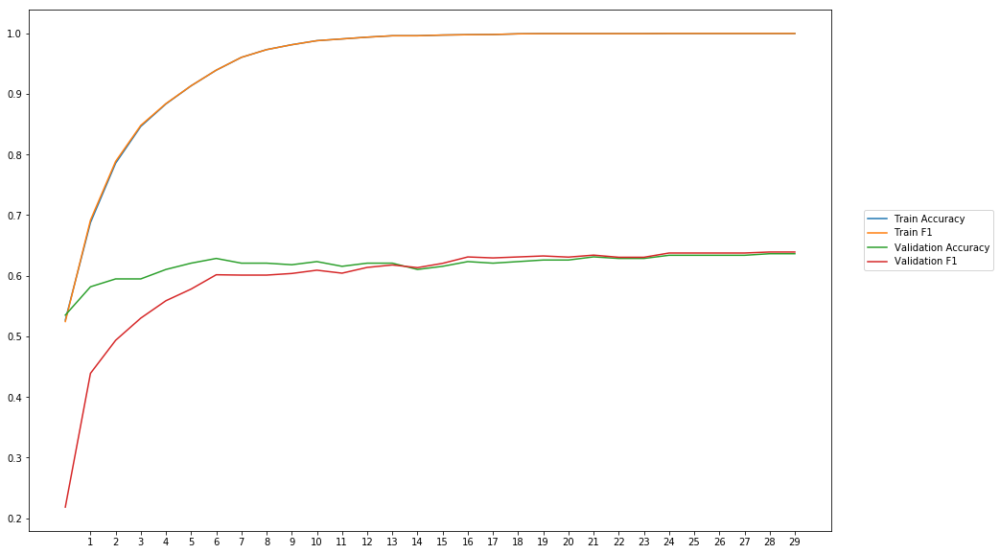

Average Accuracy: 61.83%
Average Precision: 63.06%
Average Recall: 57.59%
Average F1: 59.28%

-----Fold 2--------


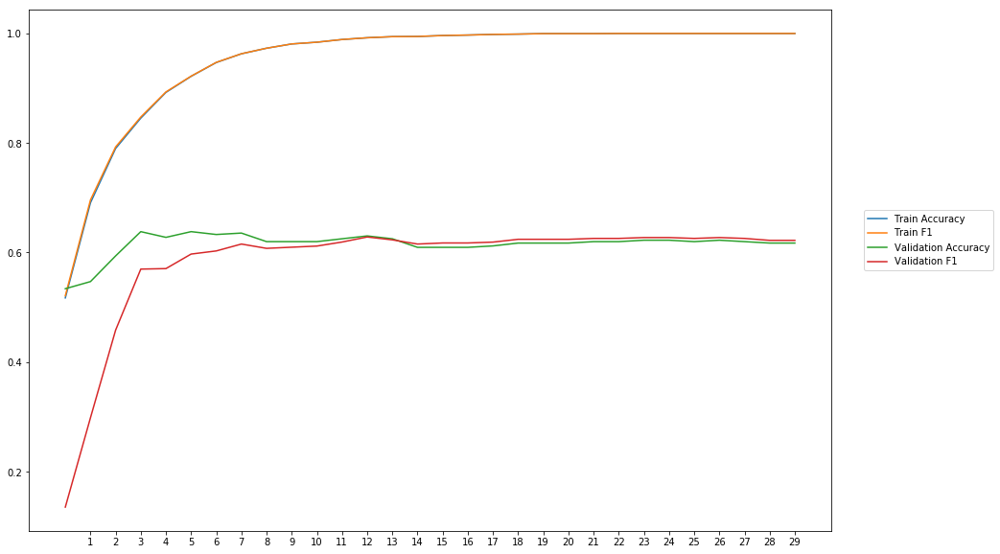

Average Accuracy: 61.53%
Average Precision: 63.50%
Average Recall: 57.05%
Average F1: 58.39%

-----Fold 3--------


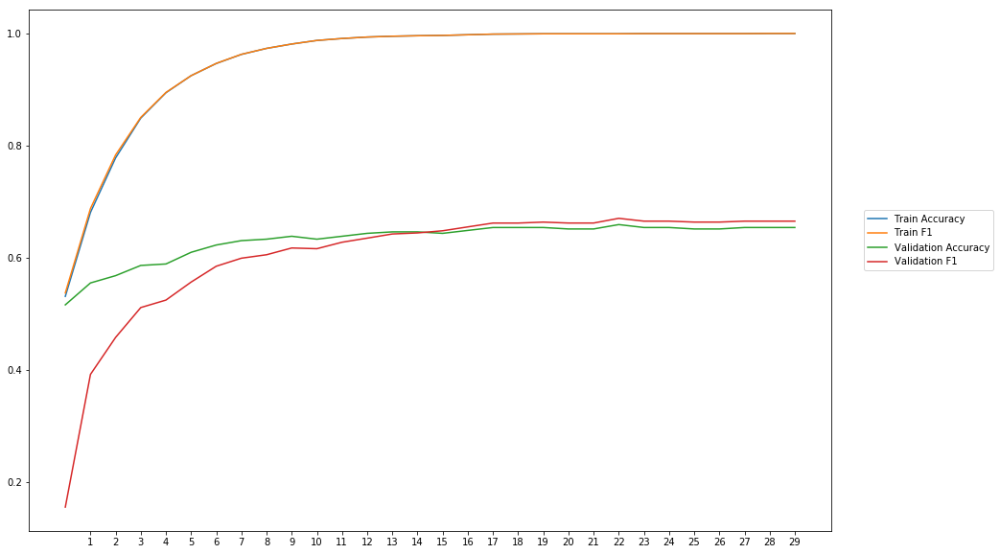

Average Accuracy: 63.12%
Average Precision: 63.70%
Average Recall: 59.20%
Average F1: 60.33%

-----Fold 4--------


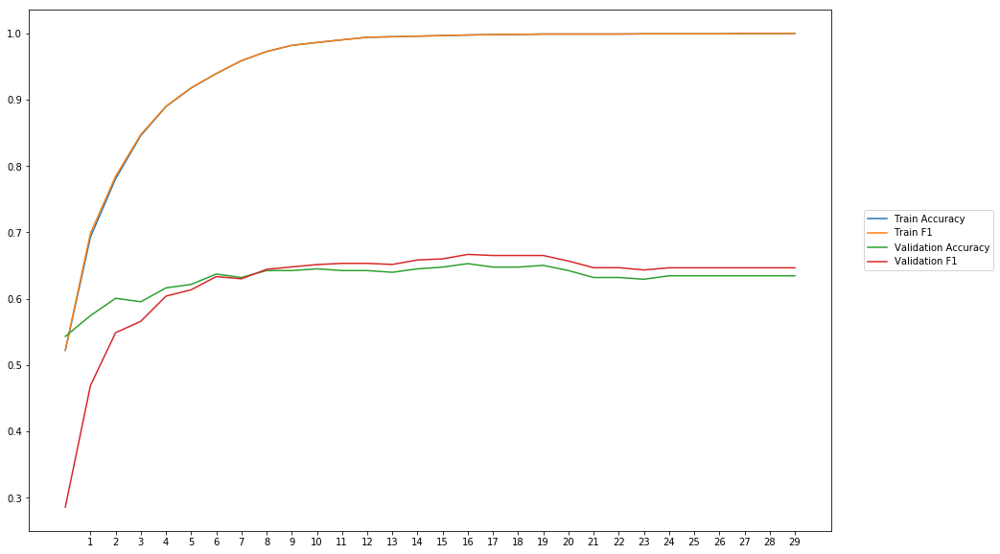

Average Accuracy: 63.02%
Average Precision: 62.91%
Average Recall: 63.05%
Average F1: 62.34%

-----Fold 5--------


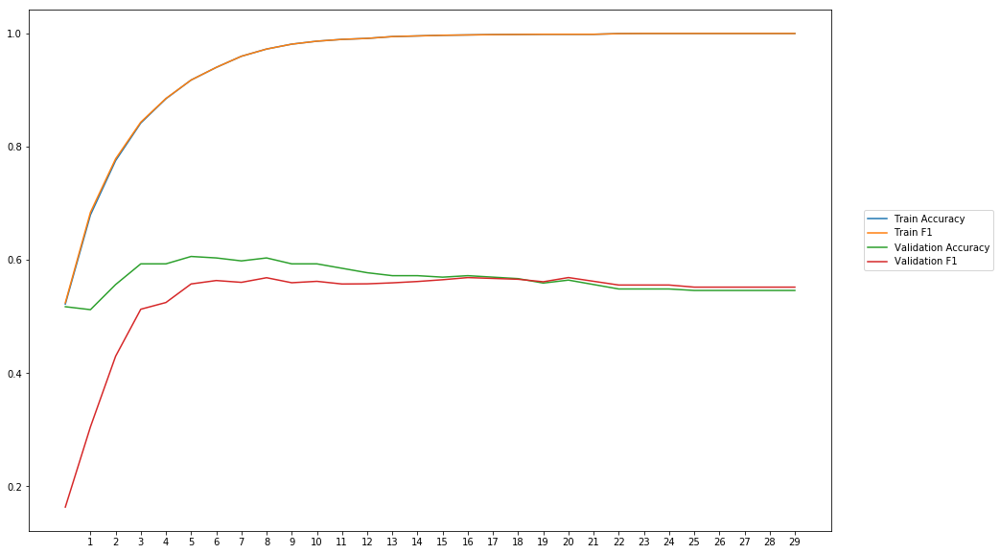

Average Accuracy: 56.67%
Average Precision: 57.73%
Average Recall: 50.77%
Average F1: 53.06%

-----Fold 6--------


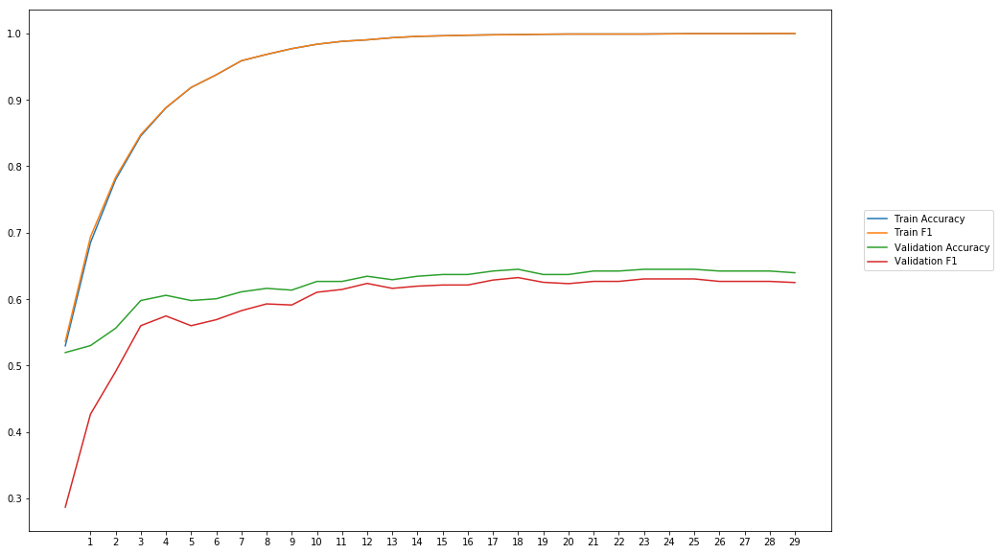

Average Accuracy: 62.07%
Average Precision: 63.29%
Average Recall: 55.90%
Average F1: 59.07%

-----Fold 7--------


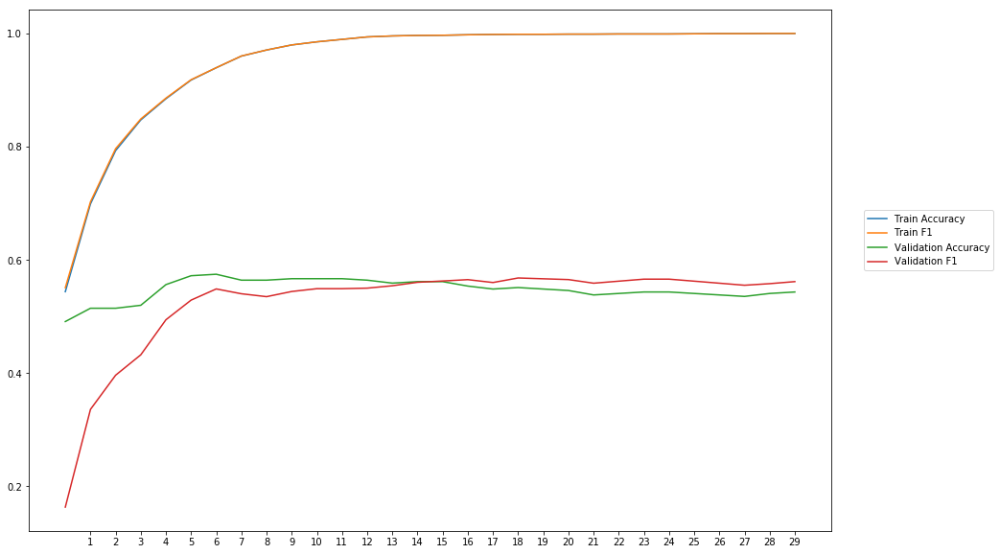

Average Accuracy: 54.74%
Average Precision: 54.70%
Average Recall: 51.66%
Average F1: 52.38%

-----Fold 8--------


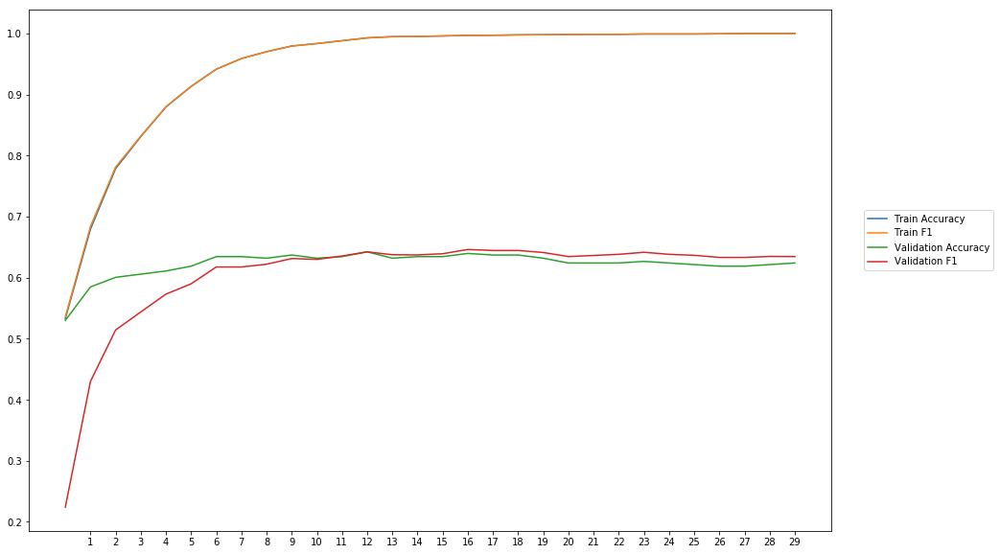

Average Accuracy: 62.24%
Average Precision: 62.95%
Average Recall: 59.79%
Average F1: 60.41%

-----Fold 9--------


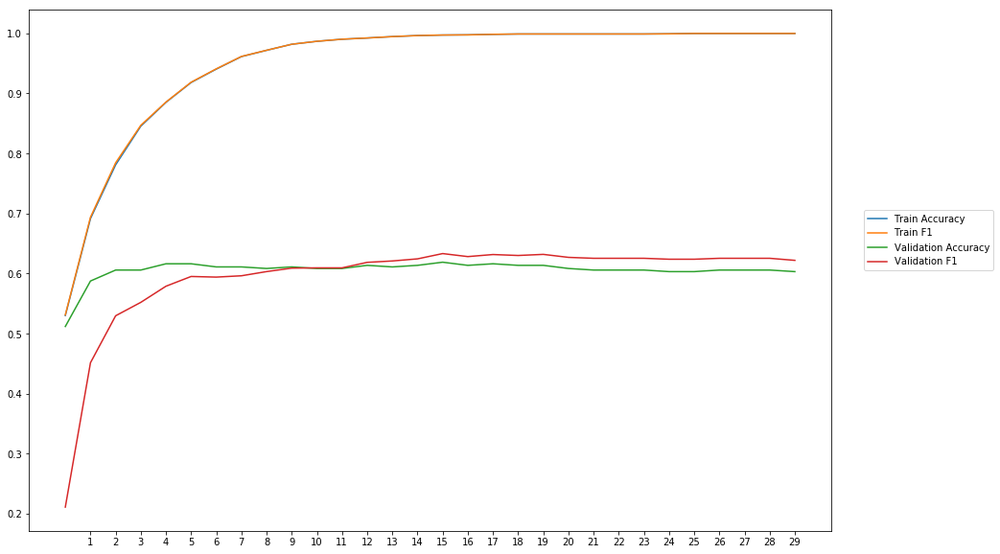

Average Accuracy: 60.56%
Average Precision: 60.74%
Average Recall: 59.58%
Average F1: 59.35%

-----Fold 10--------


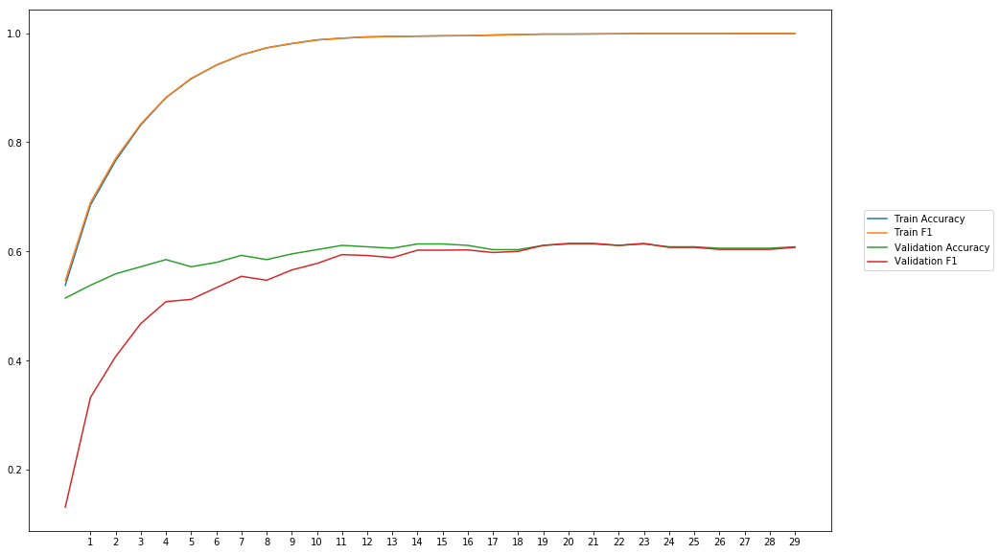

Average Accuracy: 59.56%
Average Precision: 60.93%
Average Recall: 52.65%
Average F1: 55.38%

-------Overallresults-------


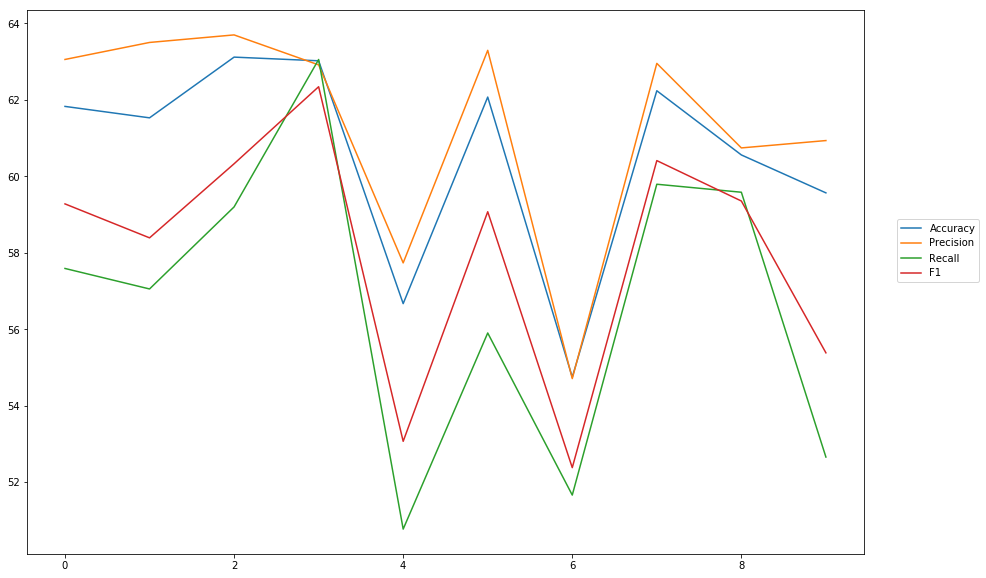

Accuracy: Mean = 60.53% (+/- 2.65%), Max = 63.12%, Min =  54.74%
Precision: Mean = 61.35% (+/- 2.82%), Max = 63.70%, Min =  54.70%
Recall: Mean = 56.72% (+/- 3.78%), Max = 63.05%, Min =  50.77%
F1: Mean = 58.00% (+/- 3.13%), Max = 62.34%, Min =  52.38%


In [10]:
cross_val_two_inputs(model, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_labels, softmax, outputpath, 'gloVe_6_50')

## Seperate Models combine results

In [10]:
#First part
wv_layer_2 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_2 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_2 = wv_layer_2(comment_input_2)
x_first = Dense(600, activation='relu')(embedded_sequences_2)
x_first = Flatten()(x_first)

#Second part
pos_input_2 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second = Dense(600, activation='relu')(pos_input_2)

#Concatination
concat = concatenate([x_first, x_second])

#x_2 = Flatten()(concat)

preds_2 = Dense(2, activation='softmax')(concat)

model_2 = Model(inputs=[comment_input_2, pos_input_2], outputs=preds_2)
model_2.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 40, 300)      4118700     input_1[0][0]                    
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 40, 600)      180600      embedding_1[0][0]                
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_1 


-----Fold 1--------


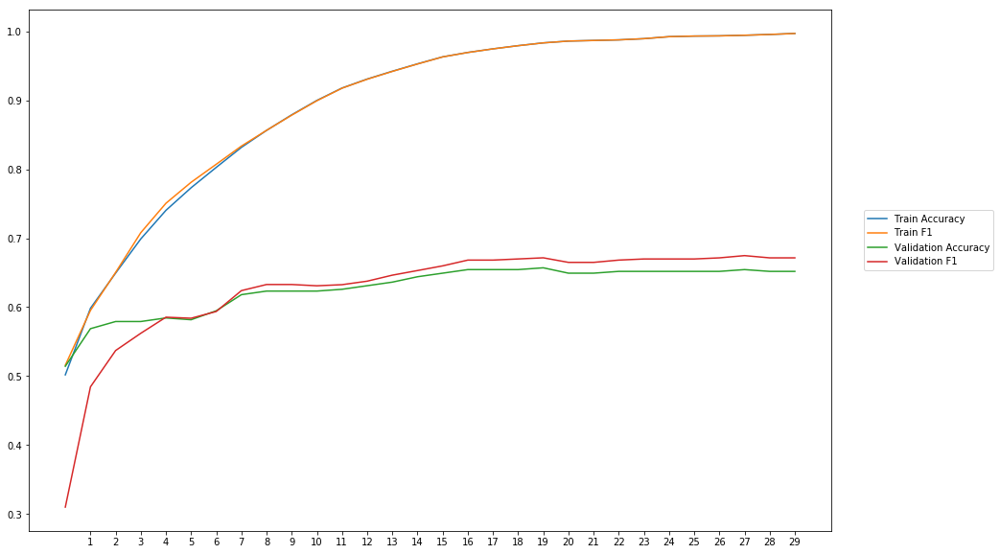

Average Accuracy: 62.72%
Average Precision: 61.97%
Average Recall: 64.05%
Average F1: 62.61%

-----Fold 2--------


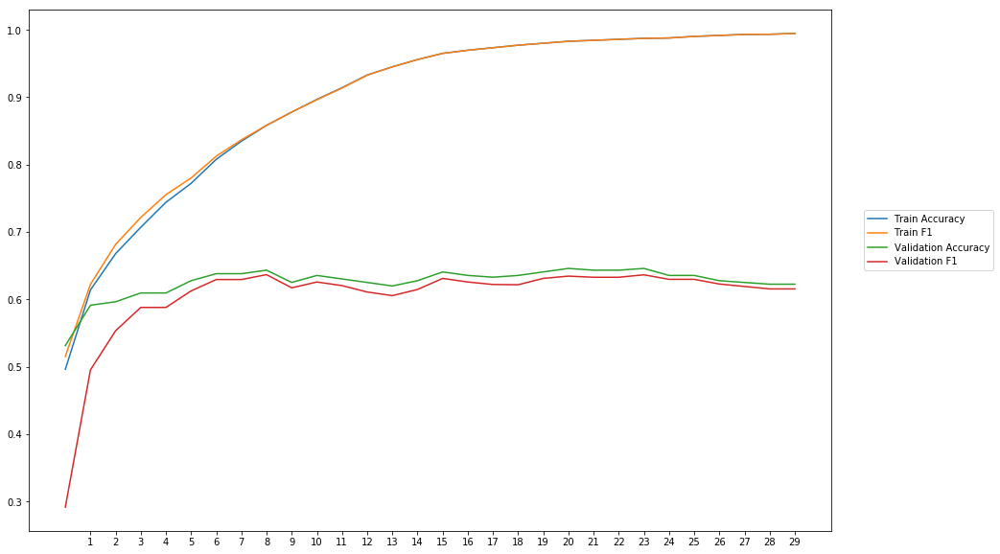

Average Accuracy: 62.60%
Average Precision: 63.39%
Average Recall: 58.34%
Average F1: 60.39%

-----Fold 3--------


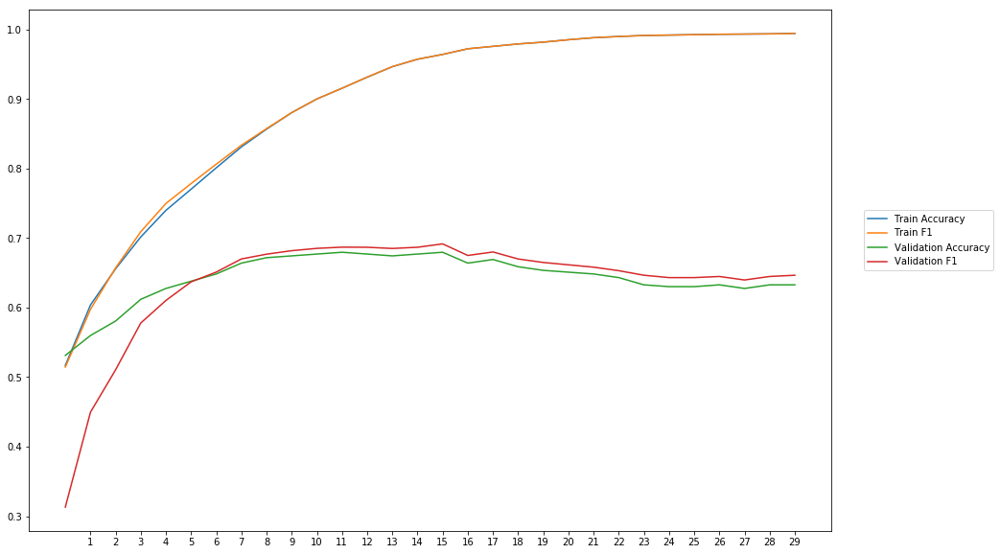

Average Accuracy: 64.27%
Average Precision: 63.76%
Average Recall: 64.40%
Average F1: 63.58%

-----Fold 4--------


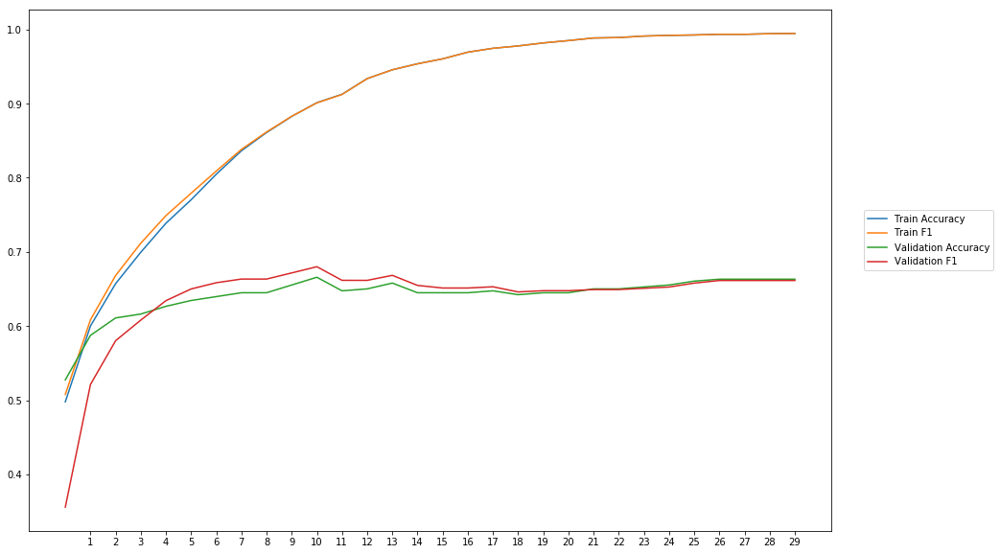

Average Accuracy: 64.15%
Average Precision: 63.84%
Average Recall: 64.29%
Average F1: 63.78%

-----Fold 5--------


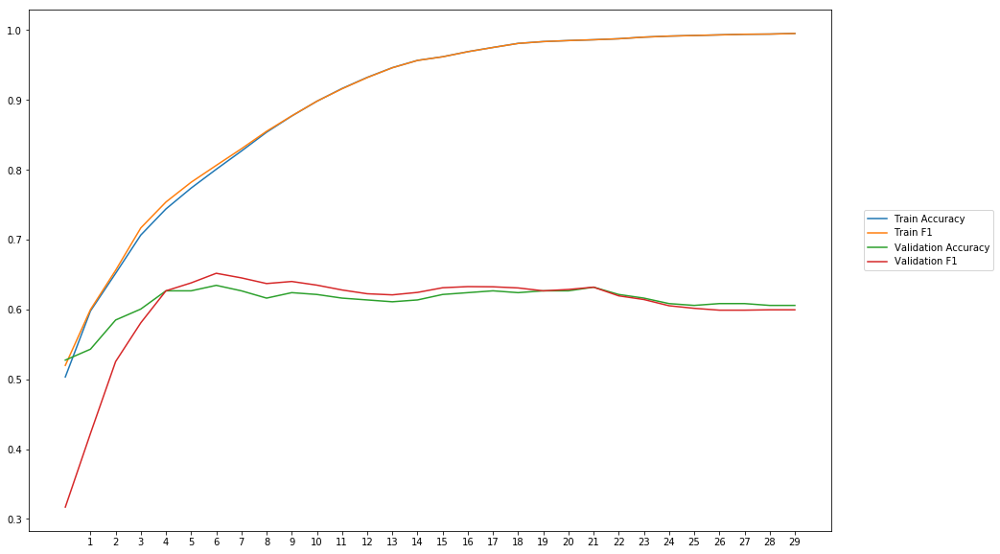

Average Accuracy: 61.16%
Average Precision: 61.09%
Average Recall: 60.23%
Average F1: 60.22%

-----Fold 6--------


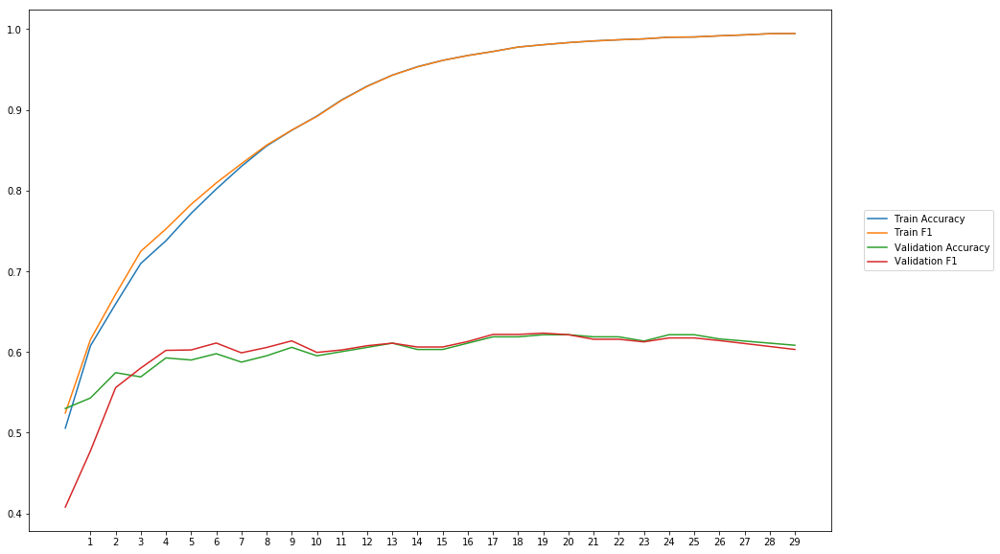

Average Accuracy: 60.13%
Average Precision: 60.02%
Average Recall: 59.63%
Average F1: 59.68%

-----Fold 7--------


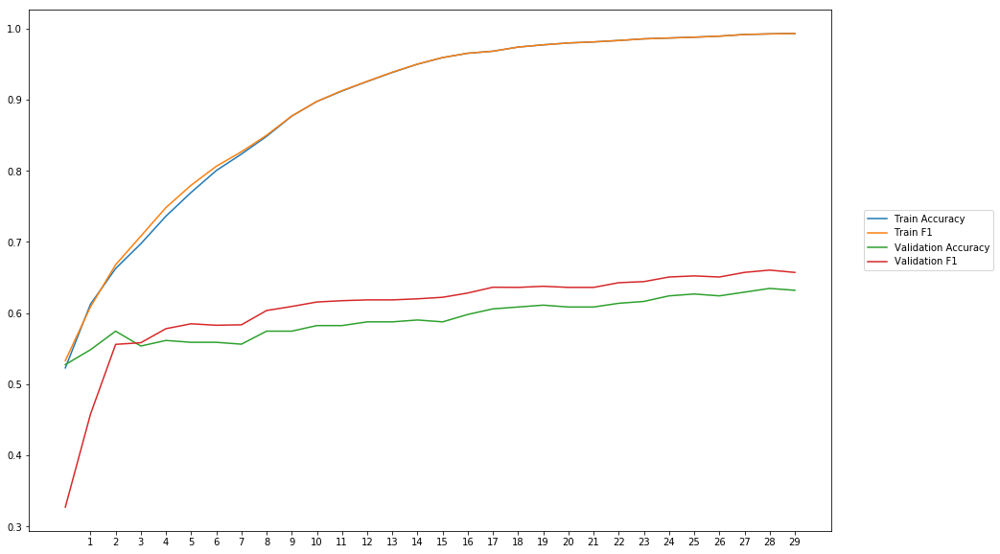

Average Accuracy: 59.15%
Average Precision: 58.11%
Average Recall: 64.24%
Average F1: 60.58%

-----Fold 8--------


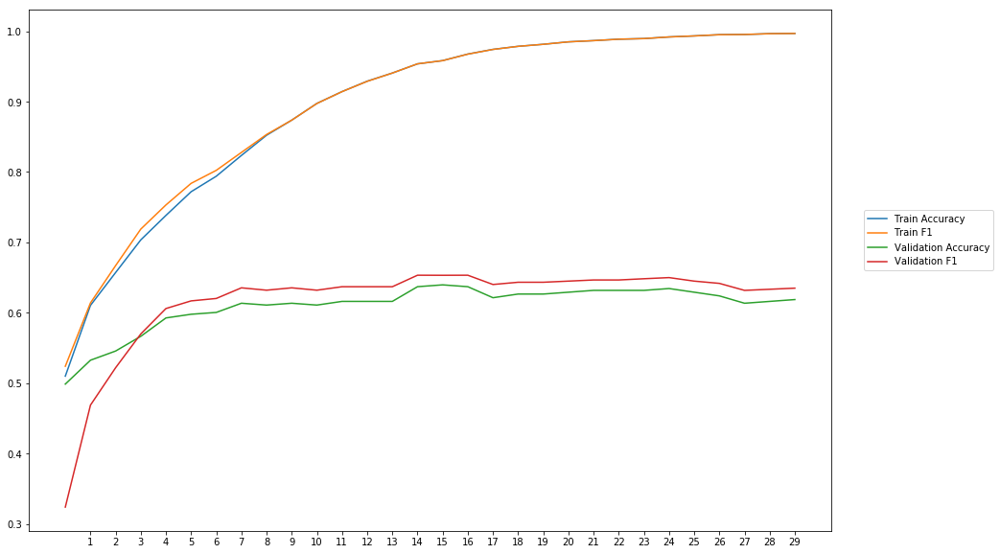

Average Accuracy: 60.94%
Average Precision: 59.90%
Average Recall: 63.96%
Average F1: 61.62%

-----Fold 9--------


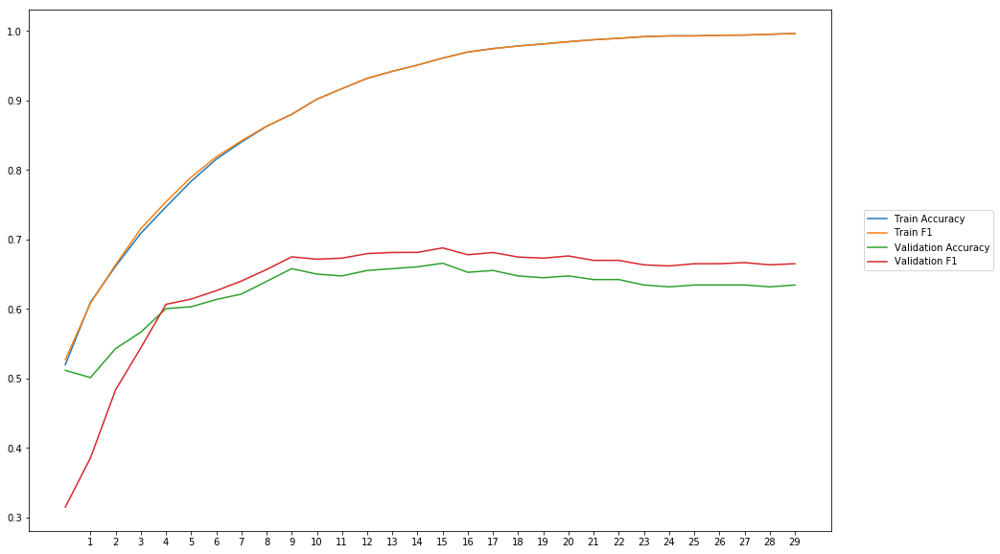

Average Accuracy: 62.55%
Average Precision: 60.97%
Average Recall: 66.88%
Average F1: 63.32%

-----Fold 10--------


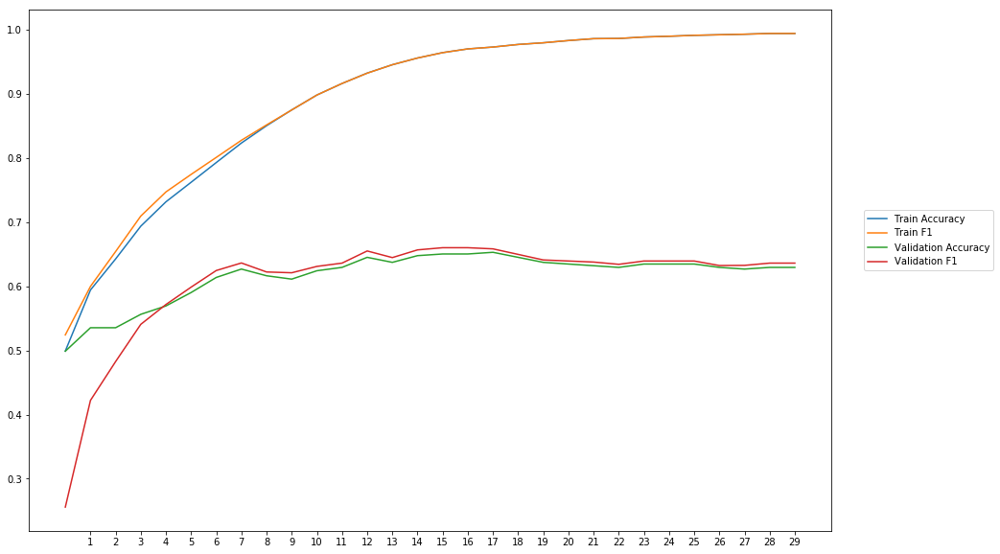

Average Accuracy: 61.61%
Average Precision: 61.16%
Average Recall: 61.15%
Average F1: 60.77%

-------Overallresults-------


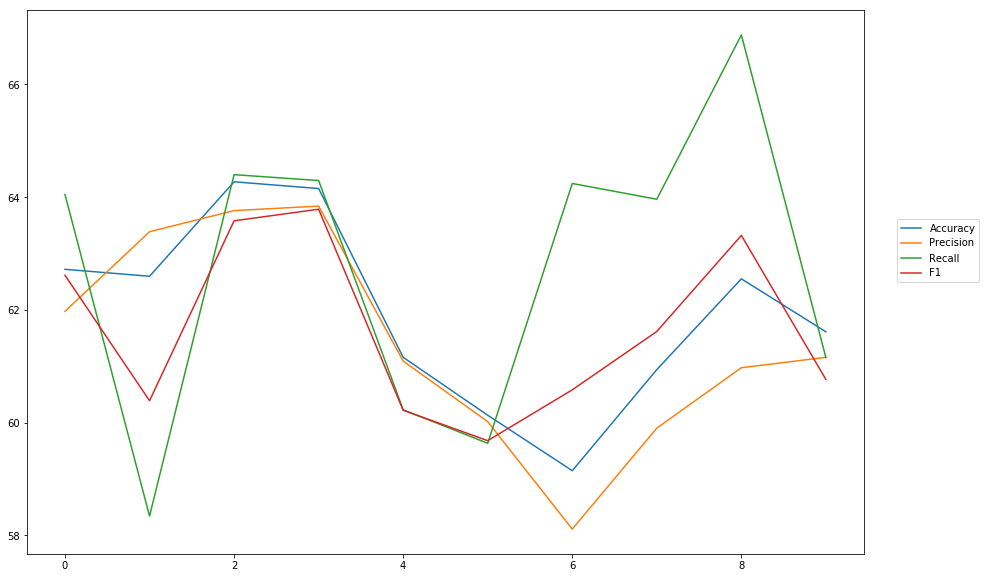

Accuracy: Mean = 61.93% (+/- 1.57%), Max = 64.27%, Min =  59.15%
Precision: Mean = 61.42% (+/- 1.76%), Max = 63.84%, Min =  58.11%
Recall: Mean = 62.72% (+/- 2.56%), Max = 66.88%, Min =  58.34%
F1: Mean = 61.65% (+/- 1.46%), Max = 63.78%, Min =  59.68%


In [19]:
cross_val_two_inputs(model_2, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'separat_models')

## Separate models combine output

### average

In [15]:
#First model
wv_layer_3 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_3 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_3 = wv_layer_3(comment_input_3)
x_first = Dense(600, activation='relu')(embedded_sequences_3)
x_first = Flatten()(x_first)
first_preds = Dense(2, activation='softmax')(x_first)

#Second model
pos_input_3 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second = Dense(600, activation='relu')(pos_input_3)
second_preds = Dense(2, activation='softmax')(x_second)

#Concat outputs
preds_3 = average([first_preds, second_preds])

model_3 = Model(inputs=[comment_input_3, pos_input_3], outputs=preds_3)
model_3.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_3 (Embedding)         (None, 40, 300)      4118700     input_5[0][0]                    
__________________________________________________________________________________________________
dense_9 (Dense)                 (None, 40, 600)      180600      embedding_3[0][0]                
__________________________________________________________________________________________________
input_6 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_2 

Instructions for updating:
Use tf.cast instead.

-----Fold 1--------


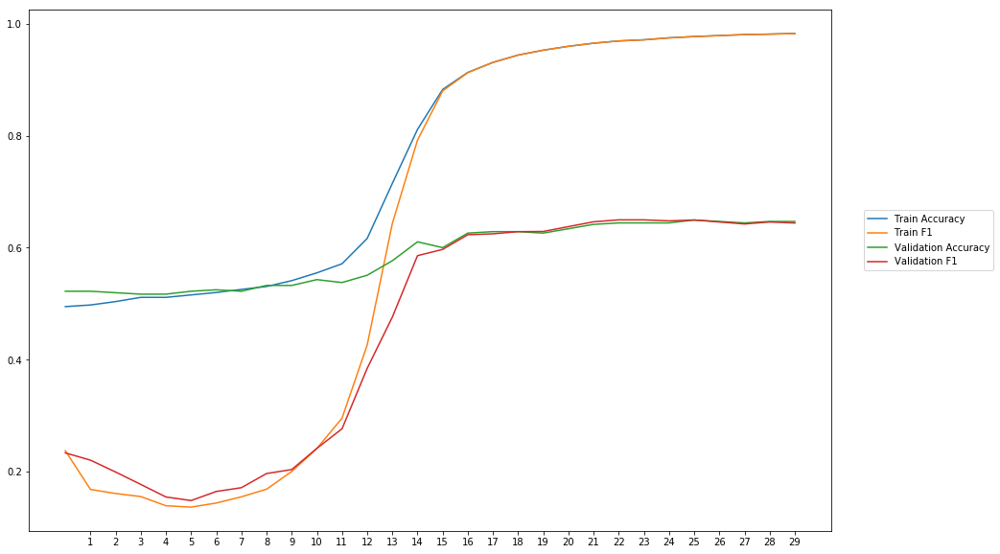

Average Accuracy: 58.67%
Average Precision: 63.30%
Average Recall: 40.83%
Average F1: 44.64%

-----Fold 2--------


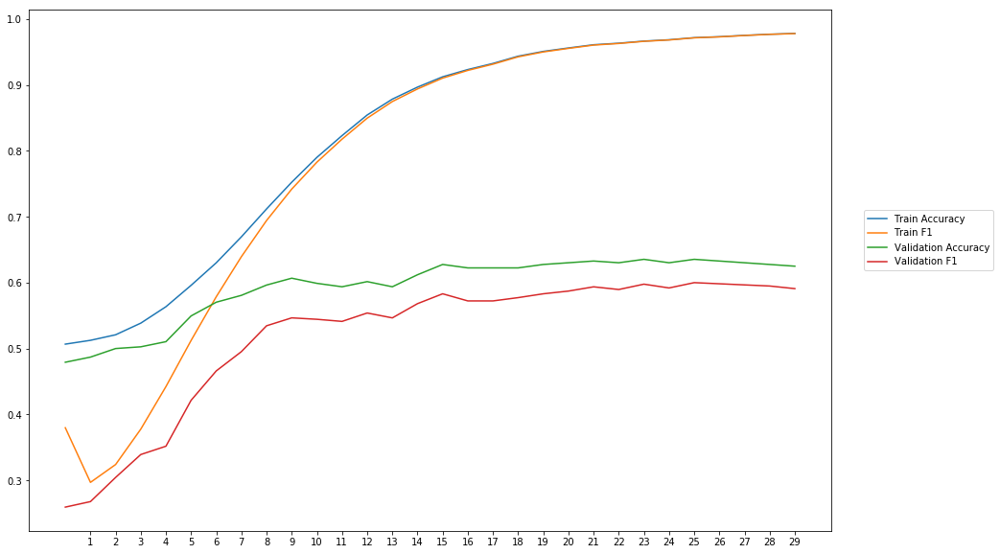

Average Accuracy: 59.38%
Average Precision: 61.50%
Average Recall: 45.51%
Average F1: 51.90%

-----Fold 3--------


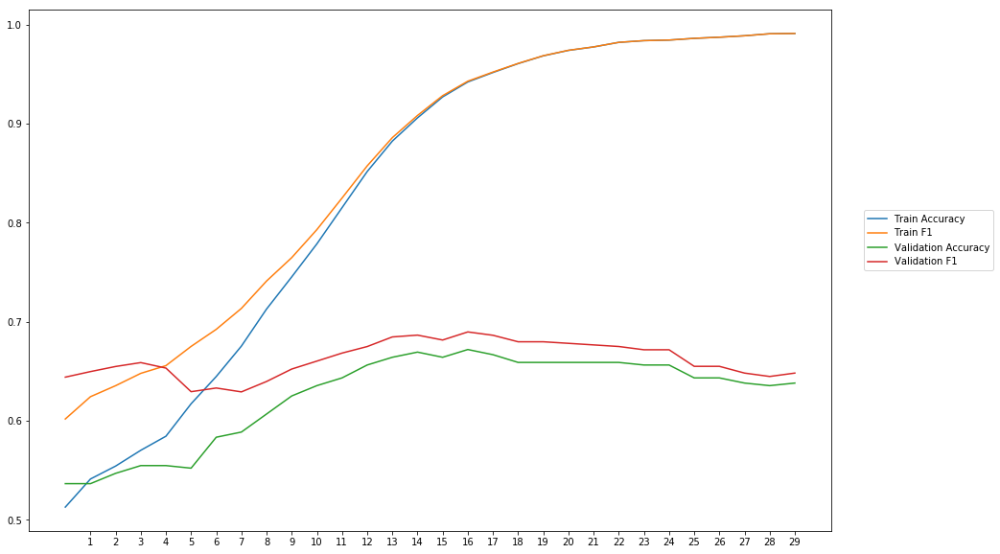

Average Accuracy: 62.53%
Average Precision: 60.74%
Average Recall: 73.54%
Average F1: 66.19%

-----Fold 4--------


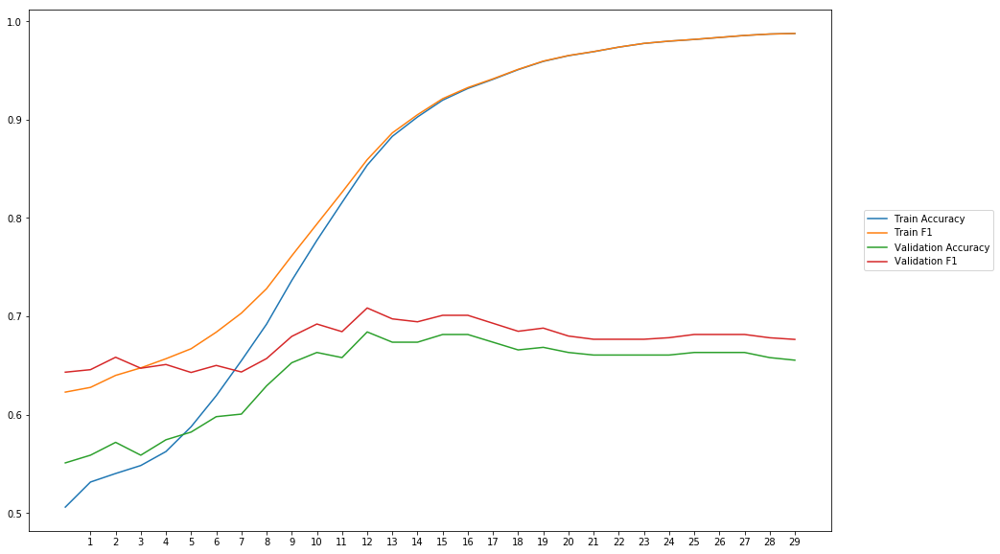

Average Accuracy: 64.03%
Average Precision: 61.95%
Average Recall: 74.59%
Average F1: 67.50%

-----Fold 5--------


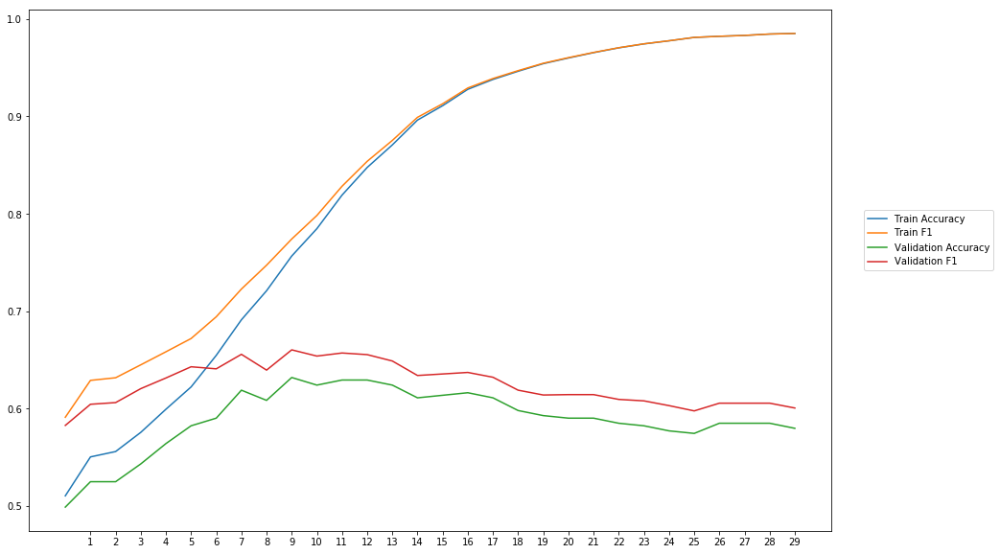

Average Accuracy: 58.89%
Average Precision: 57.56%
Average Recall: 68.50%
Average F1: 62.44%

-----Fold 6--------


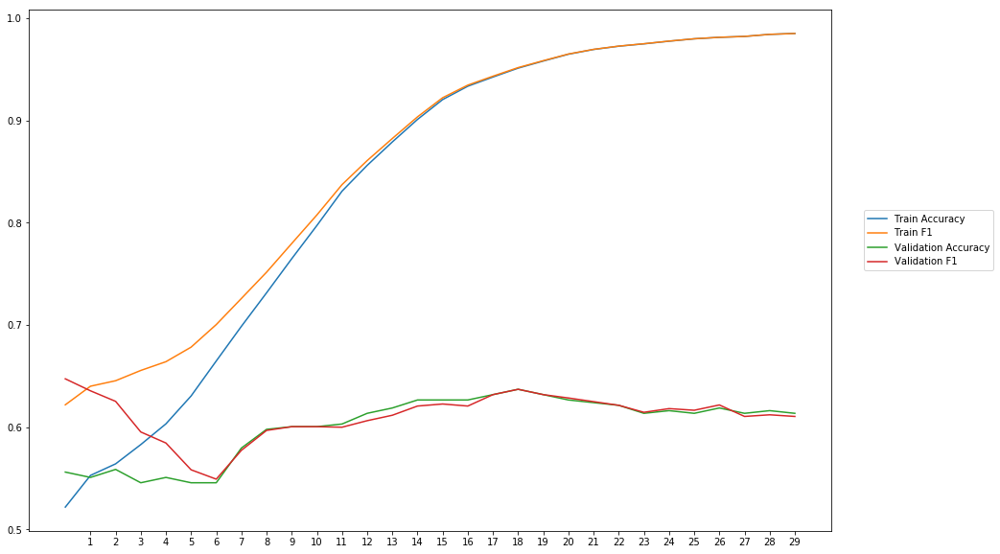

Average Accuracy: 60.09%
Average Precision: 59.77%
Average Recall: 62.98%
Average F1: 61.11%

-----Fold 7--------


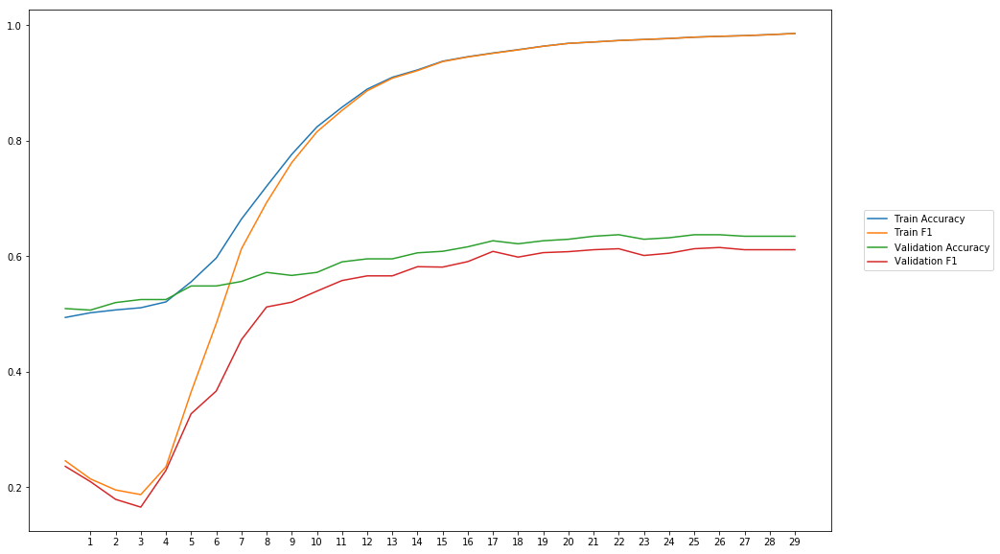

Average Accuracy: 59.24%
Average Precision: 62.07%
Average Recall: 45.29%
Average F1: 50.30%

-----Fold 8--------


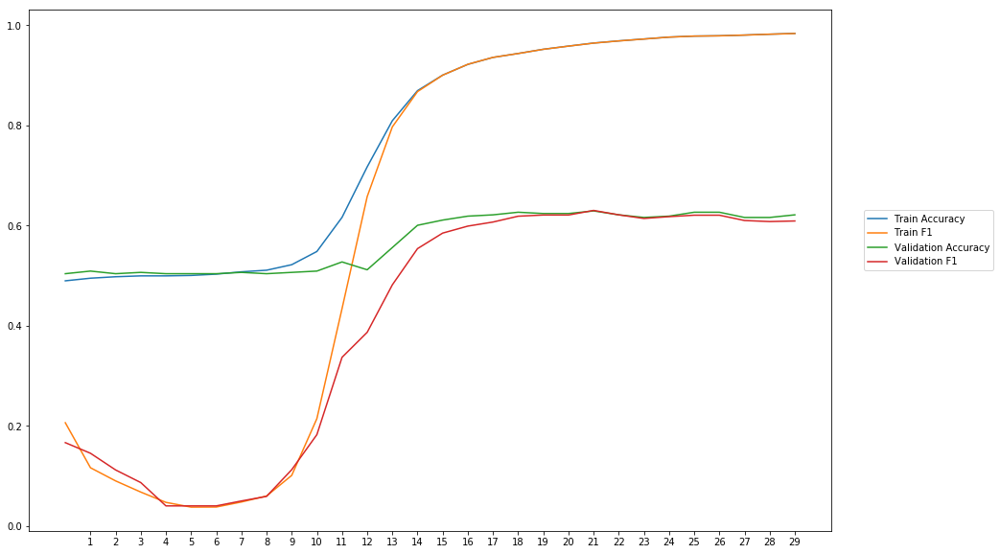

Average Accuracy: 56.92%
Average Precision: 59.22%
Average Recall: 37.00%
Average F1: 40.00%

-----Fold 9--------


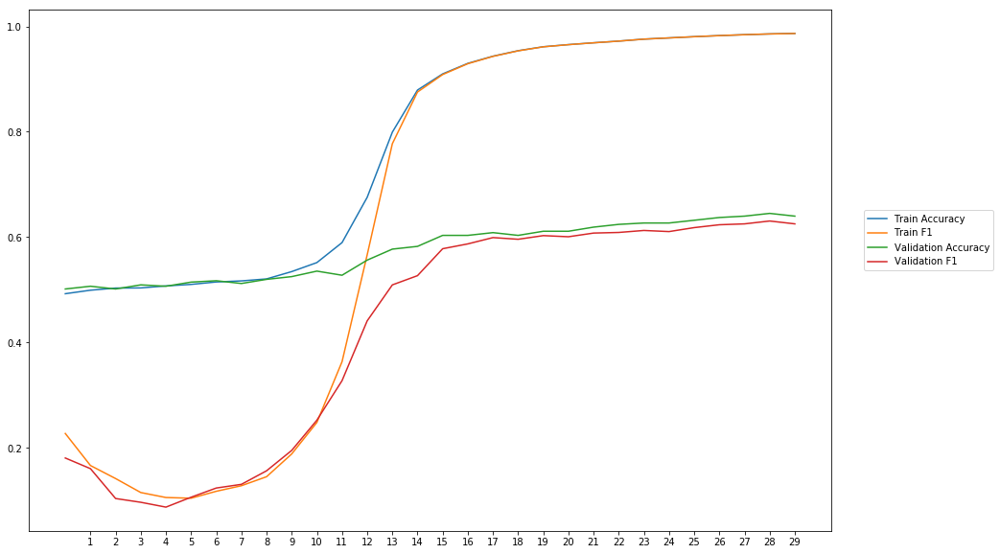

Average Accuracy: 57.40%
Average Precision: 60.89%
Average Recall: 37.45%
Average F1: 41.72%

-----Fold 10--------


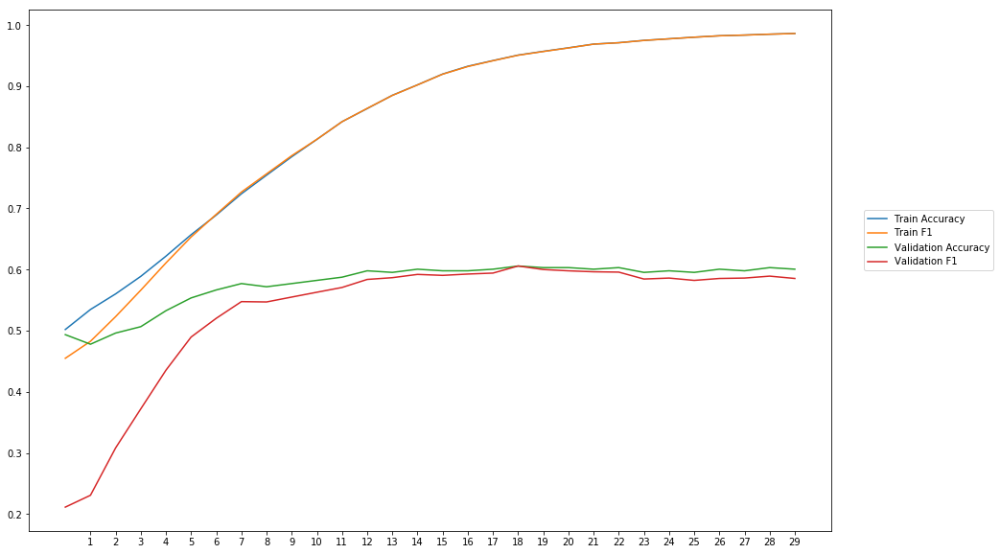

Average Accuracy: 57.73%
Average Precision: 57.95%
Average Recall: 50.51%
Average F1: 53.28%

-------Overallresults-------


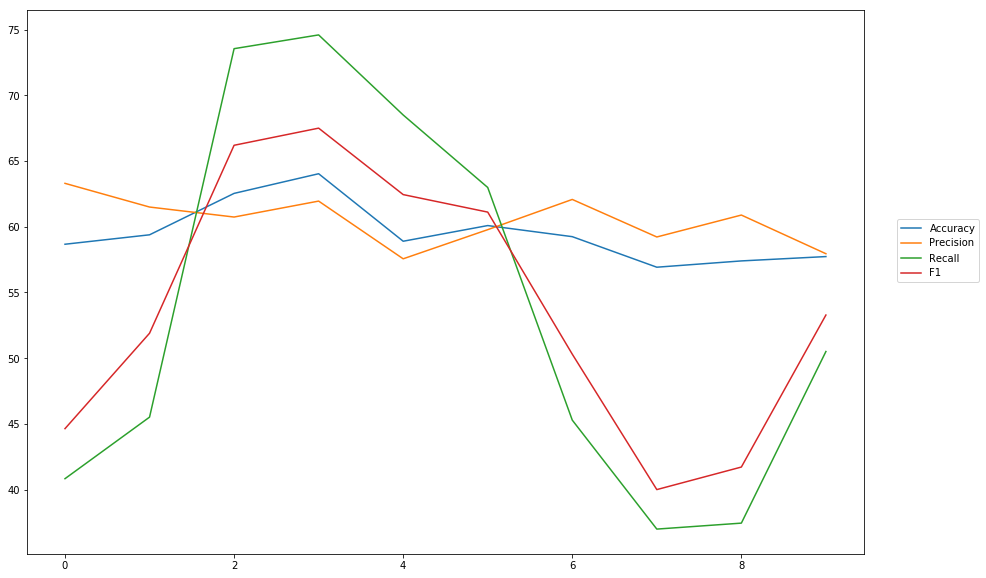

Accuracy: Mean = 59.49% (+/- 2.13%), Max = 64.03%, Min =  56.92%
Precision: Mean = 60.49% (+/- 1.76%), Max = 63.30%, Min =  57.56%
Recall: Mean = 53.62% (+/- 14.11%), Max = 74.59%, Min =  37.00%
F1: Mean = 53.91% (+/- 9.52%), Max = 67.50%, Min =  40.00%


In [16]:
cross_val_two_inputs(model_3, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_labels, softmax, outputpath, 'combined_outputs')

### maximum

In [17]:
#First model
wv_layer_4 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_4 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_4 = wv_layer_4(comment_input_4)
x_first_2 = Dense(600, activation='relu')(embedded_sequences_4)
x_first_2 = Flatten()(x_first_2)
first_preds_2 = Dense(2, activation='softmax')(x_first_2)

#Second model
pos_input_4 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_2 = Dense(600, activation='relu')(pos_input_4)
second_preds_2 = Dense(2, activation='softmax')(x_second_2)

#Concat outputs
preds_4 = maximum([first_preds_2, second_preds_2])

model_4 = Model(inputs=[comment_input_4, pos_input_4], outputs=preds_4)
model_4.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_4 (Embedding)         (None, 40, 300)      4118700     input_7[0][0]                    
__________________________________________________________________________________________________
dense_13 (Dense)                (None, 40, 600)      180600      embedding_4[0][0]                
__________________________________________________________________________________________________
input_8 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_3 


-----Fold 1--------


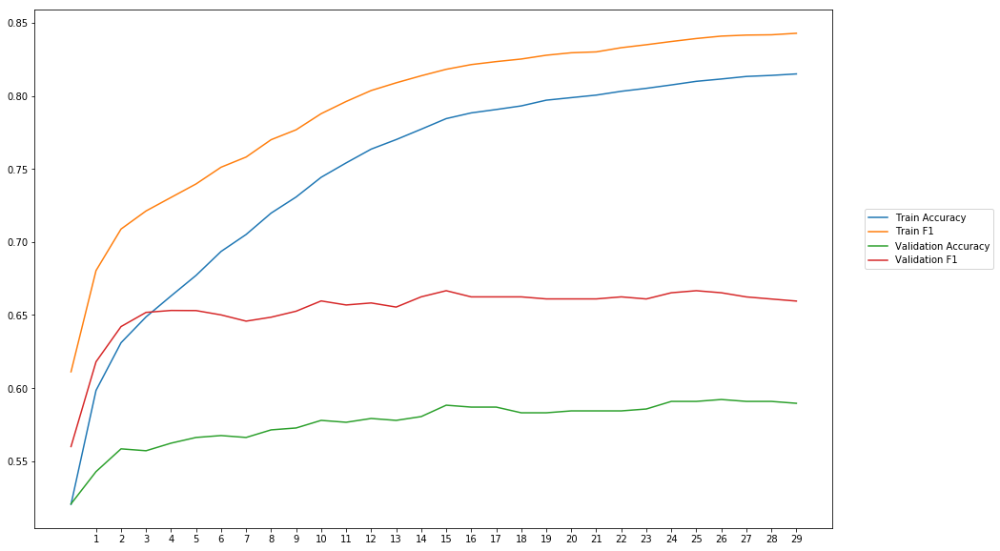

Average Accuracy: 57.64%
Average Precision: 54.86%
Average Recall: 80.92%
Average F1: 65.36%

-----Fold 2--------


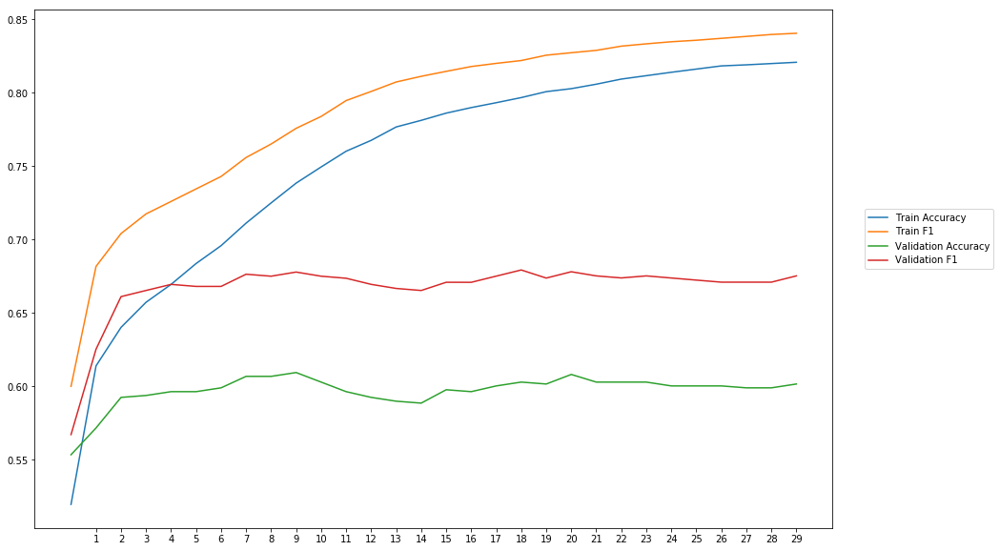

Average Accuracy: 59.70%
Average Precision: 56.06%
Average Recall: 82.50%
Average F1: 66.70%

-----Fold 3--------


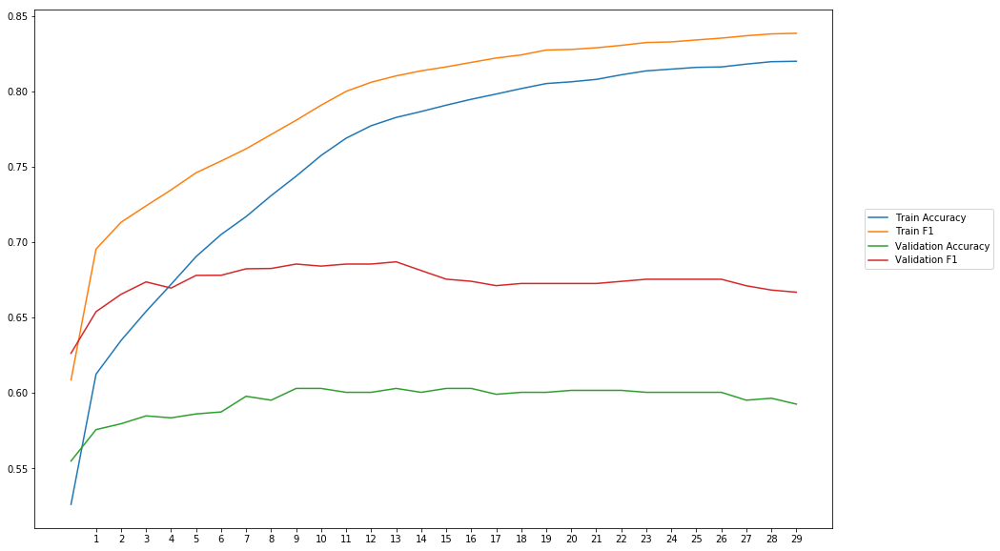

Average Accuracy: 59.49%
Average Precision: 57.12%
Average Recall: 82.13%
Average F1: 67.36%

-----Fold 4--------


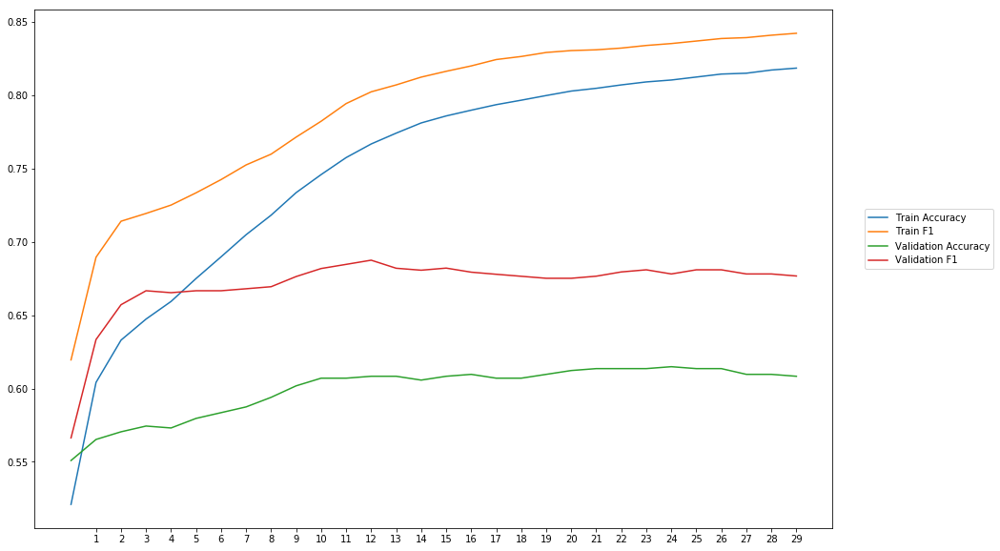

Average Accuracy: 59.94%
Average Precision: 56.24%
Average Recall: 83.39%
Average F1: 67.10%

-----Fold 5--------


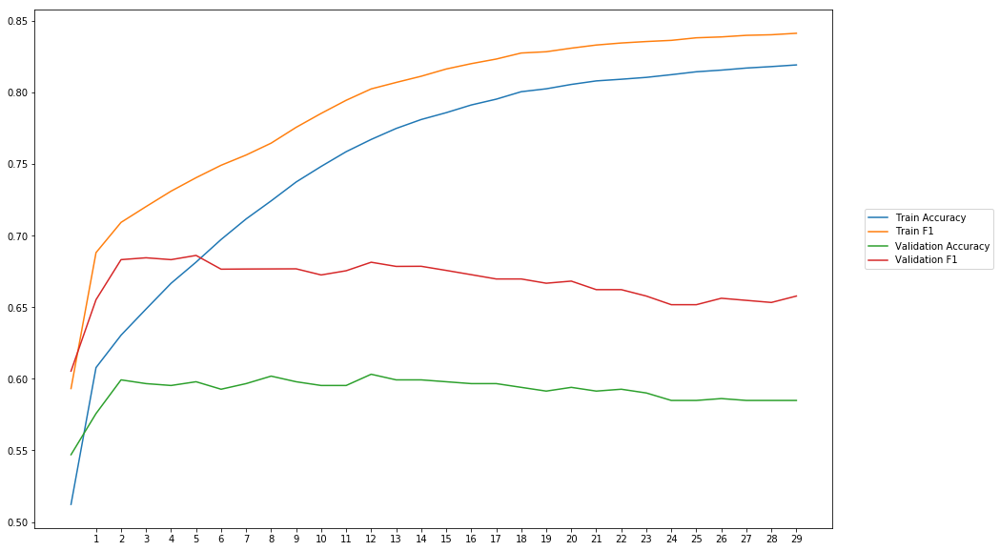

Average Accuracy: 59.16%
Average Precision: 57.47%
Average Recall: 79.70%
Average F1: 66.73%

-----Fold 6--------


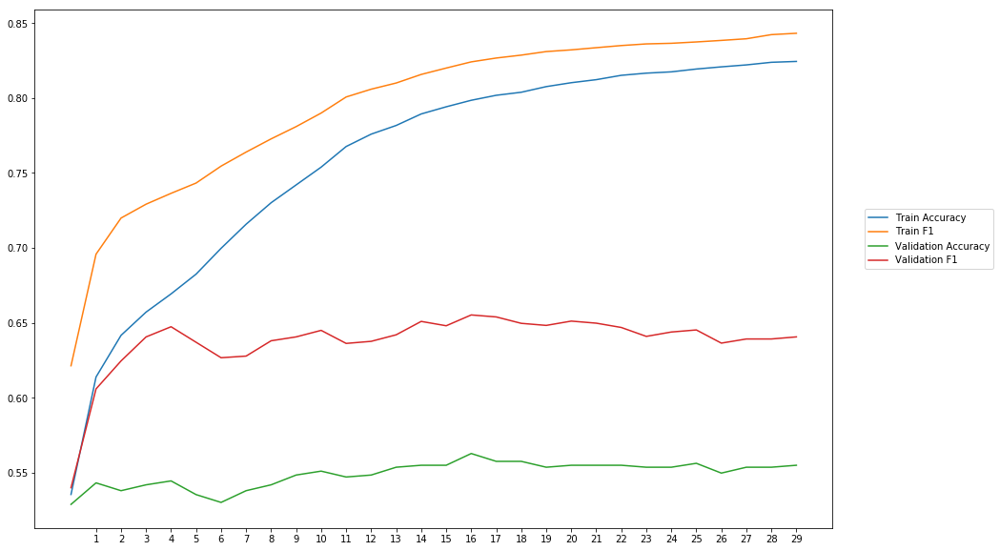

Average Accuracy: 54.90%
Average Precision: 54.34%
Average Recall: 77.28%
Average F1: 63.75%

-----Fold 7--------


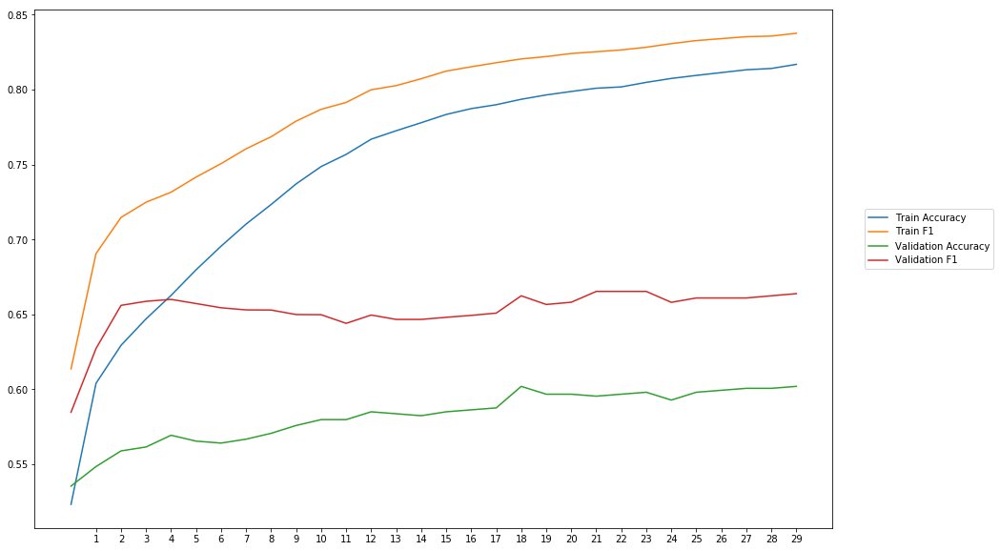

Average Accuracy: 58.20%
Average Precision: 55.19%
Average Recall: 79.97%
Average F1: 65.25%

-----Fold 8--------


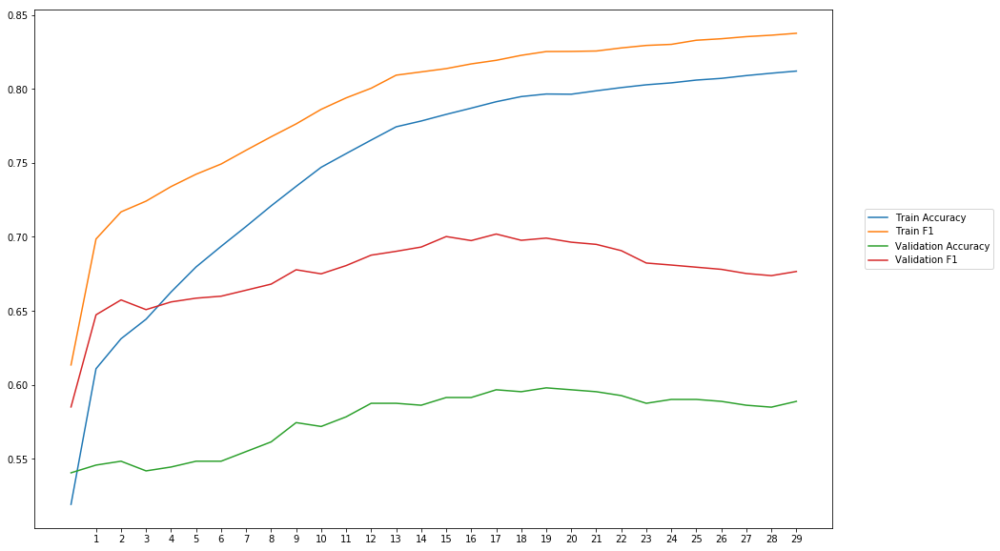

Average Accuracy: 57.64%
Average Precision: 56.50%
Average Recall: 84.29%
Average F1: 67.59%

-----Fold 9--------


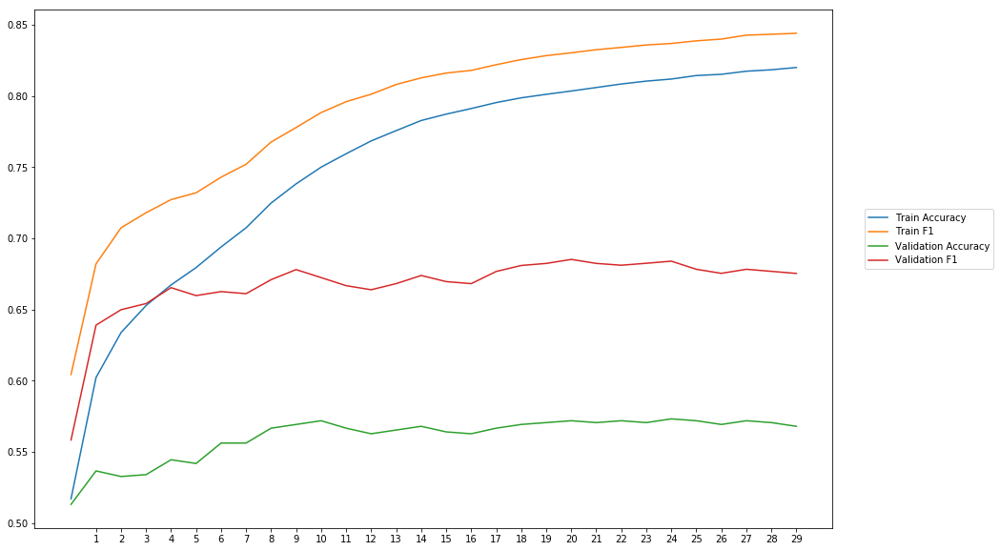

Average Accuracy: 56.09%
Average Precision: 56.48%
Average Recall: 81.62%
Average F1: 66.73%

-----Fold 10--------


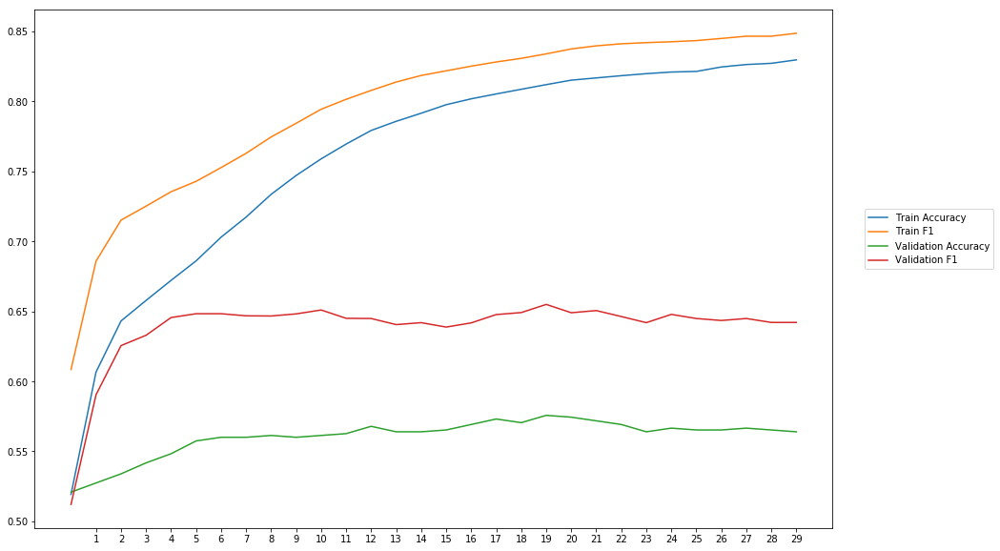

Average Accuracy: 56.06%
Average Precision: 54.81%
Average Recall: 76.67%
Average F1: 63.84%

-------Overallresults-------


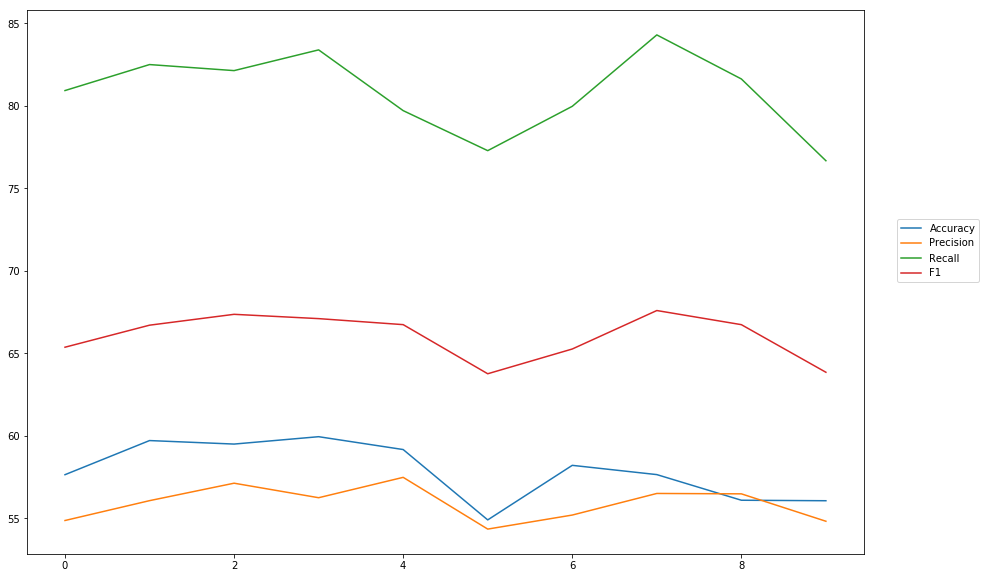

Accuracy: Mean = 57.88% (+/- 1.66%), Max = 59.94%, Min =  54.90%
Precision: Mean = 55.91% (+/- 1.00%), Max = 57.47%, Min =  54.34%
Recall: Mean = 80.85% (+/- 2.36%), Max = 84.29%, Min =  76.67%
F1: Mean = 66.04% (+/- 1.33%), Max = 67.59%, Min =  63.75%


In [18]:
cross_val_two_inputs(model_4, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_labels, softmax, outputpath, 'combined_outputs_max')

### minimum

In [19]:
#First model
wv_layer_5 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_5 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_5 = wv_layer_5(comment_input_5)
x_first_3 = Dense(600, activation='relu')(embedded_sequences_5)
x_first_3 = Flatten()(x_first_3)
first_preds_3 = Dense(2, activation='softmax')(x_first_3)

#Second model
pos_input_5 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_3 = Dense(600, activation='relu')(pos_input_5)
second_preds_3 = Dense(2, activation='softmax')(x_second_3)

#Concat outputs
preds_5 = minimum([first_preds_3, second_preds_3])

model_5 = Model(inputs=[comment_input_5, pos_input_5], outputs=preds_5)
model_5.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_5 (Embedding)         (None, 40, 300)      4118700     input_9[0][0]                    
__________________________________________________________________________________________________
dense_17 (Dense)                (None, 40, 600)      180600      embedding_5[0][0]                
__________________________________________________________________________________________________
input_10 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_4 


-----Fold 1--------


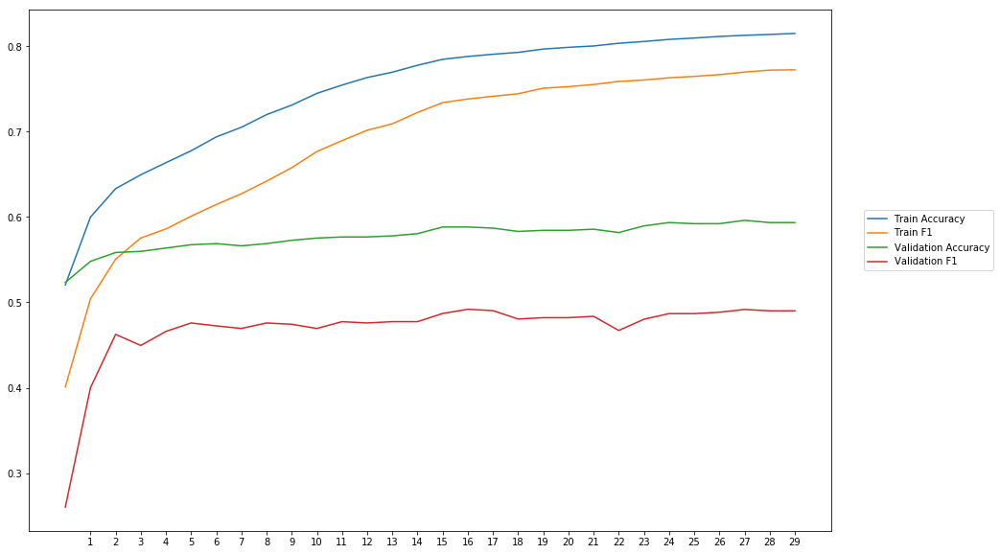

Average Accuracy: 57.73%
Average Precision: 63.55%
Average Recall: 37.31%
Average F1: 46.88%

-----Fold 2--------


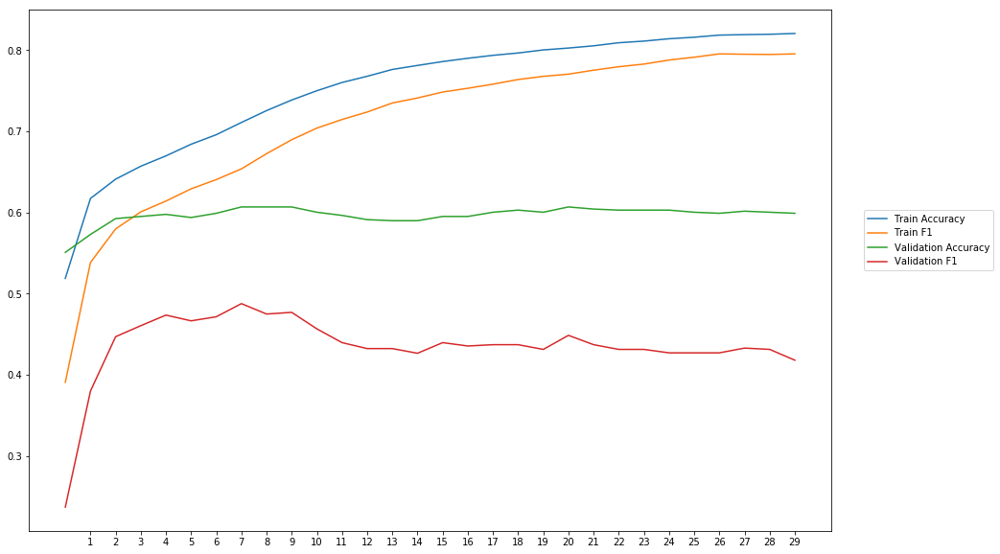

Average Accuracy: 59.67%
Average Precision: 73.92%
Average Recall: 30.98%
Average F1: 43.51%

-----Fold 3--------


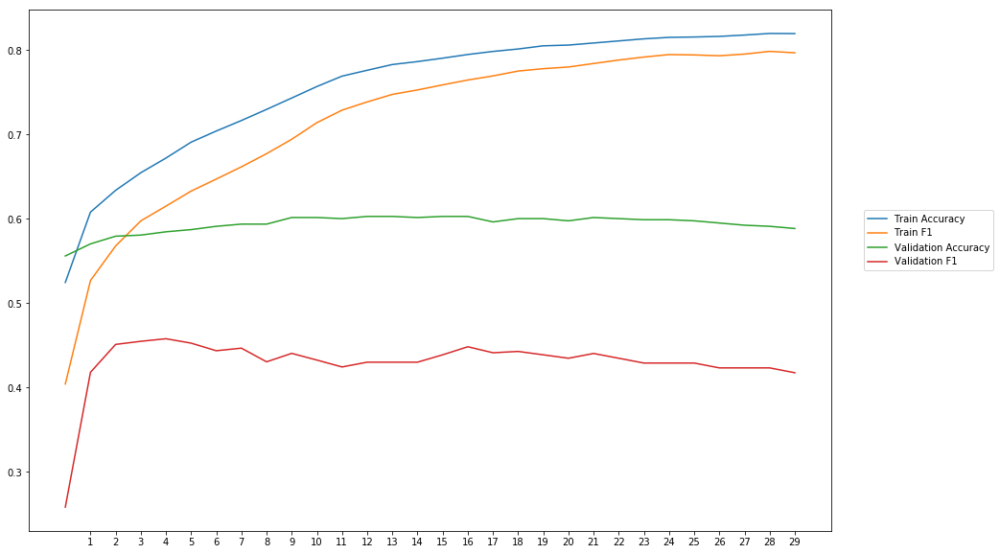

Average Accuracy: 59.38%
Average Precision: 67.63%
Average Recall: 31.66%
Average F1: 42.99%

-----Fold 4--------


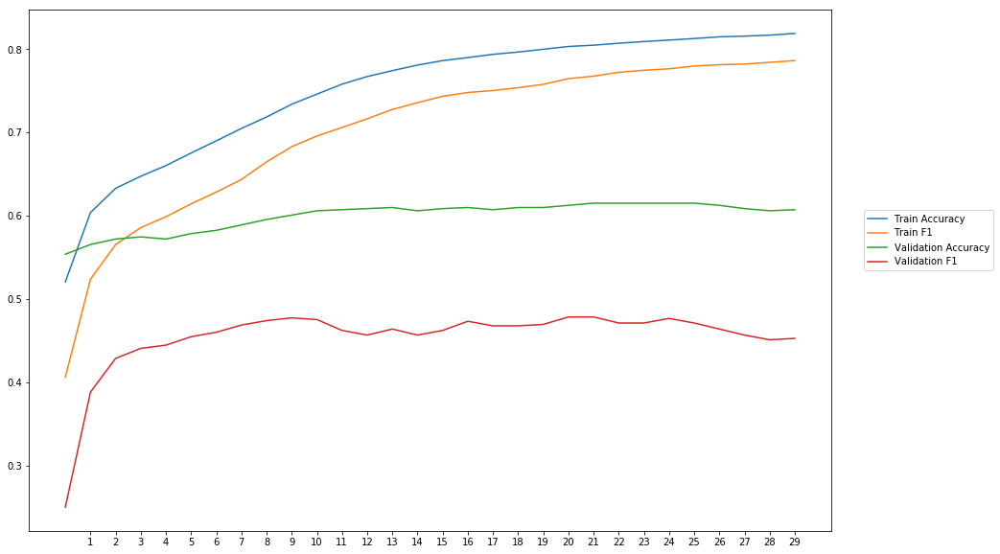

Average Accuracy: 59.94%
Average Precision: 73.14%
Average Recall: 33.02%
Average F1: 45.36%

-----Fold 5--------


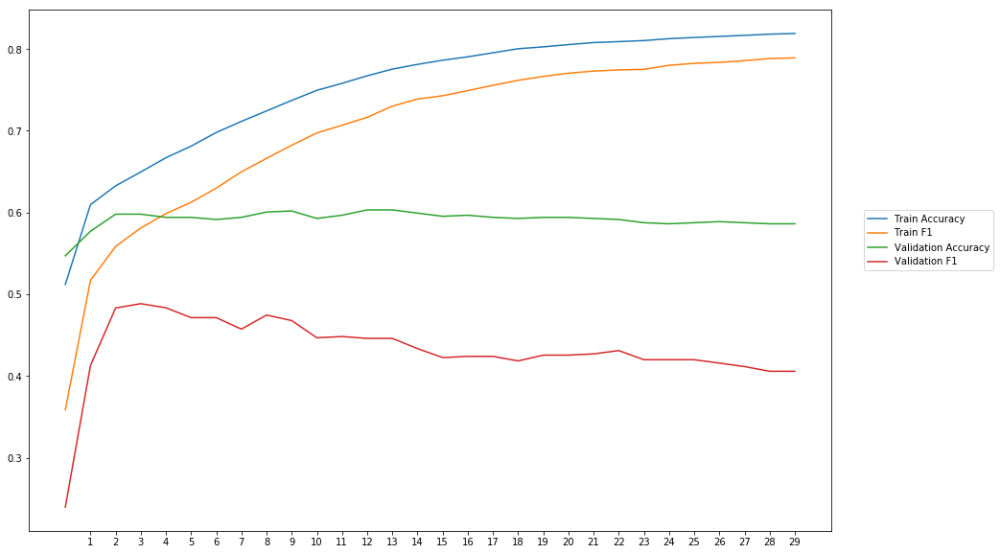

Average Accuracy: 59.17%
Average Precision: 65.54%
Average Recall: 32.39%
Average F1: 43.23%

-----Fold 6--------


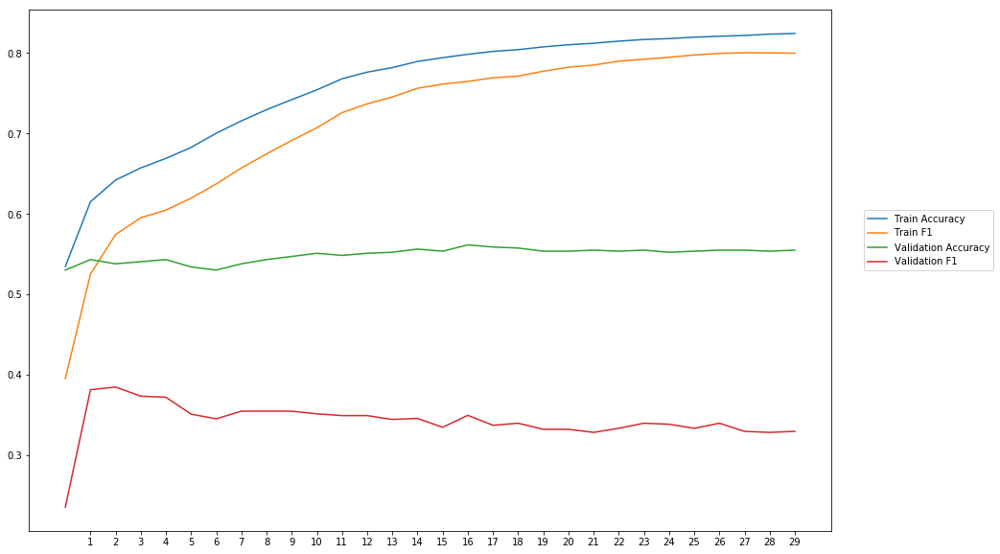

Average Accuracy: 54.90%
Average Precision: 58.36%
Average Recall: 24.35%
Average F1: 34.23%

-----Fold 7--------


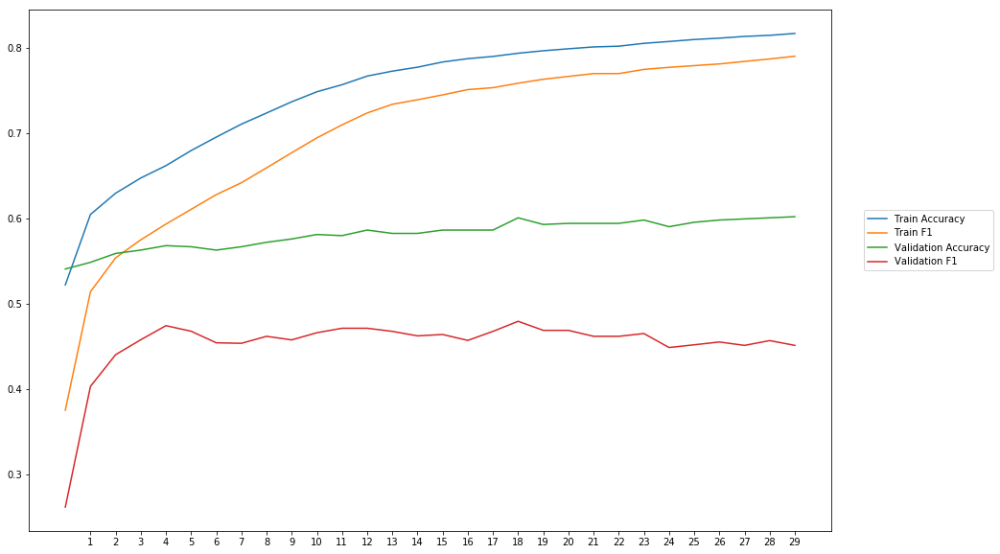

Average Accuracy: 58.16%
Average Precision: 67.34%
Average Recall: 34.24%
Average F1: 45.24%

-----Fold 8--------


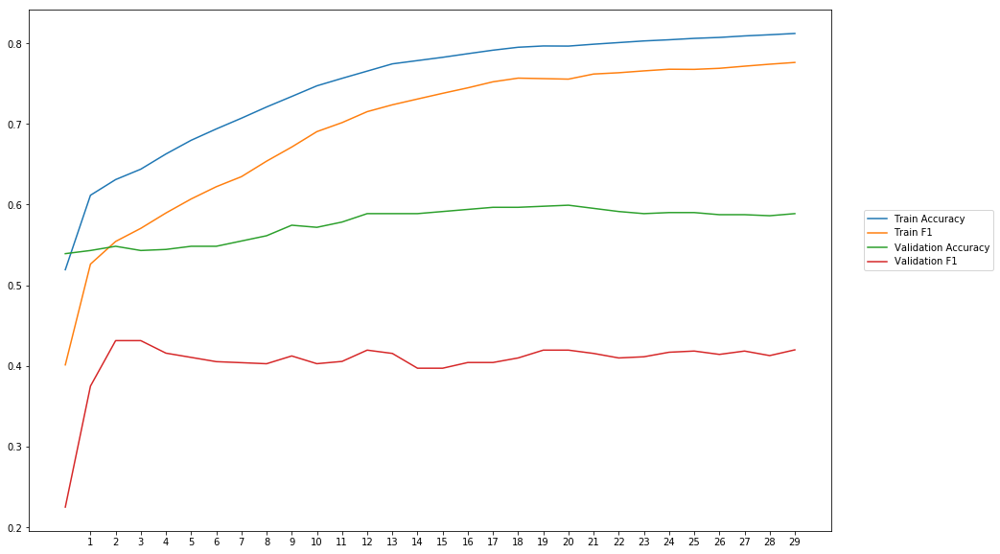

Average Accuracy: 57.68%
Average Precision: 61.06%
Average Recall: 30.44%
Average F1: 40.49%

-----Fold 9--------


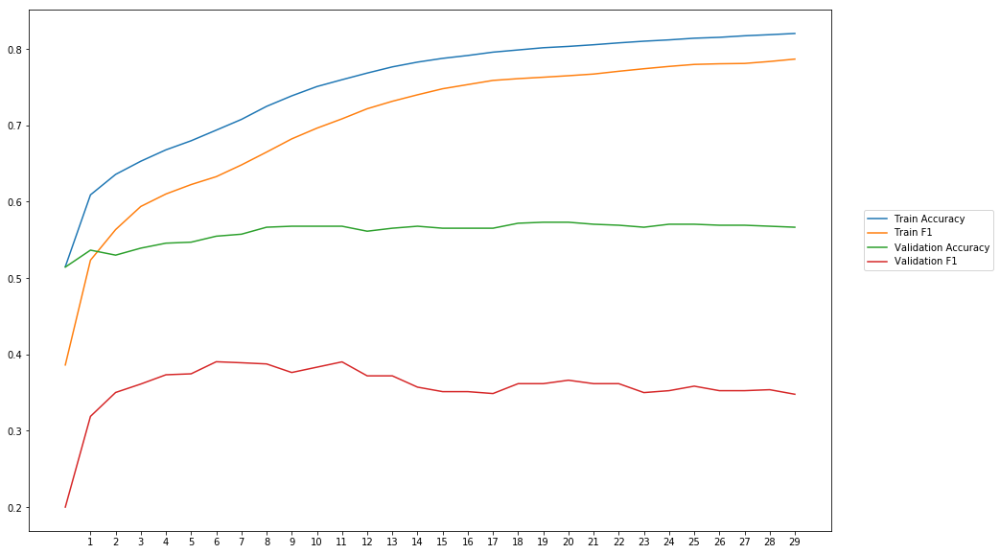

Average Accuracy: 56.08%
Average Precision: 55.12%
Average Recall: 26.58%
Average F1: 35.76%

-----Fold 10--------


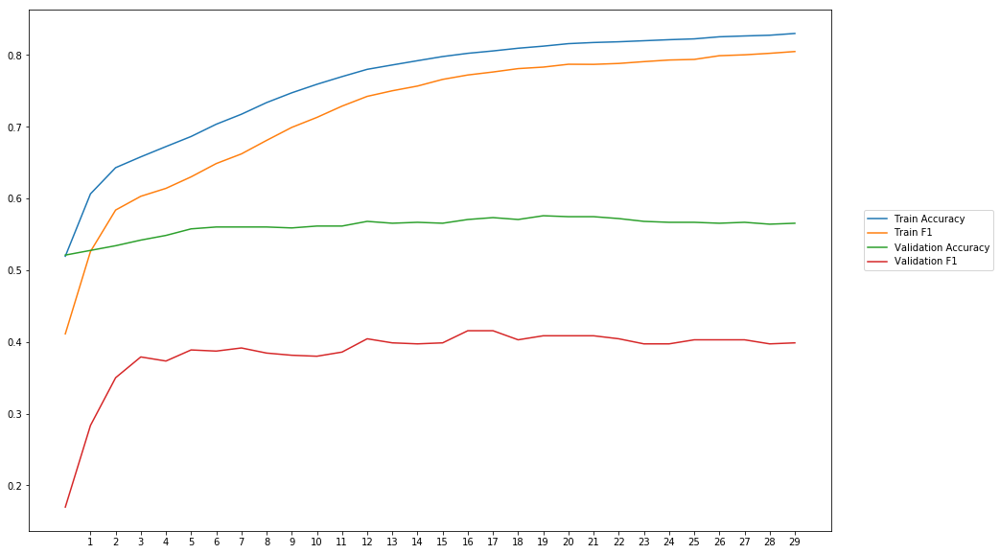

Average Accuracy: 56.10%
Average Precision: 60.94%
Average Recall: 28.18%
Average F1: 38.38%

-------Overallresults-------


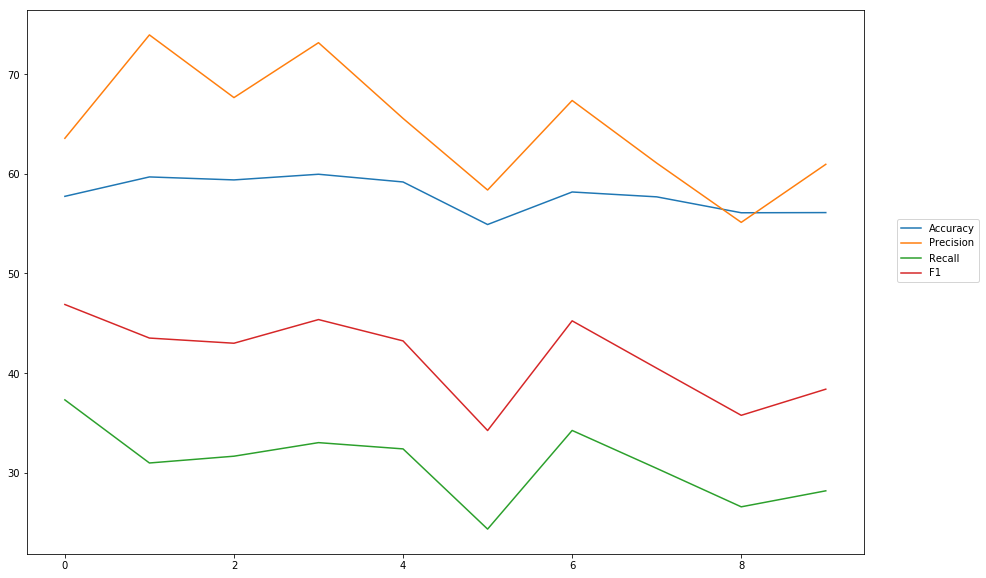

Accuracy: Mean = 57.88% (+/- 1.64%), Max = 59.94%, Min =  54.90%
Precision: Mean = 64.66% (+/- 5.77%), Max = 73.92%, Min =  55.12%
Recall: Mean = 30.91% (+/- 3.59%), Max = 37.31%, Min =  24.35%
F1: Mean = 41.61% (+/- 4.04%), Max = 46.88%, Min =  34.23%


In [20]:
cross_val_two_inputs(model_5, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_labels, softmax, outputpath, 'combined_outputs_min')

### add

In [22]:
#First model
wv_layer_6 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_6 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_6 = wv_layer_6(comment_input_6)
x_first_4 = Dense(600, activation='relu')(embedded_sequences_6)
x_first_4 = Flatten()(x_first_4)
first_preds_4 = Dense(2, activation='softmax')(x_first_4)

#Second model
pos_input_6 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_4 = Dense(600, activation='relu')(pos_input_6)
second_preds_4 = Dense(2, activation='softmax')(x_second_4)

#Concat outputs
preds_6 = add([first_preds_4, second_preds_4])

model_6 = Model(inputs=[comment_input_6, pos_input_6], outputs=preds_6)
model_6.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_6 (Embedding)         (None, 40, 300)      4118700     input_11[0][0]                   
__________________________________________________________________________________________________
dense_21 (Dense)                (None, 40, 600)      180600      embedding_6[0][0]                
__________________________________________________________________________________________________
input_12 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_5 


-----Fold 1--------


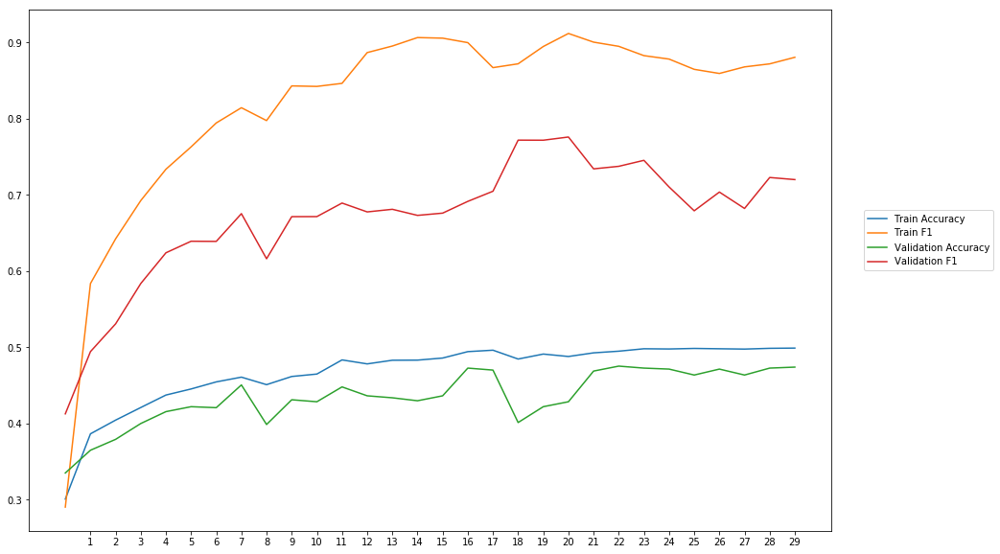

Average Accuracy: 43.53%
Average Precision: 57.02%
Average Recall: 87.88%
Average F1: 67.03%

-----Fold 2--------


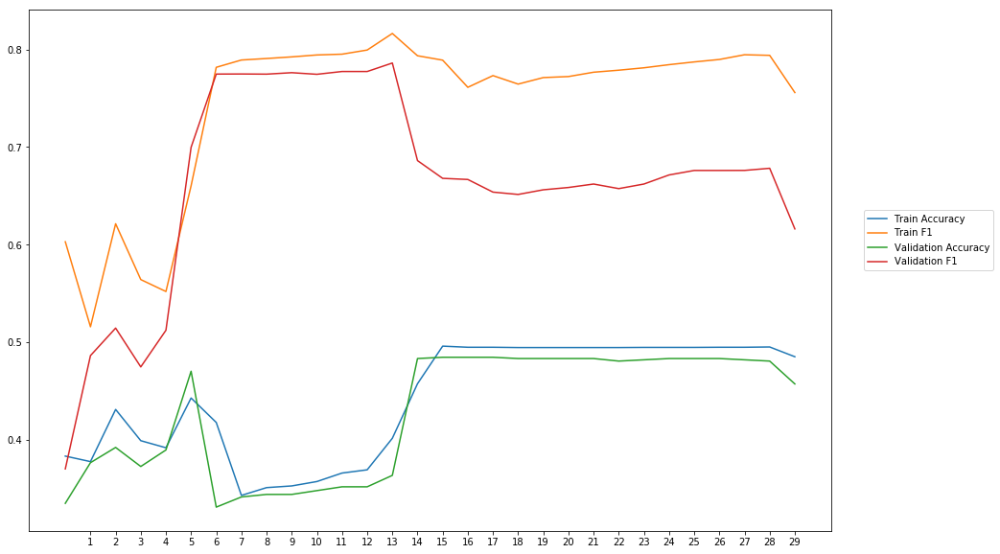

Average Accuracy: 42.69%
Average Precision: 49.49%
Average Recall: 109.04%
Average F1: 66.29%

-----Fold 3--------


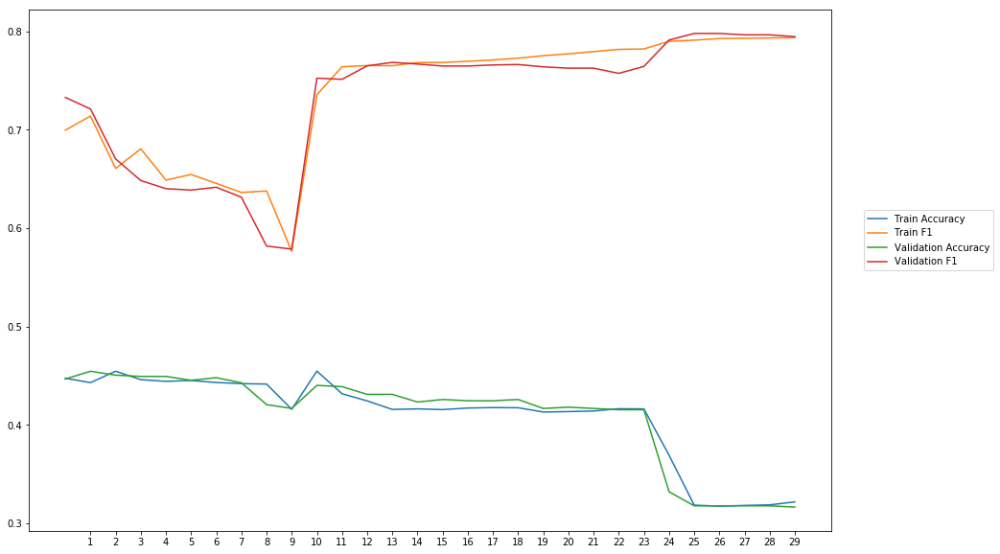

Average Accuracy: 40.96%
Average Precision: 51.88%
Average Recall: 130.91%
Average F1: 73.11%

-----Fold 4--------


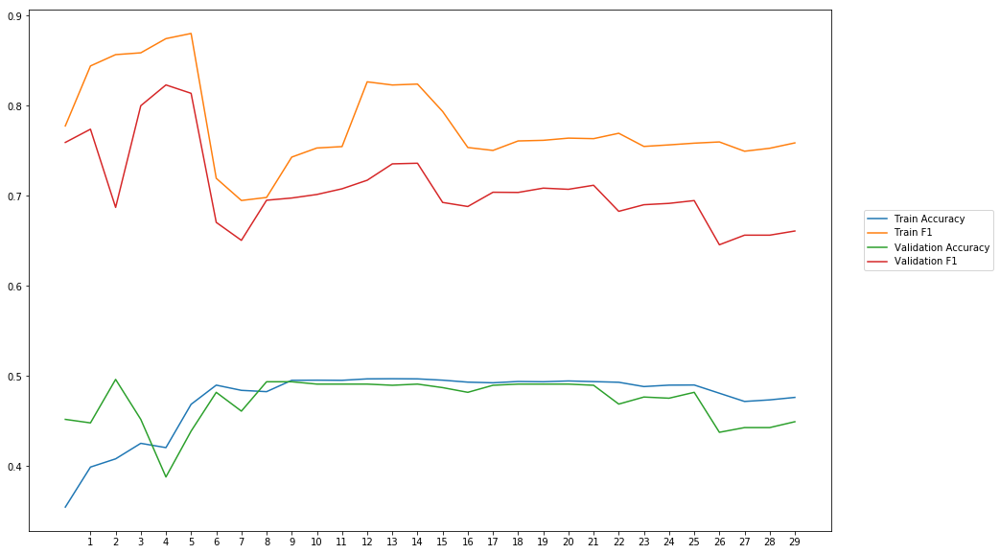

Average Accuracy: 47.17%
Average Precision: 54.31%
Average Recall: 105.13%
Average F1: 70.87%

-----Fold 5--------


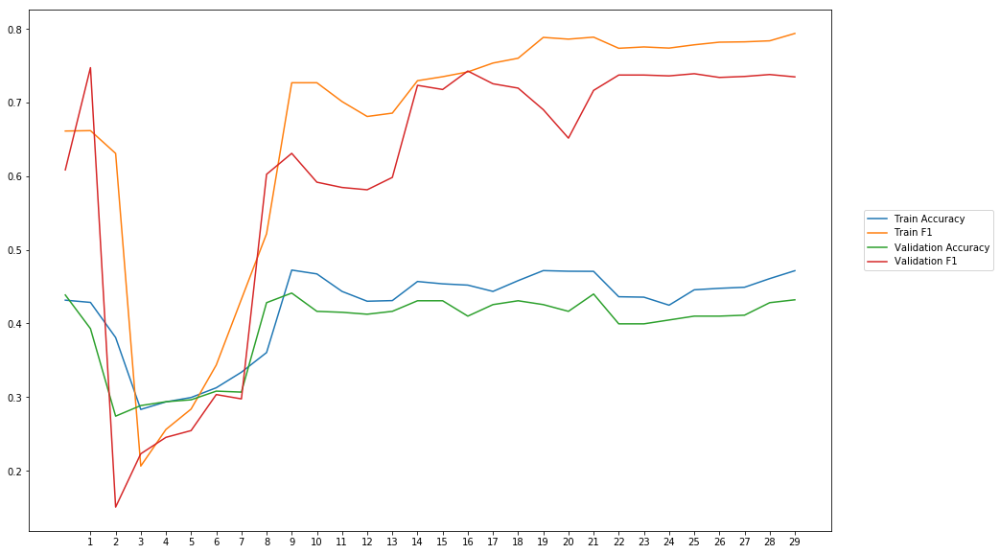

Average Accuracy: 39.45%
Average Precision: 48.85%
Average Recall: 93.68%
Average F1: 60.00%

-----Fold 6--------


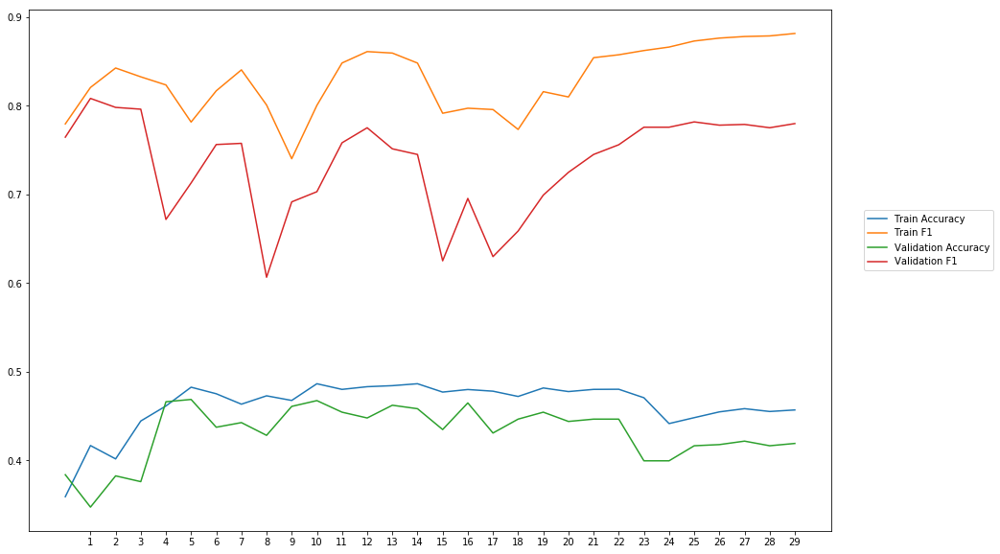

Average Accuracy: 43.14%
Average Precision: 53.70%
Average Recall: 121.31%
Average F1: 73.57%

-----Fold 7--------


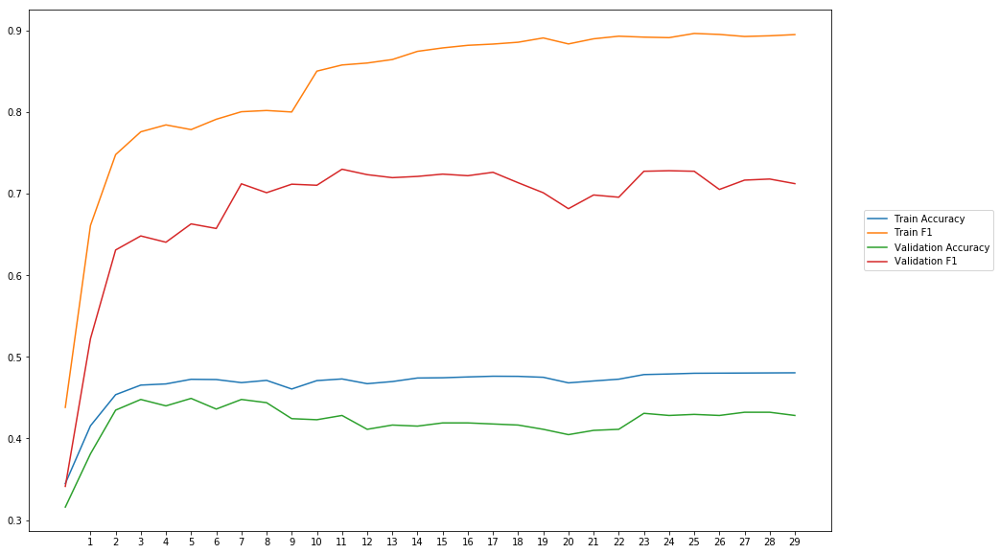

Average Accuracy: 42.11%
Average Precision: 54.28%
Average Recall: 95.48%
Average F1: 68.42%

-----Fold 8--------


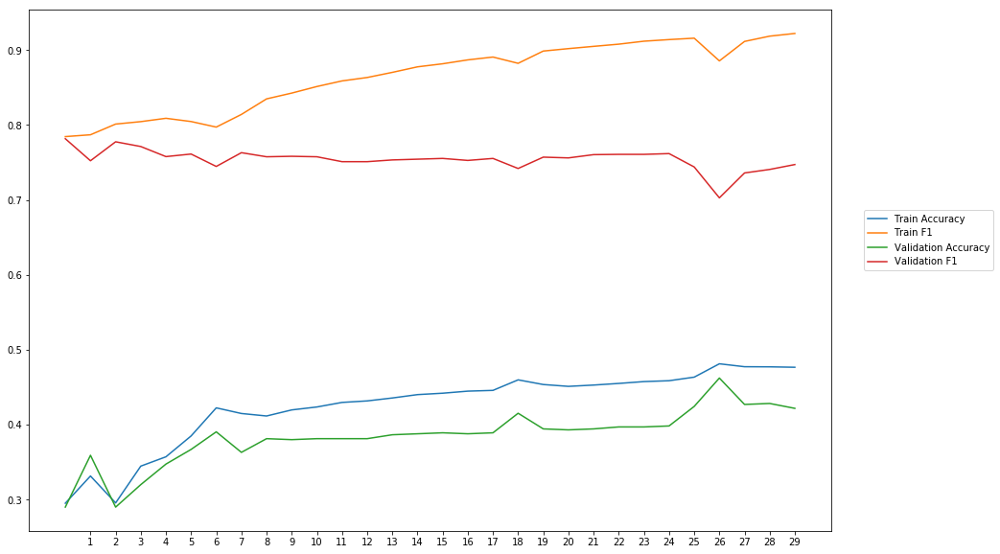

Average Accuracy: 38.41%
Average Precision: 50.52%
Average Recall: 149.60%
Average F1: 75.41%

-----Fold 9--------


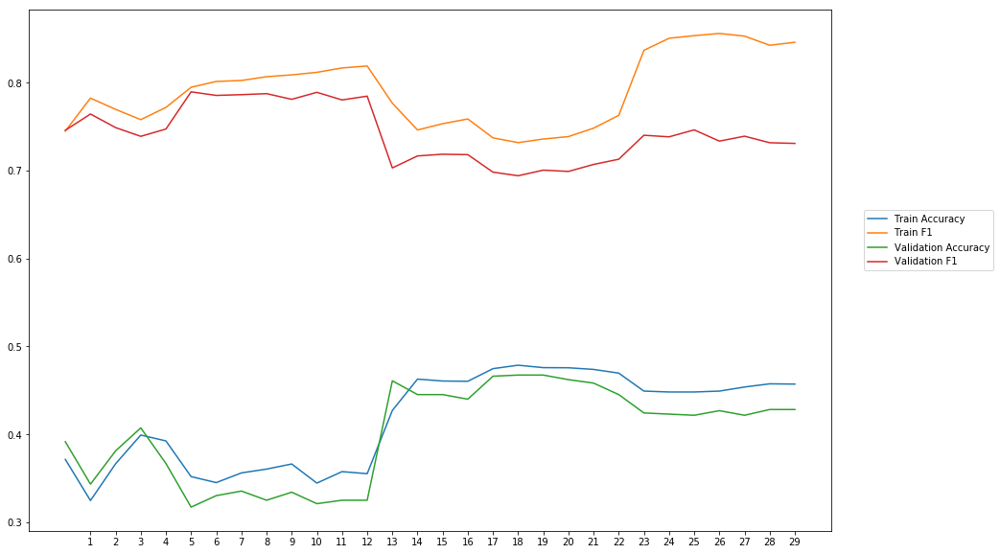

Average Accuracy: 40.12%
Average Precision: 50.57%
Average Recall: 141.76%
Average F1: 74.17%

-----Fold 10--------


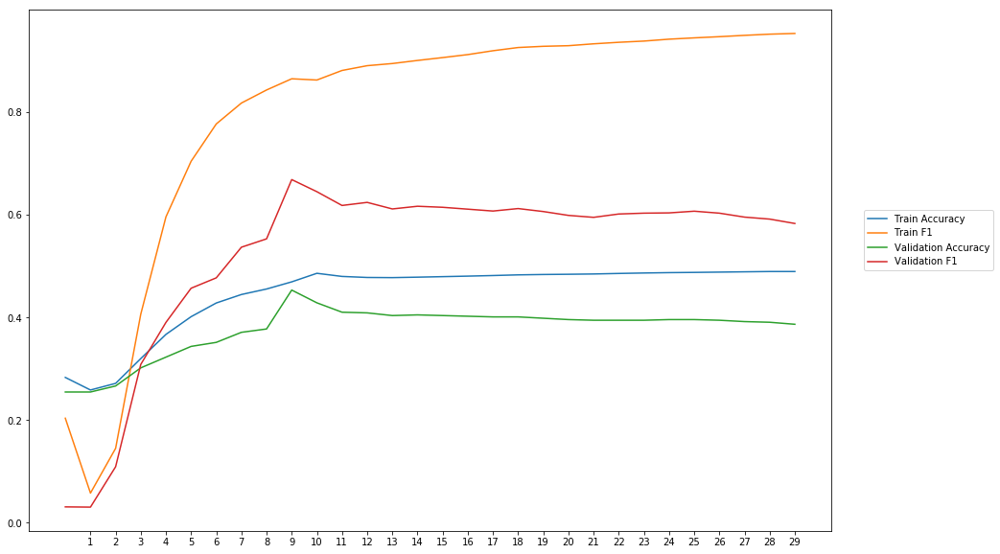

Average Accuracy: 37.62%
Average Precision: 61.59%
Average Recall: 50.37%
Average F1: 52.33%

-------Overallresults-------


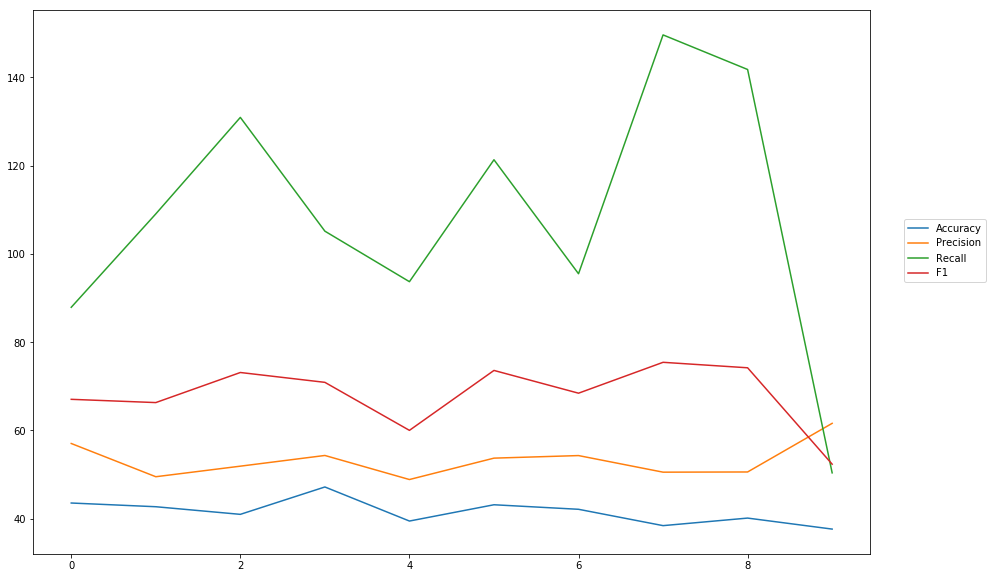

Accuracy: Mean = 41.52% (+/- 2.68%), Max = 47.17%, Min =  37.62%
Precision: Mean = 53.22% (+/- 3.69%), Max = 61.59%, Min =  48.85%
Recall: Mean = 108.52% (+/- 27.69%), Max = 149.60%, Min =  50.37%
F1: Mean = 68.12% (+/- 6.87%), Max = 75.41%, Min =  52.33%


In [23]:
cross_val_two_inputs(model_6, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_labels, softmax, outputpath, 'combined_outputs_add')

## Combine Outputs + another dense layer

In [25]:
#First model
wv_layer_7 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_7 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_7 = wv_layer_7(comment_input_7)
x_first_5 = Dense(600, activation='relu')(embedded_sequences_7)
x_first_5 = Flatten()(x_first_5)
first_preds_5 = Dense(2, activation='softmax')(x_first_5)

#Second model
pos_input_7 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_5 = Dense(600, activation='relu')(pos_input_7)
second_preds_5 = Dense(2, activation='softmax')(x_second_5)

#Concat outputs
preds_7 = concatenate([first_preds_5, second_preds_5])

preds_7 = Dense(2, activation='softmax')(preds_7)

model_7 = Model(inputs=[comment_input_7, pos_input_7], outputs=preds_7)
model_7.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_15 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_8 (Embedding)         (None, 40, 300)      4118700     input_15[0][0]                   
__________________________________________________________________________________________________
dense_30 (Dense)                (None, 40, 600)      180600      embedding_8[0][0]                
__________________________________________________________________________________________________
input_16 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_7 


-----Fold 1--------


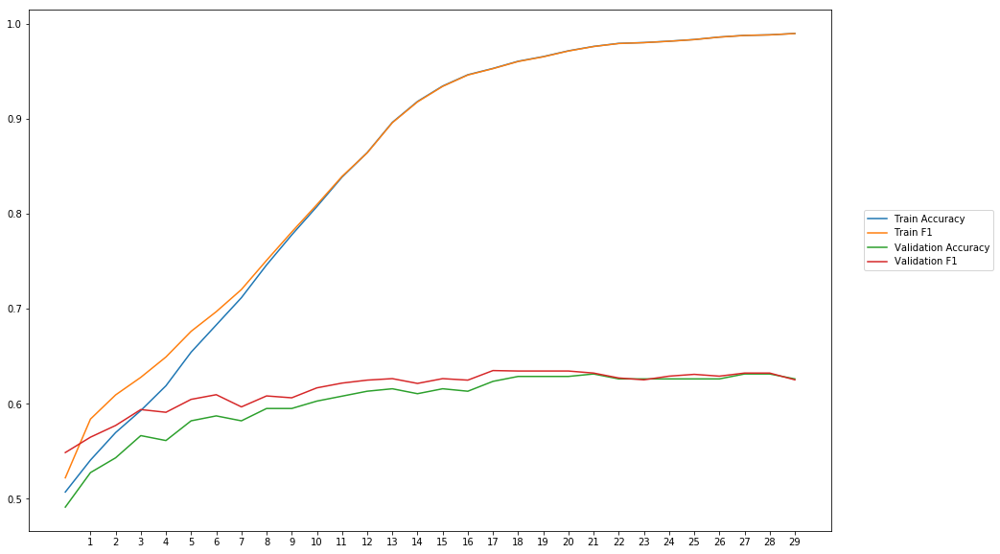

Average Accuracy: 60.22%
Average Precision: 59.63%
Average Recall: 63.65%
Average F1: 61.53%

-----Fold 2--------


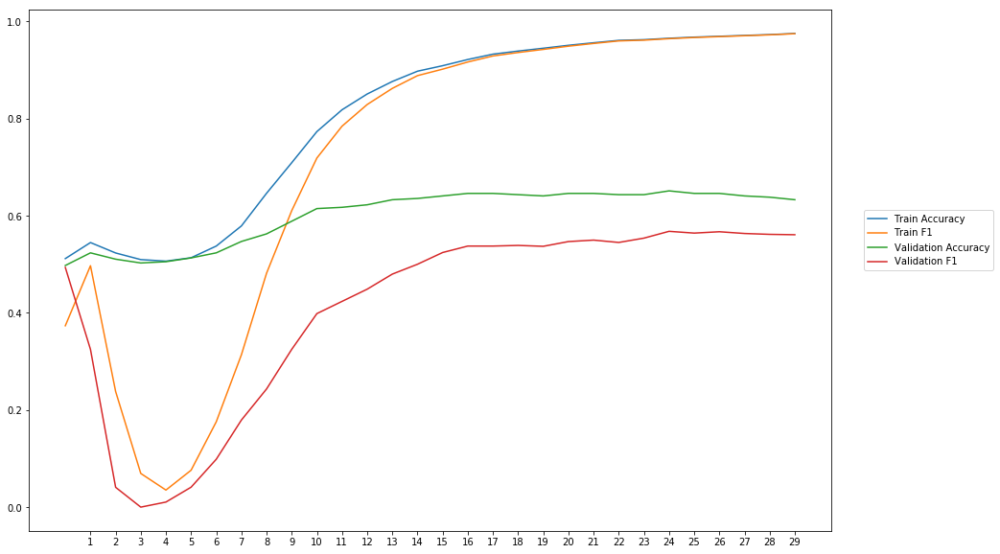

Average Accuracy: 60.15%
Average Precision: 75.25%
Average Recall: 31.36%
Average F1: 40.87%

-----Fold 3--------


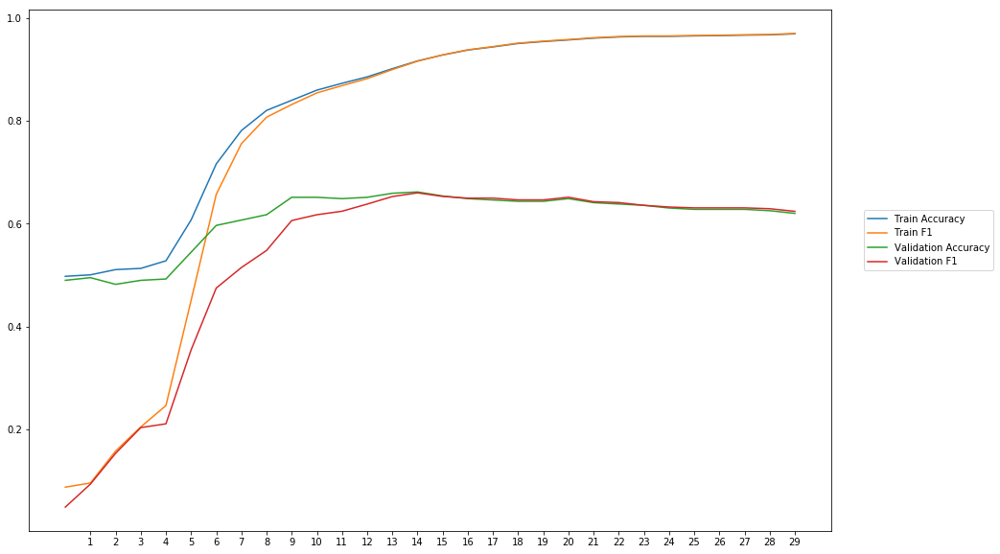

Average Accuracy: 60.96%
Average Precision: 60.66%
Average Recall: 50.86%
Average F1: 53.29%

-----Fold 4--------


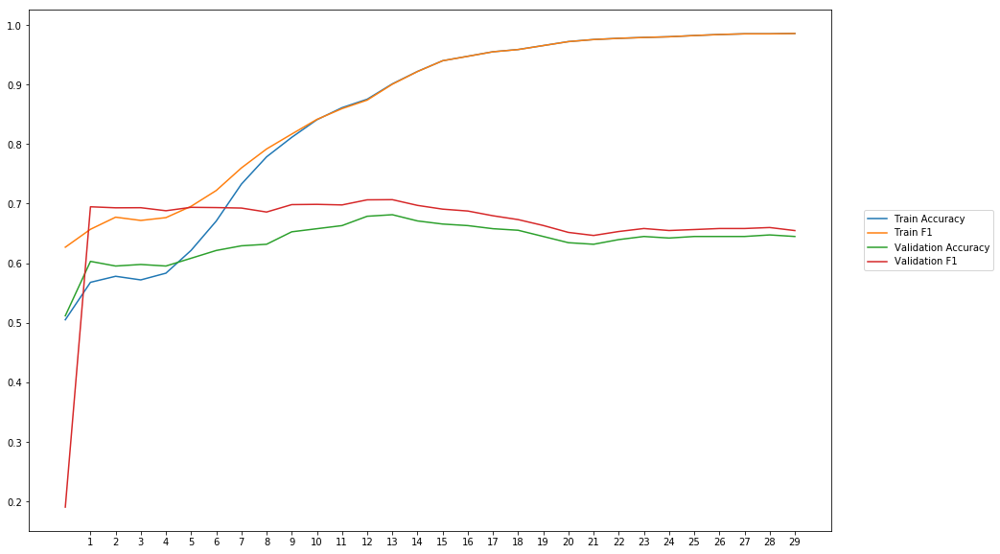

Average Accuracy: 63.69%
Average Precision: 61.45%
Average Recall: 74.26%
Average F1: 66.26%

-----Fold 5--------


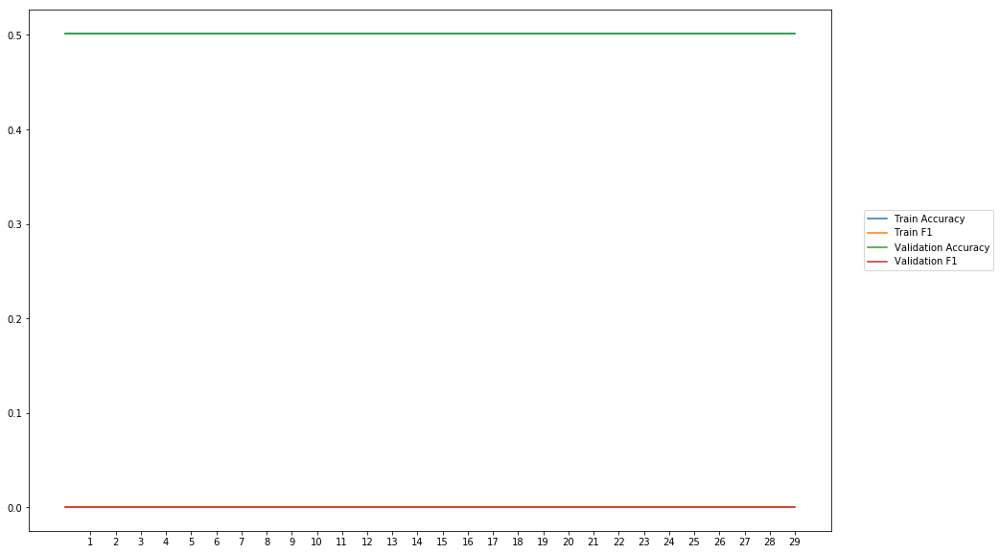

Average Accuracy: 50.13%
Average Precision: 0.00%
Average Recall: 0.00%
Average F1: 0.00%

-----Fold 6--------


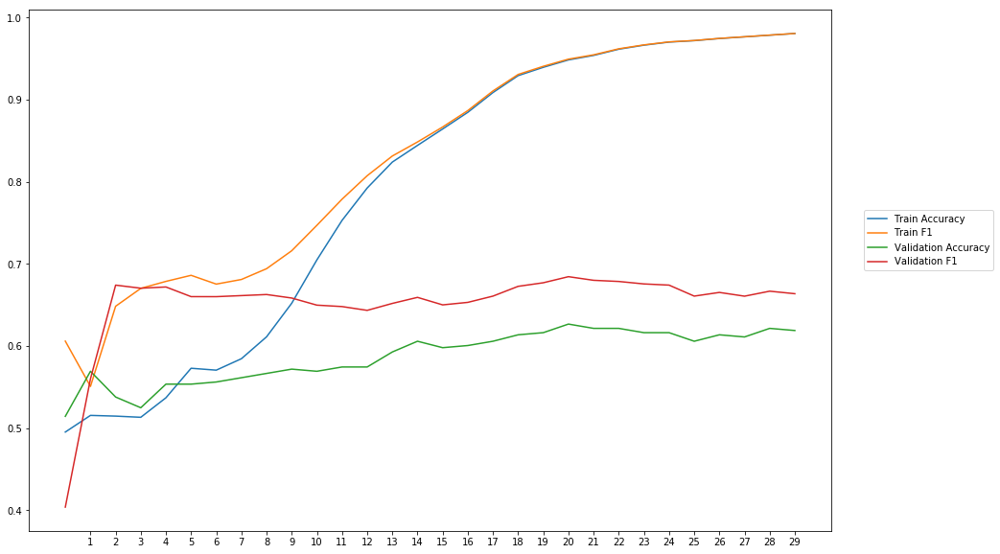

Average Accuracy: 58.77%
Average Precision: 56.37%
Average Recall: 78.60%
Average F1: 65.19%

-----Fold 7--------


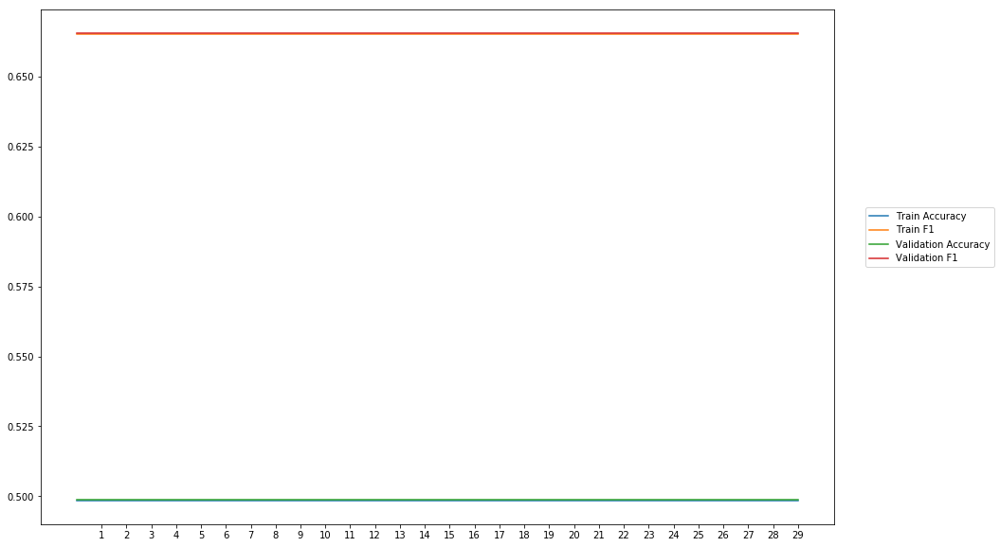

Average Accuracy: 49.87%
Average Precision: 49.87%
Average Recall: 100.00%
Average F1: 66.55%

-----Fold 8--------


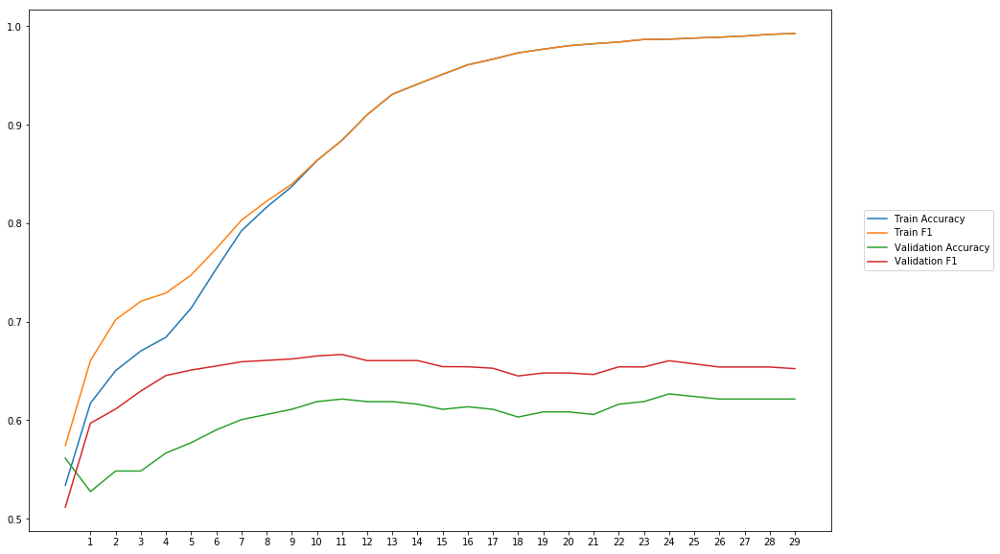

Average Accuracy: 60.21%
Average Precision: 58.13%
Average Recall: 73.09%
Average F1: 64.61%

-----Fold 9--------


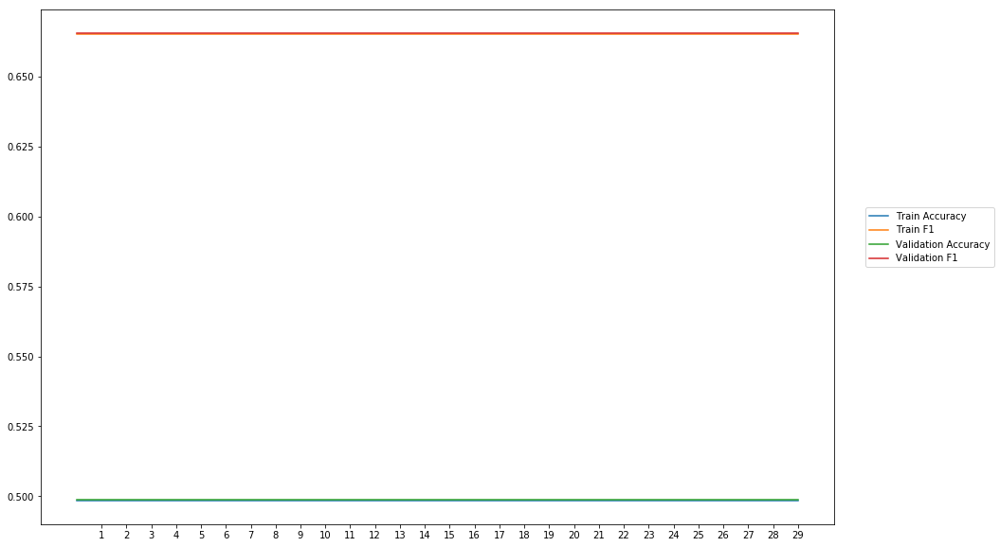

Average Accuracy: 49.87%
Average Precision: 49.87%
Average Recall: 100.00%
Average F1: 66.55%

-----Fold 10--------


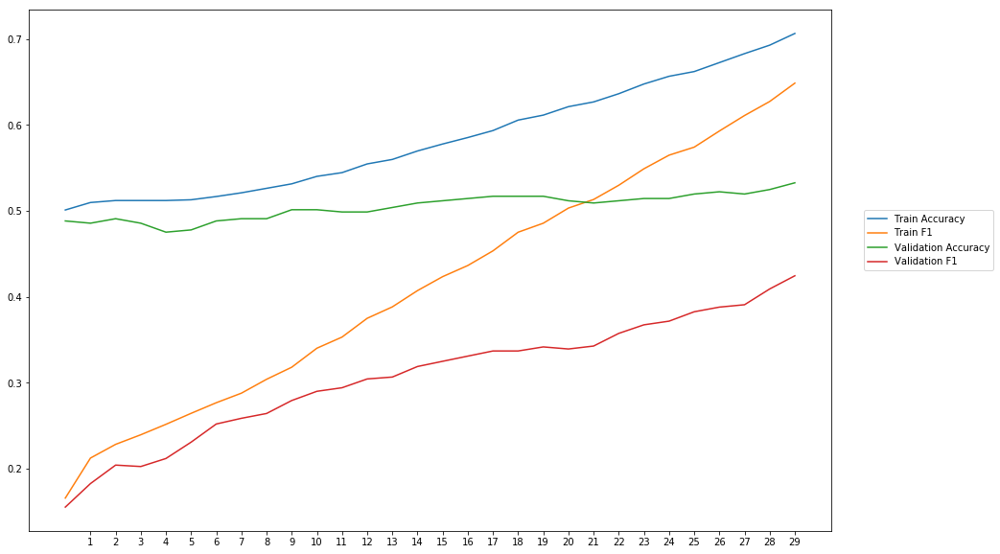

Average Accuracy: 50.48%
Average Precision: 50.05%
Average Recall: 22.46%
Average F1: 30.66%

-------Overallresults-------


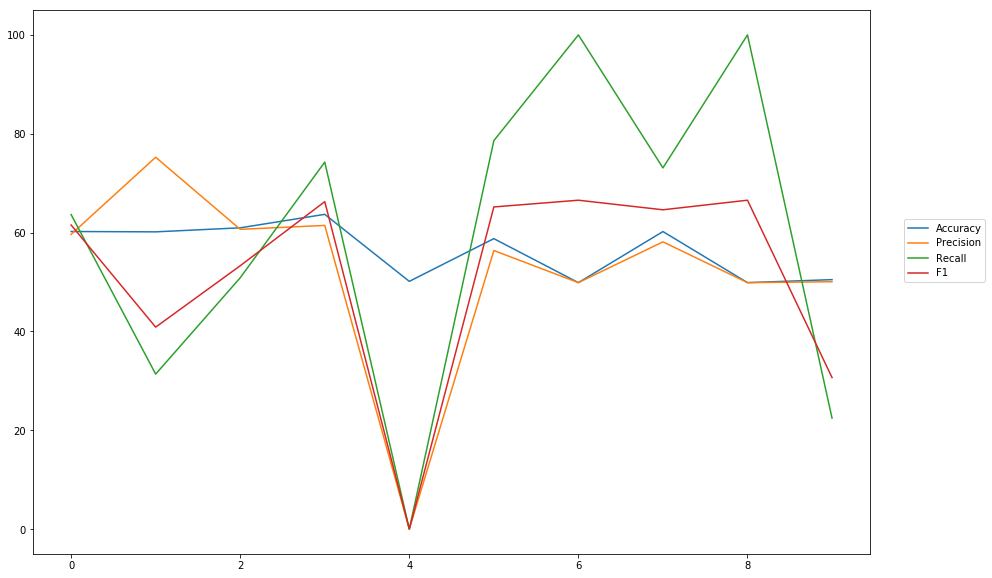

Accuracy: Mean = 56.43% (+/- 5.31%), Max = 63.69%, Min =  49.87%
Precision: Mean = 52.13% (+/- 18.80%), Max = 75.25%, Min =  0.00%
Recall: Mean = 59.43% (+/- 31.37%), Max = 100.00%, Min =  0.00%
F1: Mean = 51.55% (+/- 20.82%), Max = 66.55%, Min =  0.00%


In [26]:
cross_val_two_inputs(model_7, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_labels, softmax, outputpath, 'combined_outputs_dense')

# Sentiment - BLOB

## Combine Inputs

In [15]:
#Input Words
wv_layer_8 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_8 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_8 = wv_layer_8(comment_input_8)
embedded_sequences_8 = Flatten()(embedded_sequences_8)

#Input POS
senti_input_8 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')

#Concat Inputs
concat_8 = concatenate([embedded_sequences_8, senti_input_8], axis=1)

x_8 = Dense(600, activation='relu')(concat_8)
preds_8 = Dense(2, activation='softmax')(x_8)

# build the model
model_8 = Model(inputs=[comment_input_8, senti_input_8], outputs=preds_8)
model_8.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_4 (Embedding)         (None, 40, 300)      4118700     input_7[0][0]                    
__________________________________________________________________________________________________
flatten_4 (Flatten)             (None, 12000)        0           embedding_4[0][0]                
__________________________________________________________________________________________________
input_8 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
concatenat

Instructions for updating:
Use tf.cast instead.

-----Fold 1--------


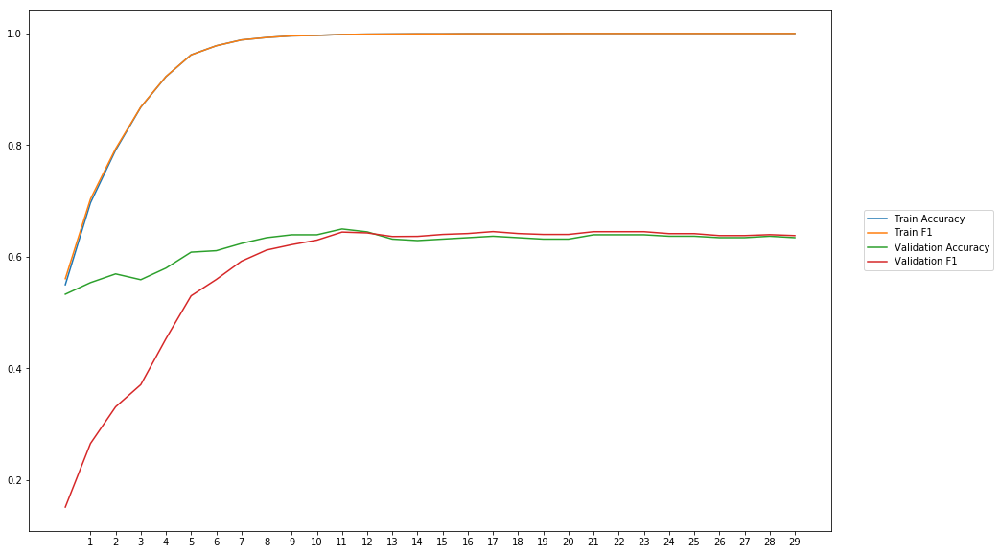

Average Accuracy: 62.08%
Average Precision: 64.76%
Average Recall: 55.69%
Average F1: 57.61%

-----Fold 2--------


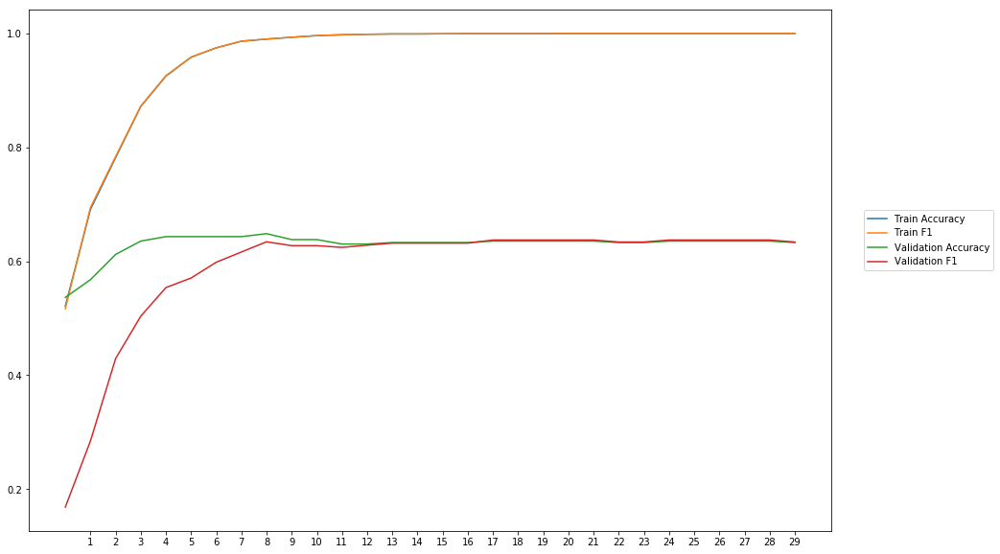

Average Accuracy: 62.98%
Average Precision: 66.24%
Average Recall: 56.46%
Average F1: 58.89%

-----Fold 3--------


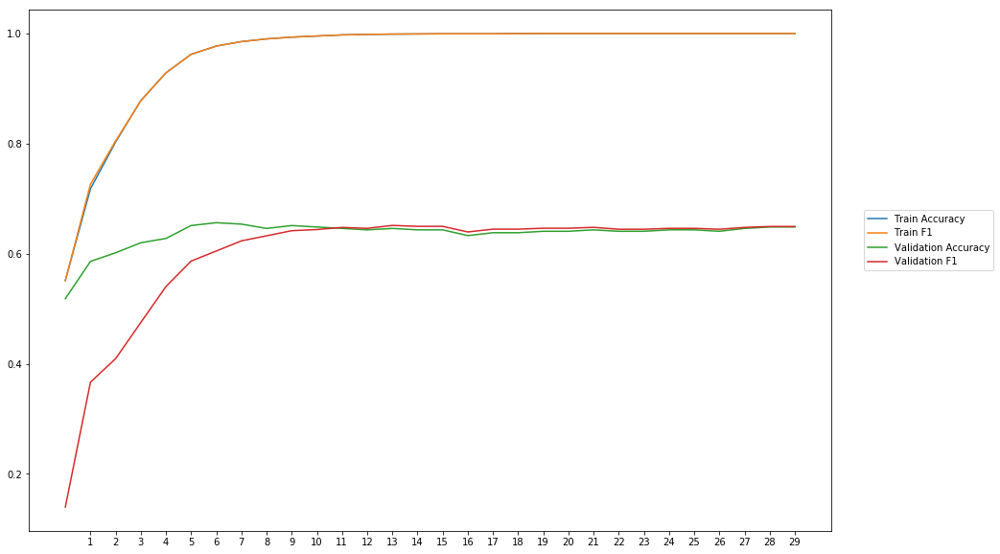

Average Accuracy: 63.55%
Average Precision: 65.90%
Average Recall: 57.85%
Average F1: 59.82%

-----Fold 4--------


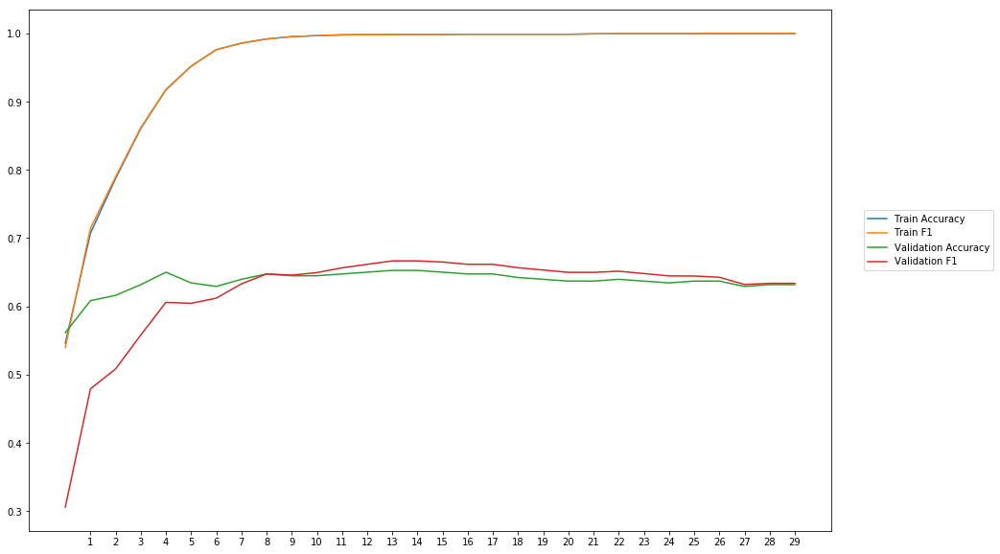

Average Accuracy: 63.64%
Average Precision: 64.65%
Average Recall: 61.59%
Average F1: 62.10%

-----Fold 5--------


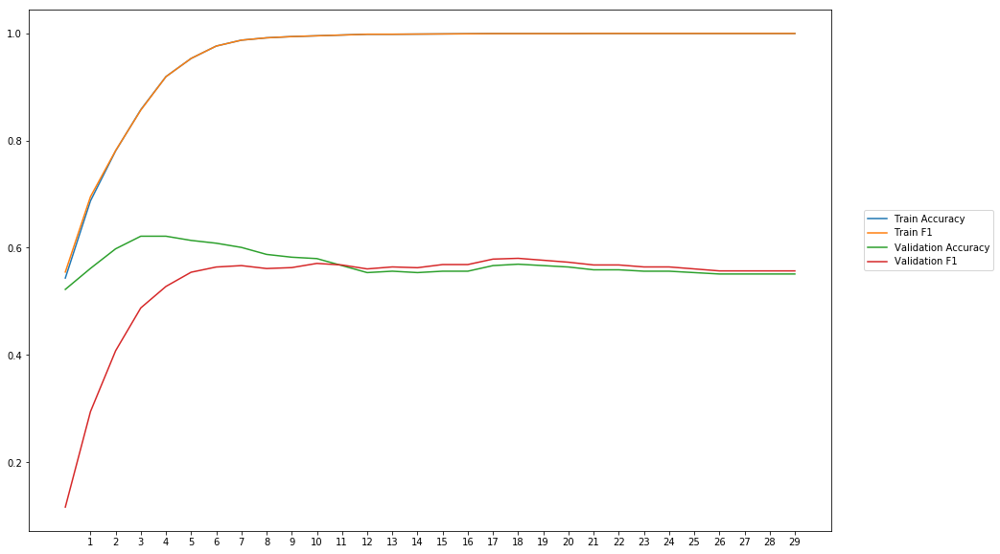

Average Accuracy: 56.97%
Average Precision: 59.70%
Average Recall: 51.45%
Average F1: 53.21%

-----Fold 6--------


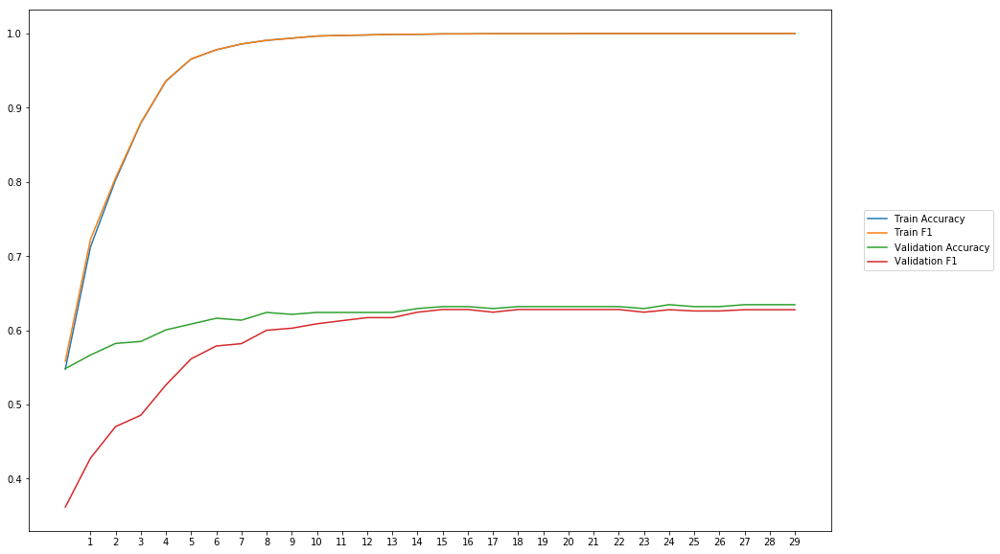

Average Accuracy: 61.91%
Average Precision: 63.32%
Average Recall: 56.07%
Average F1: 58.94%

-----Fold 7--------


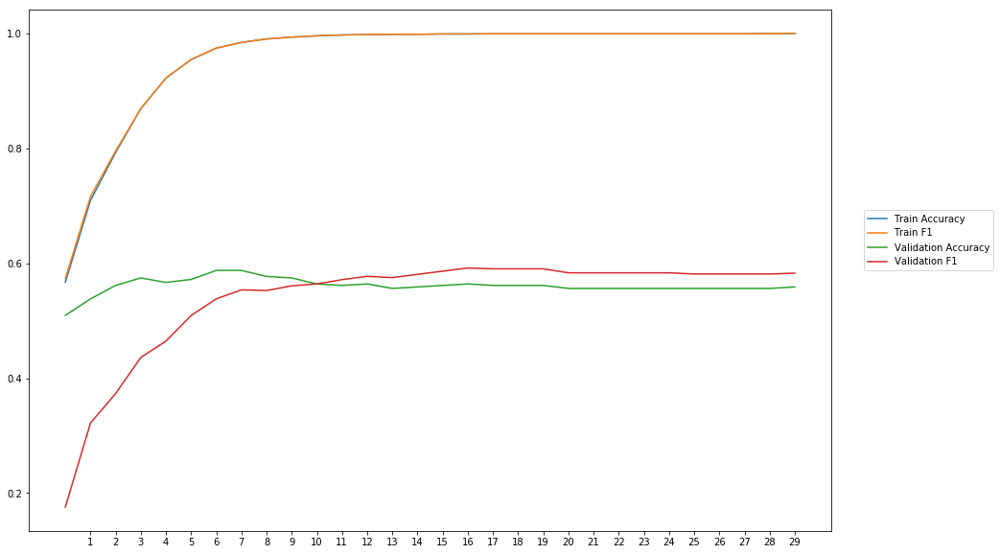

Average Accuracy: 56.08%
Average Precision: 56.80%
Average Recall: 53.75%
Average F1: 53.75%

-----Fold 8--------


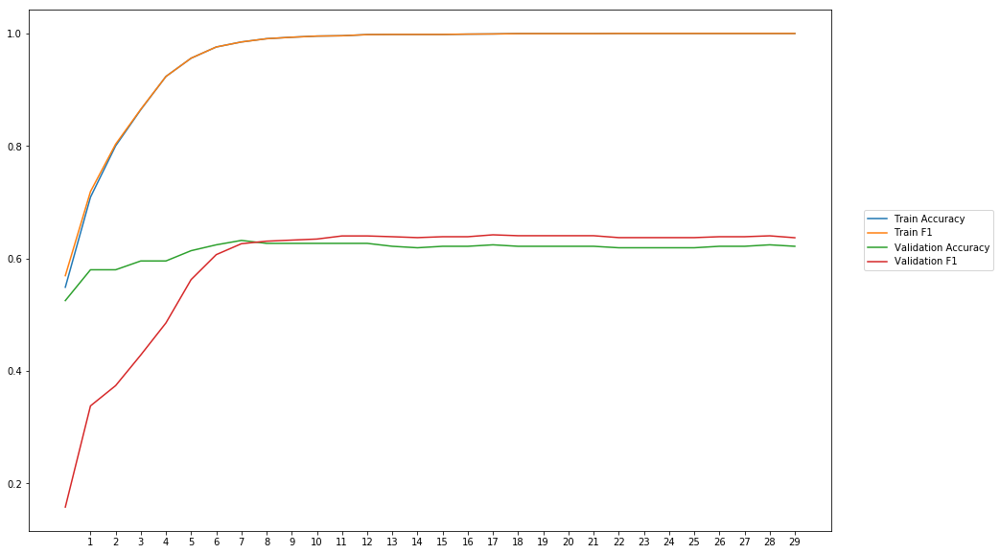

Average Accuracy: 61.44%
Average Precision: 63.15%
Average Recall: 58.71%
Average F1: 58.69%

-----Fold 9--------


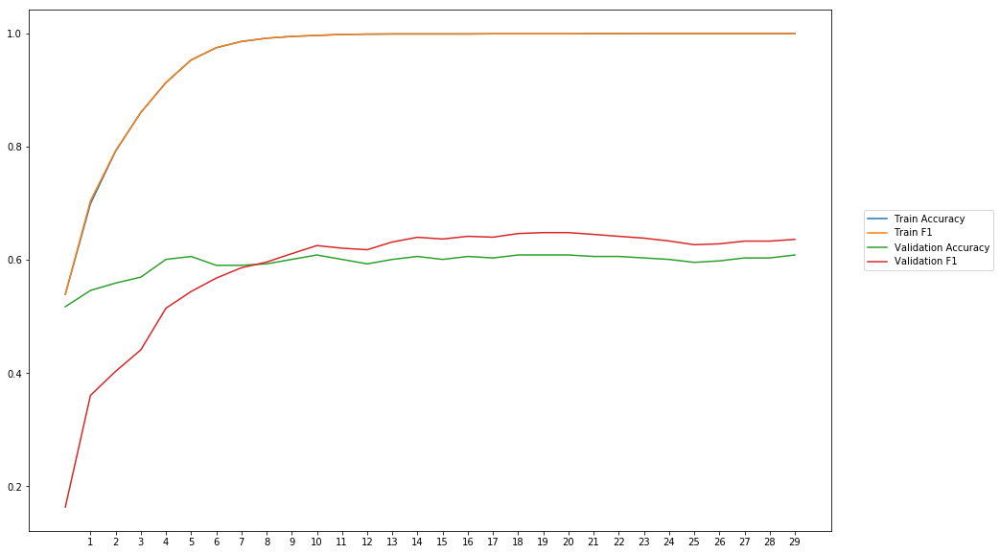

Average Accuracy: 59.45%
Average Precision: 59.50%
Average Recall: 60.35%
Average F1: 58.31%

-----Fold 10--------


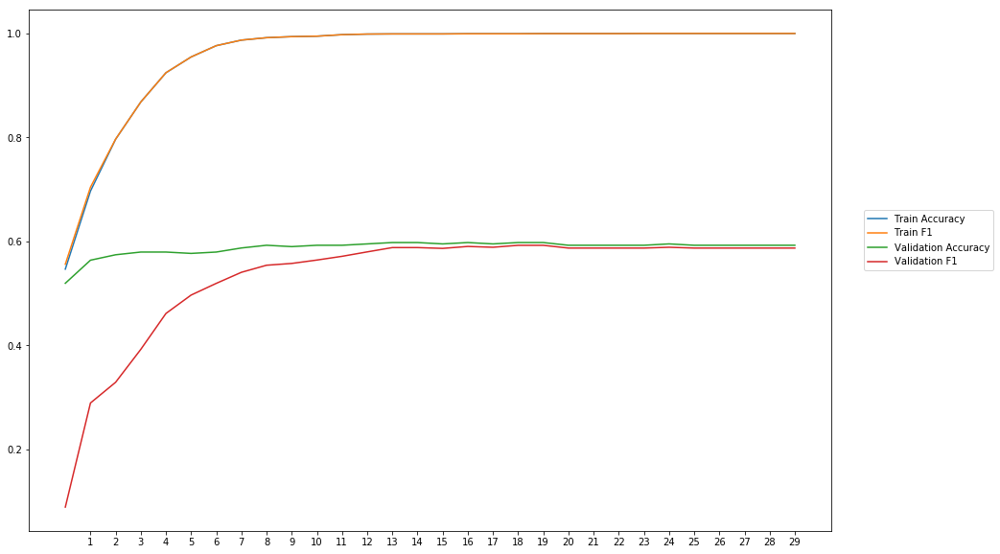

Average Accuracy: 58.78%
Average Precision: 62.26%
Average Recall: 49.88%
Average F1: 53.16%

-------Overallresults-------


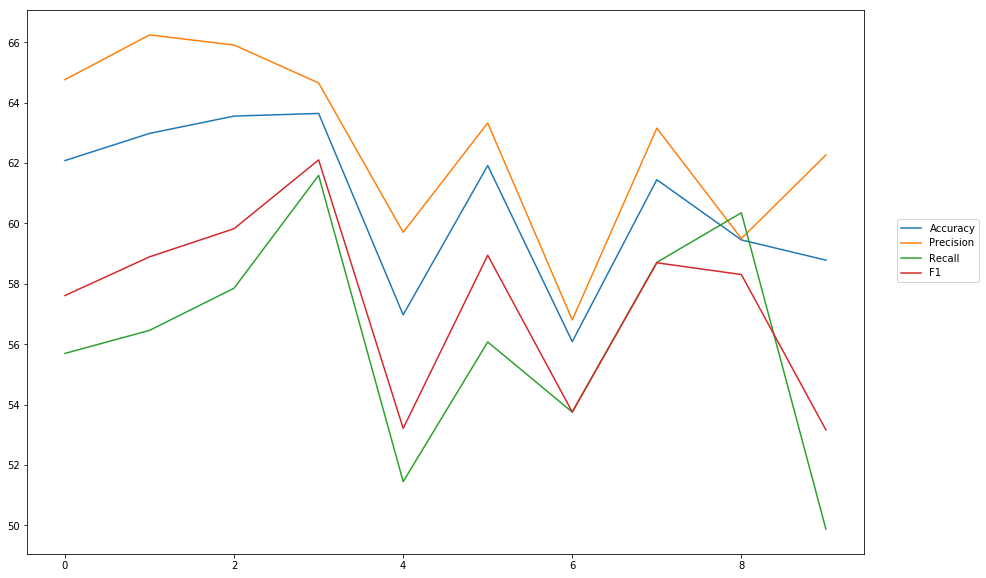

Accuracy: Mean = 60.69% (+/- 2.58%), Max = 63.64%, Min =  56.08%
Precision: Mean = 62.63% (+/- 2.93%), Max = 66.24%, Min =  56.80%
Recall: Mean = 56.18% (+/- 3.52%), Max = 61.59%, Min =  49.88%
F1: Mean = 57.45% (+/- 2.90%), Max = 62.10%, Min =  53.16%


In [24]:
cross_val_two_inputs(model_8, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_labels, softmax, outputpath, 'combined_input_senti_blob')

## Seperate Models combine results

In [25]:
#First part
wv_layer_9 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_9 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_9 = wv_layer_9(comment_input_9)
x_first_9 = Dense(600, activation='relu')(embedded_sequences_9)
x_first_9 = Flatten()(x_first_9)

#Second part
senti_input_9 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_9 = Dense(600, activation='relu')(senti_input_9)

#Concatination
concat_9 = concatenate([x_first_9, x_second_9])

#x_9 = Flatten()(concat)

preds_9 = Dense(2, activation='softmax')(concat_9)

model_9 = Model(inputs=[comment_input_9, senti_input_9], outputs=preds_9)
model_9.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_5 (Embedding)         (None, 40, 300)      4118700     input_9[0][0]                    
__________________________________________________________________________________________________
dense_7 (Dense)                 (None, 40, 600)      180600      embedding_5[0][0]                
__________________________________________________________________________________________________
input_10 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_5 


-----Fold 1--------


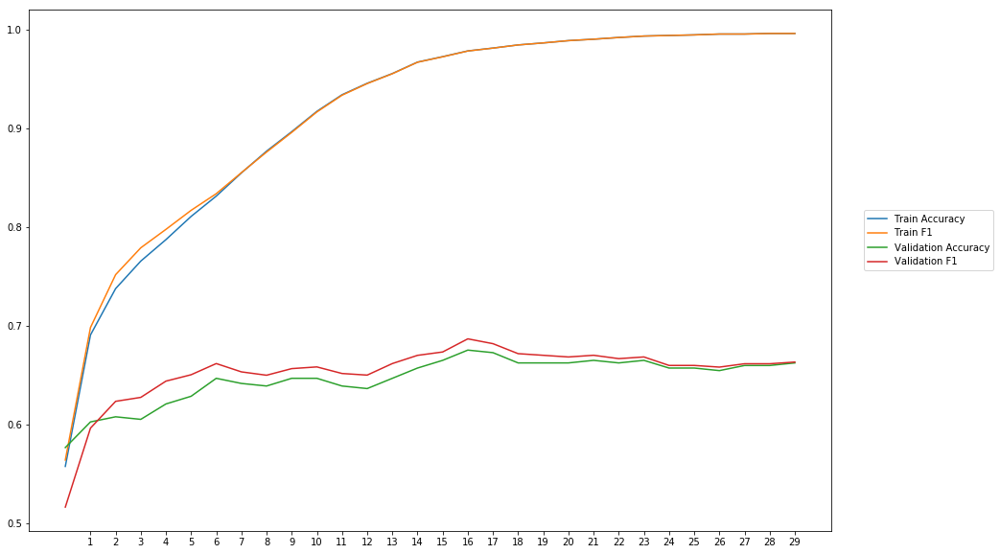

Average Accuracy: 64.61%
Average Precision: 63.84%
Average Recall: 66.98%
Average F1: 65.31%

-----Fold 2--------


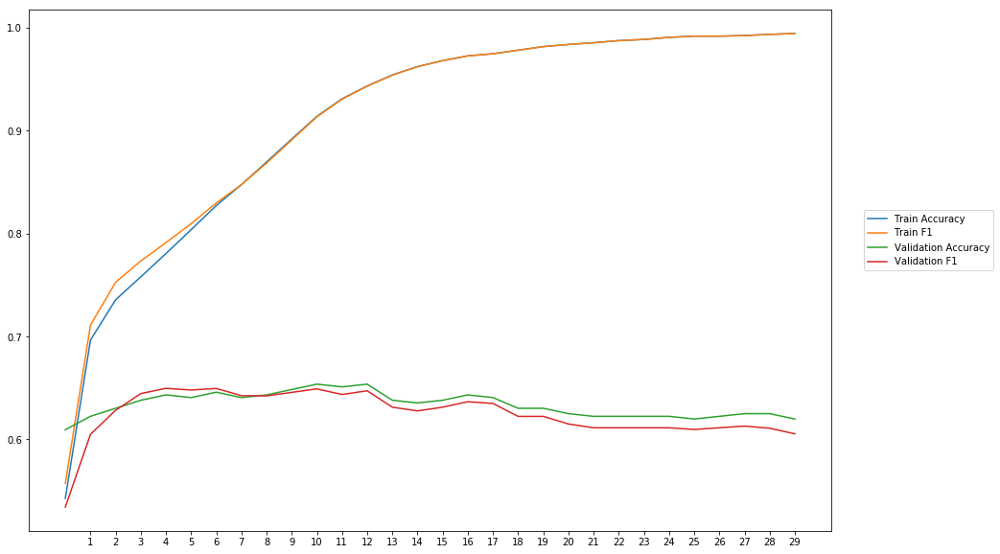

Average Accuracy: 63.34%
Average Precision: 63.60%
Average Recall: 61.55%
Average F1: 62.49%

-----Fold 3--------


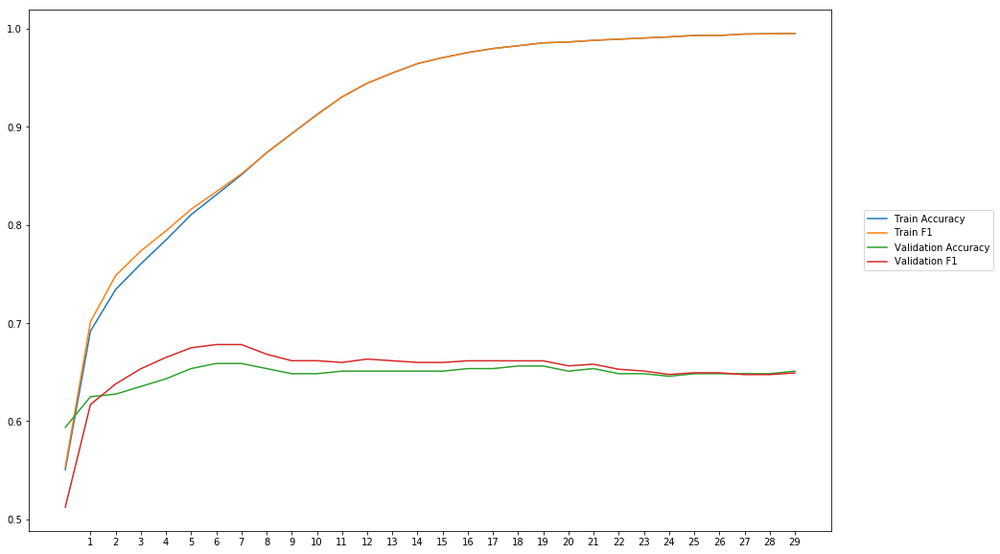

Average Accuracy: 64.71%
Average Precision: 63.89%
Average Recall: 66.86%
Average F1: 65.23%

-----Fold 4--------


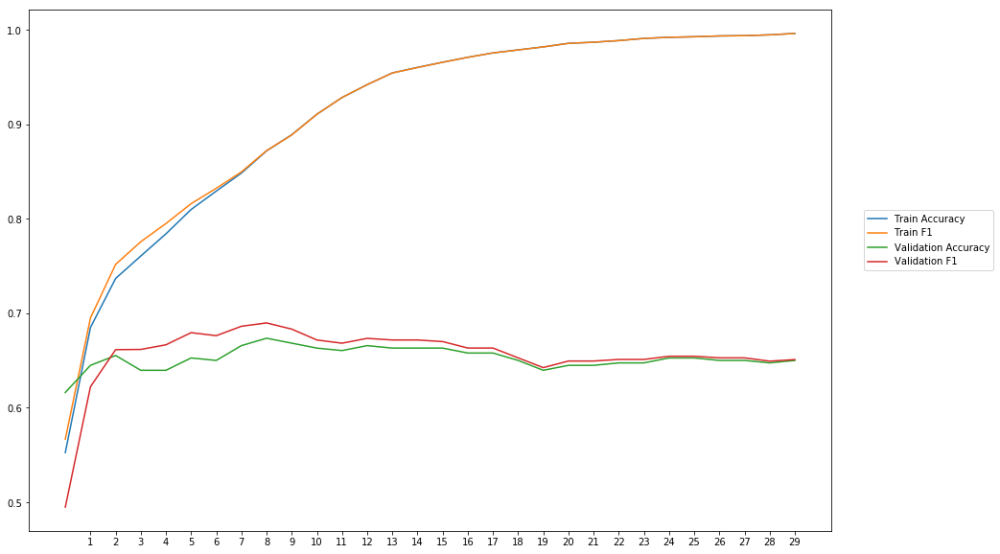

Average Accuracy: 65.27%
Average Precision: 64.80%
Average Recall: 67.00%
Average F1: 65.63%

-----Fold 5--------


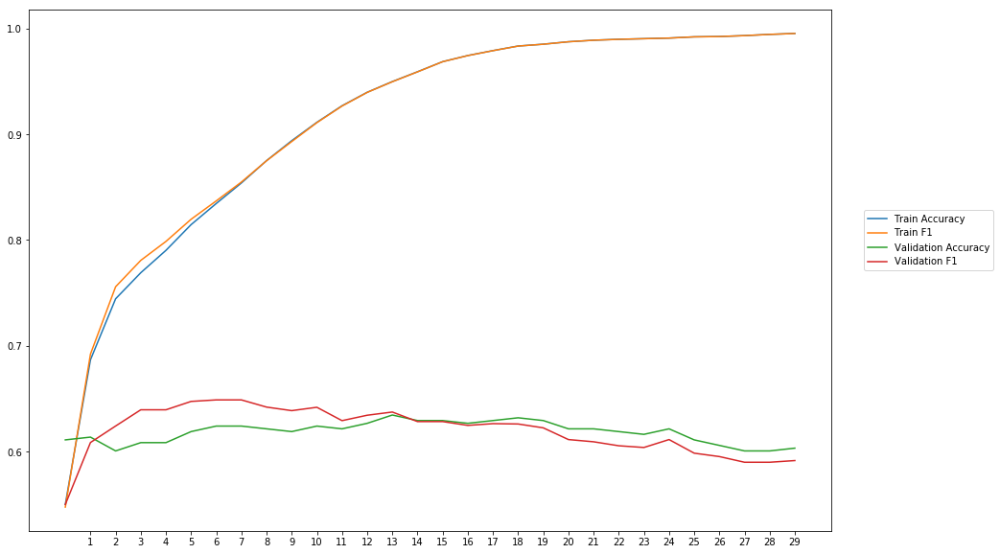

Average Accuracy: 61.84%
Average Precision: 61.64%
Average Recall: 62.60%
Average F1: 61.97%

-----Fold 6--------


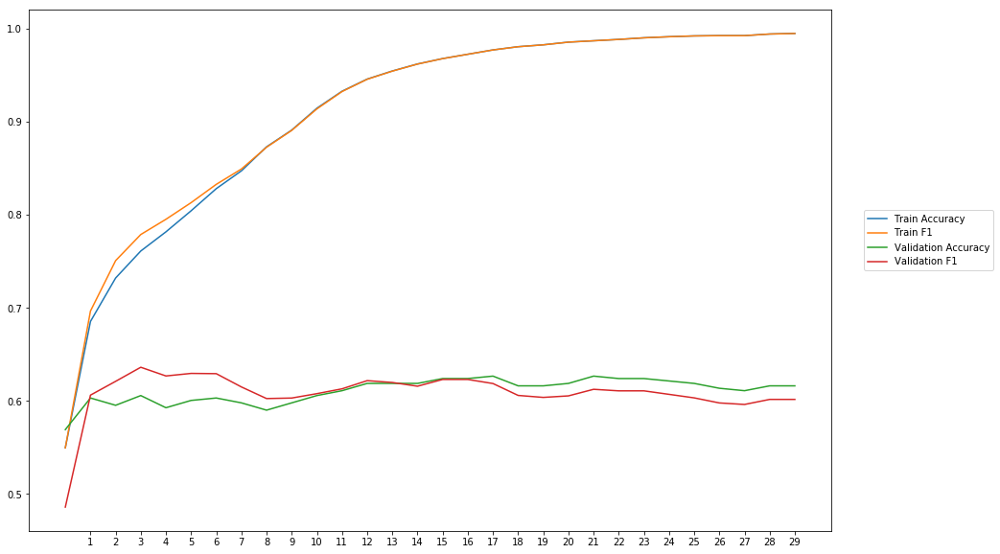

Average Accuracy: 61.09%
Average Precision: 61.12%
Average Recall: 60.89%
Average F1: 60.85%

-----Fold 7--------


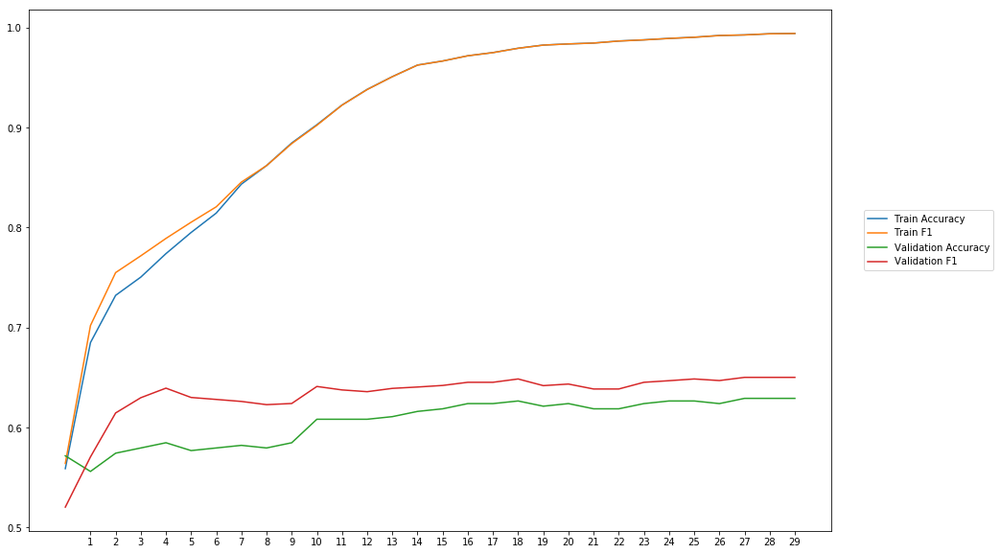

Average Accuracy: 60.63%
Average Precision: 59.20%
Average Recall: 68.20%
Average F1: 63.28%

-----Fold 8--------


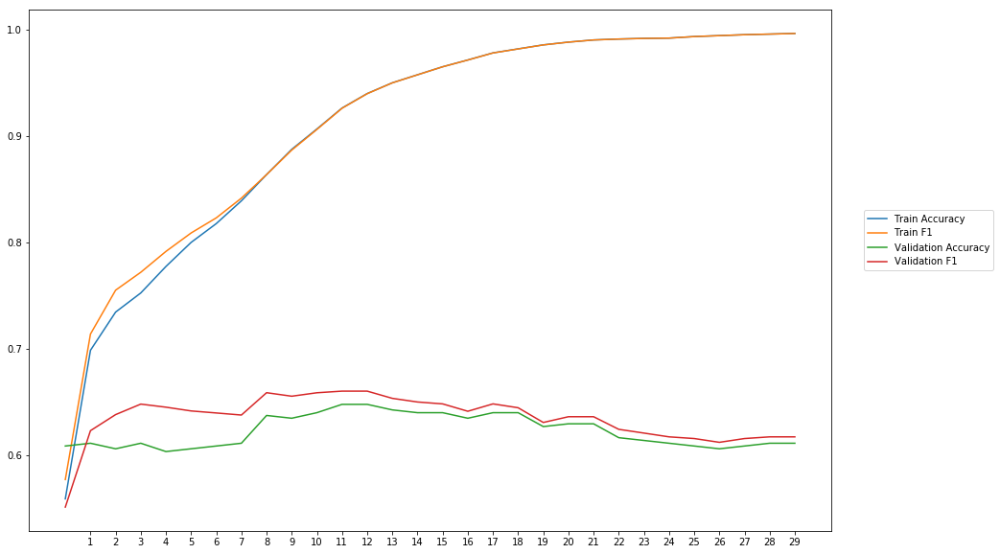

Average Accuracy: 62.25%
Average Precision: 61.39%
Average Recall: 65.92%
Average F1: 63.46%

-----Fold 9--------


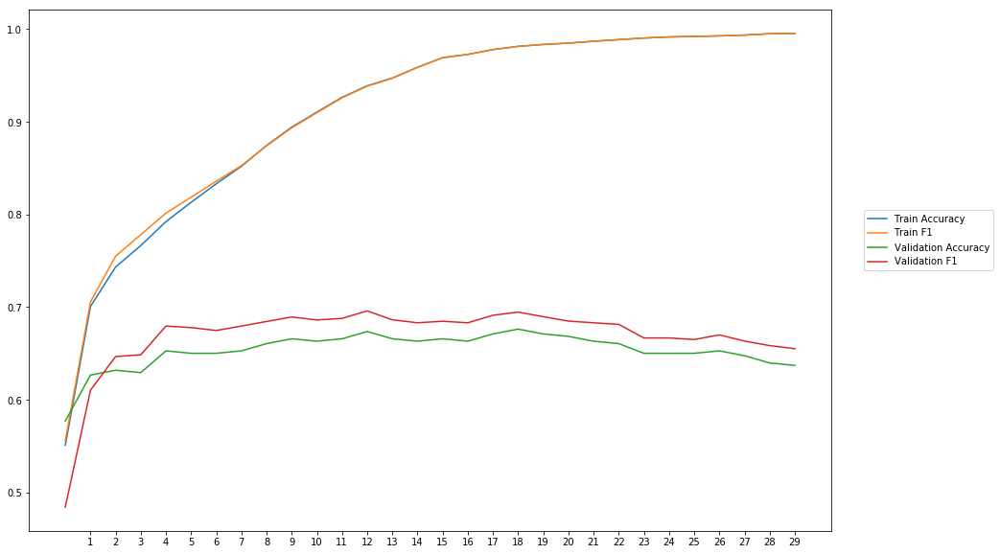

Average Accuracy: 65.32%
Average Precision: 63.71%
Average Recall: 70.63%
Average F1: 66.84%

-----Fold 10--------


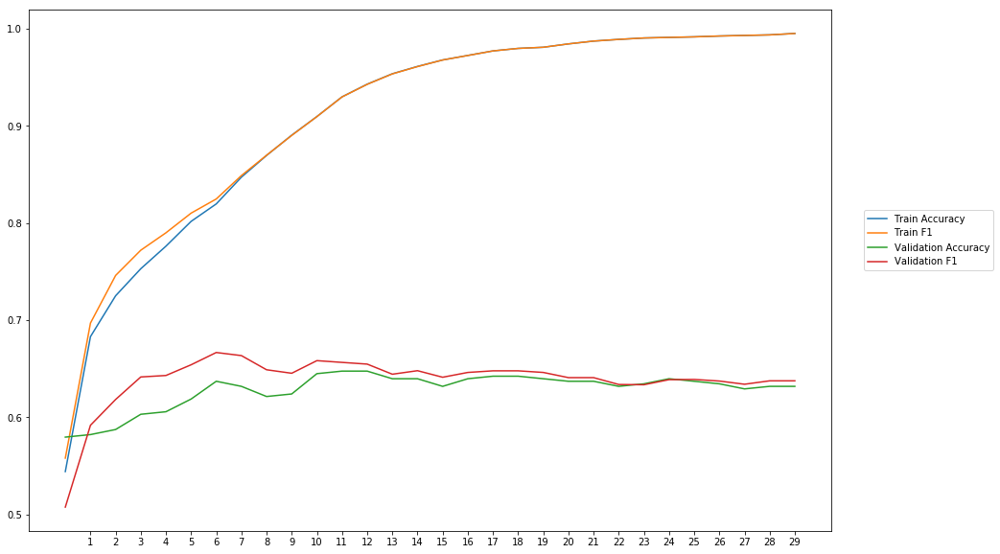

Average Accuracy: 62.84%
Average Precision: 62.05%
Average Recall: 65.97%
Average F1: 63.82%

-------Overallresults-------


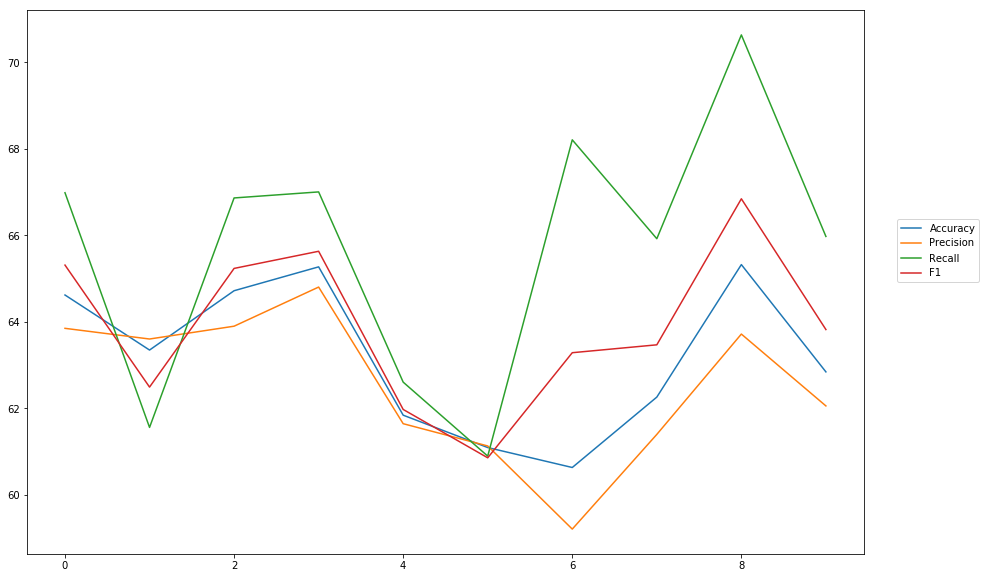

Accuracy: Mean = 63.19% (+/- 1.64%), Max = 65.32%, Min =  60.63%
Precision: Mean = 62.53% (+/- 1.63%), Max = 64.80%, Min =  59.20%
Recall: Mean = 65.66% (+/- 2.92%), Max = 70.63%, Min =  60.89%
F1: Mean = 63.89% (+/- 1.76%), Max = 66.84%, Min =  60.85%


In [26]:
cross_val_two_inputs(model_9, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_labels, softmax, outputpath, 'separat_models_senti_blob')

## Separate models combine output

### average

In [10]:
#First model
wv_layer_10 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_10 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_10 = wv_layer_10(comment_input_10)
x_first_10 = Dense(600, activation='relu')(embedded_sequences_10)
x_first_10 = Flatten()(x_first_10)
first_preds_10 = Dense(2, activation='softmax')(x_first_10)

#Second model
senti_input_10 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_10 = Dense(600, activation='relu')(senti_input_10)
second_preds_10 = Dense(2, activation='softmax')(x_second_10)

#Concat outputs
preds_10 = average([first_preds_10, second_preds_10])

model_10 = Model(inputs=[comment_input_10, senti_input_10], outputs=preds_10)
model_10.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 40, 300)      4118700     input_1[0][0]                    
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 40, 600)      180600      embedding_1[0][0]                
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_1 


-----Fold 1--------


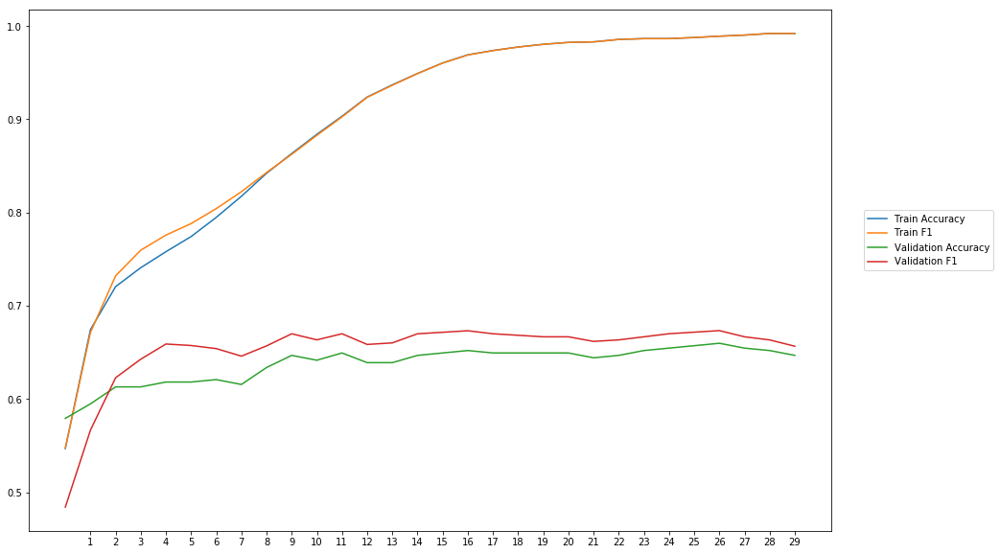

Average Accuracy: 63.78%
Average Precision: 62.44%
Average Recall: 68.84%
Average F1: 65.30%

-----Fold 2--------


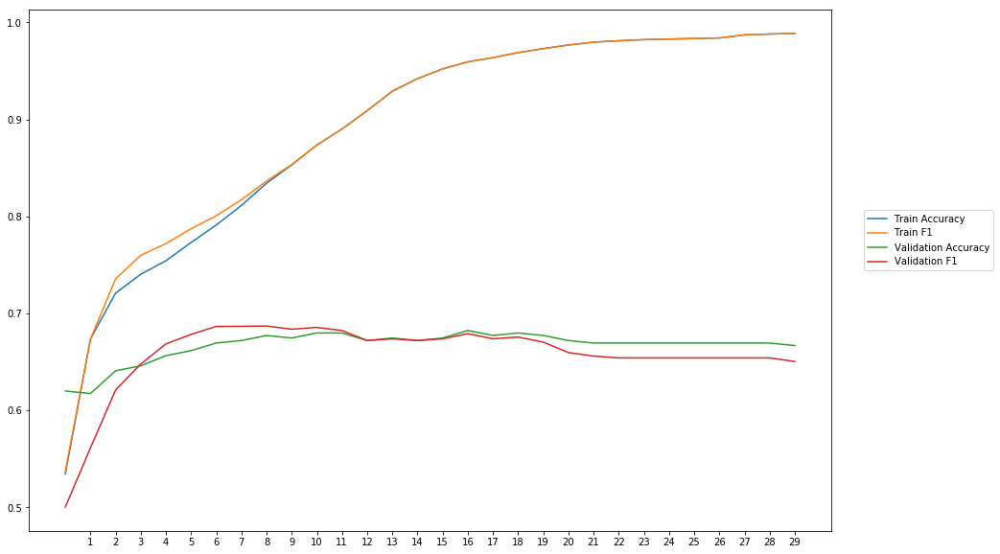

Average Accuracy: 66.65%
Average Precision: 67.15%
Average Recall: 64.89%
Average F1: 65.73%

-----Fold 3--------


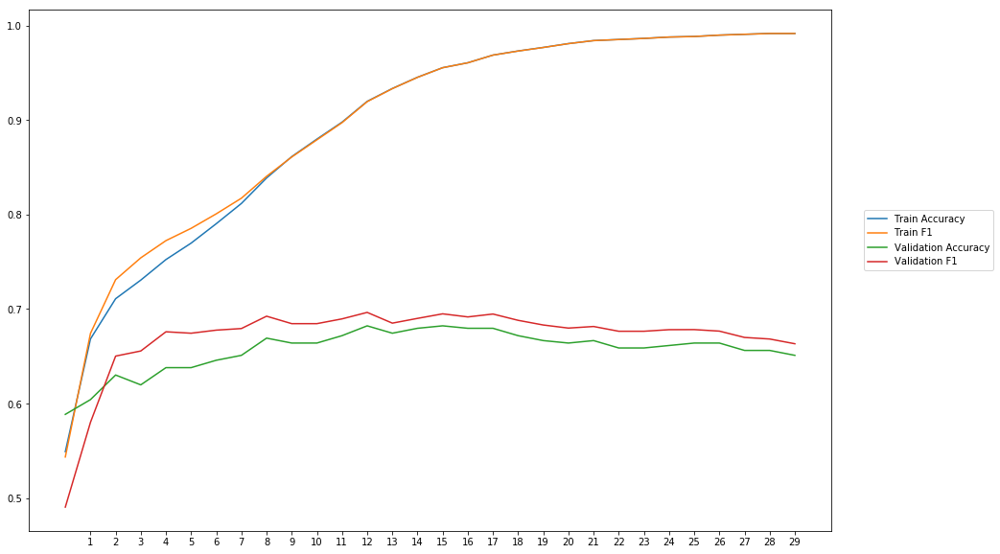

Average Accuracy: 65.68%
Average Precision: 64.07%
Average Recall: 70.70%
Average F1: 67.03%

-----Fold 4--------


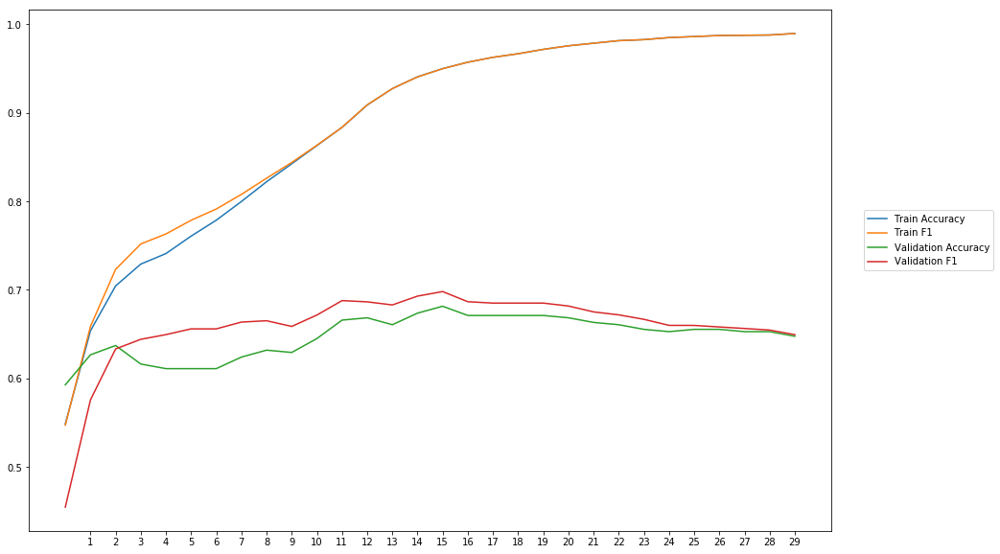

Average Accuracy: 64.78%
Average Precision: 63.81%
Average Recall: 68.81%
Average F1: 65.83%

-----Fold 5--------


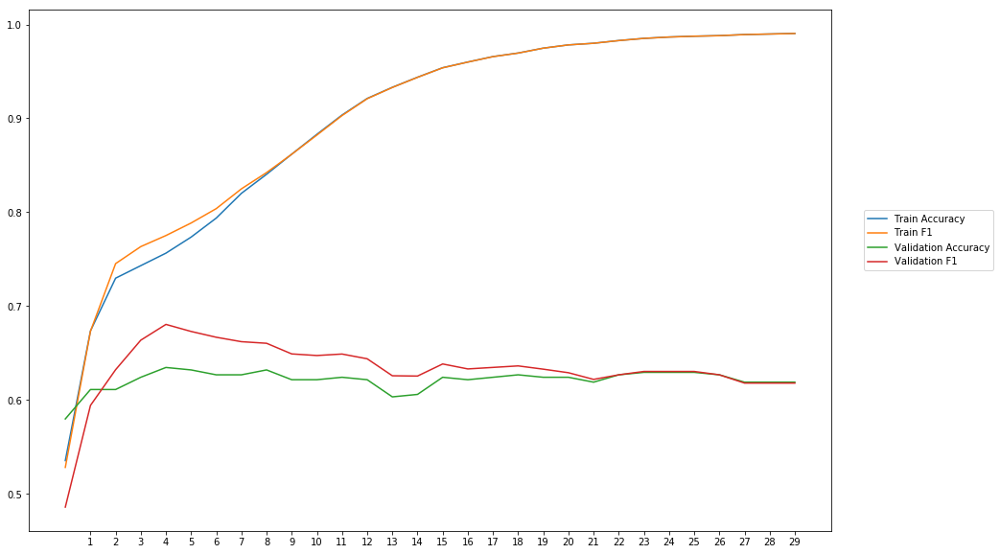

Average Accuracy: 62.11%
Average Precision: 61.22%
Average Recall: 65.93%
Average F1: 63.26%

-----Fold 6--------


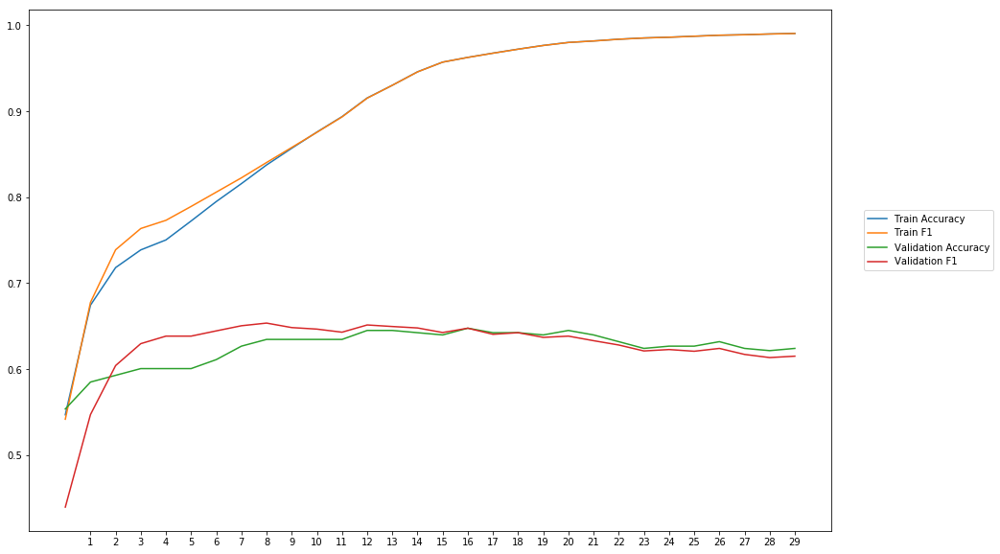

Average Accuracy: 62.49%
Average Precision: 62.20%
Average Recall: 63.39%
Average F1: 62.58%

-----Fold 7--------


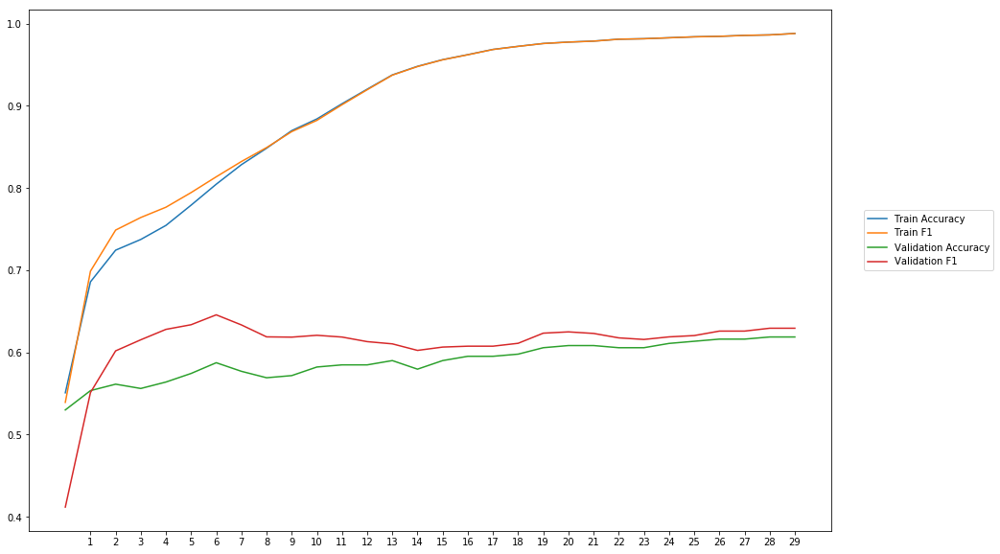

Average Accuracy: 58.91%
Average Precision: 57.93%
Average Recall: 65.10%
Average F1: 61.04%

-----Fold 8--------


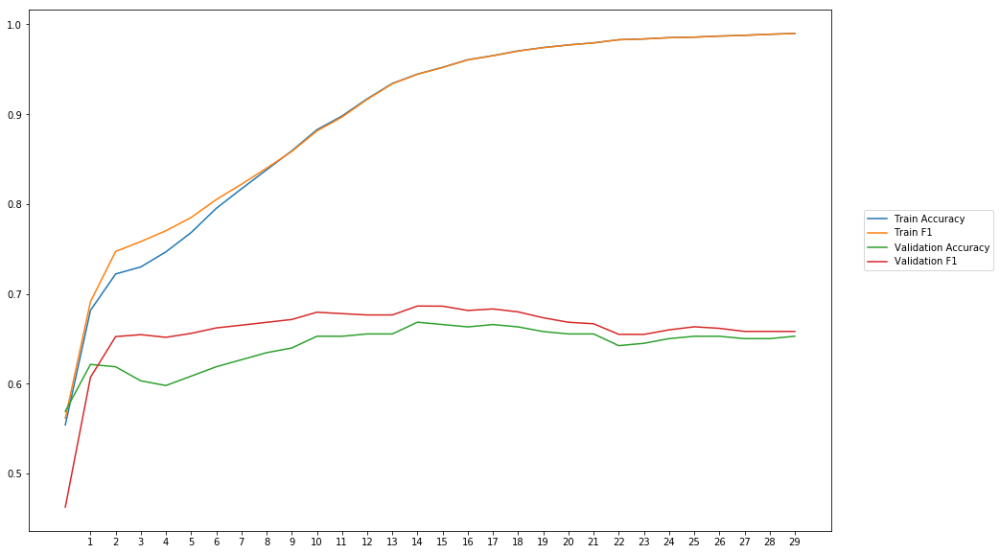

Average Accuracy: 64.15%
Average Precision: 62.71%
Average Recall: 69.86%
Average F1: 65.85%

-----Fold 9--------


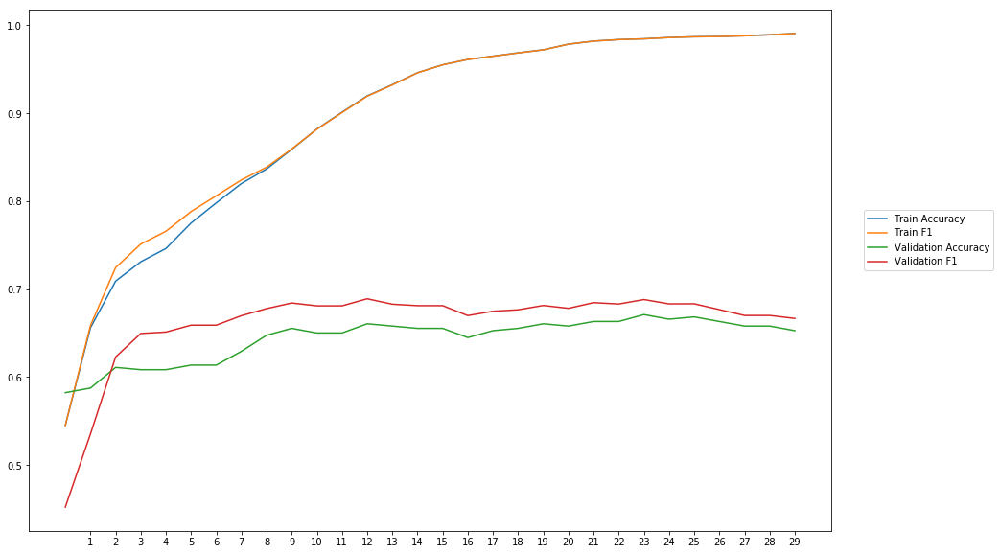

Average Accuracy: 64.40%
Average Precision: 62.82%
Average Recall: 70.59%
Average F1: 66.14%

-----Fold 10--------


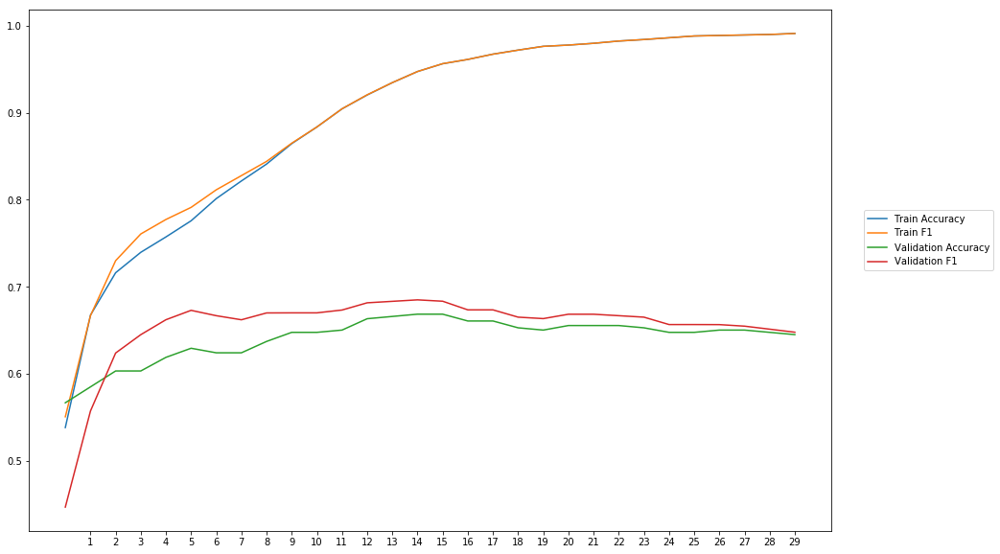

Average Accuracy: 64.11%
Average Precision: 62.88%
Average Recall: 68.67%
Average F1: 65.39%

-------Overallresults-------


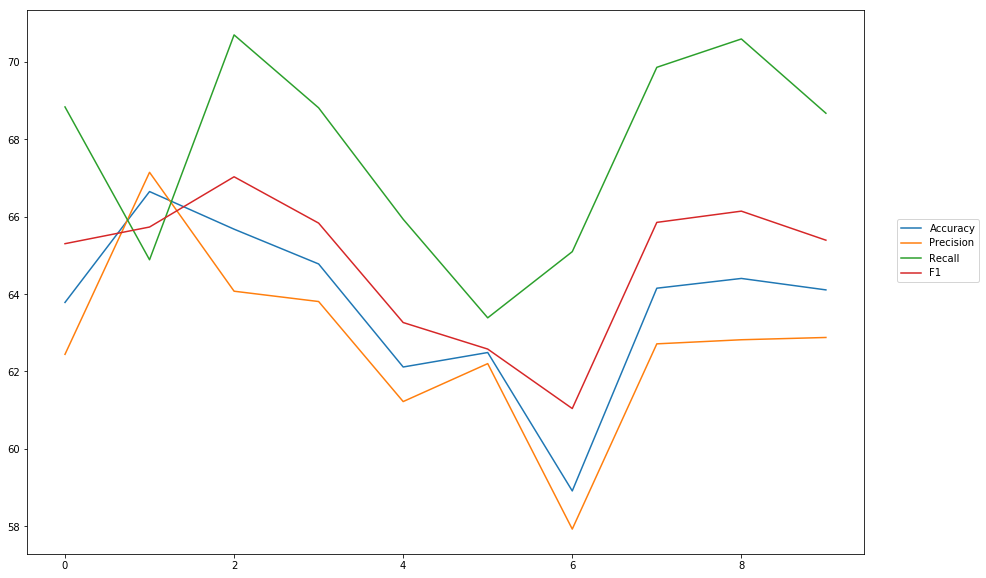

Accuracy: Mean = 63.71% (+/- 2.04%), Max = 66.65%, Min =  58.91%
Precision: Mean = 62.72% (+/- 2.20%), Max = 67.15%, Min =  57.93%
Recall: Mean = 67.68% (+/- 2.49%), Max = 70.70%, Min =  63.39%
F1: Mean = 64.82% (+/- 1.78%), Max = 67.03%, Min =  61.04%


In [28]:
cross_val_two_inputs(model_10, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_labels, softmax, outputpath, 'combined_outputs_senti_blob')

# Sentiment - Vadar

## Combine Inputs

In [30]:
#Input Words
wv_layer_11 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_11 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_11 = wv_layer_11(comment_input_11)
embedded_sequences_11 = Flatten()(embedded_sequences_11)

#Input POS
senti_input_11 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')

#Concat Inputs
concat_11 = concatenate([embedded_sequences_11, senti_input_11], axis=1)

x_11 = Dense(600, activation='relu')(concat_11)
preds_11 = Dense(2, activation='softmax')(x_11)

# build the model
model_11 = Model(inputs=[comment_input_11, senti_input_11], outputs=preds_11)
model_11.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_13 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_7 (Embedding)         (None, 40, 300)      4118700     input_13[0][0]                   
__________________________________________________________________________________________________
flatten_7 (Flatten)             (None, 12000)        0           embedding_7[0][0]                
__________________________________________________________________________________________________
input_14 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
concatenat


-----Fold 1--------


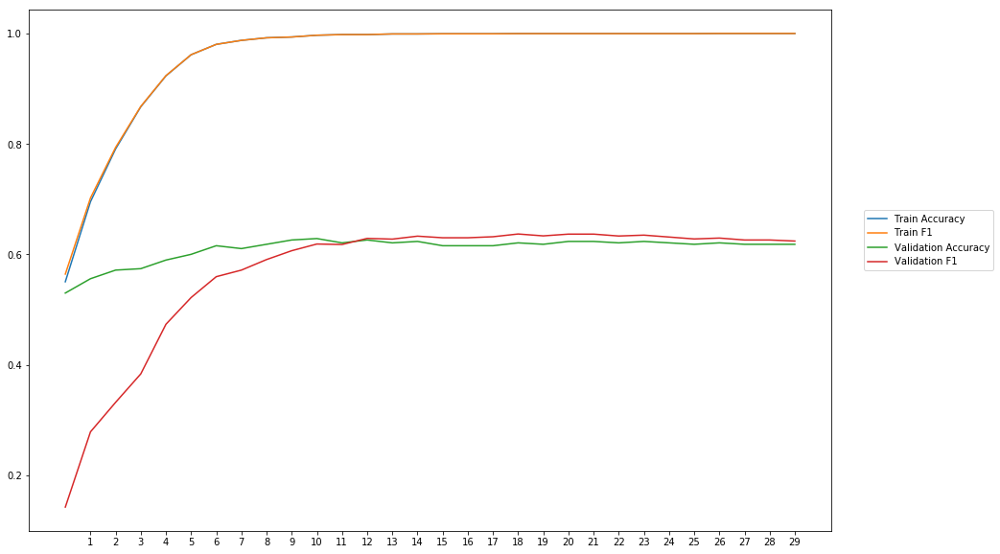

Average Accuracy: 61.00%
Average Precision: 63.63%
Average Recall: 55.40%
Average F1: 56.84%

-----Fold 2--------


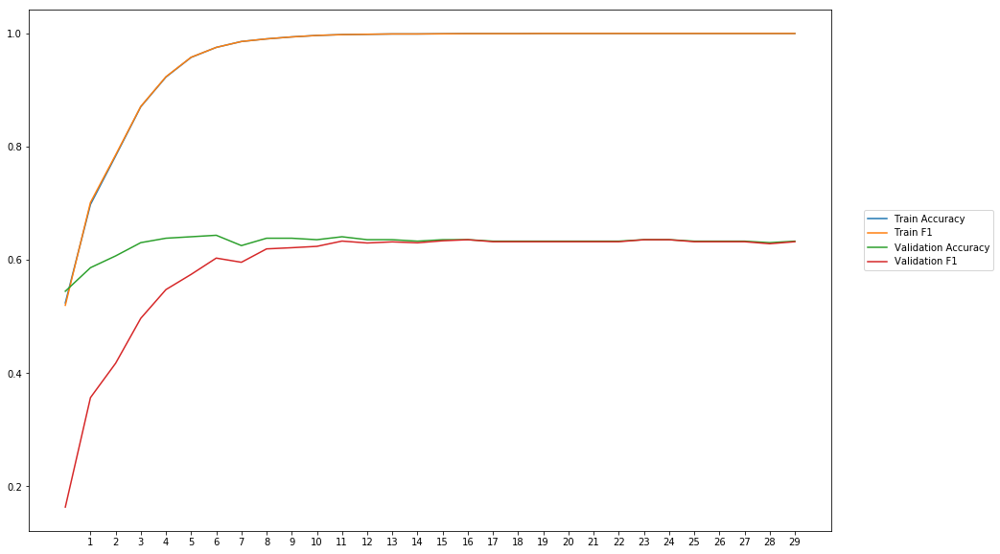

Average Accuracy: 62.90%
Average Precision: 66.60%
Average Recall: 56.02%
Average F1: 58.76%

-----Fold 3--------


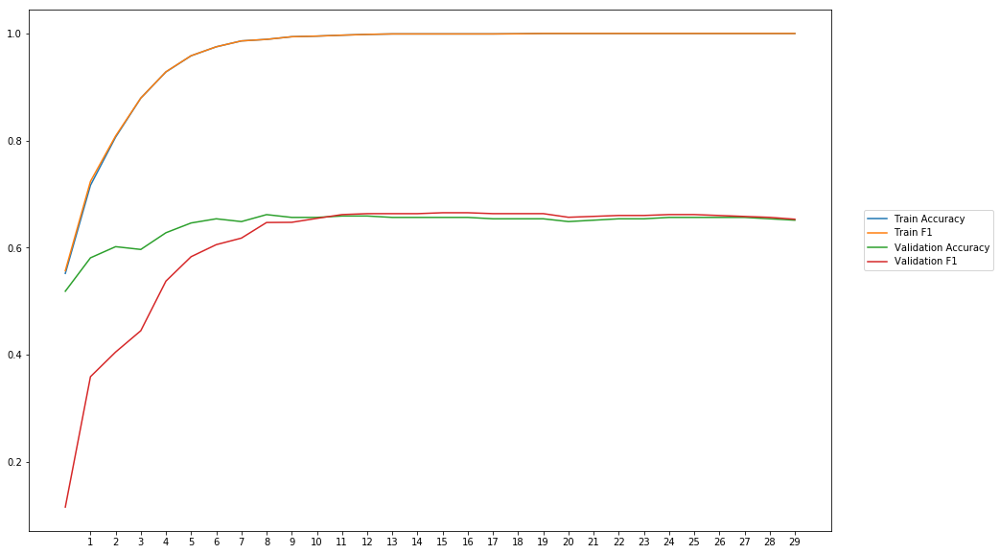

Average Accuracy: 64.29%
Average Precision: 66.51%
Average Recall: 58.97%
Average F1: 60.56%

-----Fold 4--------


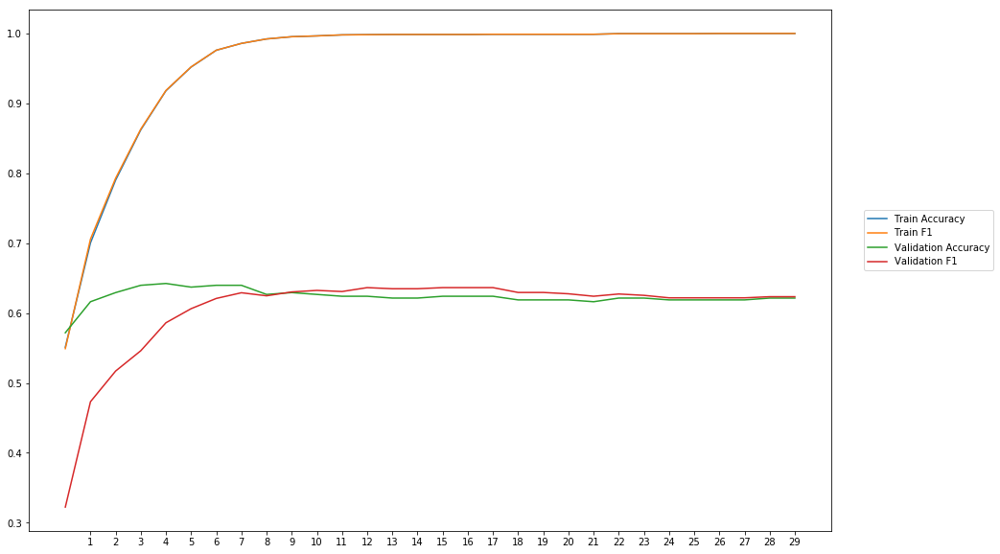

Average Accuracy: 62.32%
Average Precision: 63.97%
Average Recall: 59.27%
Average F1: 60.44%

-----Fold 5--------


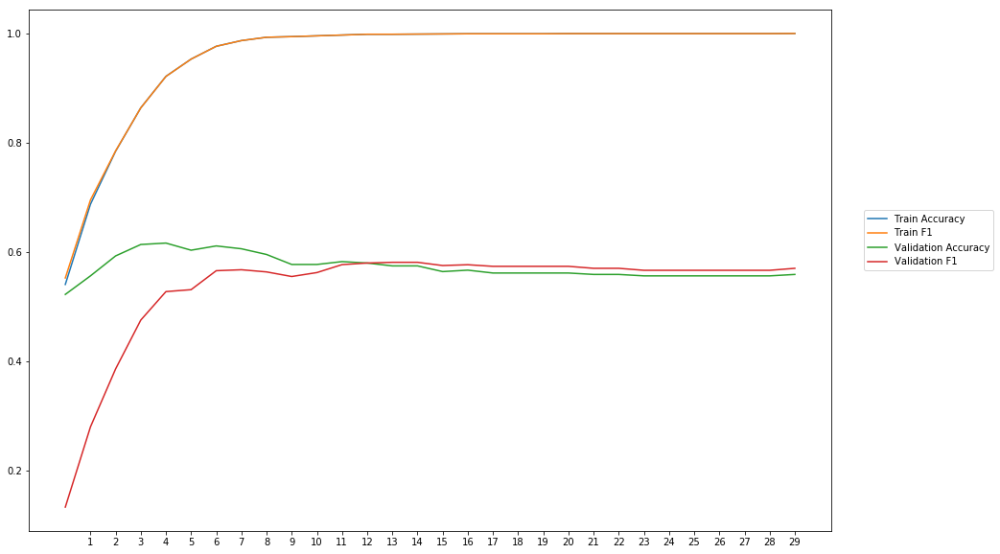

Average Accuracy: 57.23%
Average Precision: 59.81%
Average Recall: 51.62%
Average F1: 53.39%

-----Fold 6--------


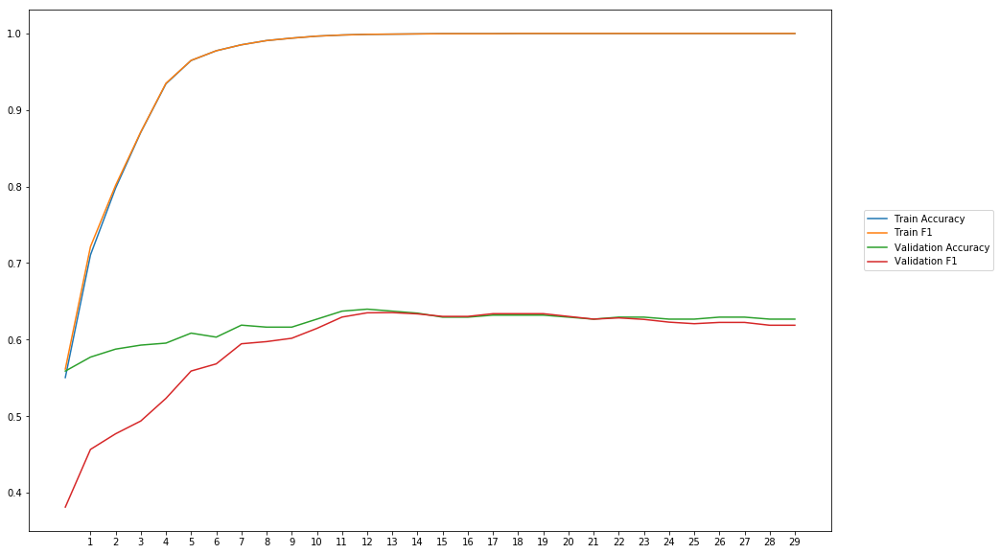

Average Accuracy: 61.94%
Average Precision: 63.21%
Average Recall: 56.86%
Average F1: 59.32%

-----Fold 7--------


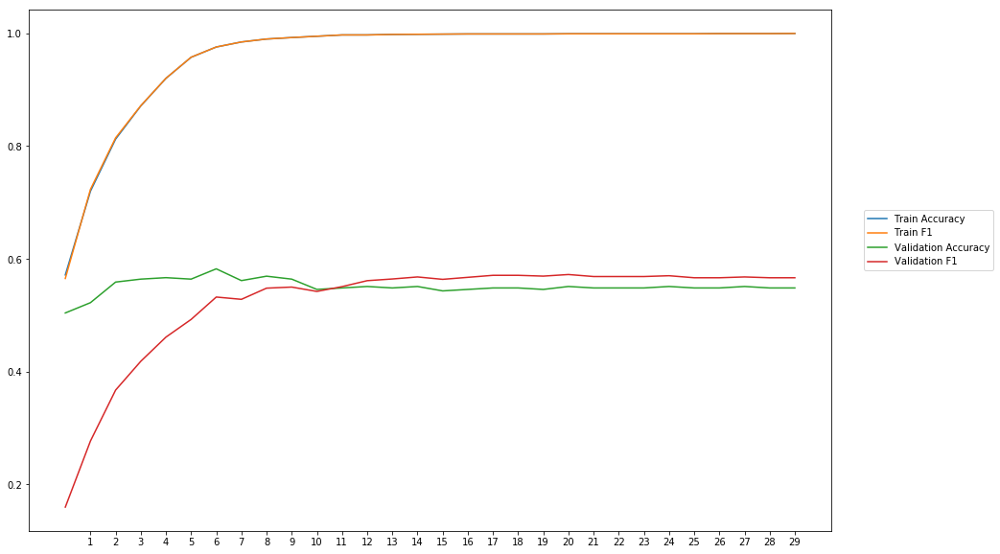

Average Accuracy: 55.07%
Average Precision: 55.75%
Average Recall: 51.54%
Average F1: 52.14%

-----Fold 8--------


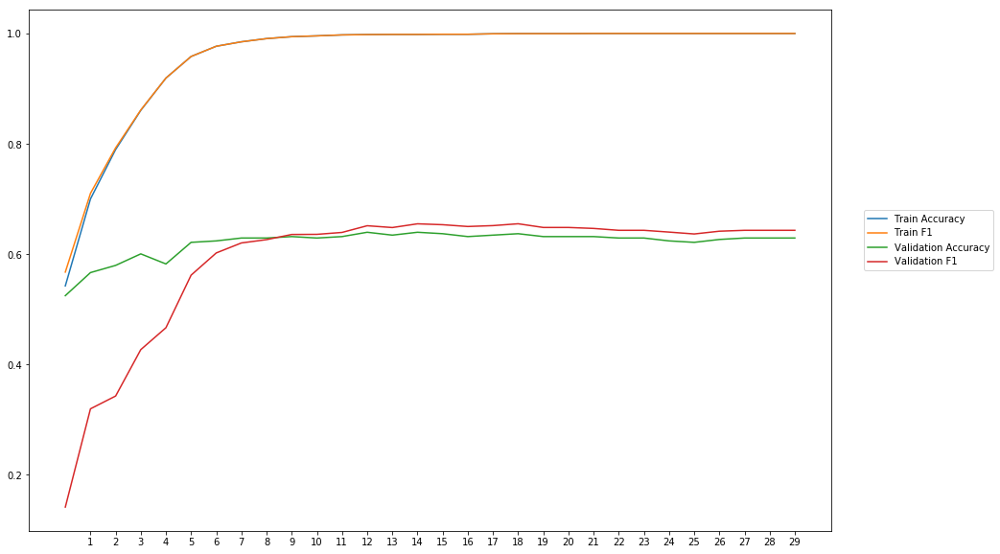

Average Accuracy: 62.06%
Average Precision: 64.05%
Average Recall: 58.60%
Average F1: 58.87%

-----Fold 9--------


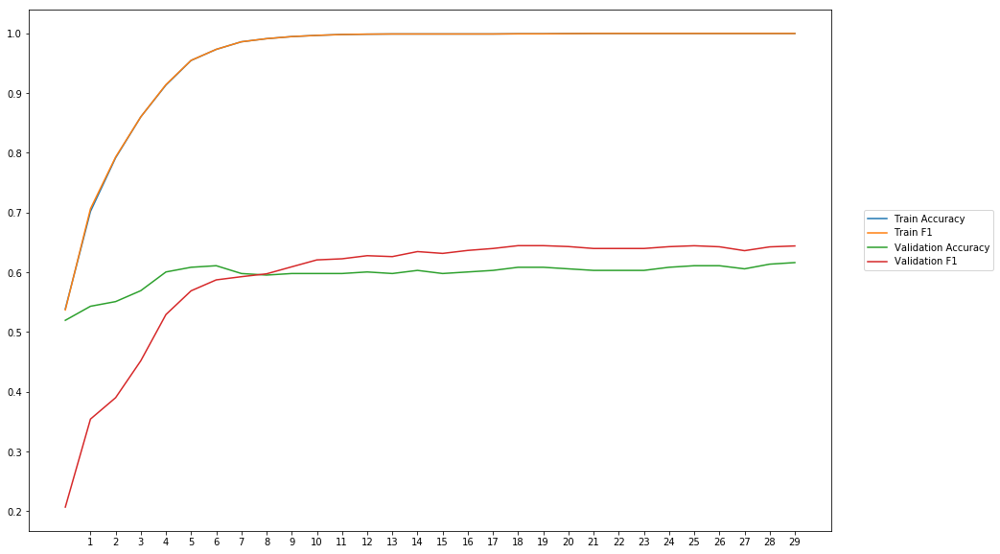

Average Accuracy: 59.63%
Average Precision: 59.47%
Average Recall: 60.94%
Average F1: 58.77%

-----Fold 10--------


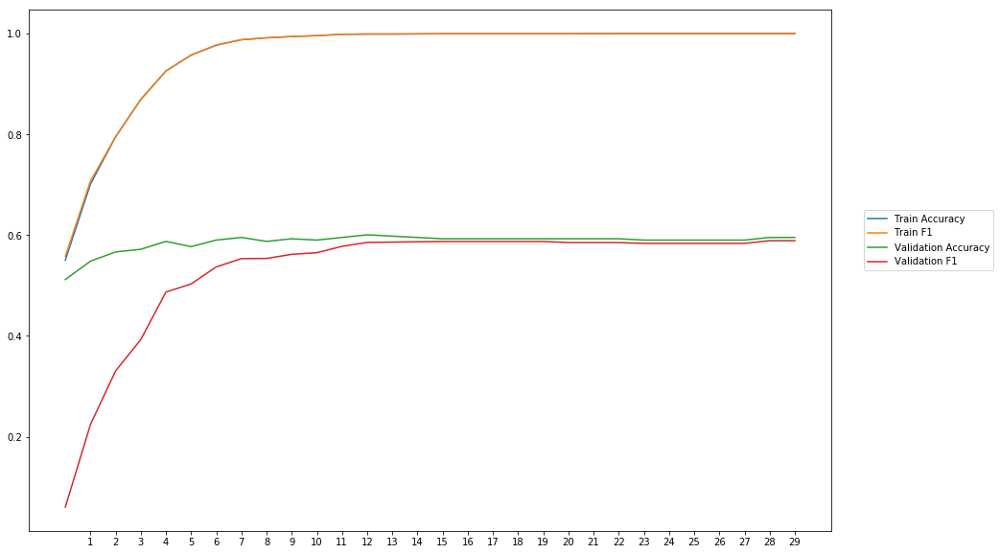

Average Accuracy: 58.63%
Average Precision: 61.73%
Average Recall: 49.90%
Average F1: 52.97%

-------Overallresults-------


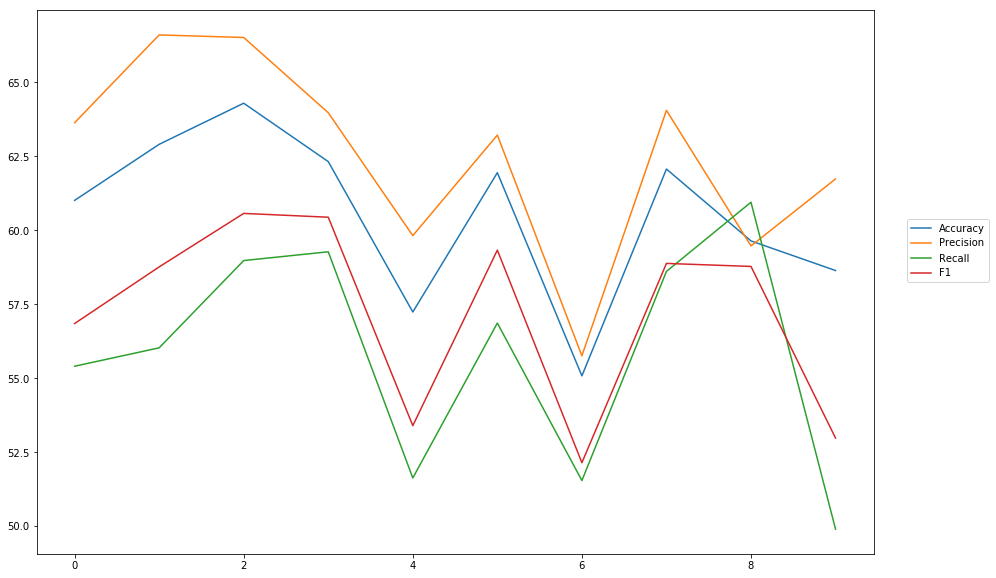

Accuracy: Mean = 60.51% (+/- 2.69%), Max = 64.29%, Min =  55.07%
Precision: Mean = 62.47% (+/- 3.19%), Max = 66.60%, Min =  55.75%
Recall: Mean = 55.91% (+/- 3.58%), Max = 60.94%, Min =  49.90%
F1: Mean = 57.21% (+/- 3.04%), Max = 60.56%, Min =  52.14%


In [31]:
cross_val_two_inputs(model_11, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_vadar, train_labels, softmax, outputpath, 'combined_input_senti_blob')

## Seperate Models combine results

In [32]:
#First part
wv_layer_12 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_12 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_12 = wv_layer_12(comment_input_12)
x_first_12 = Dense(600, activation='relu')(embedded_sequences_12)
x_first_12 = Flatten()(x_first_12)

#Second part
senti_input_12 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_12 = Dense(600, activation='relu')(senti_input_12)

#Concatination
concat_12 = concatenate([x_first_12, x_second_12])

#x_12 = Flatten()(concat)

preds_12 = Dense(2, activation='softmax')(concat_12)

model_12 = Model(inputs=[comment_input_12, senti_input_12], outputs=preds_12)
model_12.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_15 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_8 (Embedding)         (None, 40, 300)      4118700     input_15[0][0]                   
__________________________________________________________________________________________________
dense_16 (Dense)                (None, 40, 600)      180600      embedding_8[0][0]                
__________________________________________________________________________________________________
input_16 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_8 


-----Fold 1--------


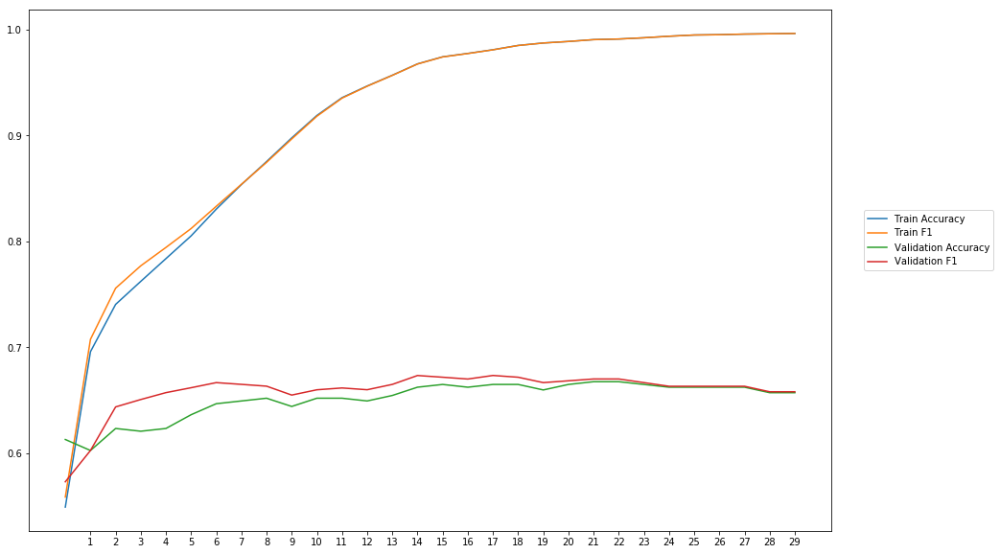

Average Accuracy: 65.09%
Average Precision: 64.32%
Average Recall: 67.60%
Average F1: 65.86%

-----Fold 2--------


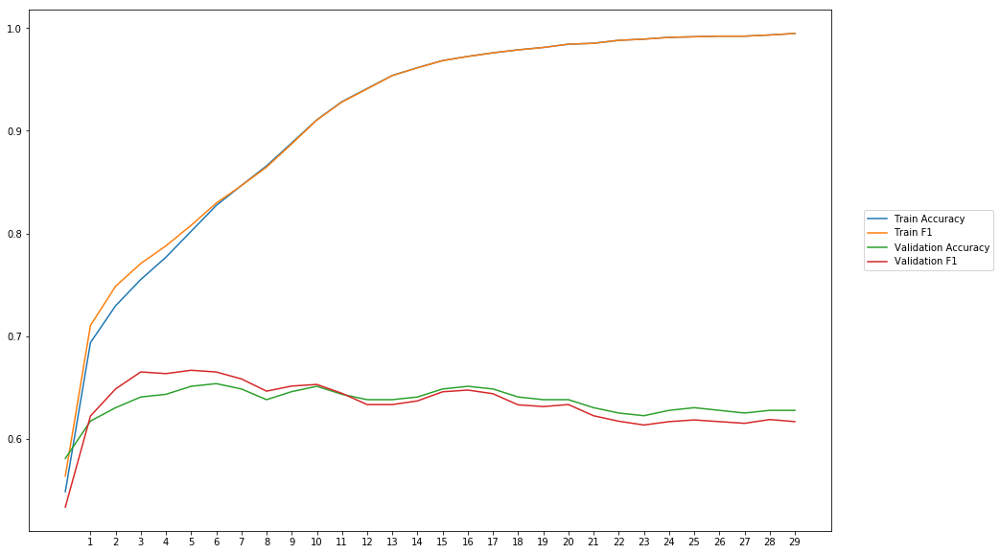

Average Accuracy: 63.56%
Average Precision: 63.31%
Average Recall: 63.56%
Average F1: 63.36%

-----Fold 3--------


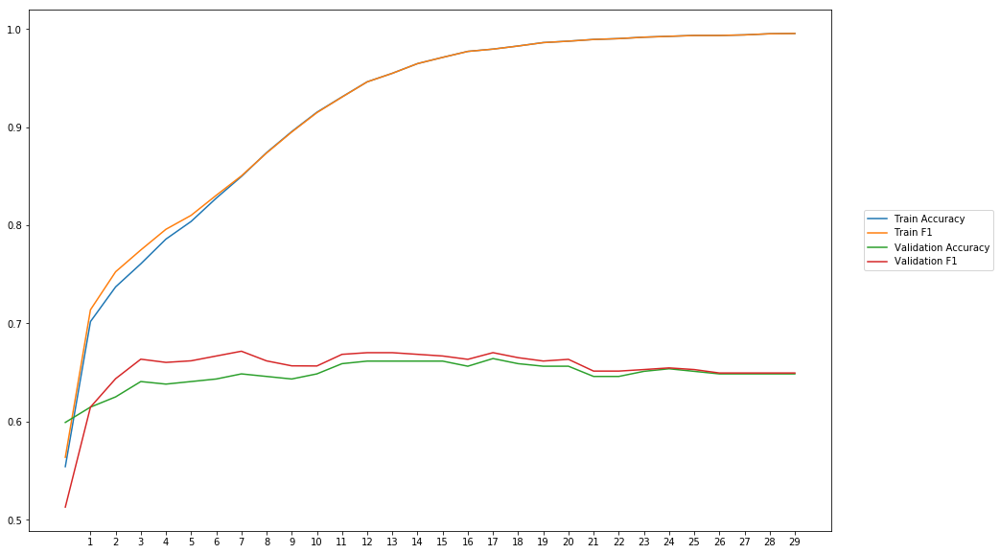

Average Accuracy: 64.75%
Average Precision: 63.92%
Average Recall: 67.05%
Average F1: 65.32%

-----Fold 4--------


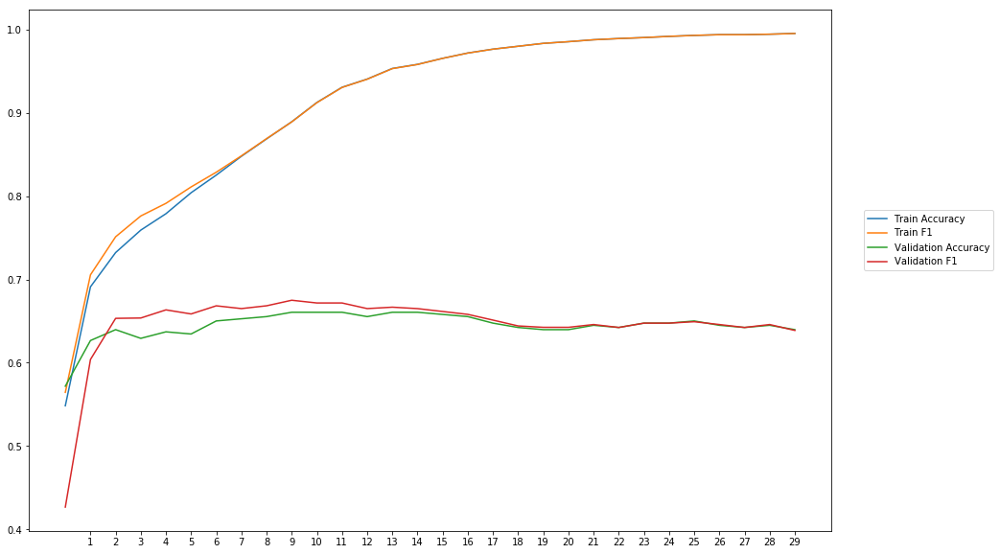

Average Accuracy: 64.47%
Average Precision: 64.06%
Average Recall: 65.65%
Average F1: 64.60%

-----Fold 5--------


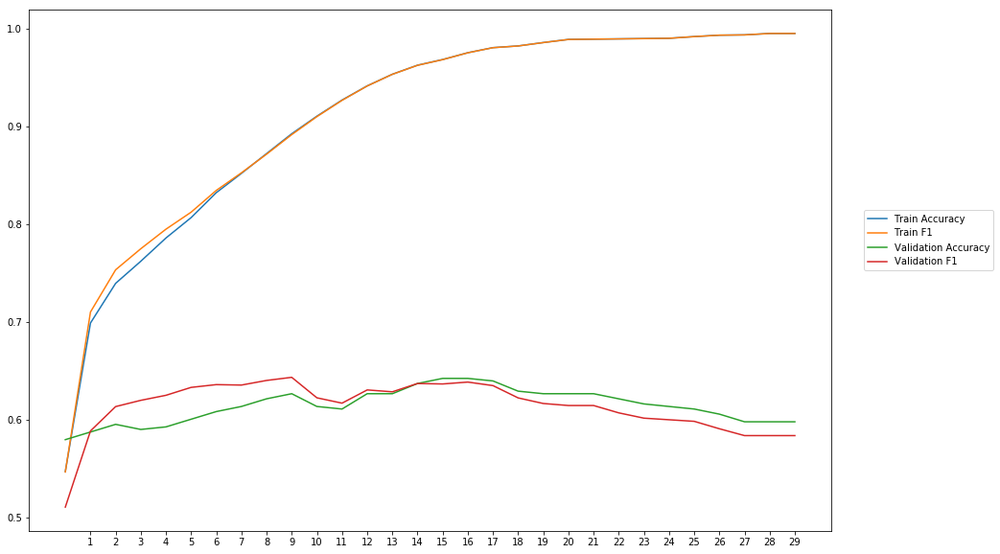

Average Accuracy: 61.42%
Average Precision: 61.34%
Average Recall: 61.68%
Average F1: 61.36%

-----Fold 6--------


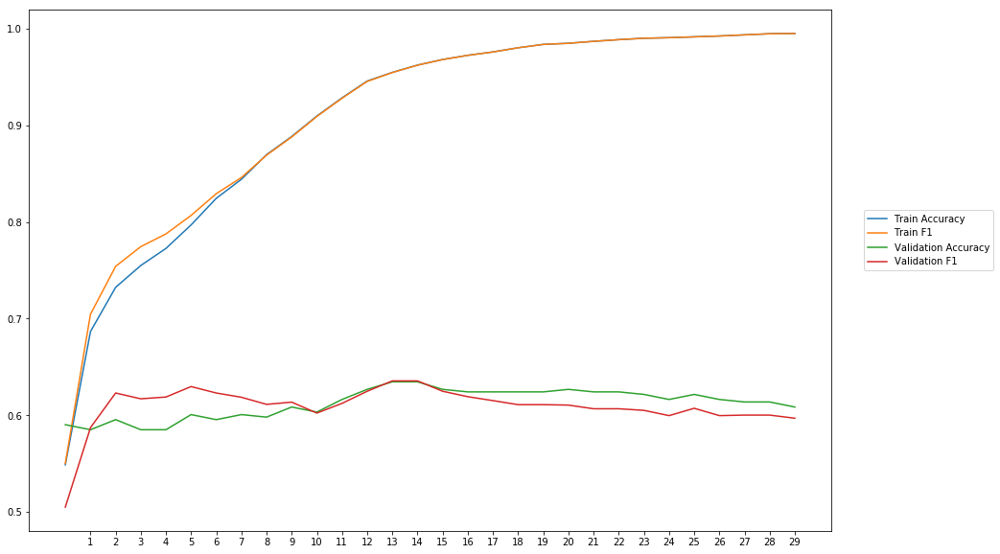

Average Accuracy: 61.22%
Average Precision: 61.38%
Average Recall: 60.75%
Average F1: 60.89%

-----Fold 7--------


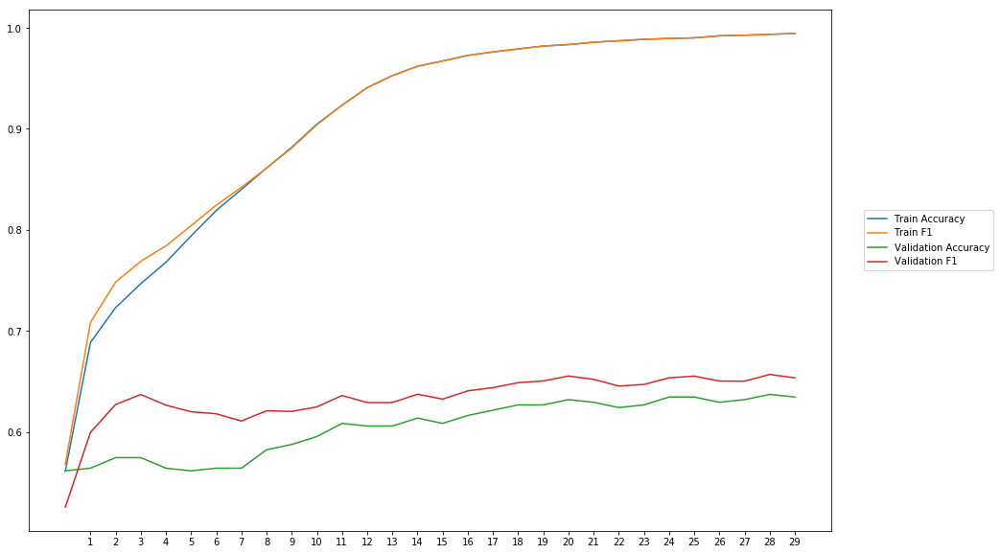

Average Accuracy: 60.46%
Average Precision: 59.03%
Average Recall: 68.50%
Average F1: 63.32%

-----Fold 8--------


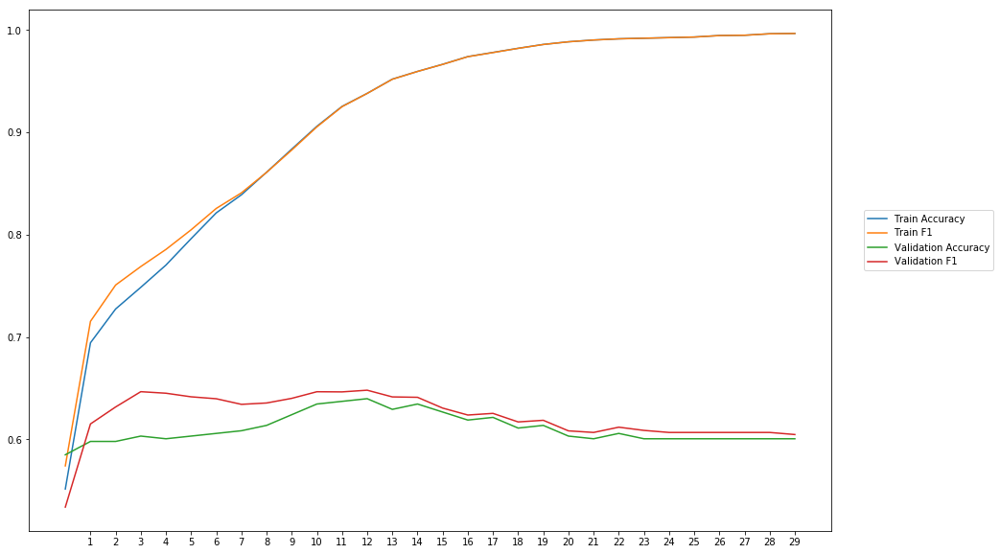

Average Accuracy: 61.06%
Average Precision: 60.28%
Average Recall: 64.57%
Average F1: 62.25%

-----Fold 9--------


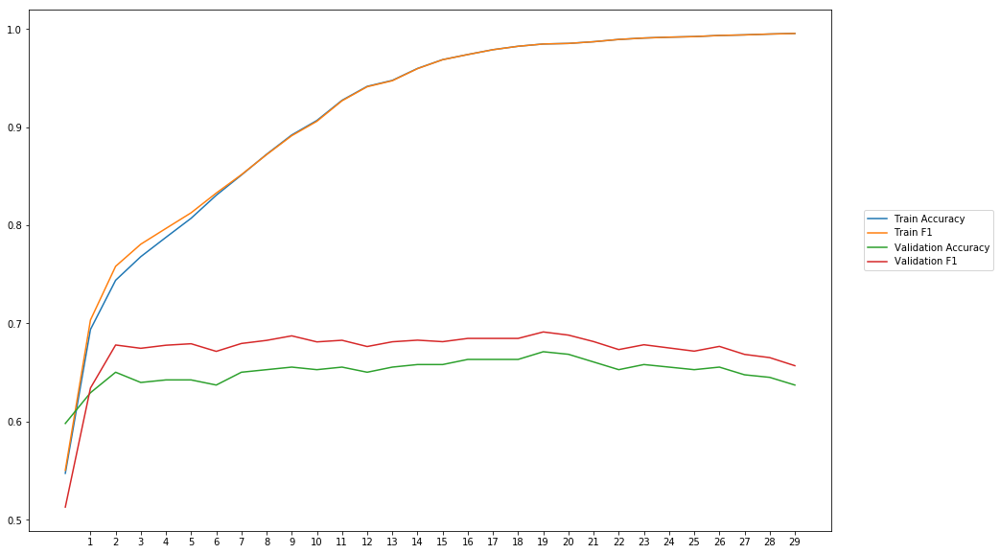

Average Accuracy: 65.07%
Average Precision: 63.17%
Average Recall: 71.99%
Average F1: 67.14%

-----Fold 10--------


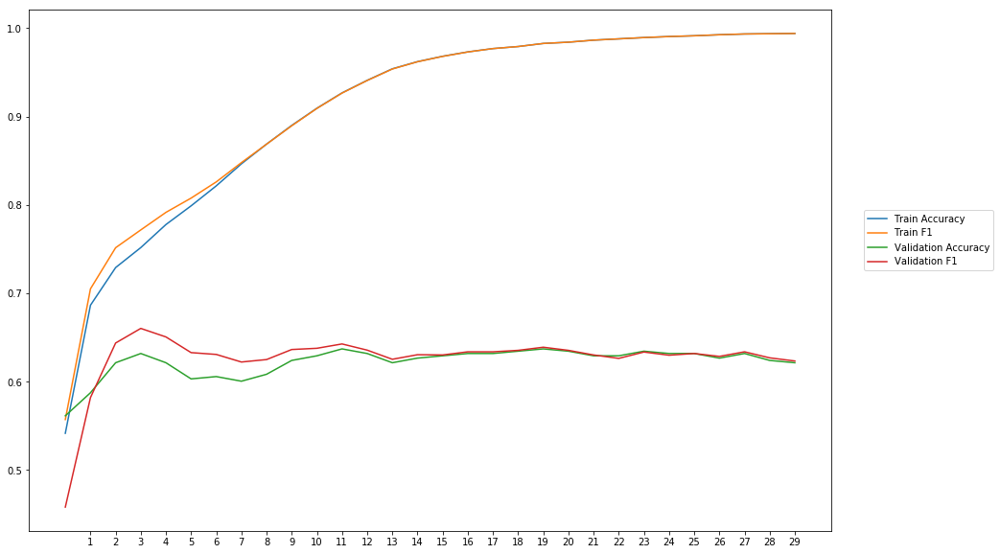

Average Accuracy: 62.24%
Average Precision: 61.78%
Average Recall: 63.79%
Average F1: 62.62%

-------Overallresults-------


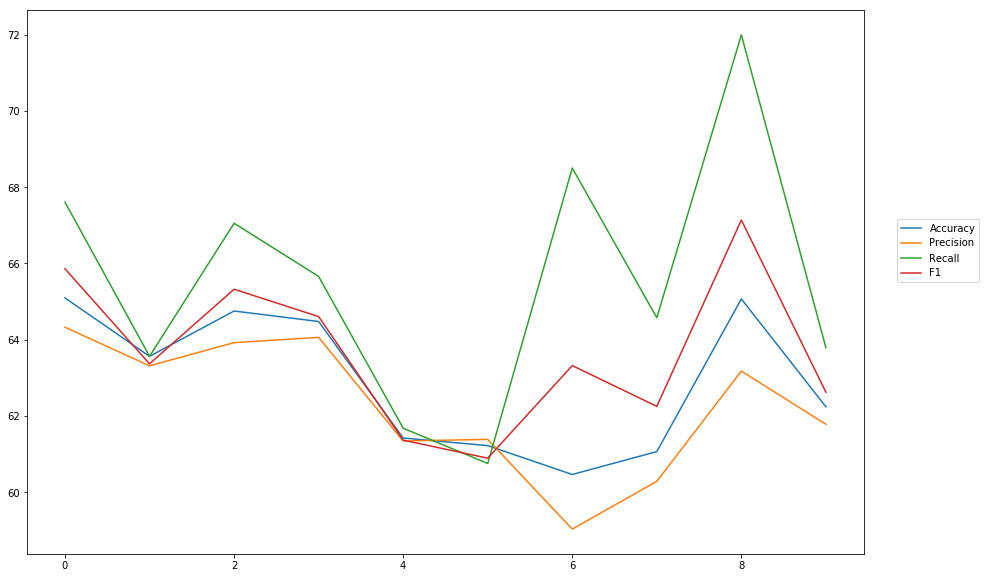

Accuracy: Mean = 62.93% (+/- 1.75%), Max = 65.09%, Min =  60.46%
Precision: Mean = 62.26% (+/- 1.68%), Max = 64.32%, Min =  59.03%
Recall: Mean = 65.51% (+/- 3.20%), Max = 71.99%, Min =  60.75%
F1: Mean = 63.67% (+/- 1.92%), Max = 67.14%, Min =  60.89%


In [33]:
cross_val_two_inputs(model_12, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_vadar, train_labels, softmax, outputpath, 'separat_models_senti_blob')

## Separate models combine output

### average

In [12]:
#First model
wv_layer_13 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_13 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_13 = wv_layer_13(comment_input_13)
x_first_13 = Dense(600, activation='relu')(embedded_sequences_13)
x_first_13 = Flatten()(x_first_13)
first_preds_13 = Dense(2, activation='softmax')(x_first_13)

#Second model
senti_input_13 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_13 = Dense(600, activation='relu')(senti_input_13)
second_preds_13 = Dense(2, activation='softmax')(x_second_13)

#Concat outputs
preds_13 = average([first_preds_13, second_preds_13])

model_13 = Model(inputs=[comment_input_13, senti_input_13], outputs=preds_13)
model_13.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_3 (Embedding)         (None, 40, 300)      4118700     input_5[0][0]                    
__________________________________________________________________________________________________
dense_8 (Dense)                 (None, 40, 600)      180600      embedding_3[0][0]                
__________________________________________________________________________________________________
input_6 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
flatten_3 


-----Fold 1--------


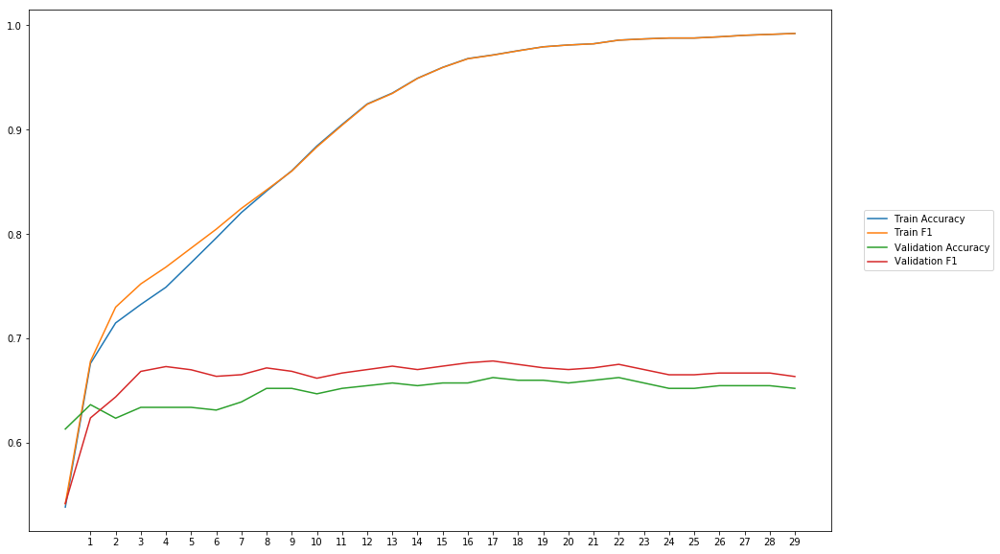

Average Accuracy: 64.88%
Average Precision: 63.61%
Average Recall: 69.50%
Average F1: 66.28%

-----Fold 2--------


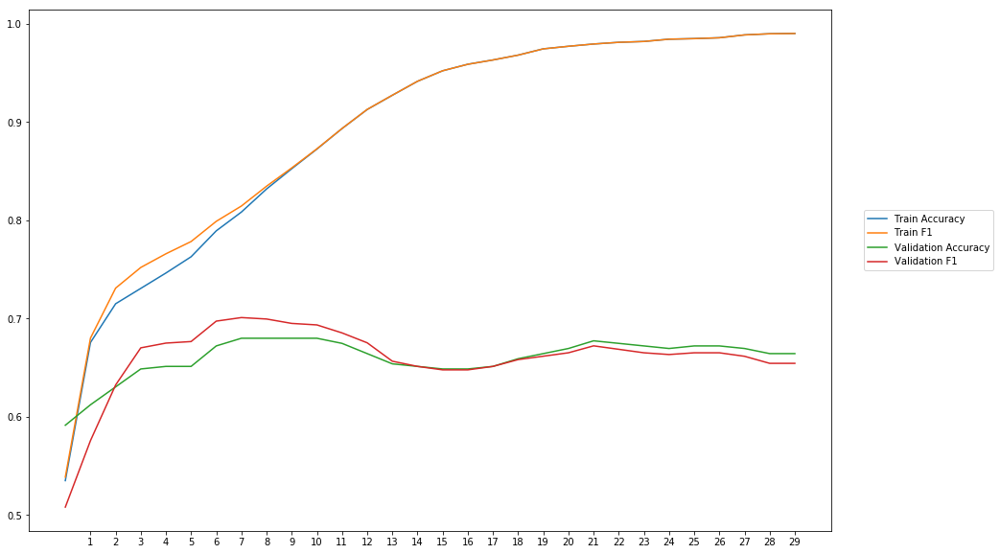

Average Accuracy: 65.97%
Average Precision: 65.53%
Average Recall: 66.75%
Average F1: 65.96%

-----Fold 3--------


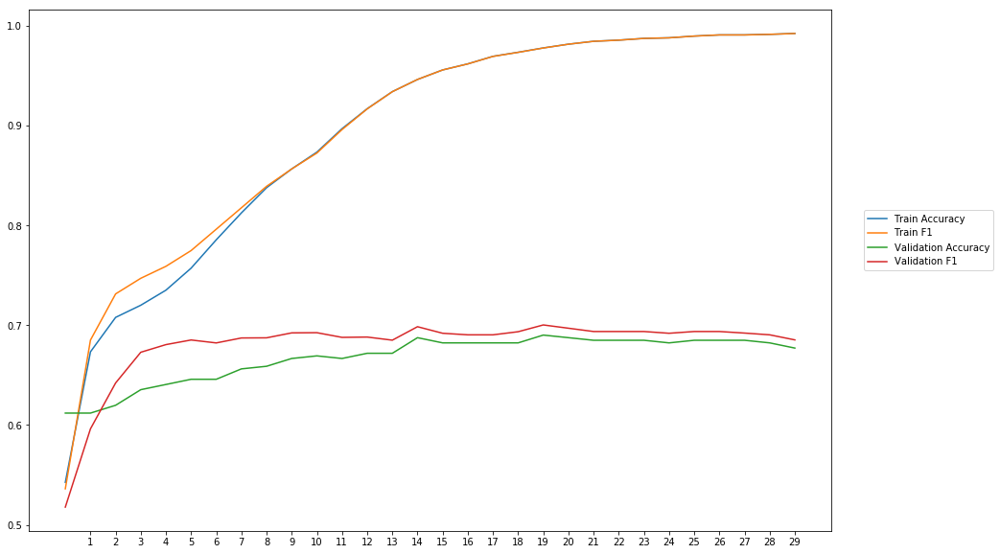

Average Accuracy: 66.73%
Average Precision: 65.24%
Average Recall: 71.40%
Average F1: 67.96%

-----Fold 4--------


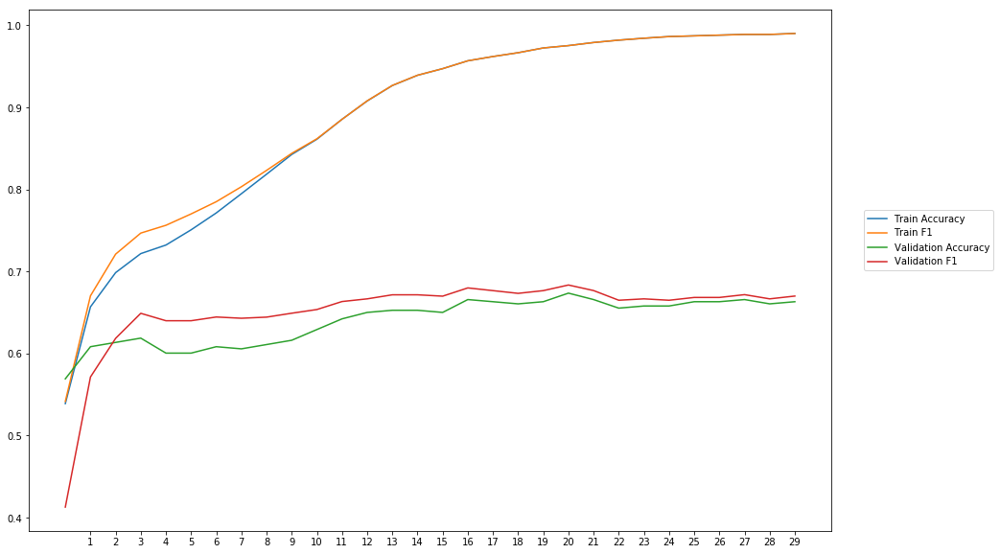

Average Accuracy: 64.03%
Average Precision: 63.06%
Average Recall: 67.92%
Average F1: 65.06%

-----Fold 5--------


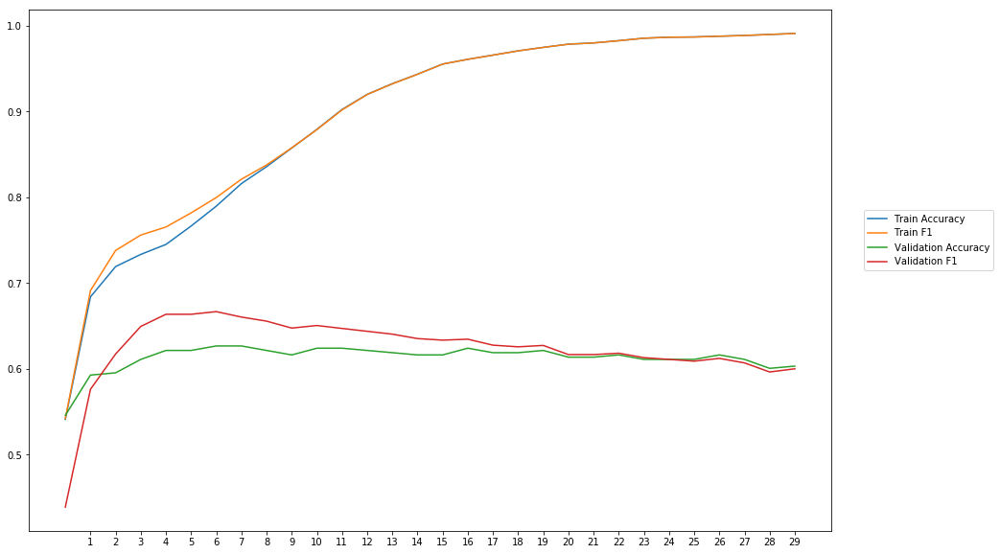

Average Accuracy: 61.30%
Average Precision: 60.42%
Average Recall: 64.89%
Average F1: 62.35%

-----Fold 6--------


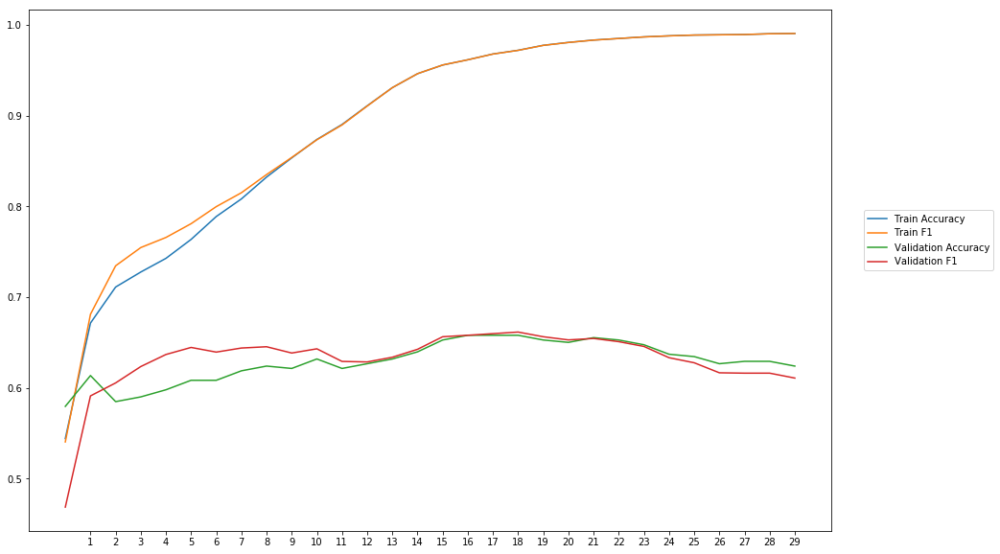

Average Accuracy: 62.88%
Average Precision: 62.64%
Average Recall: 64.03%
Average F1: 63.10%

-----Fold 7--------


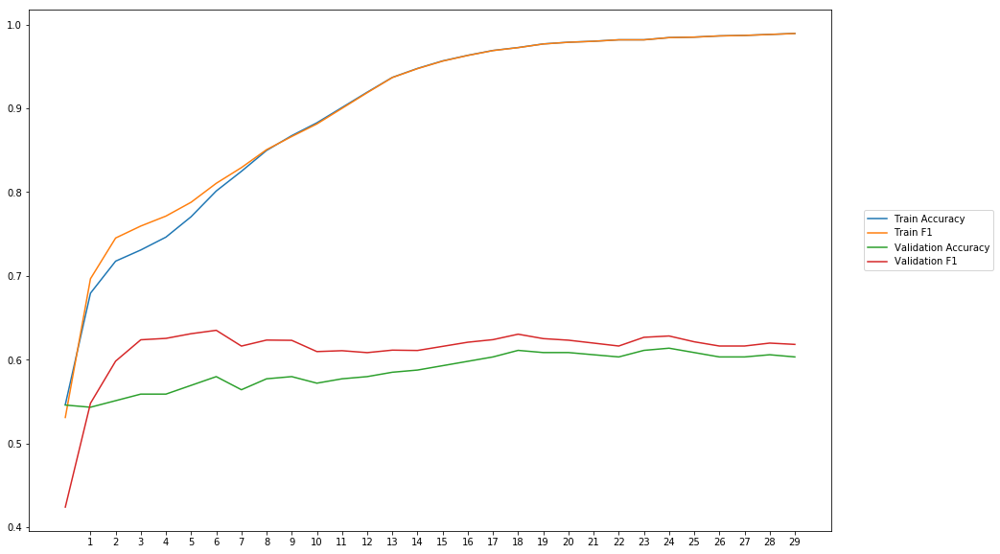

Average Accuracy: 58.69%
Average Precision: 57.67%
Average Recall: 65.46%
Average F1: 61.06%

-----Fold 8--------


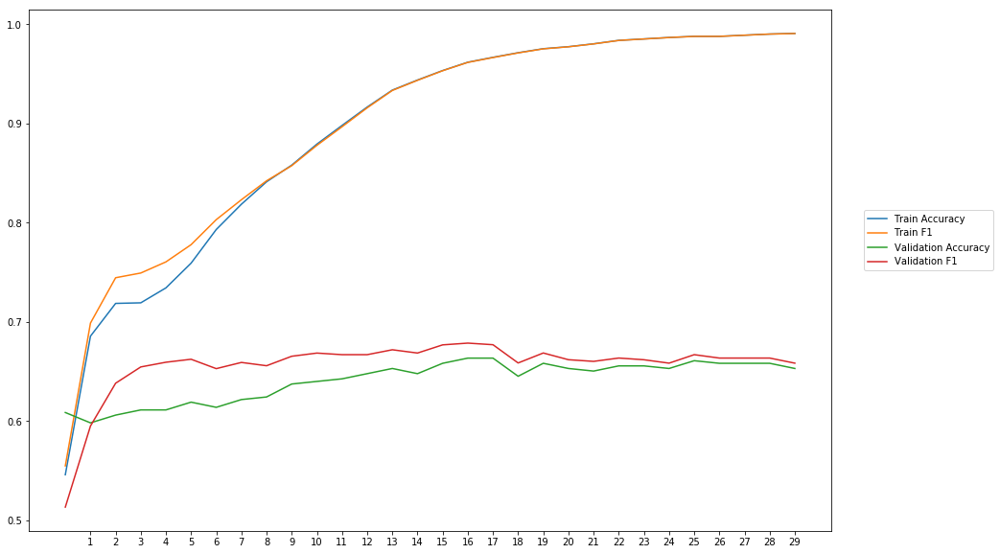

Average Accuracy: 64.06%
Average Precision: 62.90%
Average Recall: 68.99%
Average F1: 65.57%

-----Fold 9--------


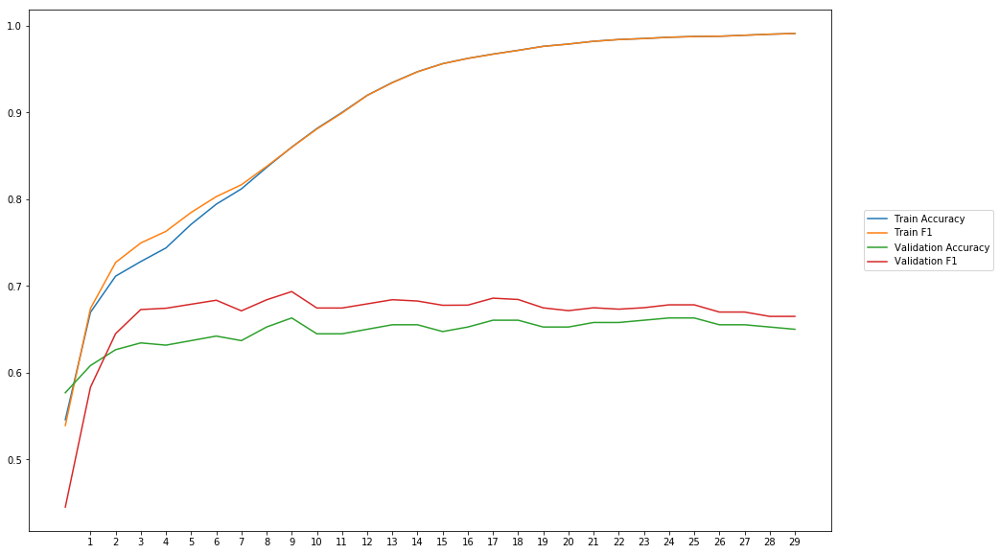

Average Accuracy: 64.68%
Average Precision: 62.97%
Average Recall: 71.13%
Average F1: 66.50%

-----Fold 10--------


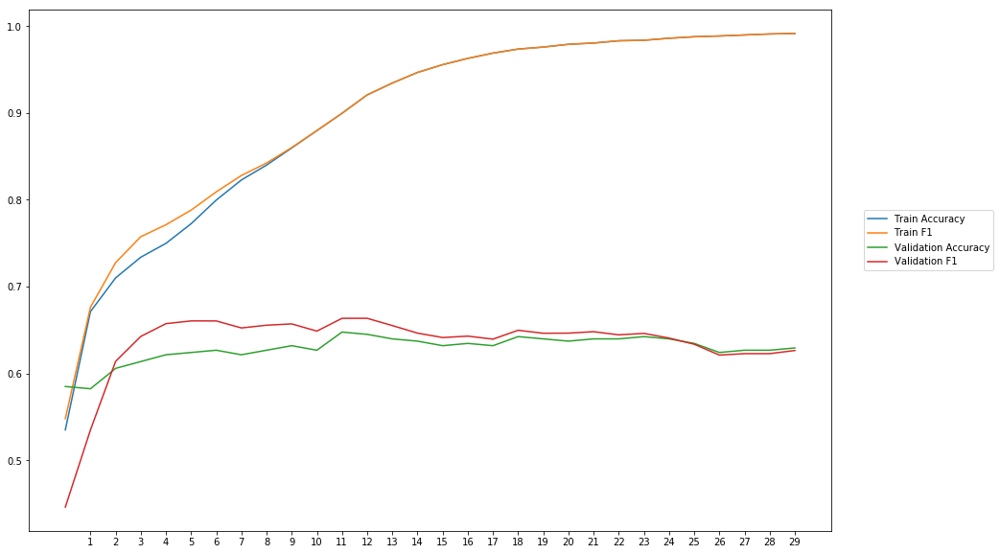

Average Accuracy: 62.85%
Average Precision: 62.26%
Average Recall: 65.31%
Average F1: 63.42%

-------Overallresults-------


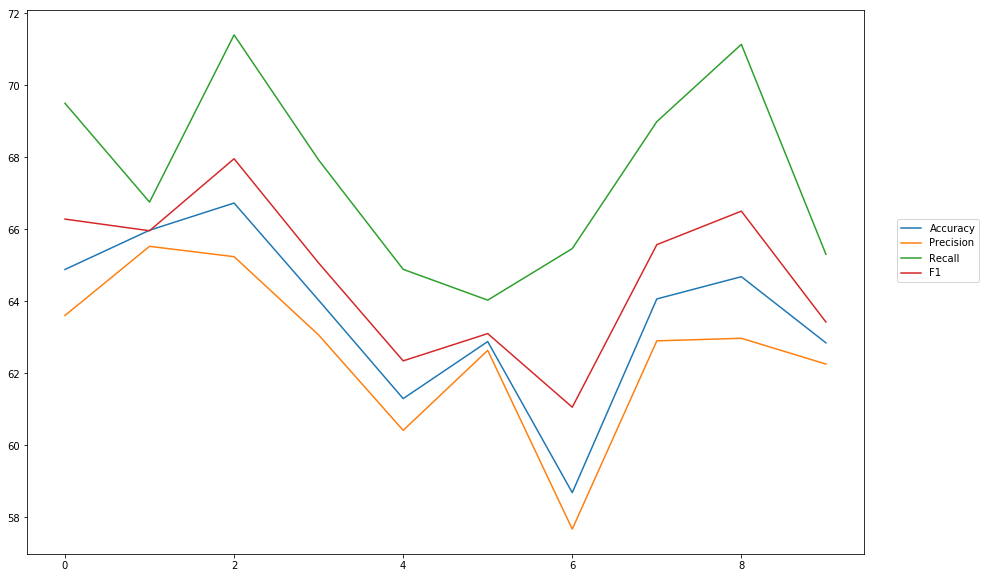

Accuracy: Mean = 63.61% (+/- 2.22%), Max = 66.73%, Min =  58.69%
Precision: Mean = 62.63% (+/- 2.15%), Max = 65.53%, Min =  57.67%
Recall: Mean = 67.54% (+/- 2.51%), Max = 71.40%, Min =  64.03%
F1: Mean = 64.73% (+/- 2.04%), Max = 67.96%, Min =  61.06%


In [35]:
cross_val_two_inputs(model_13, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_vadar, train_labels, softmax, outputpath, 'combined_outputs_senti_vadar')

# Combined Blob and Vadar

## Combine Inputs

In [11]:
#Input Words
wv_layer_14 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_14 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_14 = wv_layer_14(comment_input_14)
embedded_sequences_14 = Flatten()(embedded_sequences_14)

#Input Senti
senti_input_14_blob = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
senti_input_14_vadar = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')

#Concat Inputs
concat_14 = concatenate([embedded_sequences_14, senti_input_14_blob, senti_input_14_vadar], axis=1)

x_14 = Dense(600, activation='relu')(concat_14)
preds_14 = Dense(2, activation='softmax')(x_14)

# build the model
model_14 = Model(inputs=[comment_input_14, senti_input_14_blob, senti_input_14_vadar], outputs=preds_14)
model_14.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 40, 300)      4118700     input_4[0][0]                    
__________________________________________________________________________________________________
flatten_2 (Flatten)             (None, 12000)        0           embedding_2[0][0]                
__________________________________________________________________________________________________
input_5 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
input_6 (I

Instructions for updating:
Use tf.cast instead.

-----Fold 1--------


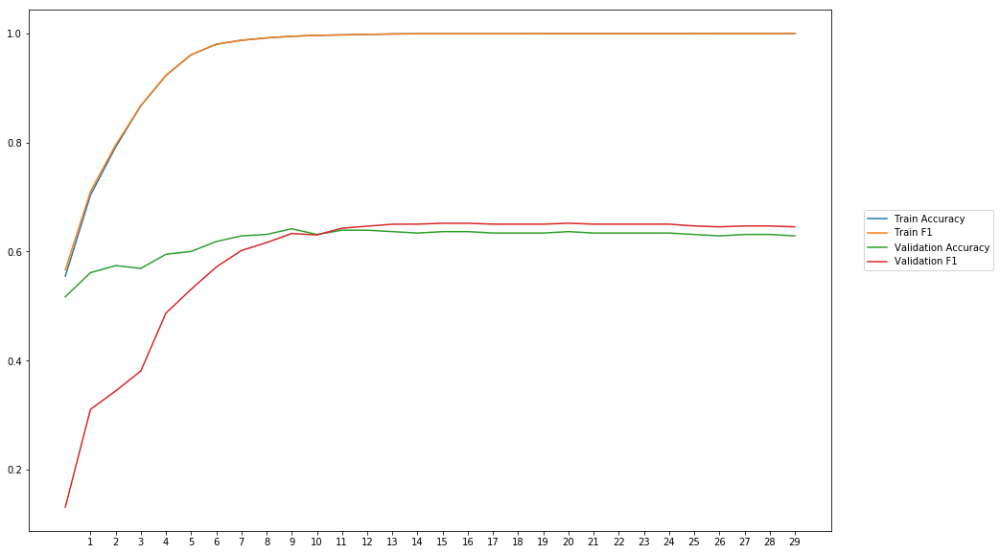

Average Accuracy: 62.03%
Average Precision: 63.66%
Average Recall: 57.99%
Average F1: 58.54%

-----Fold 2--------


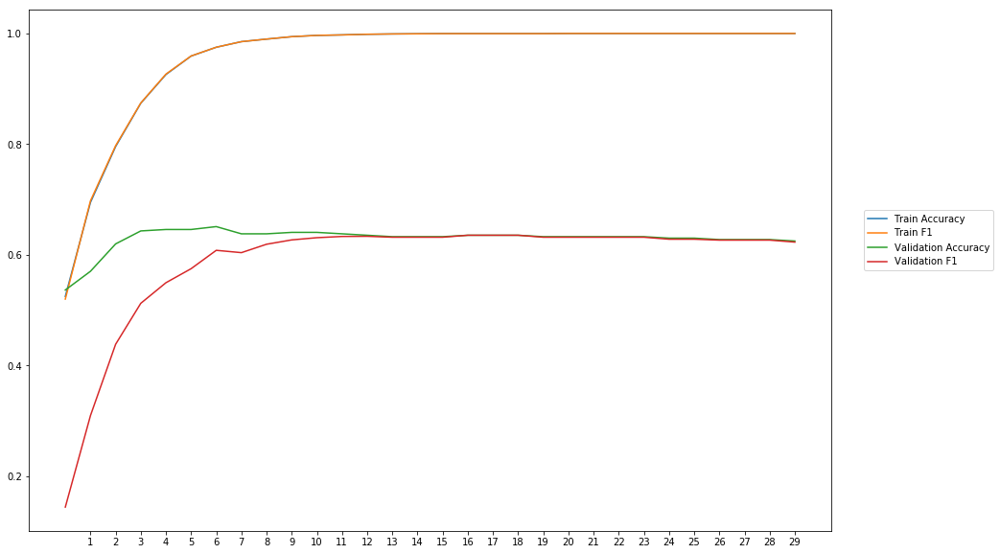

Average Accuracy: 62.93%
Average Precision: 66.66%
Average Recall: 55.97%
Average F1: 58.69%

-----Fold 3--------


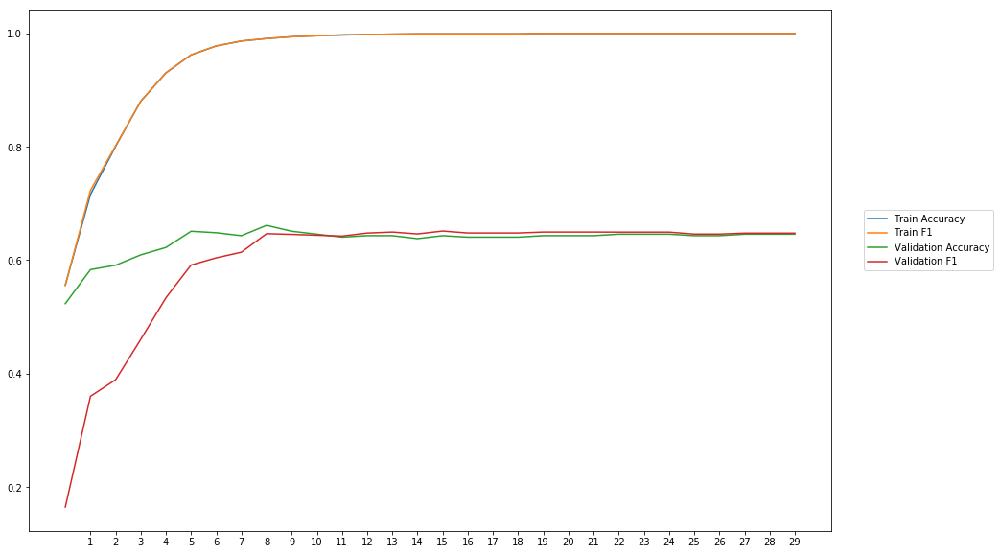

Average Accuracy: 63.51%
Average Precision: 65.69%
Average Recall: 58.12%
Average F1: 59.89%

-----Fold 4--------


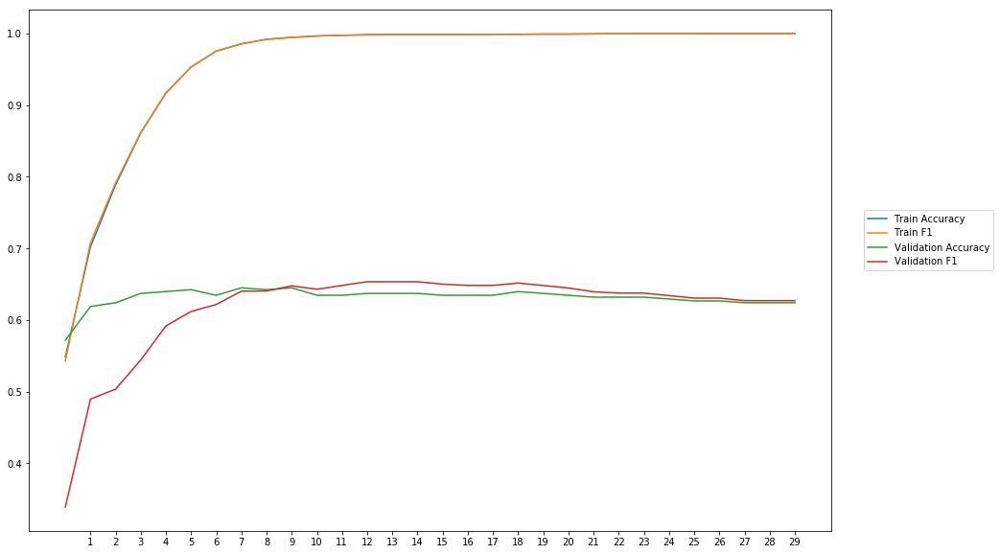

Average Accuracy: 63.15%
Average Precision: 64.46%
Average Recall: 60.77%
Average F1: 61.54%

-----Fold 5--------


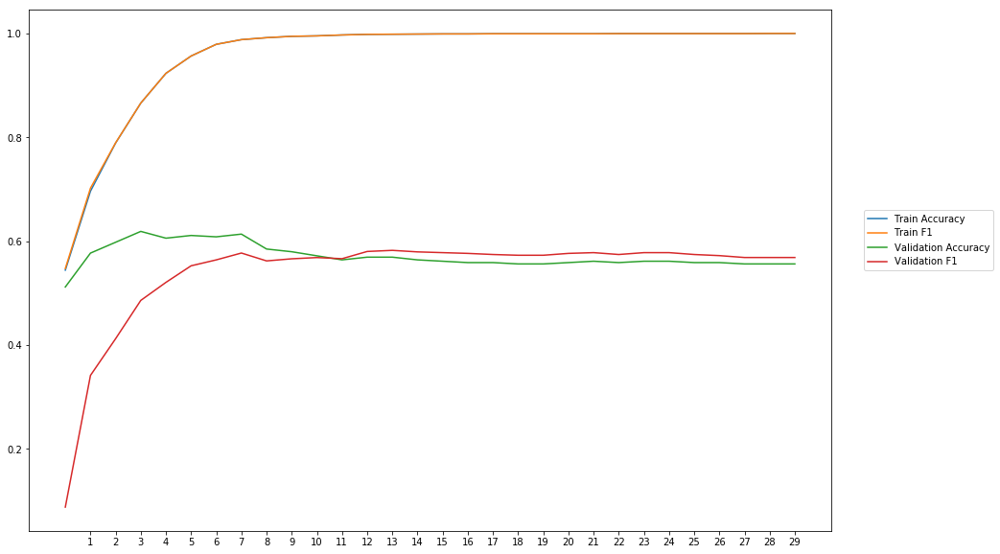

Average Accuracy: 57.08%
Average Precision: 59.27%
Average Recall: 52.76%
Average F1: 53.86%

-----Fold 6--------


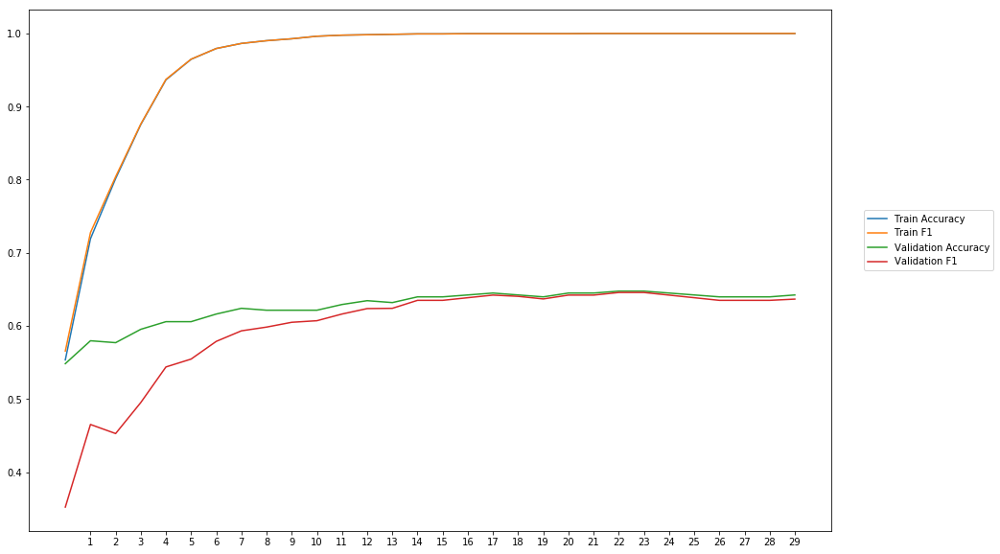

Average Accuracy: 62.65%
Average Precision: 64.06%
Average Recall: 57.02%
Average F1: 59.78%

-----Fold 7--------


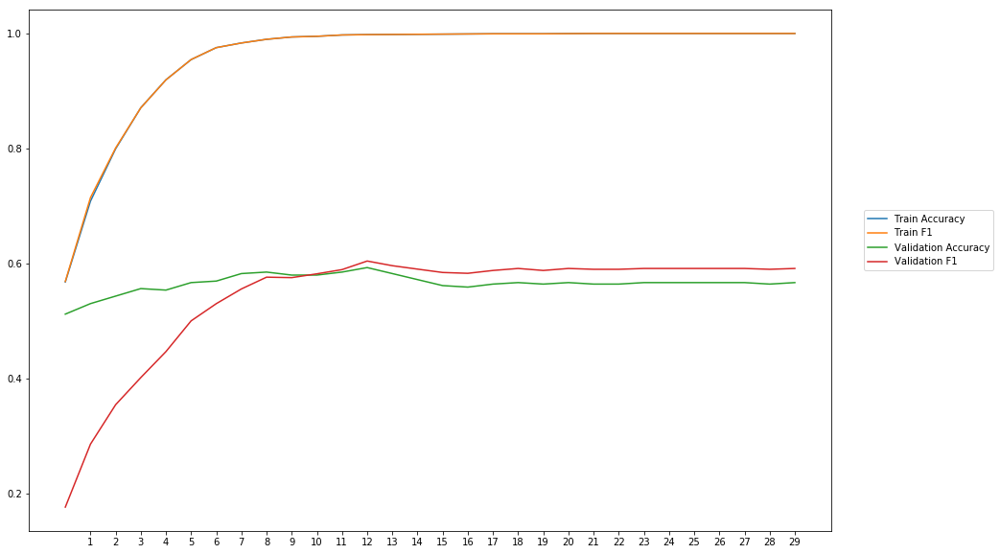

Average Accuracy: 56.54%
Average Precision: 57.02%
Average Recall: 54.07%
Average F1: 54.01%

-----Fold 8--------


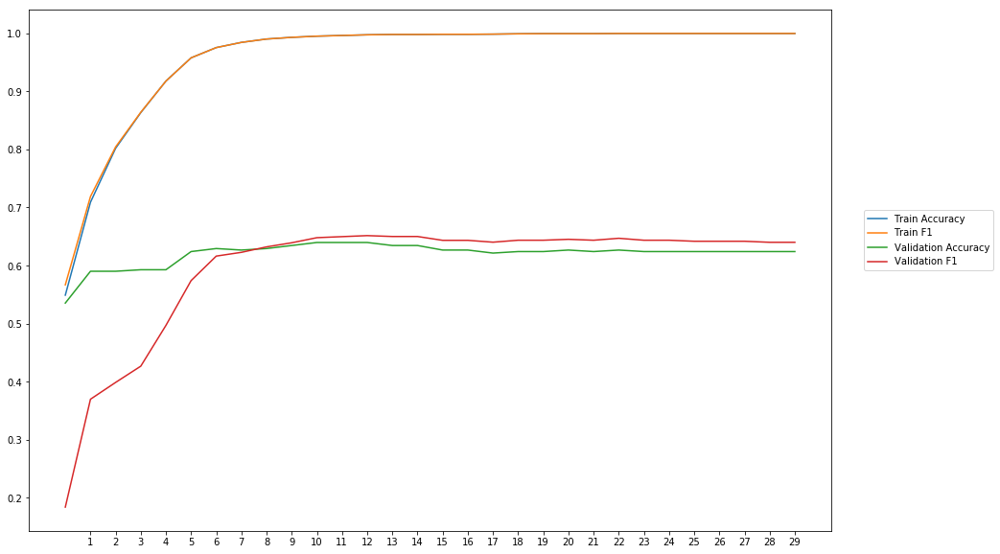

Average Accuracy: 62.00%
Average Precision: 63.76%
Average Recall: 59.56%
Average F1: 59.50%

-----Fold 9--------


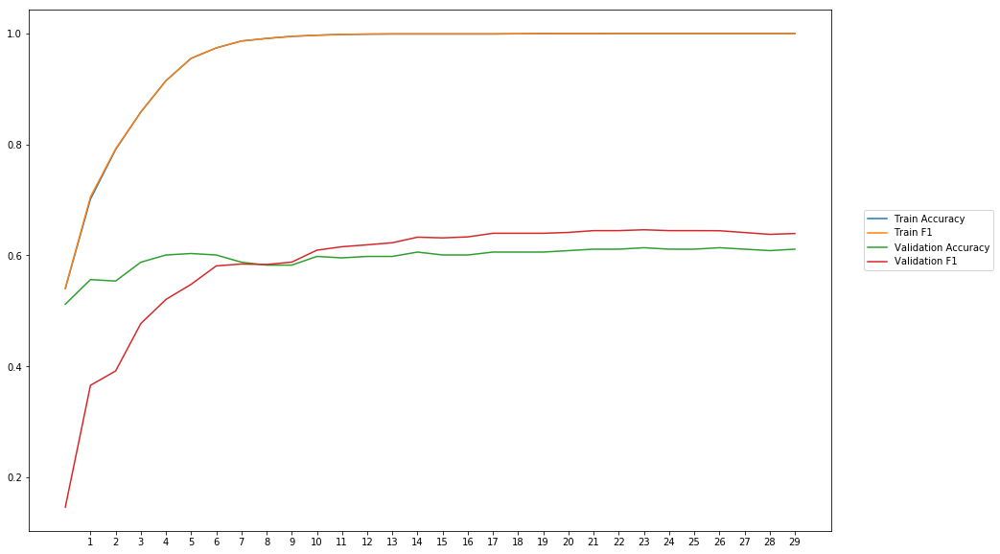

Average Accuracy: 59.63%
Average Precision: 59.69%
Average Recall: 60.05%
Average F1: 58.31%

-----Fold 10--------


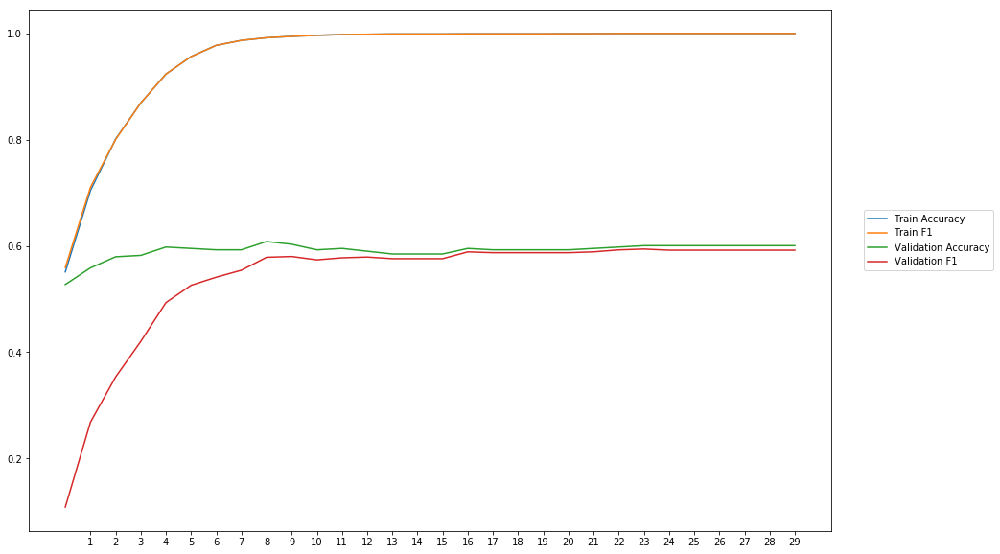

Average Accuracy: 59.11%
Average Precision: 62.80%
Average Recall: 50.63%
Average F1: 53.83%

-------Overallresults-------


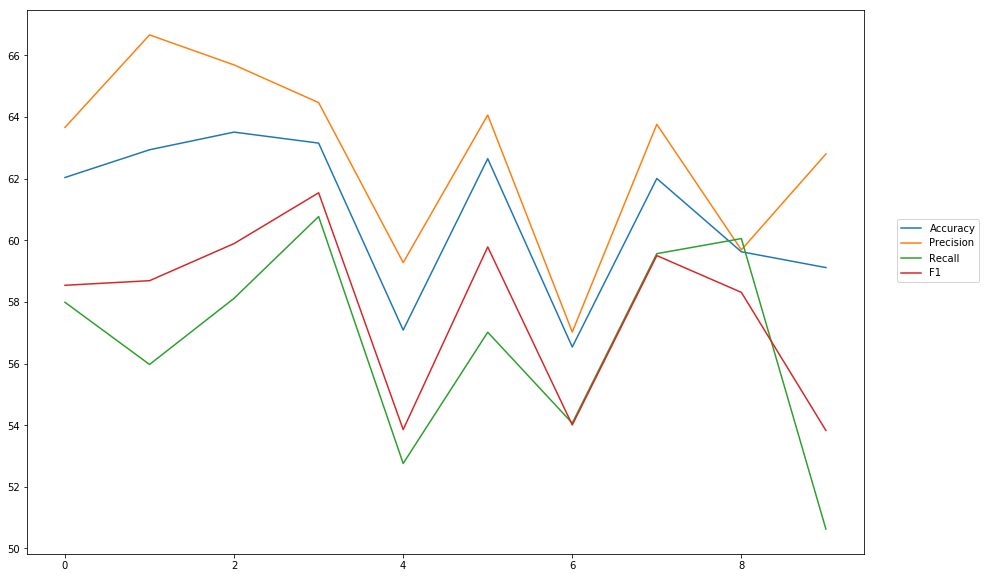

Accuracy: Mean = 60.86% (+/- 2.45%), Max = 63.51%, Min =  56.54%
Precision: Mean = 62.71% (+/- 2.91%), Max = 66.66%, Min =  57.02%
Recall: Mean = 56.69% (+/- 3.16%), Max = 60.77%, Min =  50.63%
F1: Mean = 57.79% (+/- 2.69%), Max = 61.54%, Min =  53.83%


In [13]:
cross_val_three_inputs(model_14, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_senti_vadar, train_labels, softmax, outputpath, 'combined_input_senti_blob_vadar')

## Seperate Models combine results

In [11]:
#First part
wv_layer_15 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_15 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_15 = wv_layer_15(comment_input_15)
x_first_15 = Dense(600, activation='relu')(embedded_sequences_15)
x_first_15 = Flatten()(x_first_15)

#Second part
senti_input_15_blob = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_15 = Dense(600, activation='relu')(senti_input_15_blob)

#Thrid part
senti_input_15_vadar = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_third_15 = Dense(600, activation='relu')(senti_input_15_vadar)

#Concatination
concat_15 = concatenate([x_first_15, x_second_15, x_third_15])

preds_15 = Dense(2, activation='softmax')(concat_15)

model_15 = Model(inputs=[comment_input_15, senti_input_15_blob, senti_input_15_vadar], outputs=preds_15)
model_15.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 40, 300)      4118700     input_3[0][0]                    
__________________________________________________________________________________________________
dense_5 (Dense)                 (None, 40, 600)      180600      embedding_2[0][0]                
__________________________________________________________________________________________________
input_4 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
input_5 (I


-----Fold 1--------


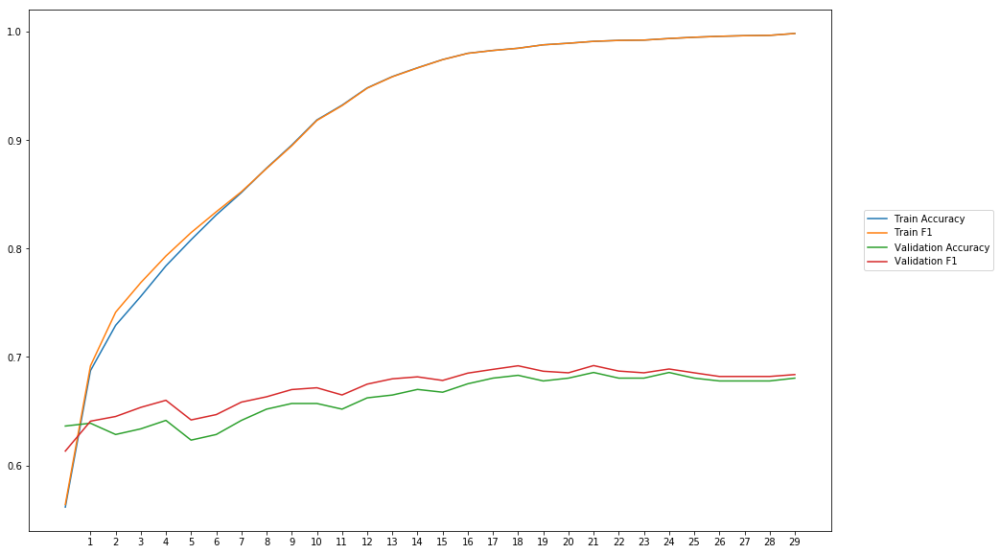

Average Accuracy: 66.27%
Average Precision: 65.30%
Average Recall: 69.22%
Average F1: 67.17%

-----Fold 2--------


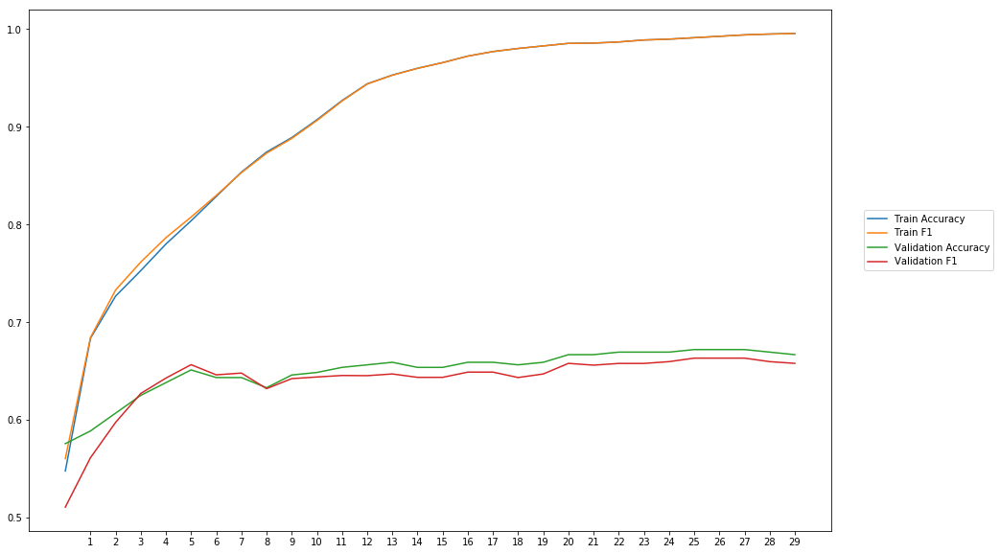

Average Accuracy: 65.00%
Average Precision: 65.41%
Average Recall: 62.83%
Average F1: 64.05%

-----Fold 3--------


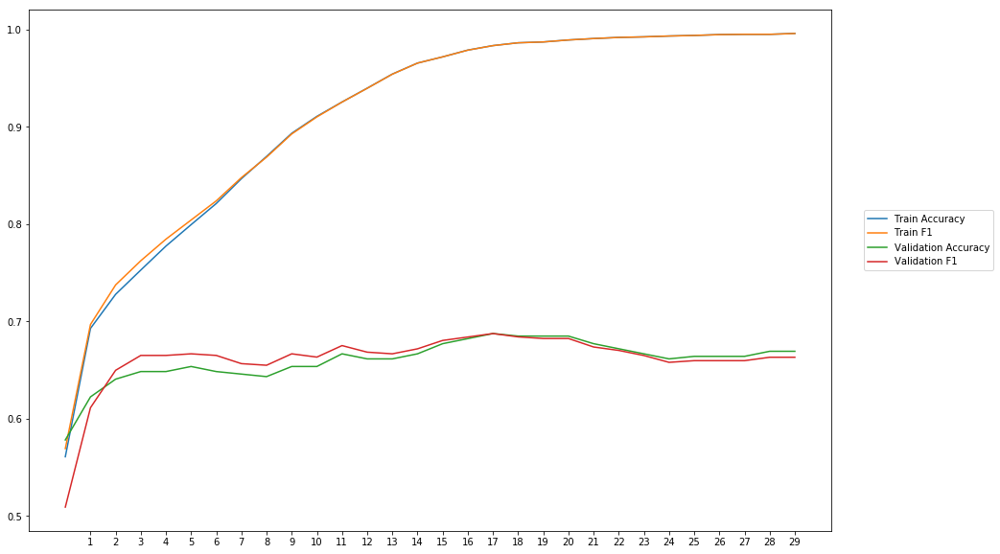

Average Accuracy: 66.01%
Average Precision: 65.52%
Average Recall: 66.84%
Average F1: 66.09%

-----Fold 4--------


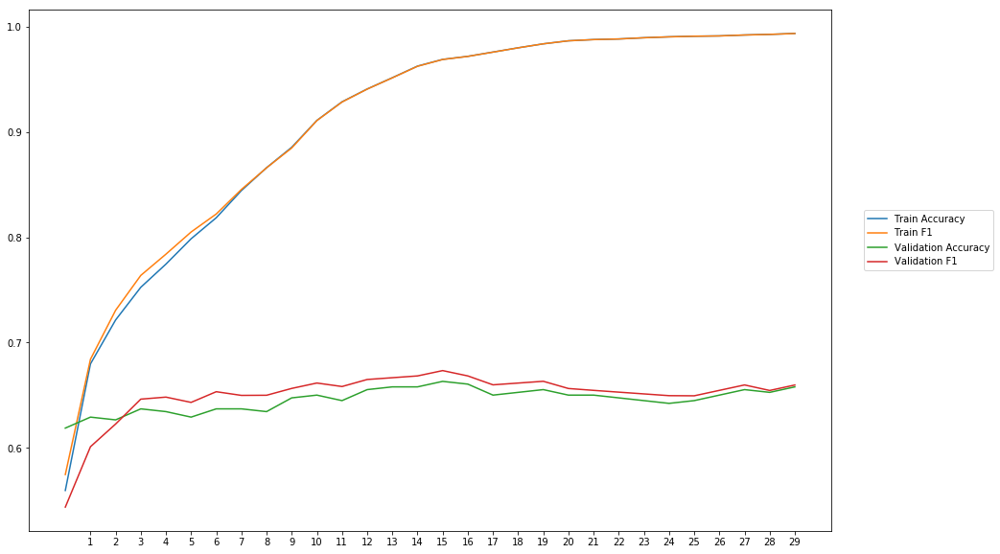

Average Accuracy: 64.59%
Average Precision: 64.06%
Average Recall: 66.23%
Average F1: 65.02%

-----Fold 5--------


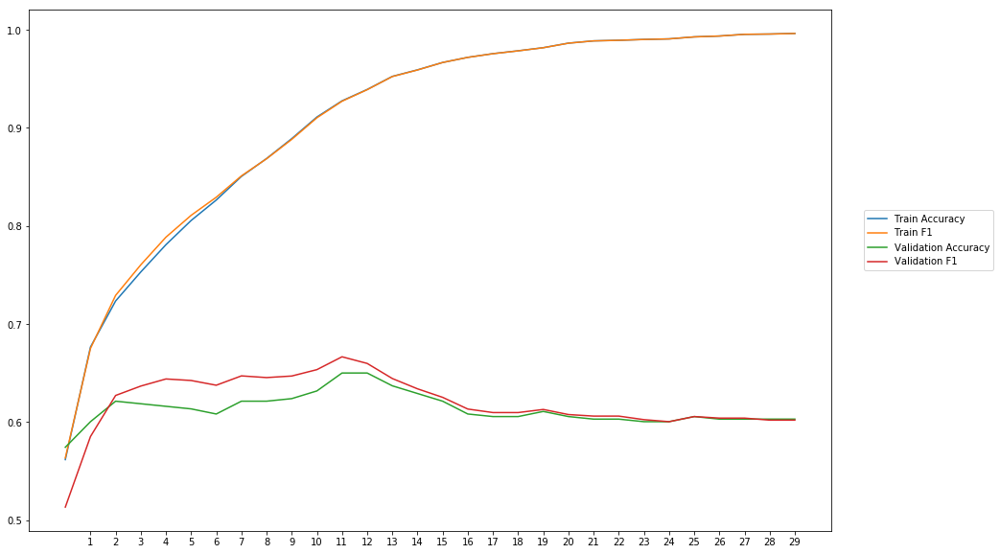

Average Accuracy: 61.34%
Average Precision: 60.74%
Average Recall: 63.51%
Average F1: 61.99%

-----Fold 6--------


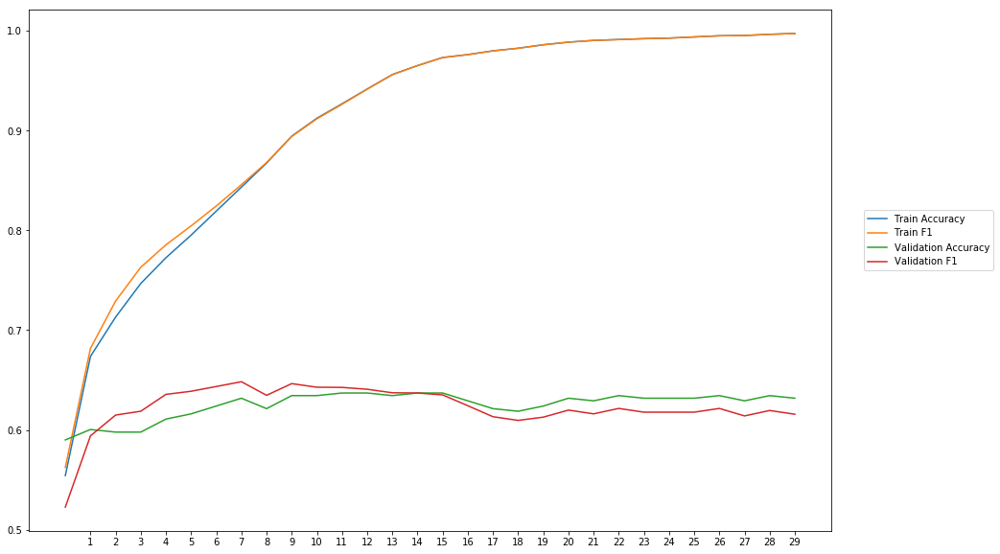

Average Accuracy: 62.52%
Average Precision: 62.58%
Average Recall: 62.18%
Average F1: 62.26%

-----Fold 7--------


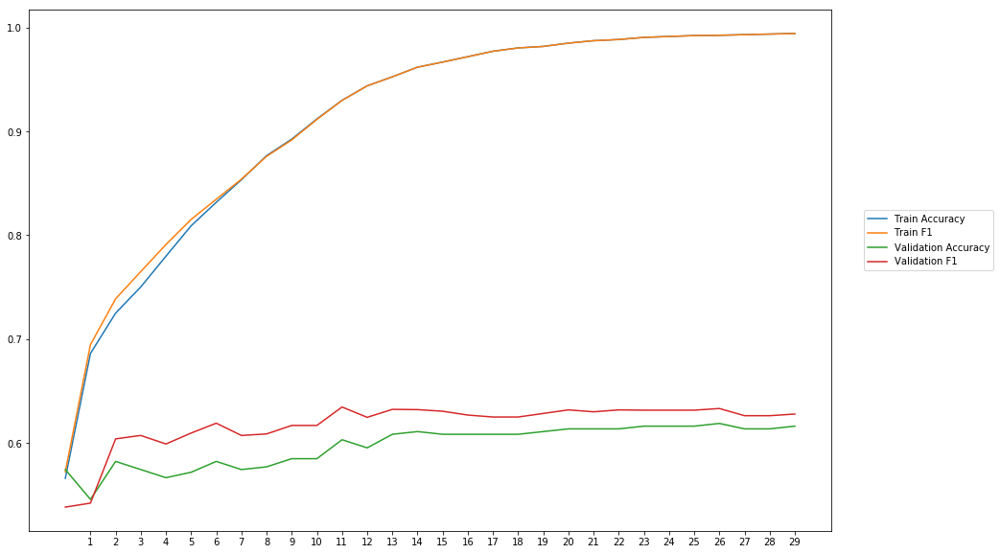

Average Accuracy: 59.77%
Average Precision: 58.73%
Average Recall: 65.27%
Average F1: 61.77%

-----Fold 8--------


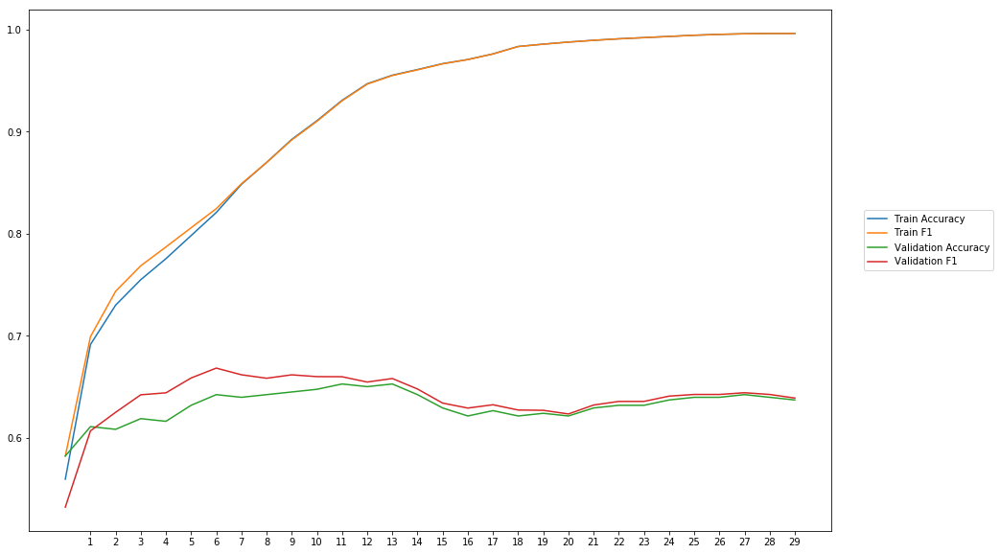

Average Accuracy: 63.19%
Average Precision: 62.50%
Average Recall: 65.50%
Average F1: 63.89%

-----Fold 9--------


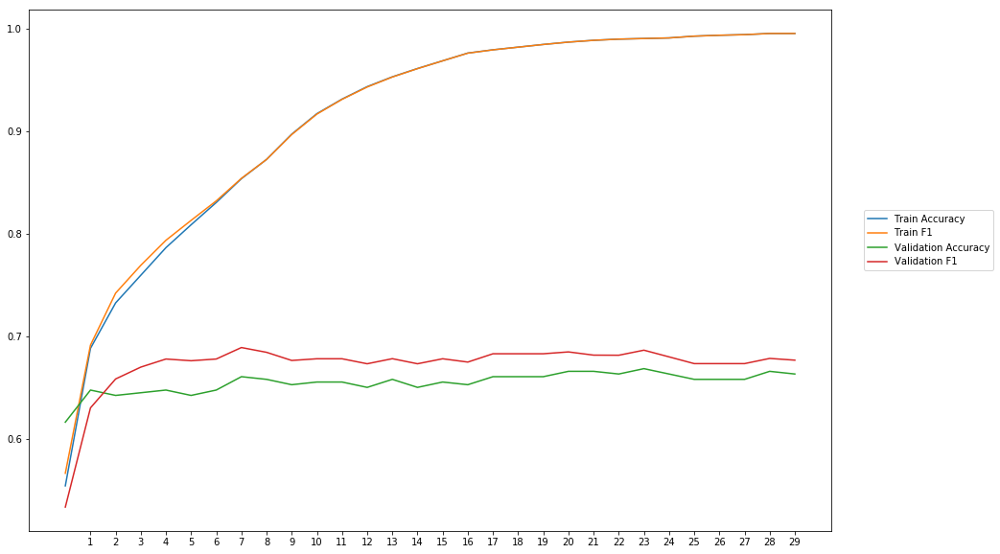

Average Accuracy: 65.49%
Average Precision: 63.91%
Average Recall: 71.12%
Average F1: 67.15%

-----Fold 10--------


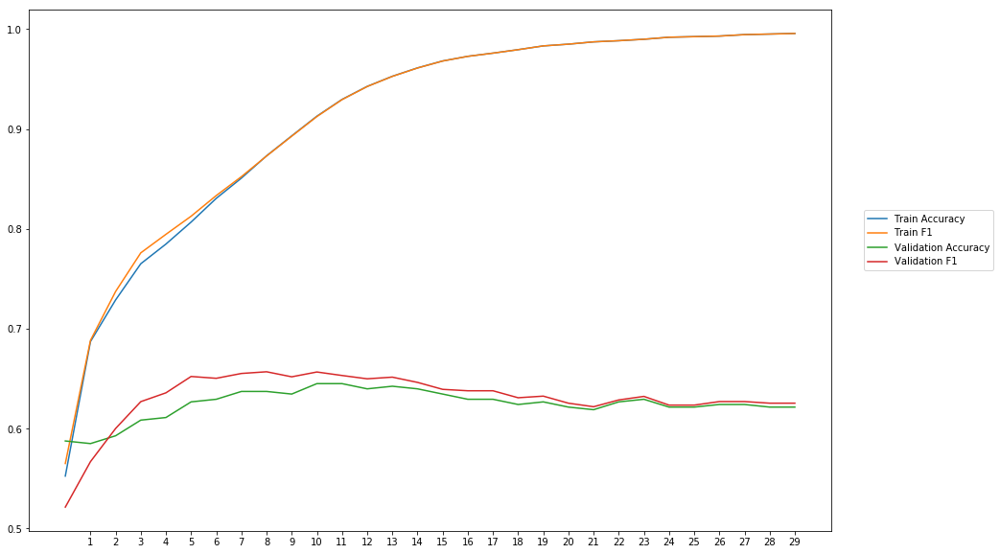

Average Accuracy: 62.45%
Average Precision: 61.85%
Average Recall: 64.45%
Average F1: 63.03%

-------Overallresults-------


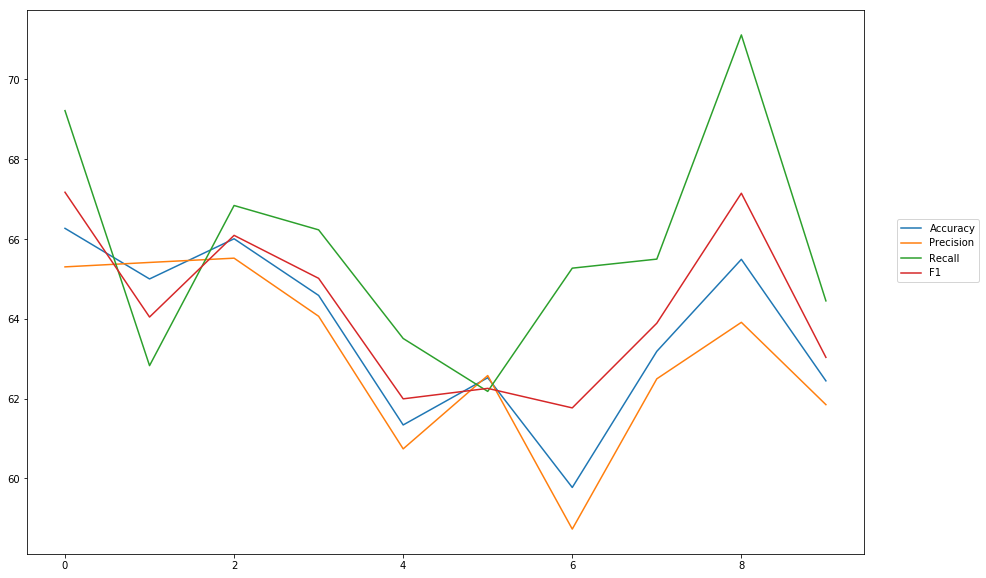

Accuracy: Mean = 63.66% (+/- 2.04%), Max = 66.27%, Min =  59.77%
Precision: Mean = 63.06% (+/- 2.11%), Max = 65.52%, Min =  58.73%
Recall: Mean = 65.71% (+/- 2.66%), Max = 71.12%, Min =  62.18%
F1: Mean = 64.24% (+/- 1.94%), Max = 67.17%, Min =  61.77%


In [16]:
cross_val_three_inputs(model_15, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_senti_vadar, train_labels, softmax, outputpath, 'separat_models_senti_blob_vadar')

## Separate models combine output

### average

In [18]:
#First model
wv_layer_16 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_16 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_16 = wv_layer_16(comment_input_16)
x_first_16 = Dense(600, activation='relu')(embedded_sequences_16)
x_first_16 = Flatten()(x_first_16)
first_preds_16 = Dense(2, activation='softmax')(x_first_16)

#Second model
senti_input_16_blob = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_16 = Dense(600, activation='relu')(senti_input_16_blob)
second_preds_16 = Dense(2, activation='softmax')(x_second_16)

#Thrid model
senti_input_16_vadar = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_third_16 = Dense(600, activation='relu')(senti_input_16_vadar)
third_preds_16 = Dense(2, activation='softmax')(x_third_16)

#Concat outputs
preds_16 = average([first_preds_16, second_preds_16, third_preds_16])

model_16 = Model(inputs=[comment_input_16, senti_input_16_blob, senti_input_16_vadar], outputs=preds_16)
model_16.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_16 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_6 (Embedding)         (None, 40, 300)      4118700     input_16[0][0]                   
__________________________________________________________________________________________________
dense_16 (Dense)                (None, 40, 600)      180600      embedding_6[0][0]                
__________________________________________________________________________________________________
input_17 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
input_18 (


-----Fold 1--------


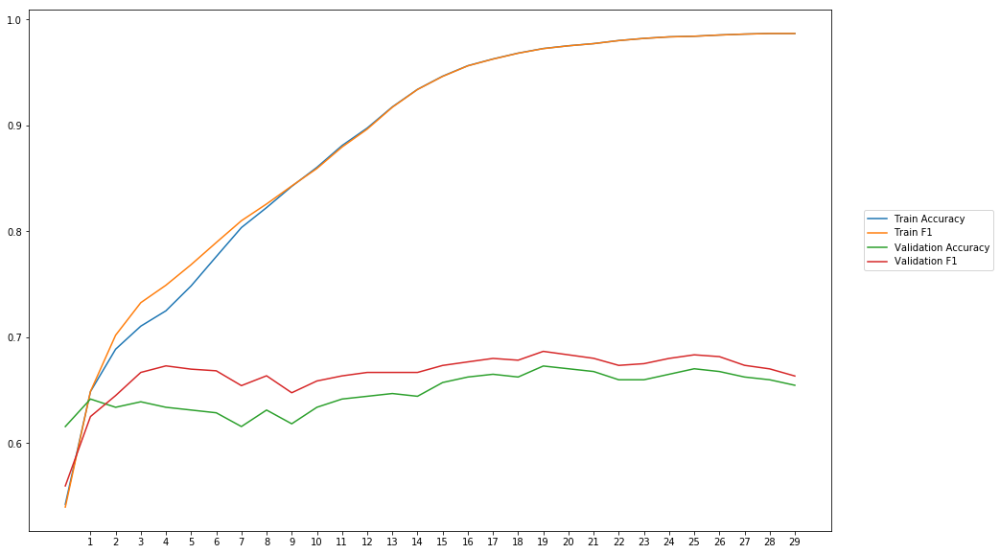

Average Accuracy: 64.85%
Average Precision: 63.43%
Average Recall: 70.19%
Average F1: 66.51%

-----Fold 2--------


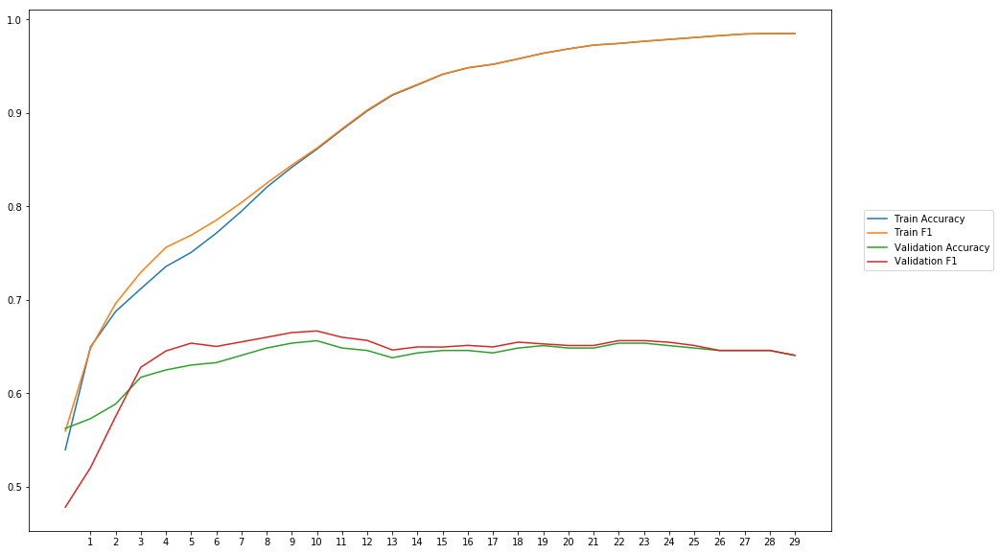

Average Accuracy: 63.73%
Average Precision: 63.10%
Average Recall: 64.96%
Average F1: 63.89%

-----Fold 3--------


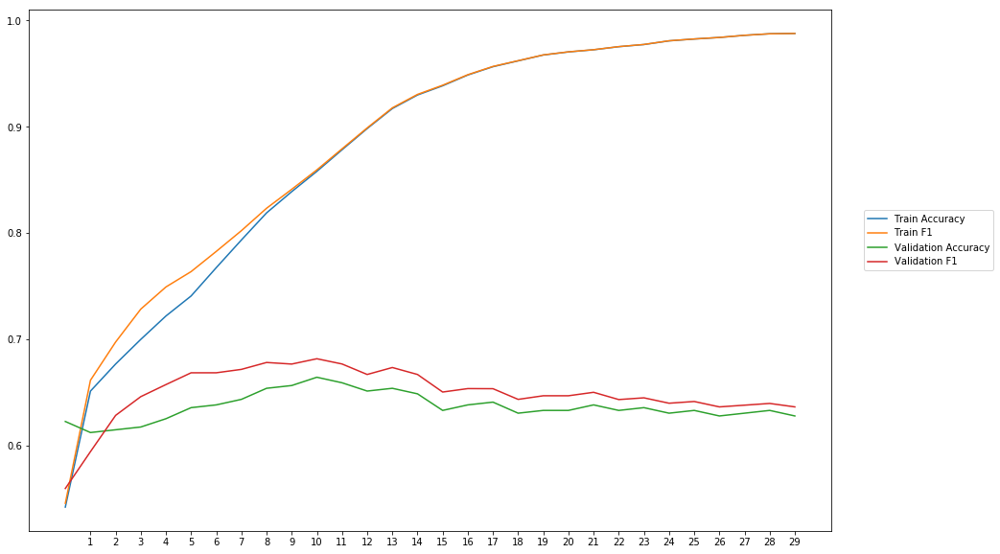

Average Accuracy: 63.63%
Average Precision: 62.39%
Average Recall: 67.91%
Average F1: 64.91%

-----Fold 4--------


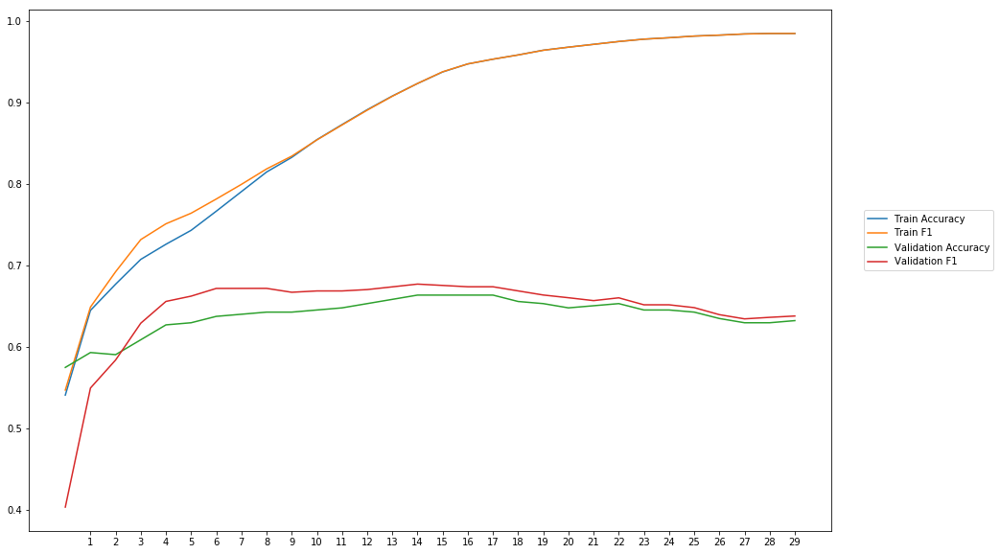

Average Accuracy: 63.85%
Average Precision: 63.06%
Average Recall: 66.79%
Average F1: 64.49%

-----Fold 5--------


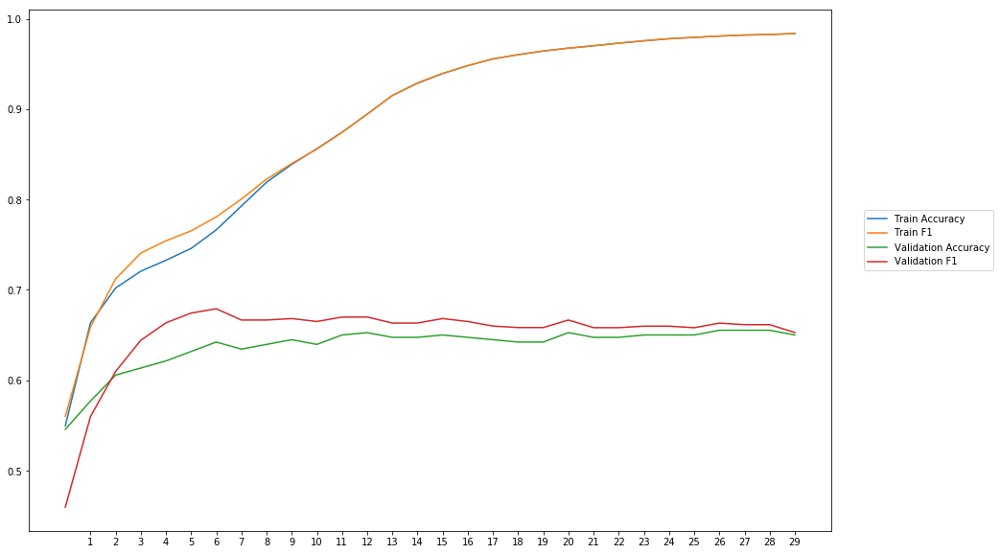

Average Accuracy: 63.79%
Average Precision: 62.50%
Average Recall: 68.29%
Average F1: 65.11%

-----Fold 6--------


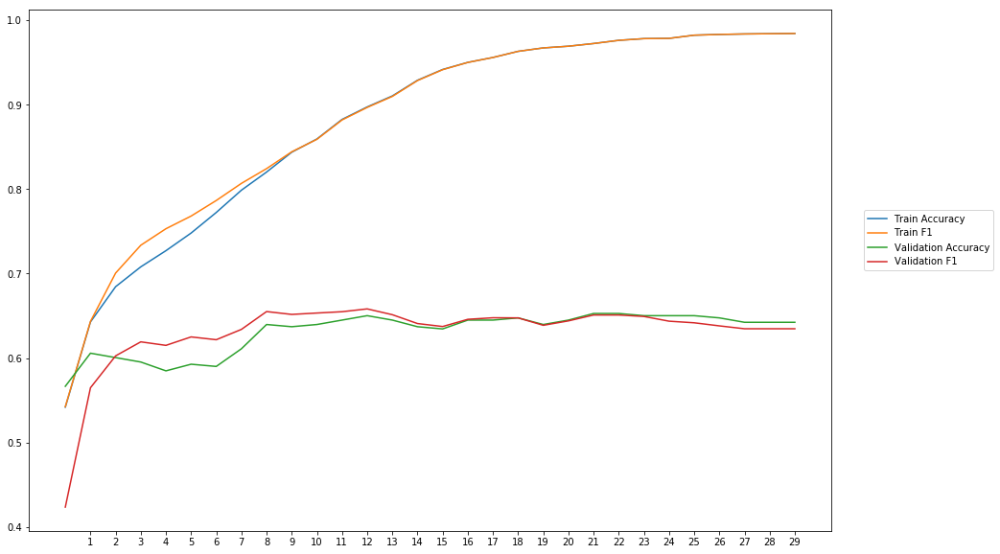

Average Accuracy: 63.09%
Average Precision: 62.97%
Average Recall: 63.63%
Average F1: 63.03%

-----Fold 7--------


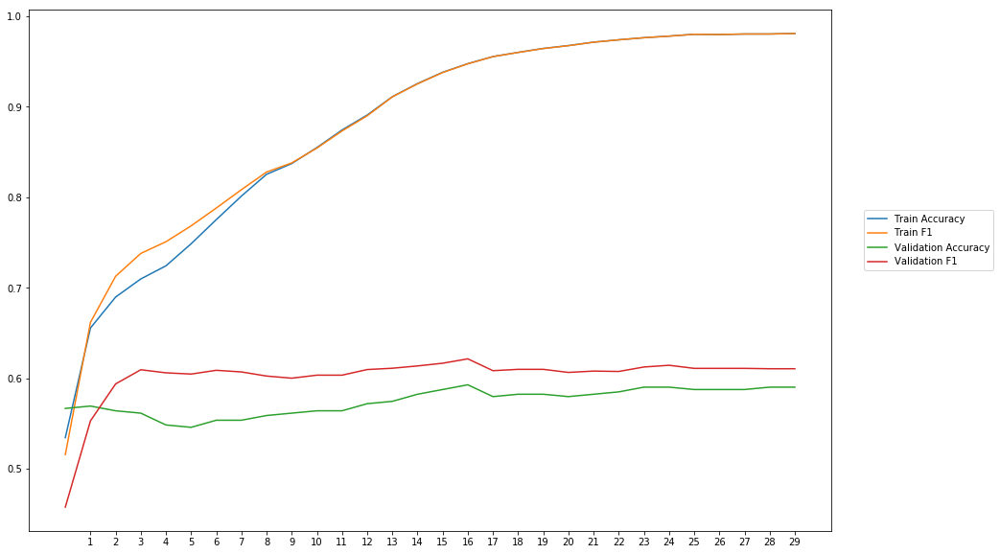

Average Accuracy: 57.44%
Average Precision: 56.52%
Average Recall: 64.83%
Average F1: 60.17%

-----Fold 8--------


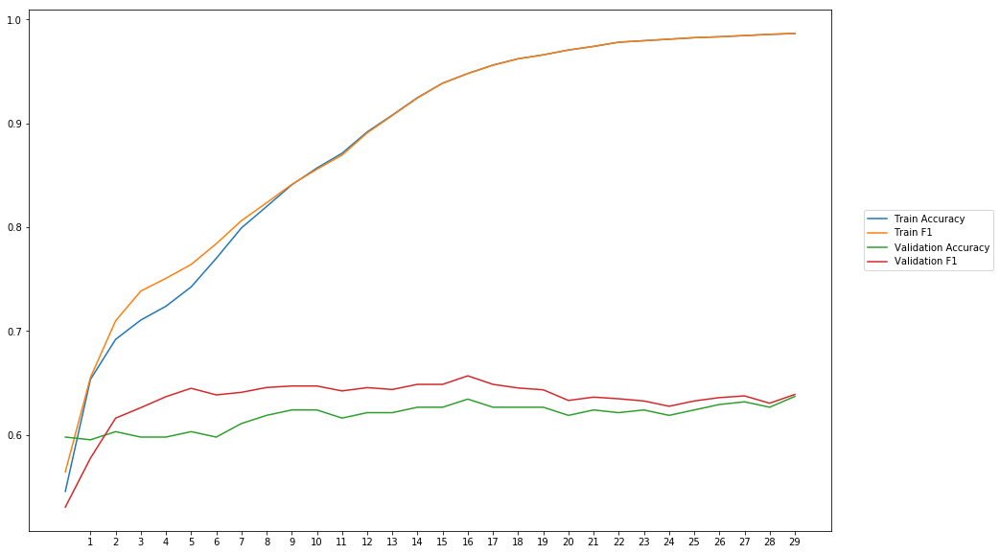

Average Accuracy: 61.85%
Average Precision: 60.82%
Average Recall: 66.47%
Average F1: 63.38%

-----Fold 9--------


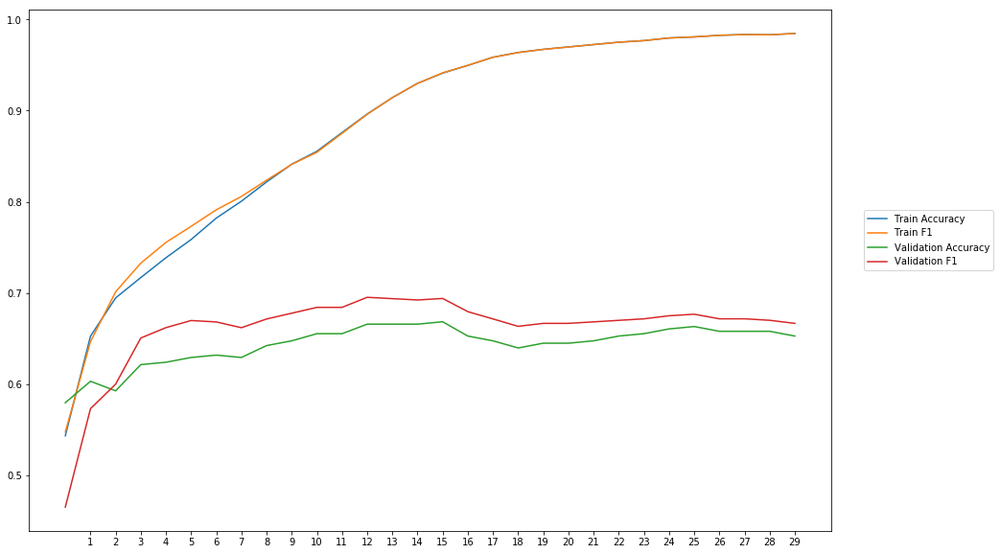

Average Accuracy: 64.38%
Average Precision: 62.76%
Average Recall: 70.40%
Average F1: 66.11%

-----Fold 10--------


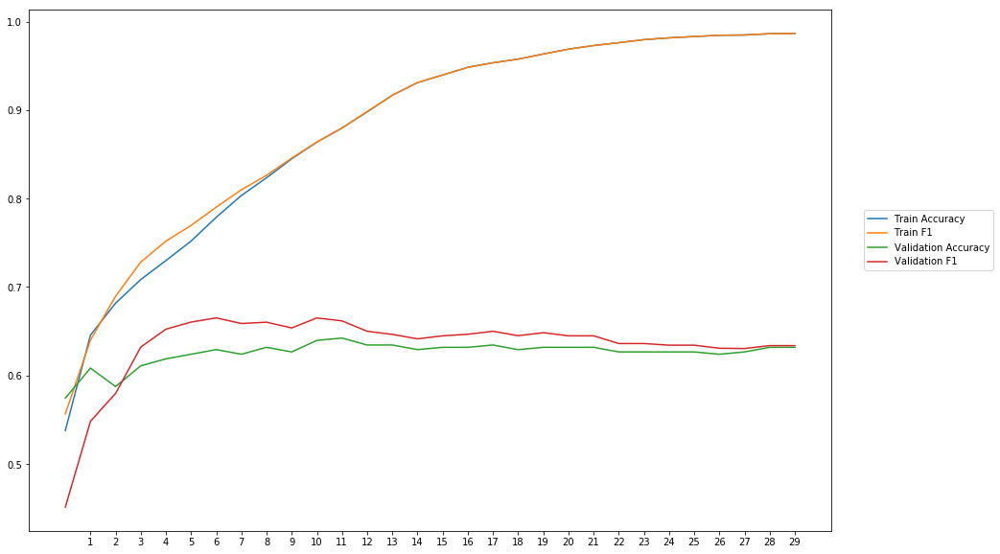

Average Accuracy: 62.53%
Average Precision: 61.74%
Average Recall: 65.78%
Average F1: 63.40%

-------Overallresults-------


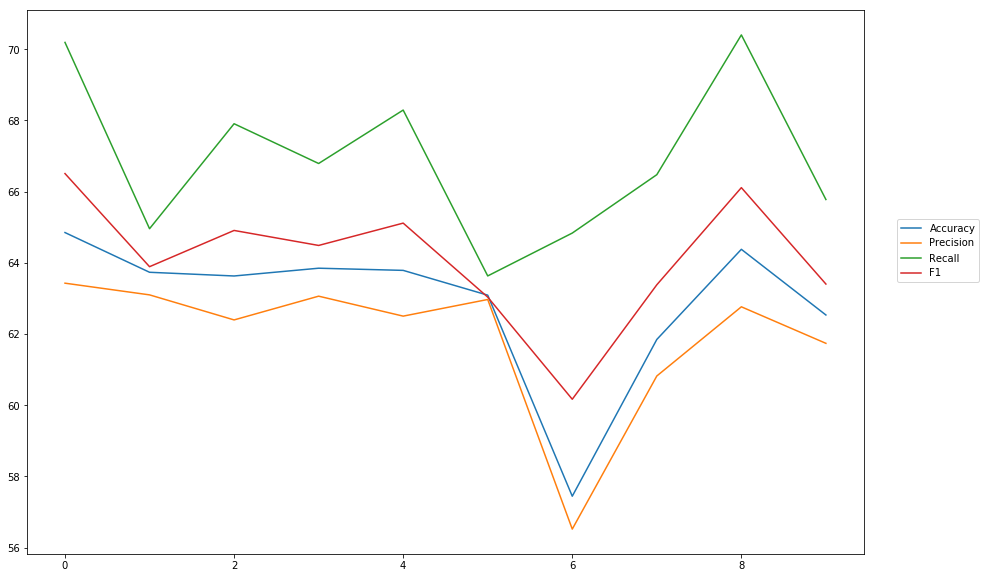

Accuracy: Mean = 62.91% (+/- 2.00%), Max = 64.85%, Min =  57.44%
Precision: Mean = 61.93% (+/- 1.94%), Max = 63.43%, Min =  56.52%
Recall: Mean = 66.92% (+/- 2.15%), Max = 70.40%, Min =  63.63%
F1: Mean = 64.10% (+/- 1.71%), Max = 66.51%, Min =  60.17%


In [20]:
cross_val_three_inputs(model_16, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_vadar, train_senti_vadar, train_labels, softmax, outputpath, 'combined_outputs_senti_blob_vadar')

# Combine POS and BLOB

## Combine Inputs

In [10]:
#Input Words
wv_layer_17 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_17 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_17 = wv_layer_17(comment_input_17)
embedded_sequences_17 = Flatten()(embedded_sequences_17)

#Input Senti + POS
senti_input_17_blob = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
senti_input_17_pos = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')

#Concat Inputs
concat_17 = concatenate([embedded_sequences_17, senti_input_17_blob, senti_input_17_pos], axis=1)

x_17 = Dense(600, activation='relu')(concat_17)
preds_17 = Dense(2, activation='softmax')(x_17)

# build the model
model_17 = Model(inputs=[comment_input_17, senti_input_17_blob, senti_input_17_pos], outputs=preds_17)
model_17.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 40, 300)      4118700     input_1[0][0]                    
__________________________________________________________________________________________________
flatten_1 (Flatten)             (None, 12000)        0           embedding_1[0][0]                
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
input_3 (I


-----Fold 1--------


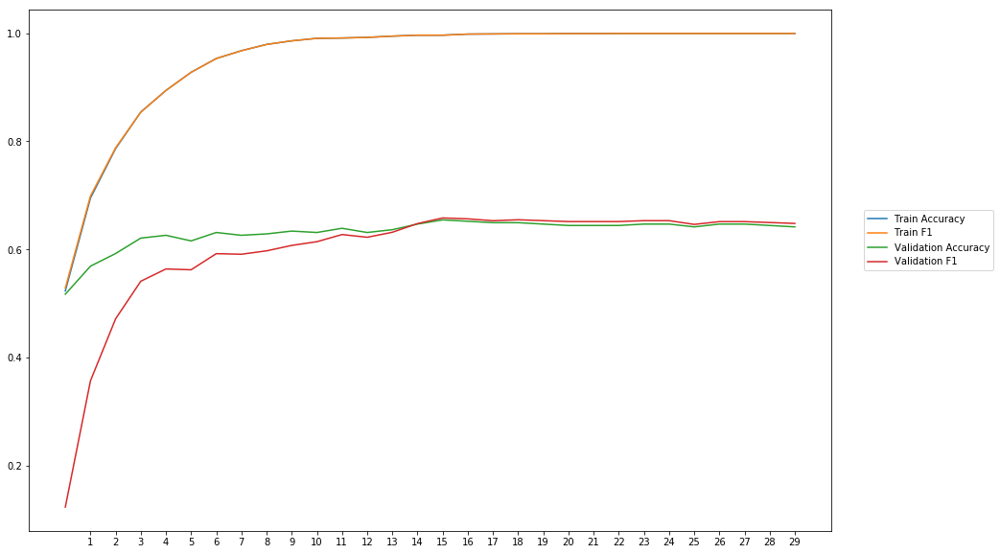

Average Accuracy: 63.14%
Average Precision: 64.83%
Average Recall: 57.81%
Average F1: 59.76%

-----Fold 2--------


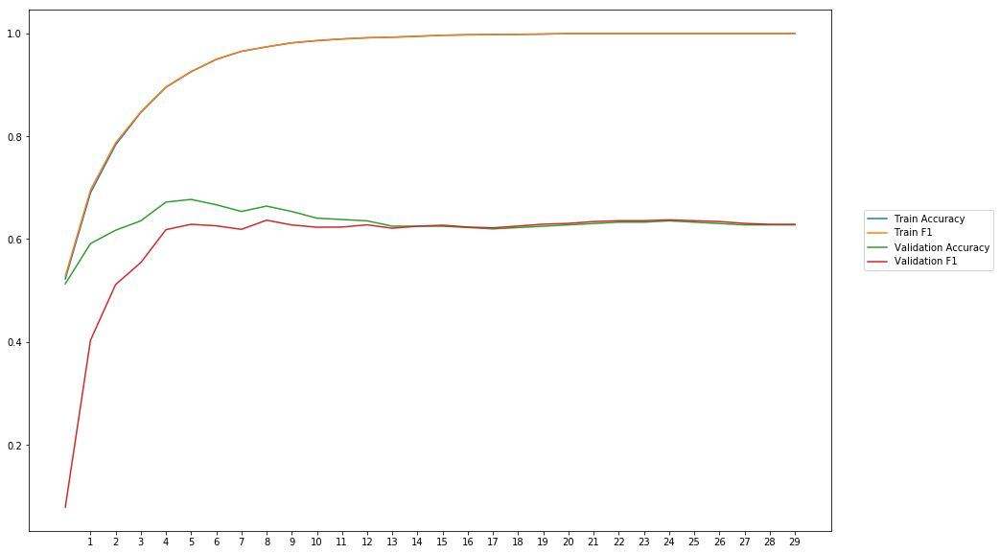

Average Accuracy: 63.09%
Average Precision: 65.20%
Average Recall: 57.33%
Average F1: 59.60%

-----Fold 3--------


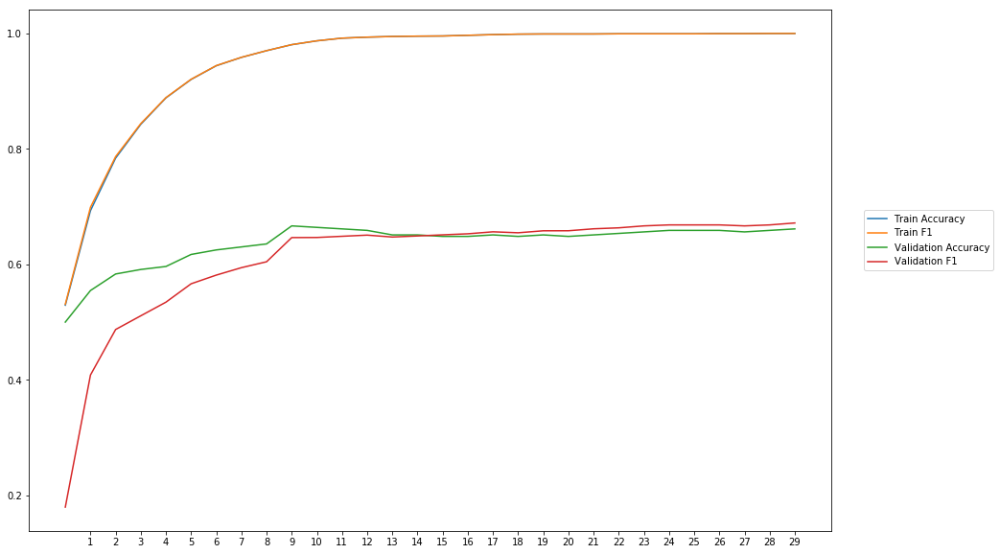

Average Accuracy: 63.65%
Average Precision: 64.12%
Average Recall: 59.56%
Average F1: 60.97%

-----Fold 4--------


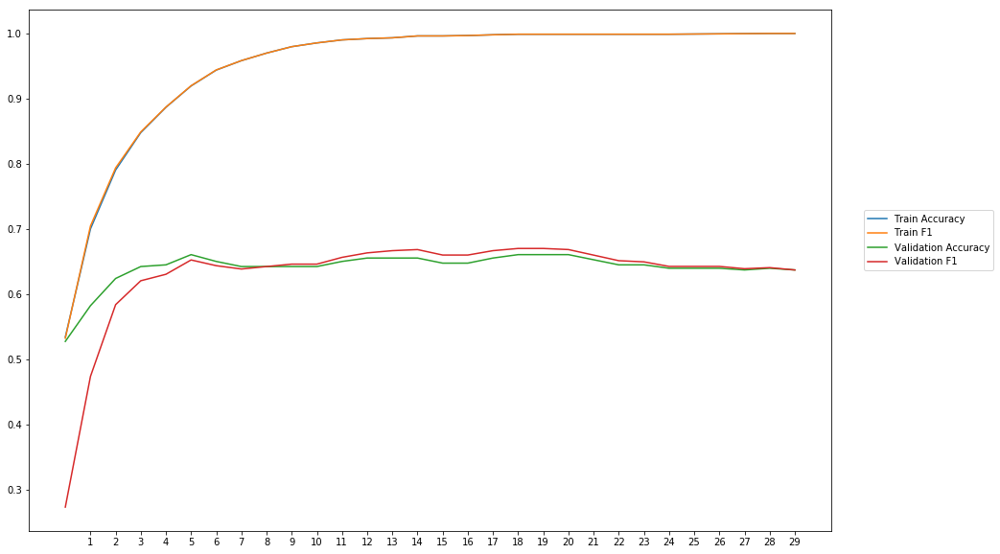

Average Accuracy: 64.08%
Average Precision: 64.17%
Average Recall: 62.93%
Average F1: 63.02%

-----Fold 5--------


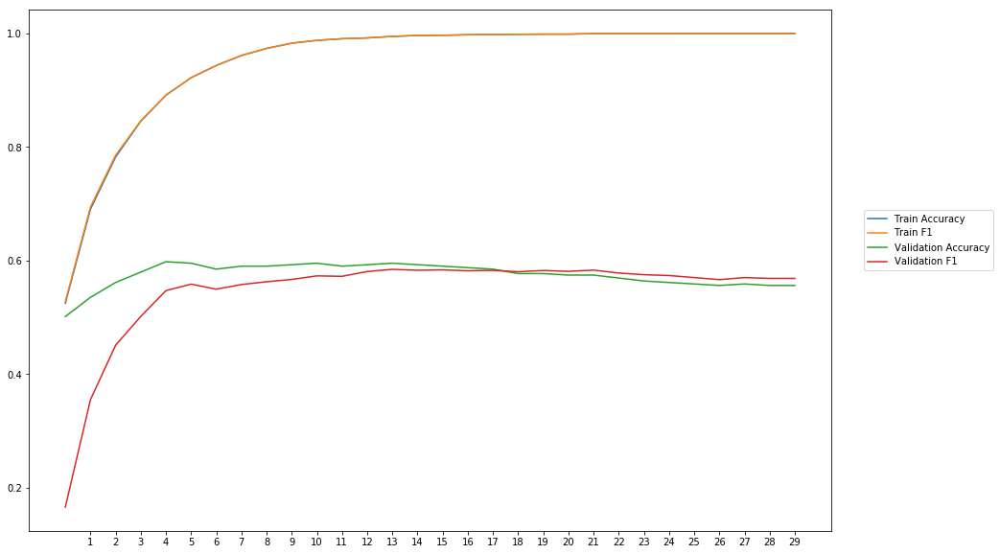

Average Accuracy: 57.47%
Average Precision: 58.08%
Average Recall: 52.77%
Average F1: 54.51%

-----Fold 6--------


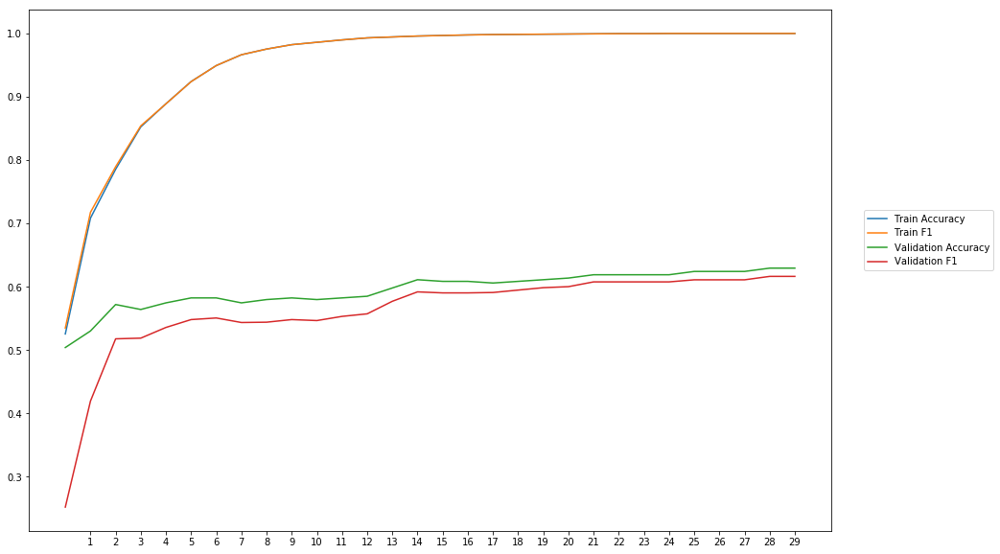

Average Accuracy: 59.54%
Average Precision: 60.47%
Average Recall: 53.04%
Average F1: 56.21%

-----Fold 7--------


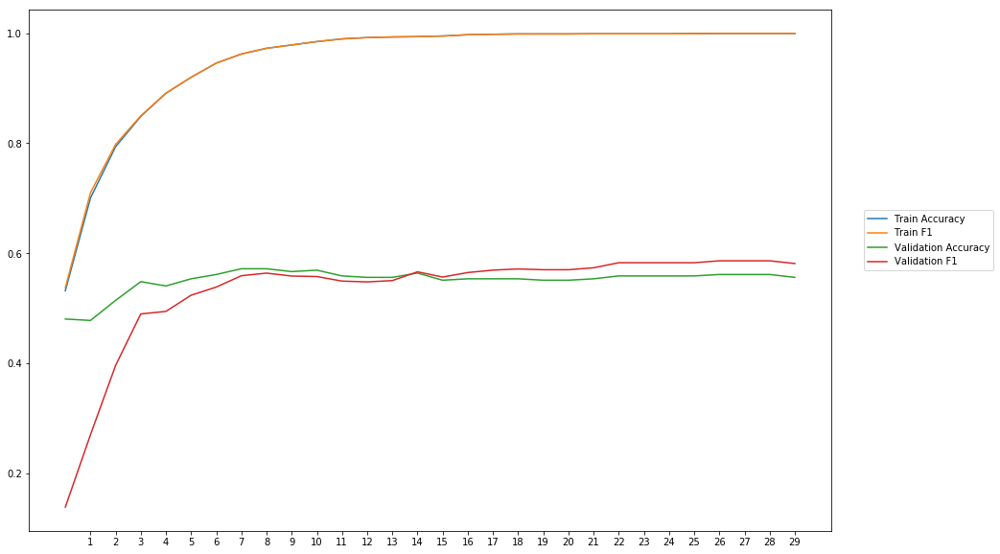

Average Accuracy: 55.11%
Average Precision: 54.57%
Average Recall: 53.21%
Average F1: 53.17%

-----Fold 8--------


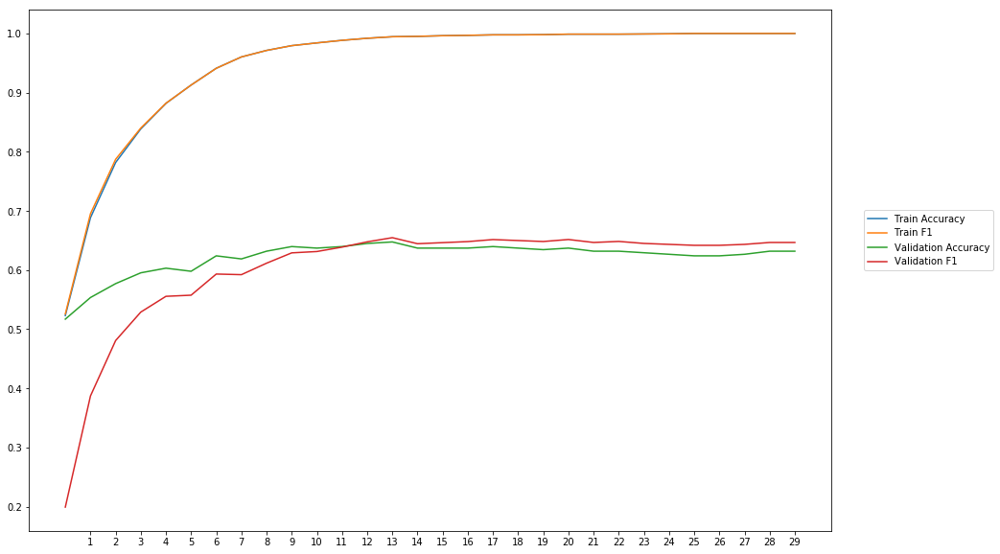

Average Accuracy: 62.15%
Average Precision: 62.51%
Average Recall: 59.76%
Average F1: 60.17%

-----Fold 9--------


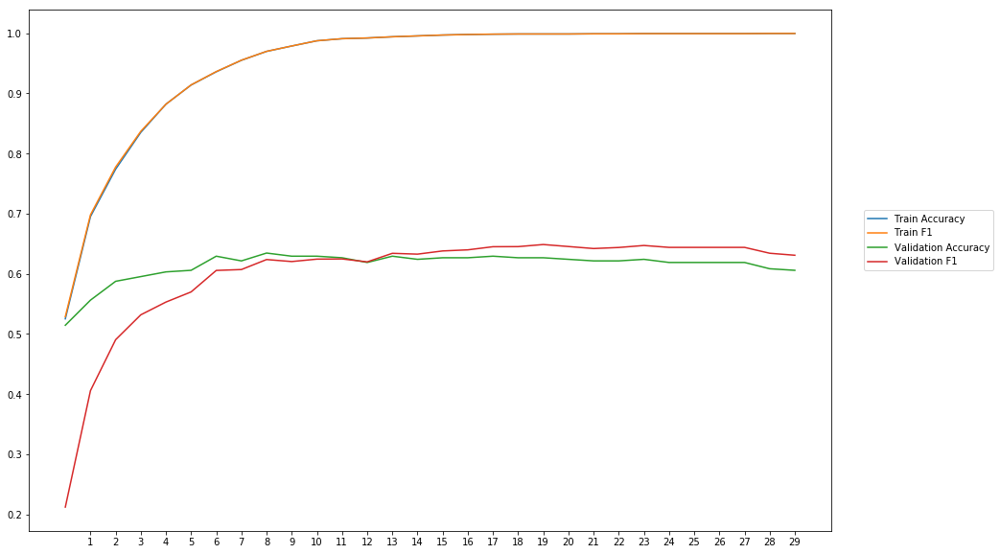

Average Accuracy: 61.40%
Average Precision: 61.52%
Average Recall: 60.24%
Average F1: 59.97%

-----Fold 10--------


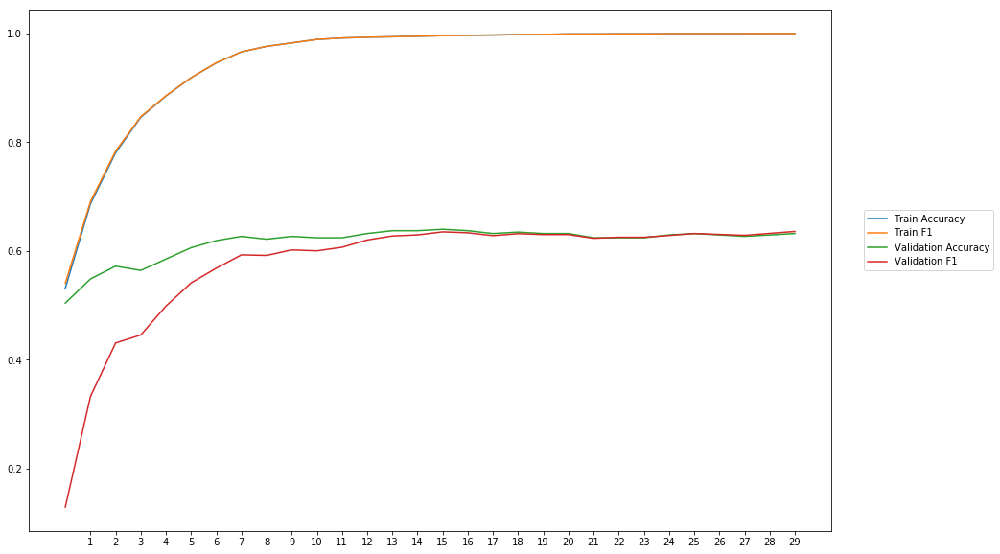

Average Accuracy: 61.61%
Average Precision: 62.98%
Average Recall: 54.83%
Average F1: 57.53%

-------Overallresults-------


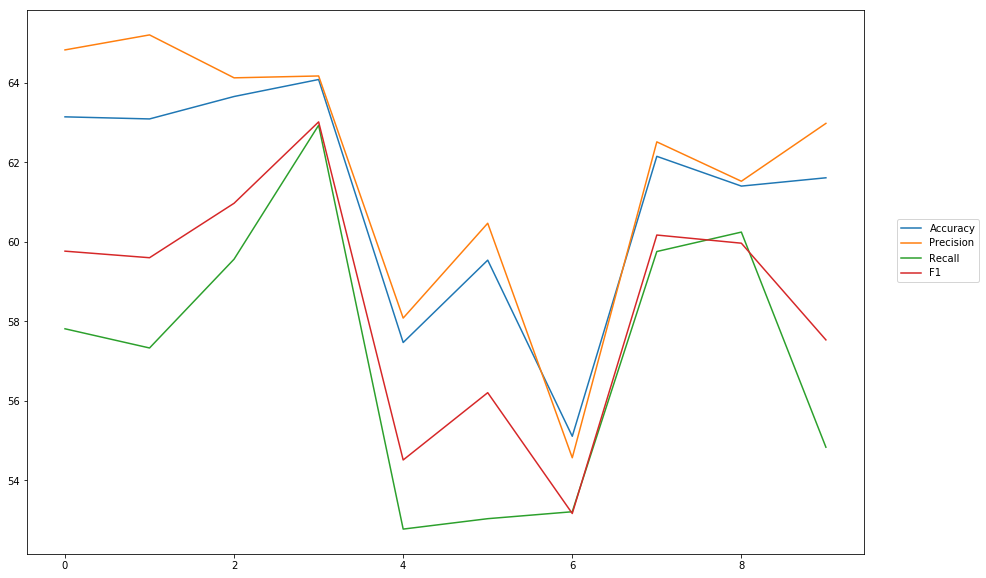

Accuracy: Mean = 61.12% (+/- 2.77%), Max = 64.08%, Min =  55.11%
Precision: Mean = 61.85% (+/- 3.19%), Max = 65.20%, Min =  54.57%
Recall: Mean = 57.15% (+/- 3.36%), Max = 62.93%, Min =  52.77%
F1: Mean = 58.49% (+/- 2.91%), Max = 63.02%, Min =  53.17%


In [11]:
cross_val_three_inputs(model_17, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'combined_input_senti_blob_pos')

## Seperate Models combine results

In [12]:
#First part
wv_layer_18 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_18 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_18 = wv_layer_18(comment_input_18)
x_first_18 = Dense(600, activation='relu')(embedded_sequences_18)
x_first_18 = Flatten()(x_first_18)

#Second part
senti_input_18_blob = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_18 = Dense(600, activation='relu')(senti_input_18_blob)

#Thrid part
senti_input_18_pos = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_third_18 = Dense(600, activation='relu')(senti_input_18_pos)

#Concatination
concat_18 = concatenate([x_first_18, x_second_18, x_third_18])

preds_18 = Dense(2, activation='softmax')(concat_18)

model_18 = Model(inputs=[comment_input_18, senti_input_18_blob, senti_input_18_pos], outputs=preds_18)
model_18.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_3 (Embedding)         (None, 40, 300)      4118700     input_6[0][0]                    
__________________________________________________________________________________________________
dense_9 (Dense)                 (None, 40, 600)      180600      embedding_3[0][0]                
__________________________________________________________________________________________________
input_7 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
input_8 (I


-----Fold 1--------


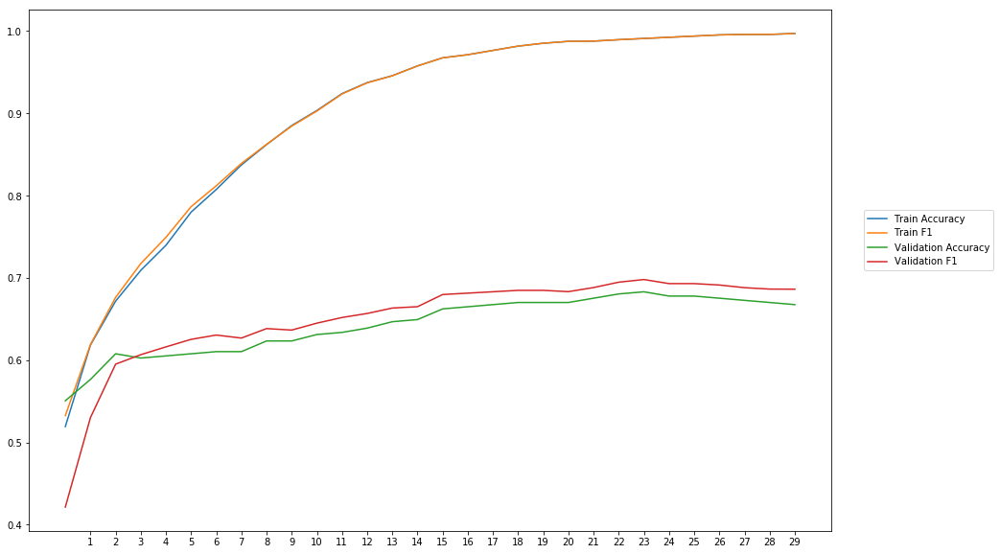

Average Accuracy: 64.35%
Average Precision: 63.25%
Average Recall: 67.48%
Average F1: 65.09%

-----Fold 2--------


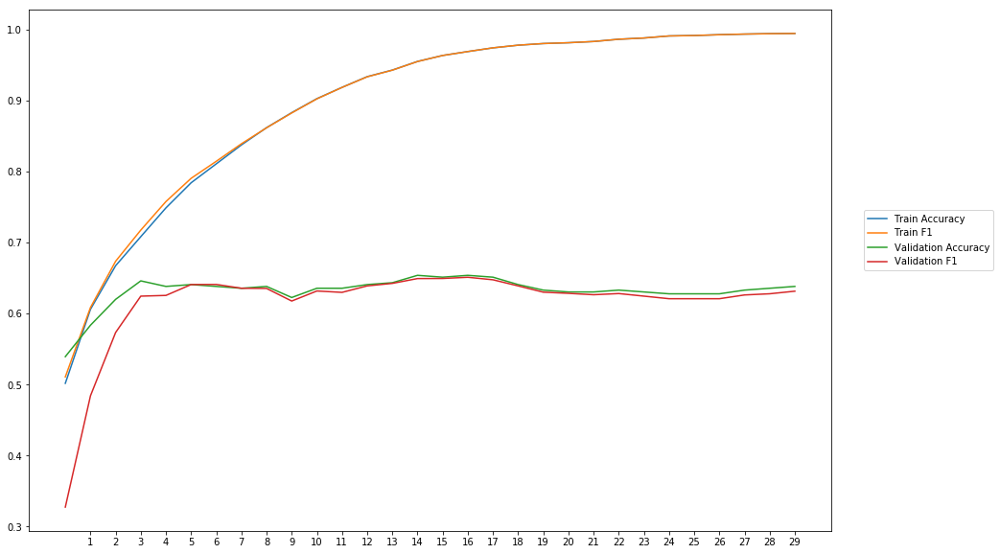

Average Accuracy: 63.17%
Average Precision: 63.64%
Average Recall: 60.28%
Average F1: 61.55%

-----Fold 3--------


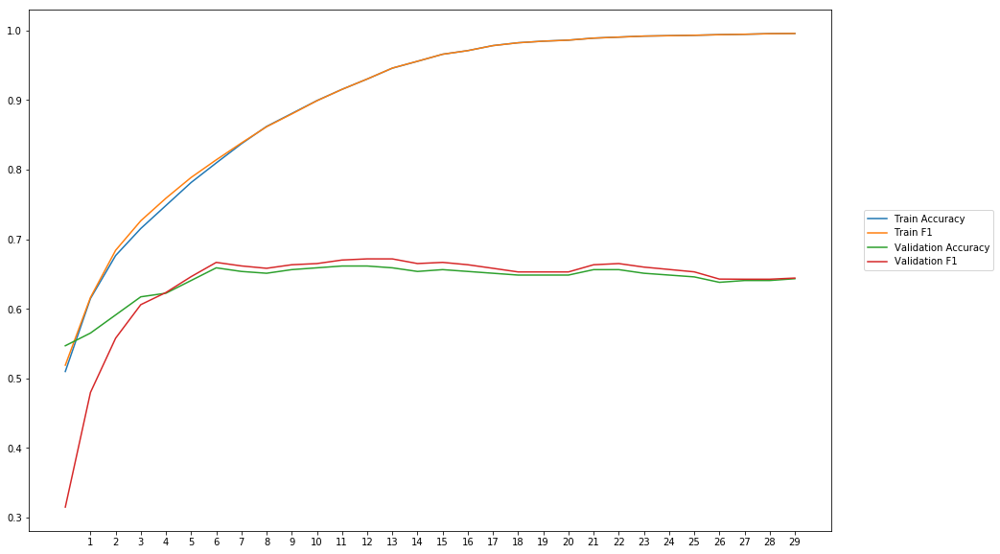

Average Accuracy: 64.08%
Average Precision: 63.73%
Average Recall: 64.12%
Average F1: 63.46%

-----Fold 4--------


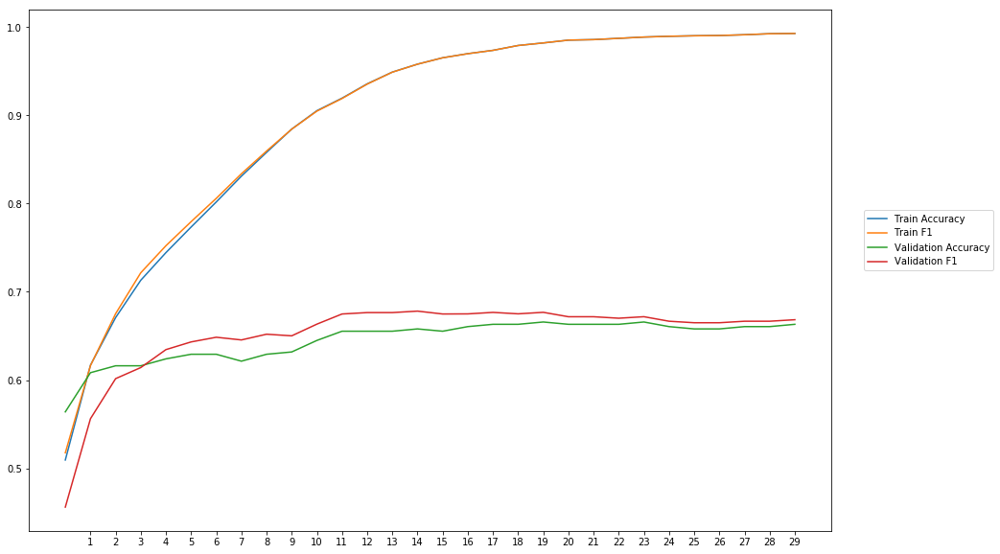

Average Accuracy: 64.54%
Average Precision: 63.73%
Average Recall: 66.98%
Average F1: 65.11%

-----Fold 5--------


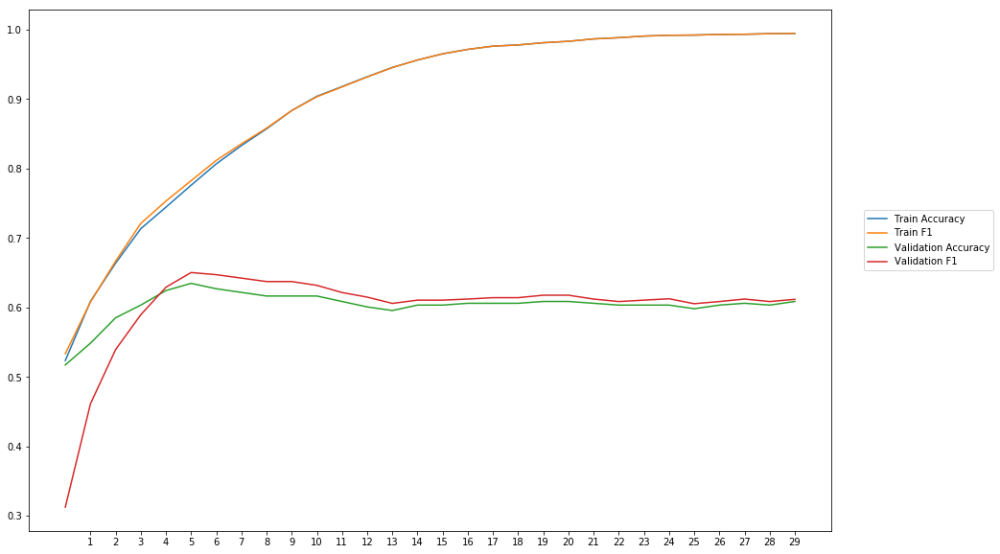

Average Accuracy: 60.29%
Average Precision: 59.89%
Average Recall: 60.82%
Average F1: 60.00%

-----Fold 6--------


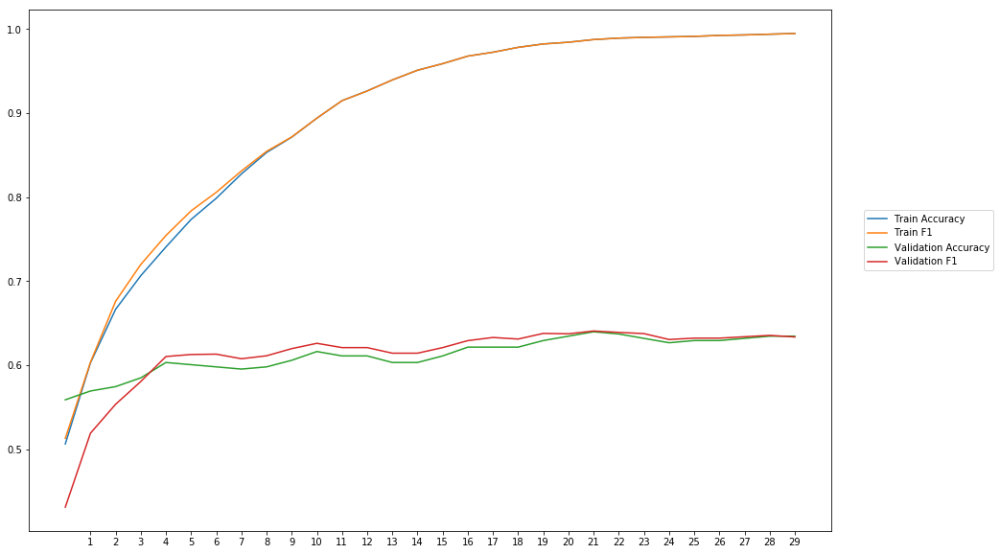

Average Accuracy: 61.22%
Average Precision: 60.95%
Average Recall: 61.82%
Average F1: 61.19%

-----Fold 7--------


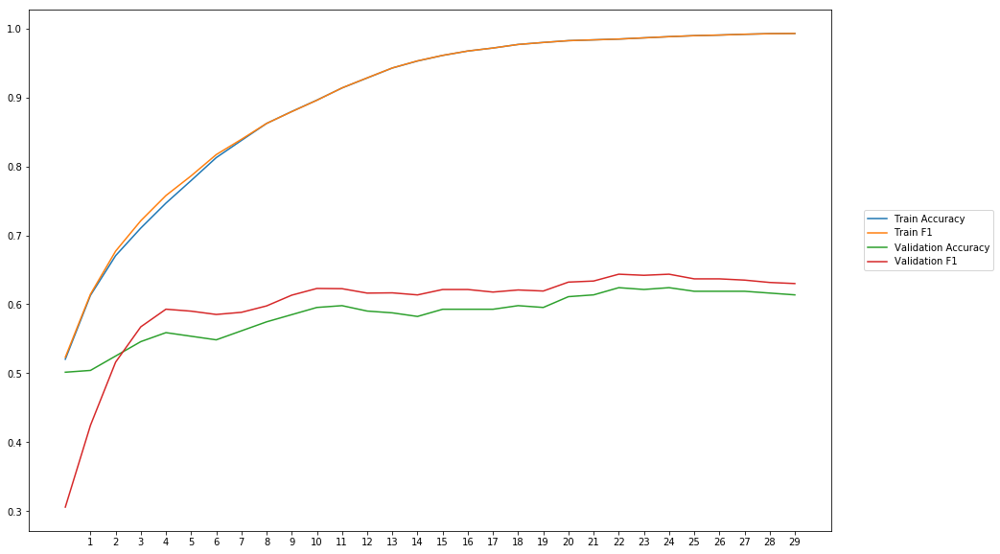

Average Accuracy: 58.54%
Average Precision: 57.49%
Average Recall: 62.97%
Average F1: 59.79%

-----Fold 8--------


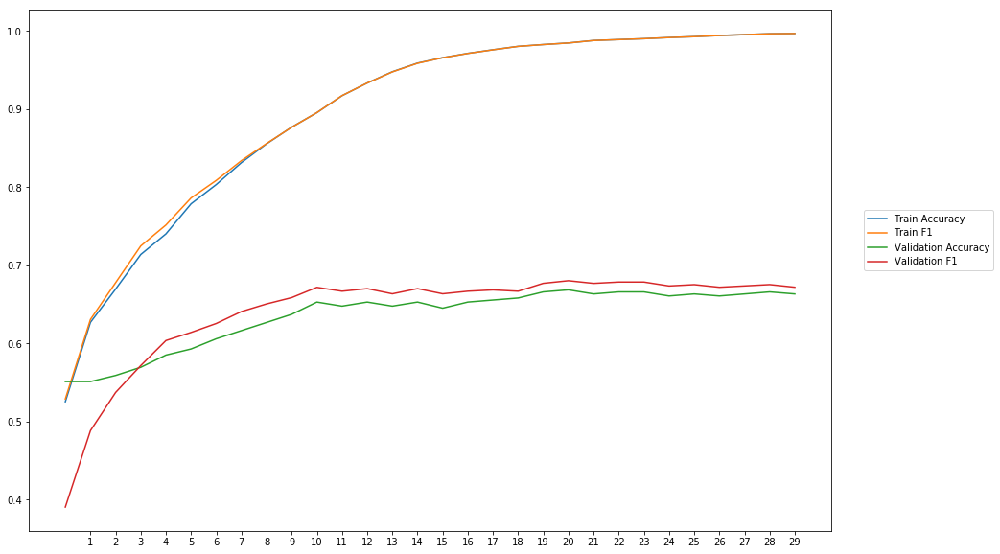

Average Accuracy: 63.54%
Average Precision: 62.62%
Average Recall: 66.18%
Average F1: 64.05%

-----Fold 9--------


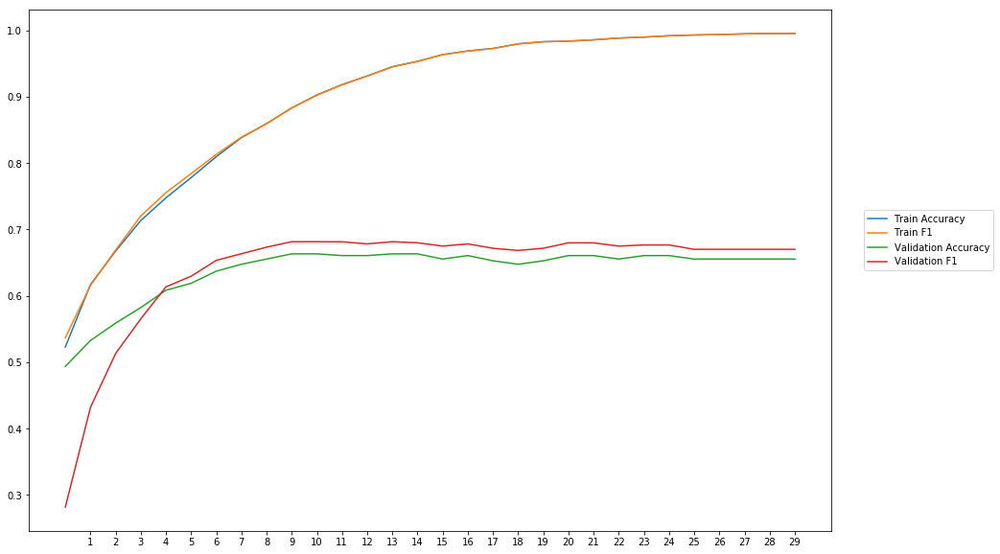

Average Accuracy: 63.84%
Average Precision: 62.53%
Average Recall: 66.42%
Average F1: 64.03%

-----Fold 10--------


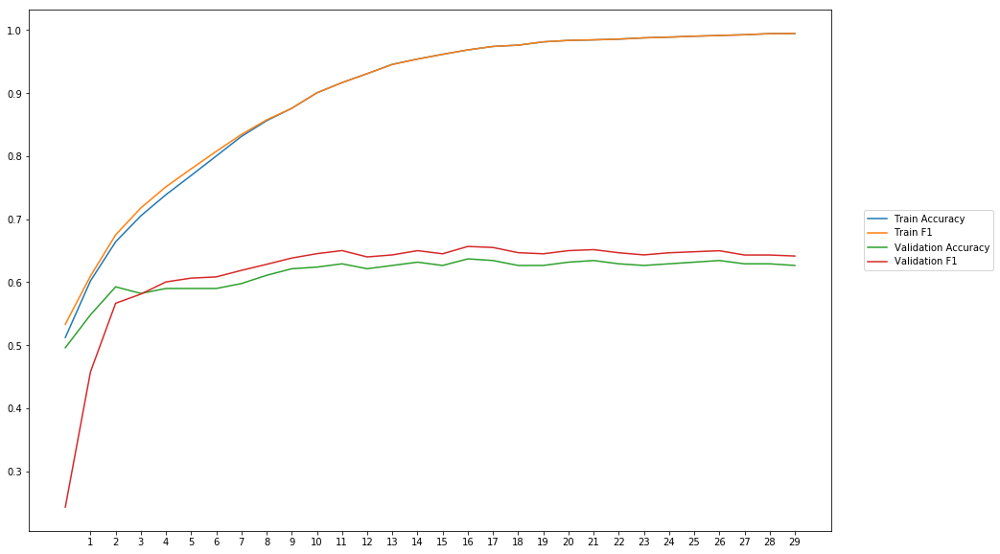

Average Accuracy: 61.36%
Average Precision: 60.35%
Average Recall: 63.89%
Average F1: 61.64%

-------Overallresults-------


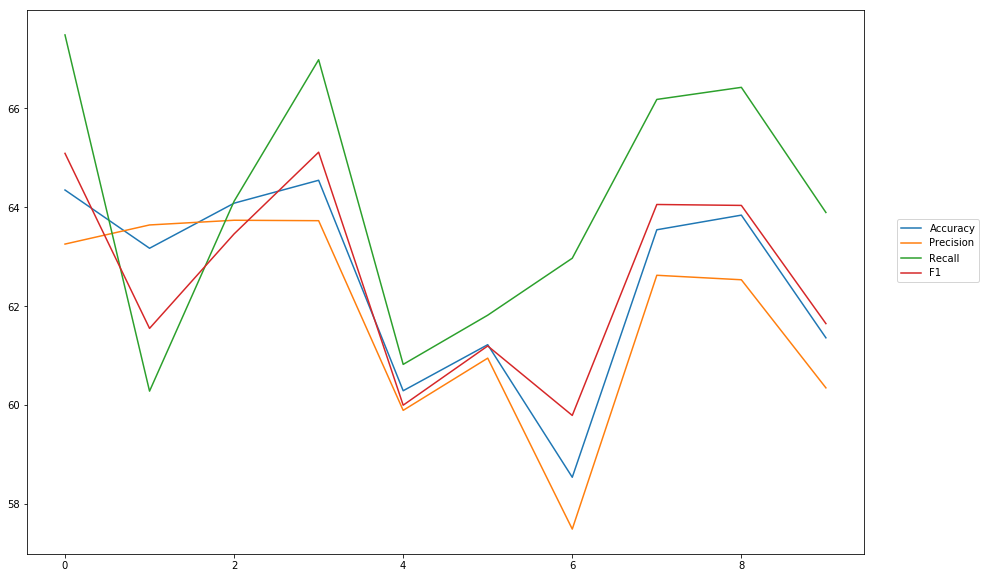

Accuracy: Mean = 62.49% (+/- 1.92%), Max = 64.54%, Min =  58.54%
Precision: Mean = 61.82% (+/- 1.98%), Max = 63.73%, Min =  57.49%
Recall: Mean = 64.10% (+/- 2.48%), Max = 67.48%, Min =  60.28%
F1: Mean = 62.59% (+/- 1.90%), Max = 65.11%, Min =  59.79%


In [13]:
cross_val_three_inputs(model_18, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'separat_models_senti_blob_pos')

## Separate models combine output

### average

In [14]:
#First model
wv_layer_19 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_19 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_19 = wv_layer_19(comment_input_19)
x_first_19 = Dense(600, activation='relu')(embedded_sequences_19)
x_first_19 = Flatten()(x_first_19)
first_preds_19 = Dense(2, activation='softmax')(x_first_19)

#Second model
senti_input_19_blob = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_19 = Dense(600, activation='relu')(senti_input_19_blob)
second_preds_19 = Dense(2, activation='softmax')(x_second_19)

#Thrid model
senti_input_19_pos = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_third_19 = Dense(600, activation='relu')(senti_input_19_pos)
third_preds_19 = Dense(2, activation='softmax')(x_third_19)

#Concat outputs
preds_19 = average([first_preds_19, second_preds_19, third_preds_19])

model_19 = Model(inputs=[comment_input_19, senti_input_19_blob, senti_input_19_pos], outputs=preds_19)
model_19.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_3 (Embedding)         (None, 40, 300)      4118700     input_7[0][0]                    
__________________________________________________________________________________________________
dense_7 (Dense)                 (None, 40, 600)      180600      embedding_3[0][0]                
__________________________________________________________________________________________________
input_8 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
input_9 (I


-----Fold 1--------


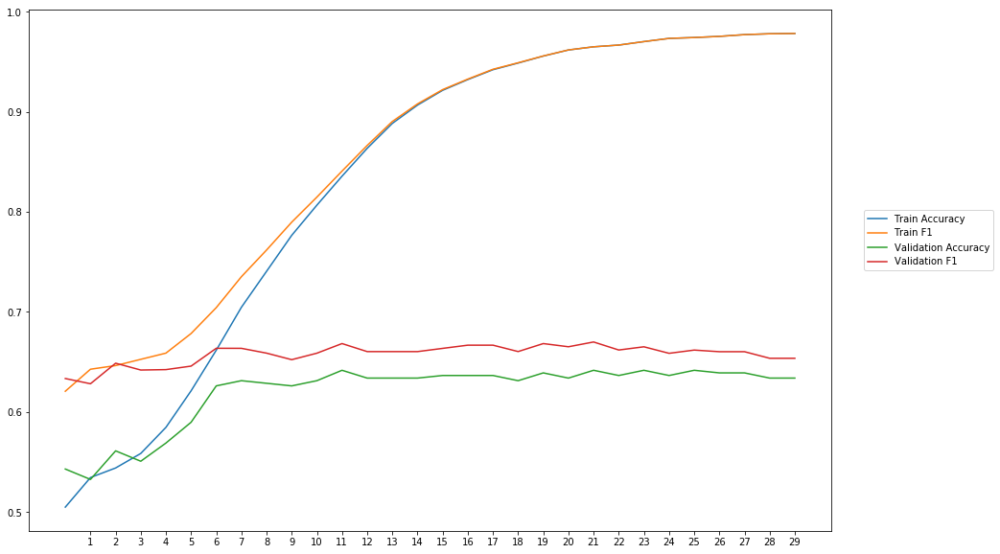

Average Accuracy: 61.96%
Average Precision: 60.02%
Average Recall: 73.02%
Average F1: 65.73%

-----Fold 2--------


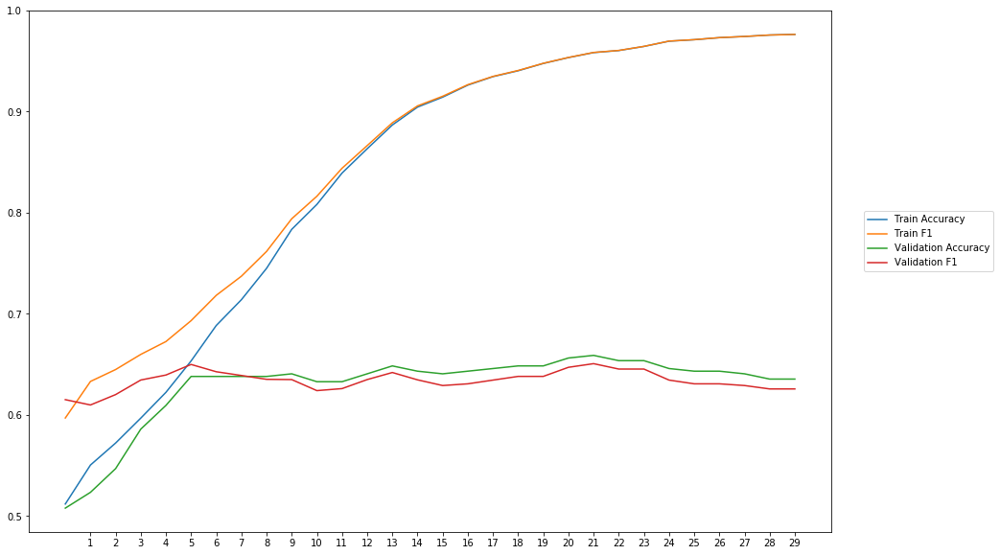

Average Accuracy: 62.86%
Average Precision: 62.86%
Average Recall: 64.54%
Average F1: 63.39%

-----Fold 3--------


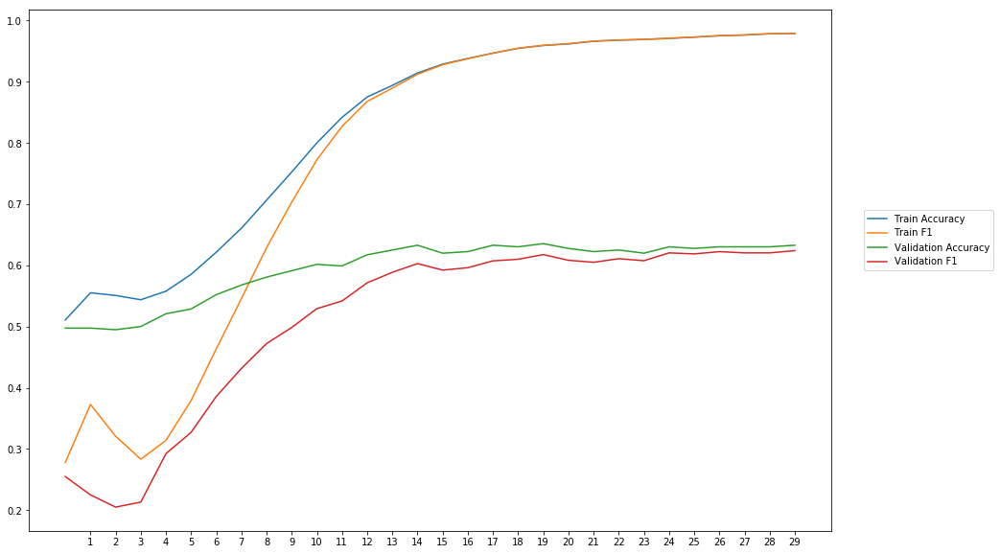

Average Accuracy: 59.41%
Average Precision: 60.98%
Average Recall: 46.04%
Average F1: 51.06%

-----Fold 4--------


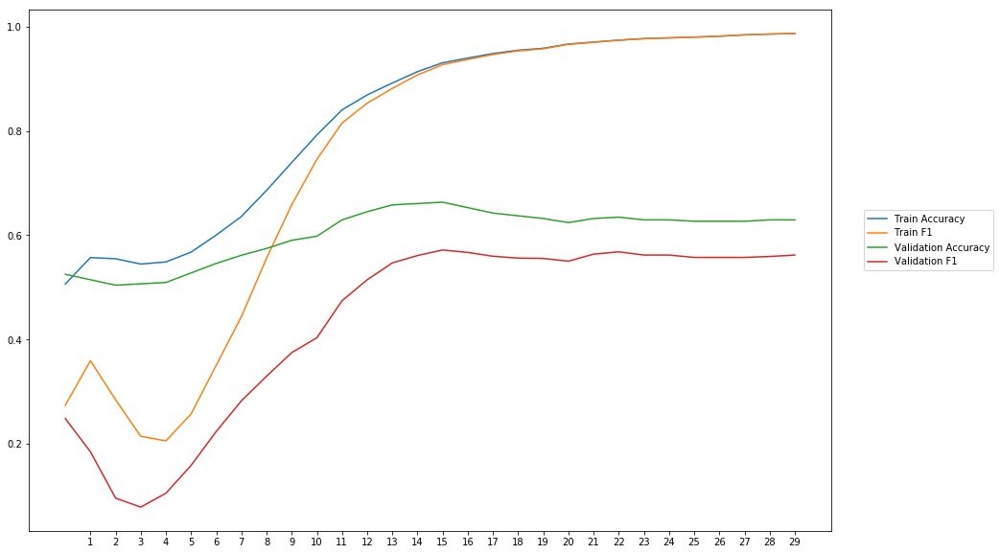

Average Accuracy: 60.21%
Average Precision: 70.42%
Average Recall: 33.70%
Average F1: 43.27%

-----Fold 5--------


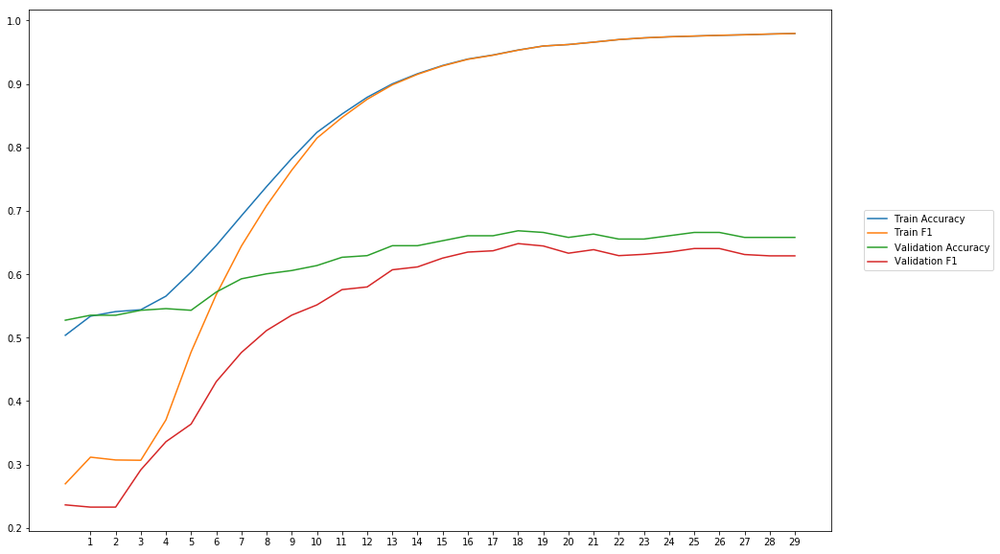

Average Accuracy: 62.22%
Average Precision: 66.63%
Average Recall: 47.26%
Average F1: 53.66%

-----Fold 6--------


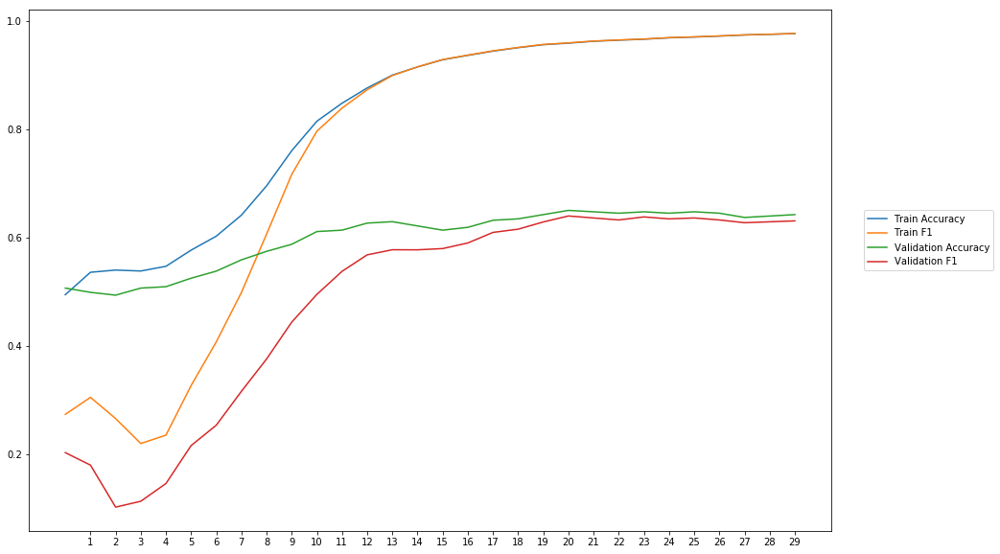

Average Accuracy: 59.96%
Average Precision: 63.27%
Average Recall: 42.95%
Average F1: 48.20%

-----Fold 7--------


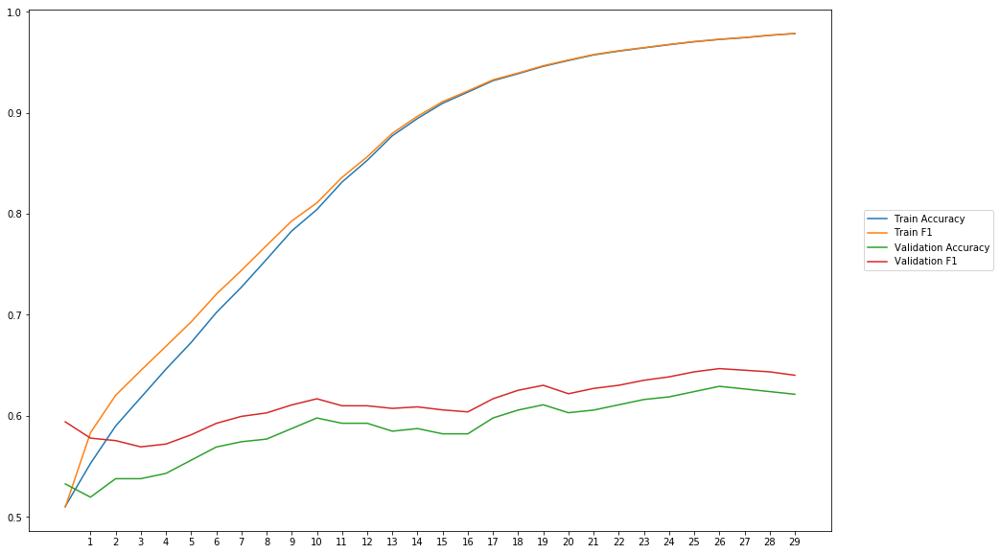

Average Accuracy: 58.83%
Average Precision: 57.81%
Average Recall: 65.25%
Average F1: 61.28%

-----Fold 8--------


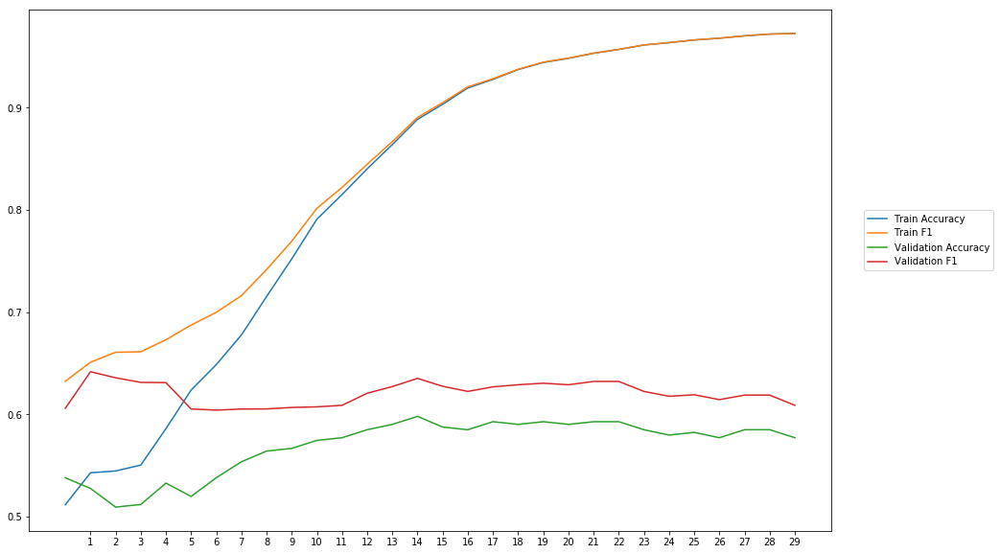

Average Accuracy: 56.93%
Average Precision: 55.59%
Average Recall: 70.72%
Average F1: 62.06%

-----Fold 9--------


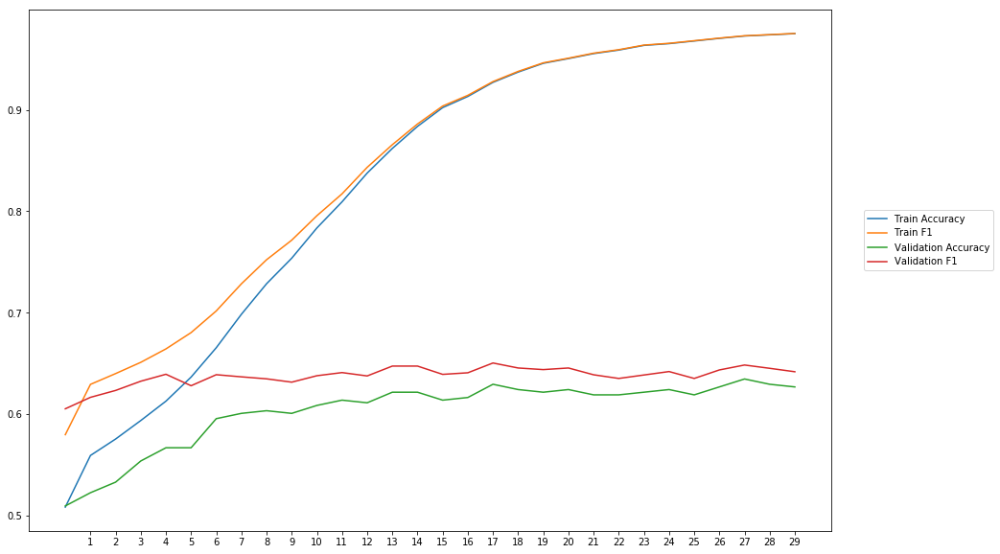

Average Accuracy: 60.24%
Average Precision: 58.82%
Average Recall: 69.98%
Average F1: 63.76%

-----Fold 10--------


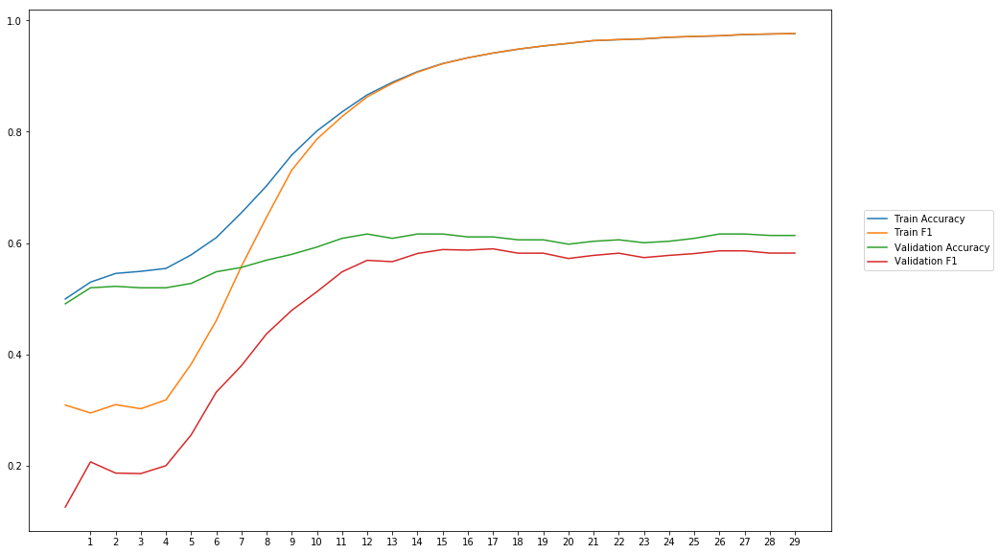

Average Accuracy: 58.41%
Average Precision: 61.59%
Average Recall: 41.92%
Average F1: 47.64%

-------Overallresults-------


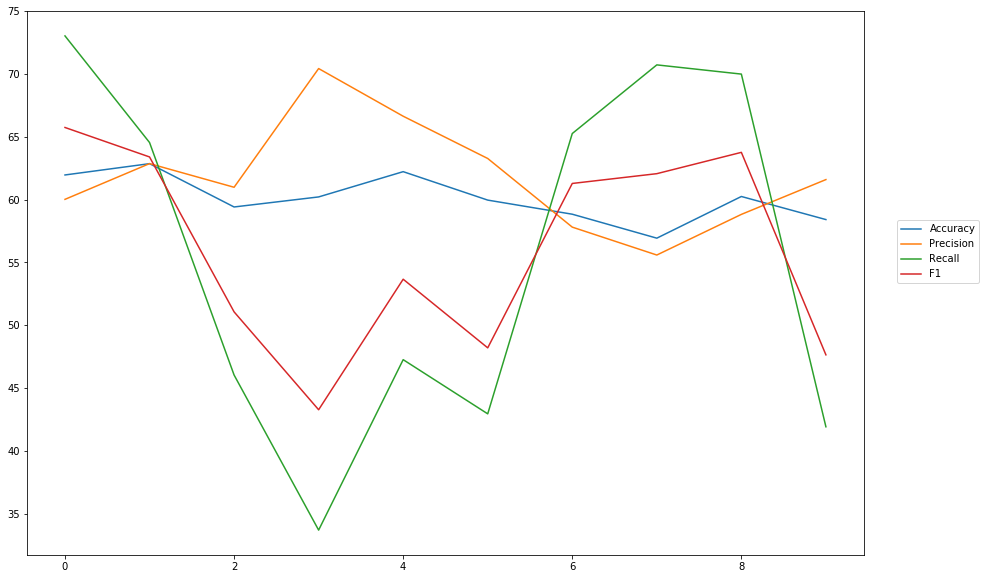

Accuracy: Mean = 60.10% (+/- 1.75%), Max = 62.86%, Min =  56.93%
Precision: Mean = 61.80% (+/- 4.10%), Max = 70.42%, Min =  55.59%
Recall: Mean = 55.54% (+/- 13.78%), Max = 73.02%, Min =  33.70%
F1: Mean = 56.01% (+/- 7.72%), Max = 65.73%, Min =  43.27%


In [15]:
cross_val_three_inputs(model_19, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, softmax, outputpath, 'combined_outputs_senti_blob_pos')

# Combine POS and Vadar

## Combine Inputs

In [18]:
#Input Words
wv_layer_20 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_20 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_20 = wv_layer_20(comment_input_20)
embedded_sequences_20 = Flatten()(embedded_sequences_20)

#Input Senti + POS
senti_input_20_vadar = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
senti_input_20_pos = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')

#Concat Inputs
concat_20 = concatenate([embedded_sequences_20, senti_input_20_vadar, senti_input_20_pos], axis=1)

x_20 = Dense(600, activation='relu')(concat_20)
preds_20 = Dense(2, activation='softmax')(x_20)

# build the model
model_20 = Model(inputs=[comment_input_20, senti_input_20_vadar, senti_input_20_pos], outputs=preds_20)
model_20.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_13 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_5 (Embedding)         (None, 40, 300)      4118700     input_13[0][0]                   
__________________________________________________________________________________________________
flatten_5 (Flatten)             (None, 12000)        0           embedding_5[0][0]                
__________________________________________________________________________________________________
input_14 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
input_15 (


-----Fold 1--------


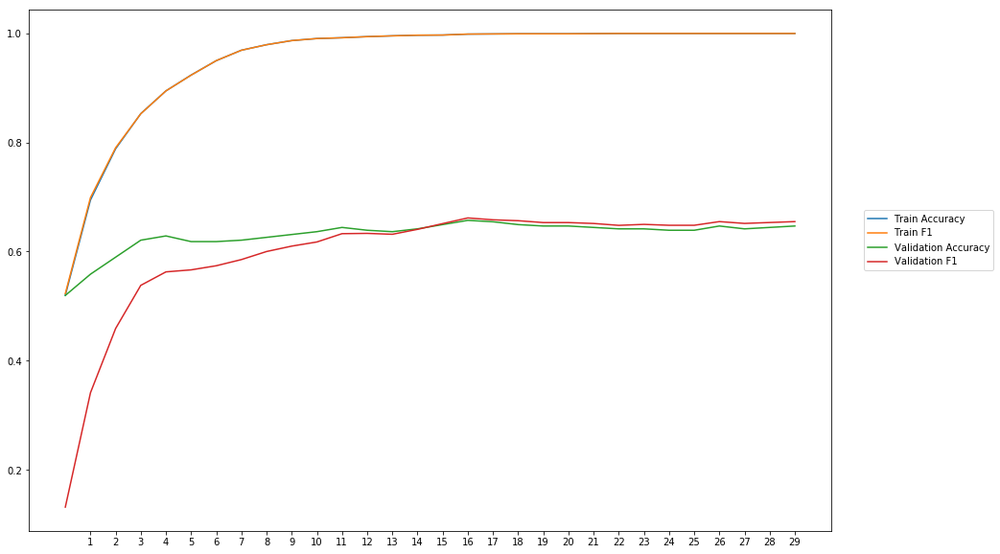

Average Accuracy: 63.06%
Average Precision: 64.68%
Average Recall: 57.92%
Average F1: 59.72%

-----Fold 2--------


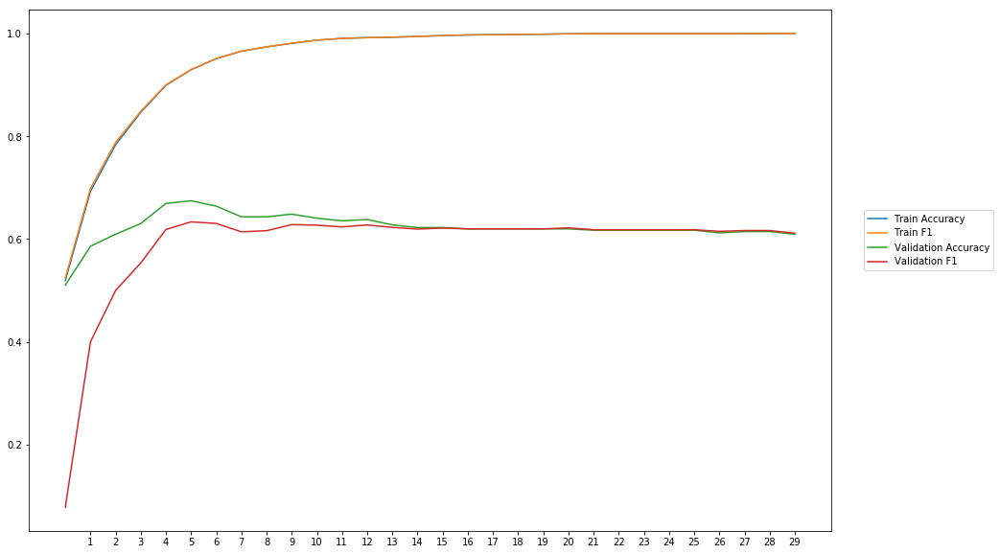

Average Accuracy: 62.34%
Average Precision: 64.09%
Average Recall: 56.68%
Average F1: 58.89%

-----Fold 3--------


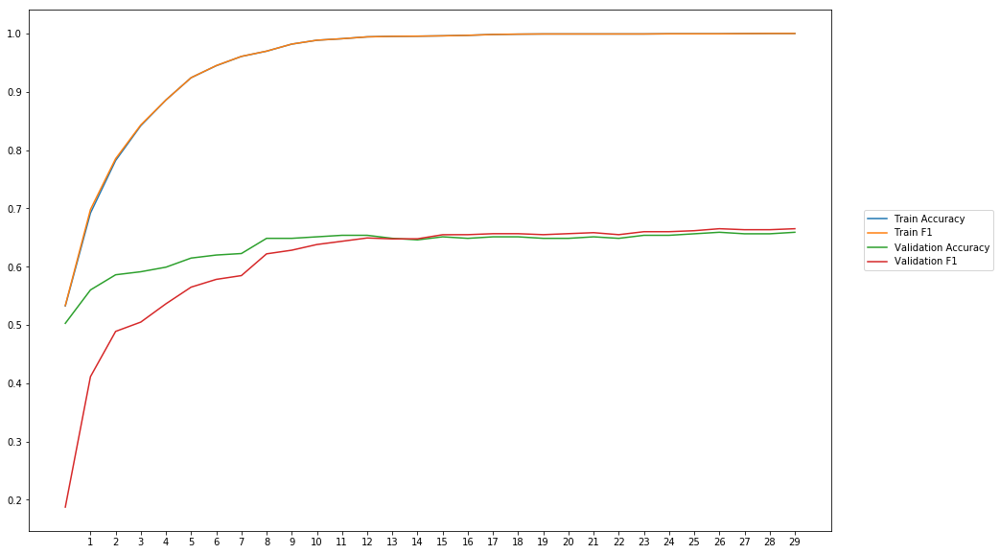

Average Accuracy: 63.45%
Average Precision: 64.01%
Average Recall: 59.18%
Average F1: 60.72%

-----Fold 4--------


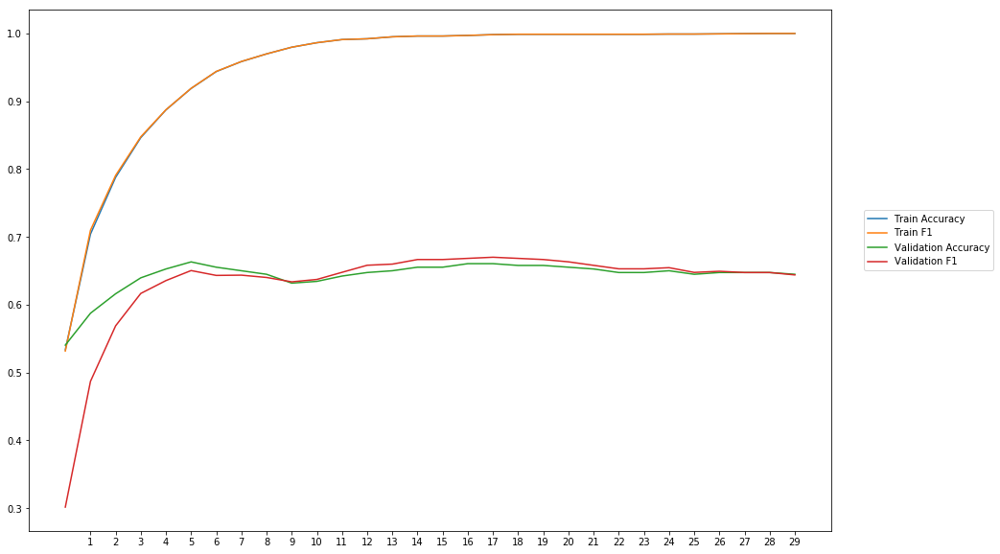

Average Accuracy: 64.30%
Average Precision: 64.58%
Average Recall: 62.81%
Average F1: 63.16%

-----Fold 5--------


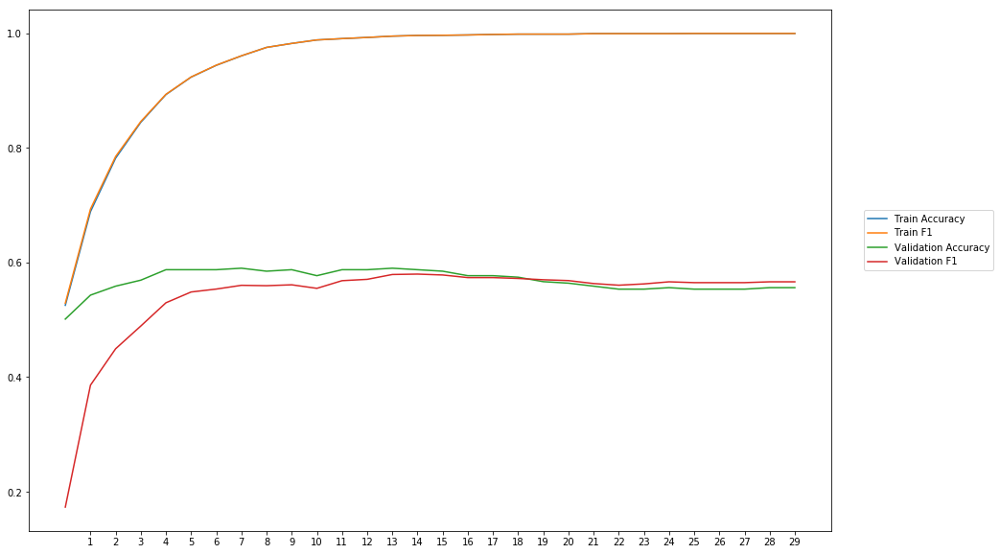

Average Accuracy: 56.88%
Average Precision: 57.49%
Average Recall: 52.09%
Average F1: 53.93%

-----Fold 6--------


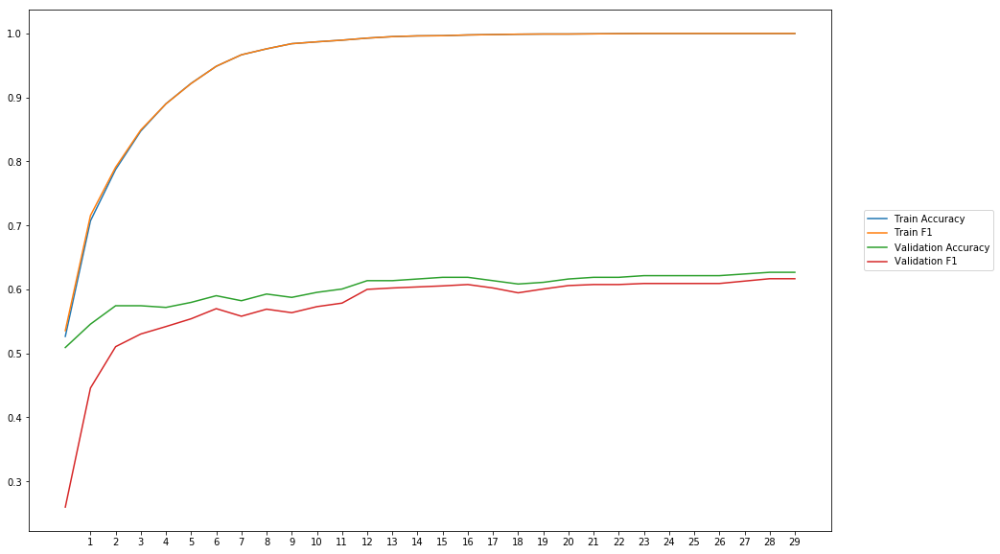

Average Accuracy: 60.11%
Average Precision: 60.96%
Average Recall: 54.54%
Average F1: 57.25%

-----Fold 7--------


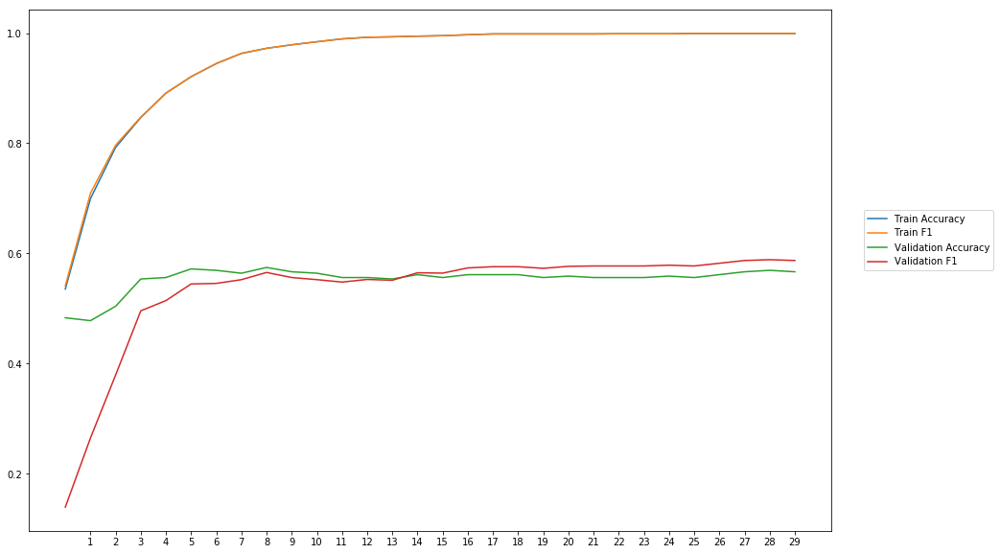

Average Accuracy: 55.38%
Average Precision: 54.87%
Average Recall: 53.23%
Average F1: 53.32%

-----Fold 8--------


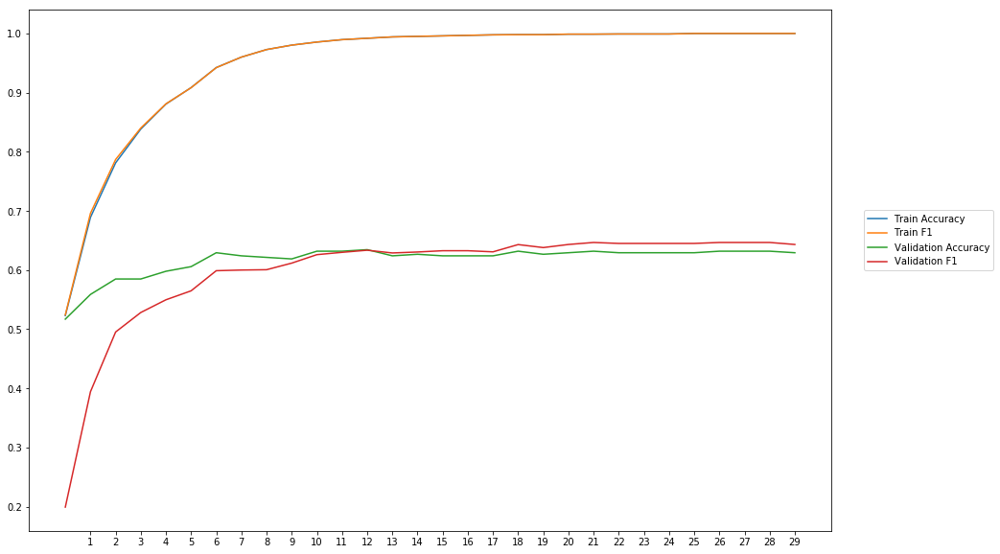

Average Accuracy: 61.75%
Average Precision: 62.18%
Average Recall: 59.16%
Average F1: 59.74%

-----Fold 9--------


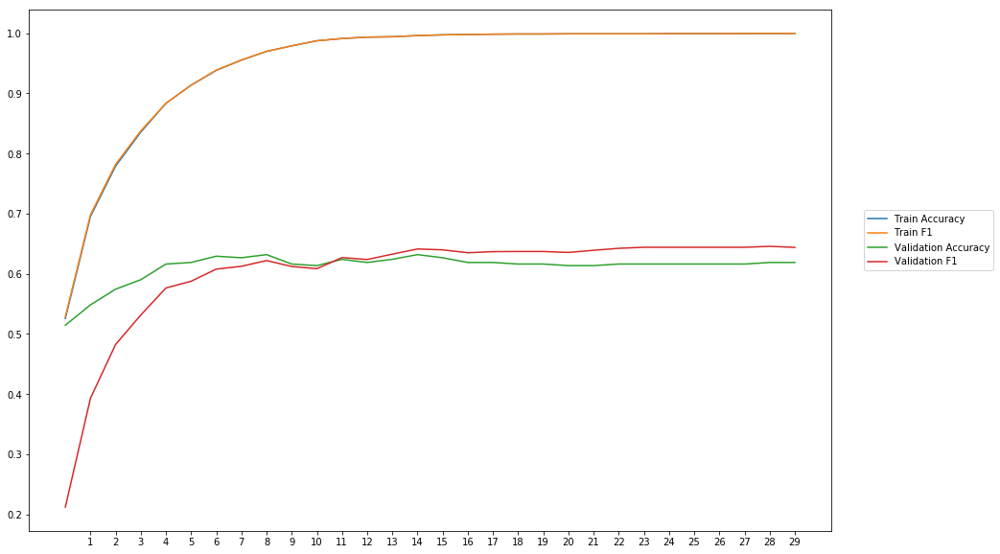

Average Accuracy: 61.12%
Average Precision: 61.06%
Average Recall: 60.63%
Average F1: 59.94%

-----Fold 10--------


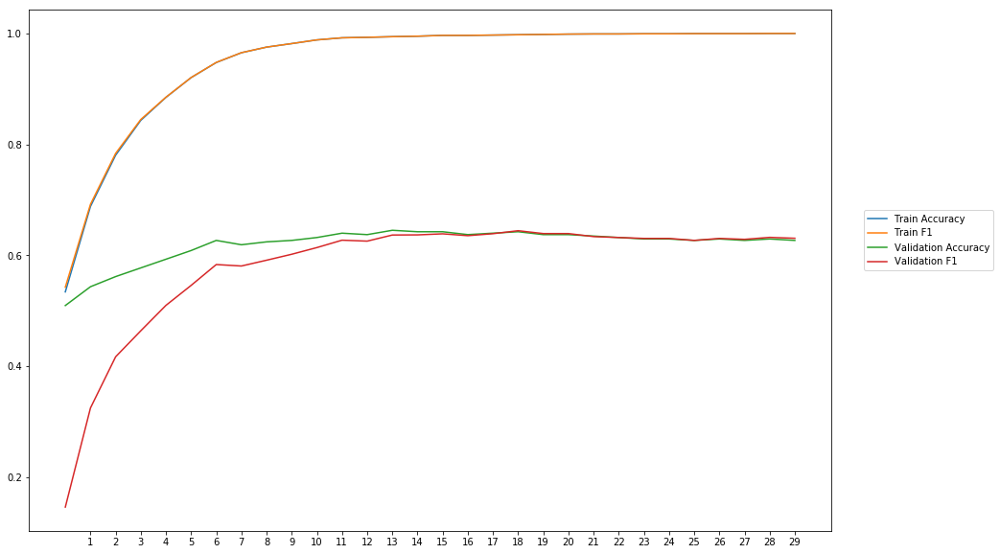

Average Accuracy: 61.94%
Average Precision: 63.31%
Average Recall: 55.48%
Average F1: 58.03%

-------Overallresults-------


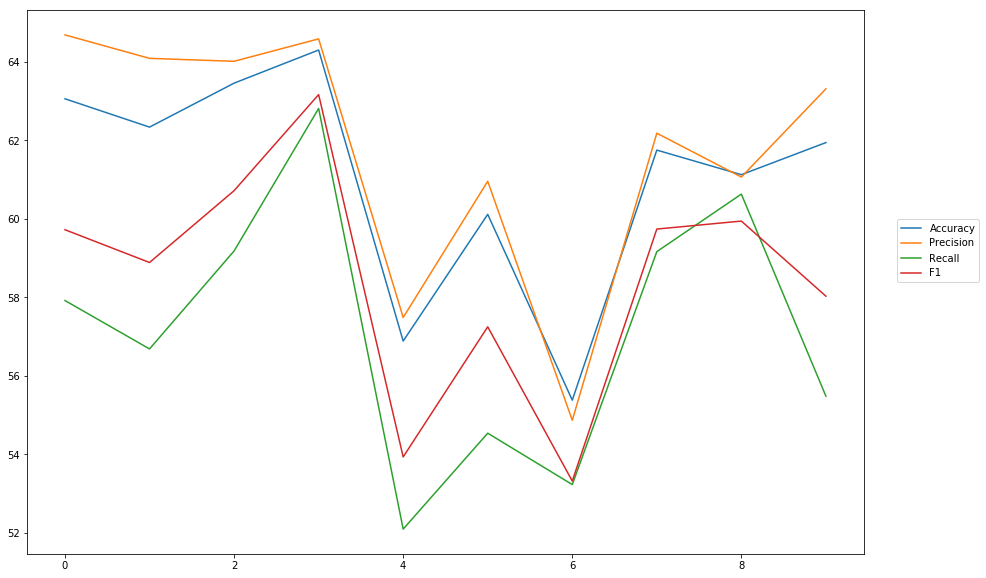

Accuracy: Mean = 61.03% (+/- 2.71%), Max = 64.30%, Min =  55.38%
Precision: Mean = 61.72% (+/- 3.11%), Max = 64.68%, Min =  54.87%
Recall: Mean = 57.17% (+/- 3.22%), Max = 62.81%, Min =  52.09%
F1: Mean = 58.47% (+/- 2.85%), Max = 63.16%, Min =  53.32%


In [19]:
cross_val_three_inputs(model_20, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_vadar, train_pos, train_labels, softmax, outputpath, 'combined_input_senti_vadar_pos')

## Seperate Models combine results

In [13]:
#First part
wv_layer_21 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_21 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_21 = wv_layer_21(comment_input_21)
x_first_21 = Dense(600, activation='relu')(embedded_sequences_21)
x_first_21 = Flatten()(x_first_21)

#Second part
senti_input_21_vadar = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_21 = Dense(600, activation='relu')(senti_input_21_vadar)

#Thrid part
senti_input_21_pos = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_third_21 = Dense(600, activation='relu')(senti_input_21_pos)

#Concatination
concat_21 = concatenate([x_first_21, x_second_21, x_third_21])

preds_21 = Dense(2, activation='softmax')(concat_21)

model_21 = Model(inputs=[comment_input_21, senti_input_21_vadar, senti_input_21_pos], outputs=preds_21)
model_21.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_4 (Embedding)         (None, 40, 300)      4118700     input_9[0][0]                    
__________________________________________________________________________________________________
dense_13 (Dense)                (None, 40, 600)      180600      embedding_4[0][0]                
__________________________________________________________________________________________________
input_10 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
input_11 (


-----Fold 1--------


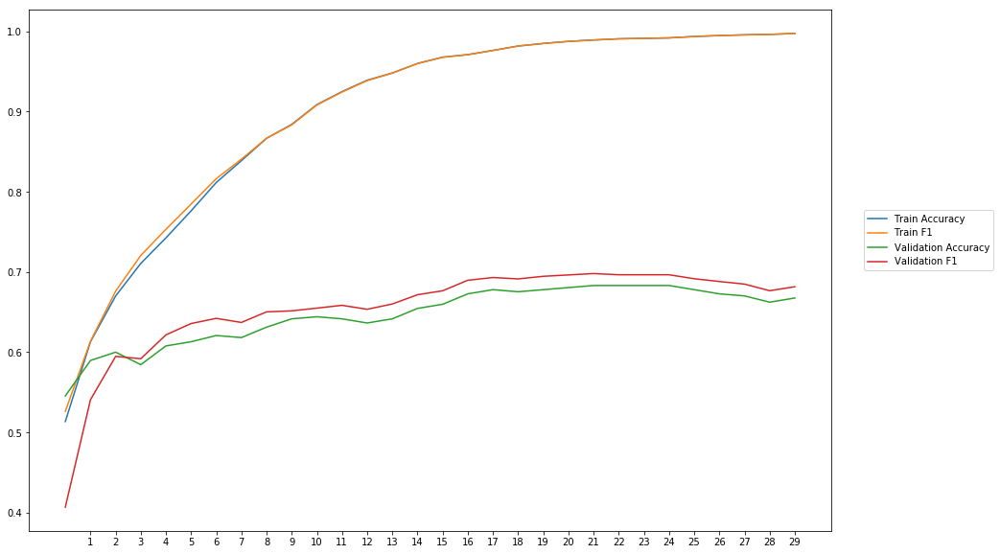

Average Accuracy: 64.66%
Average Precision: 63.52%
Average Recall: 67.90%
Average F1: 65.41%

-----Fold 2--------


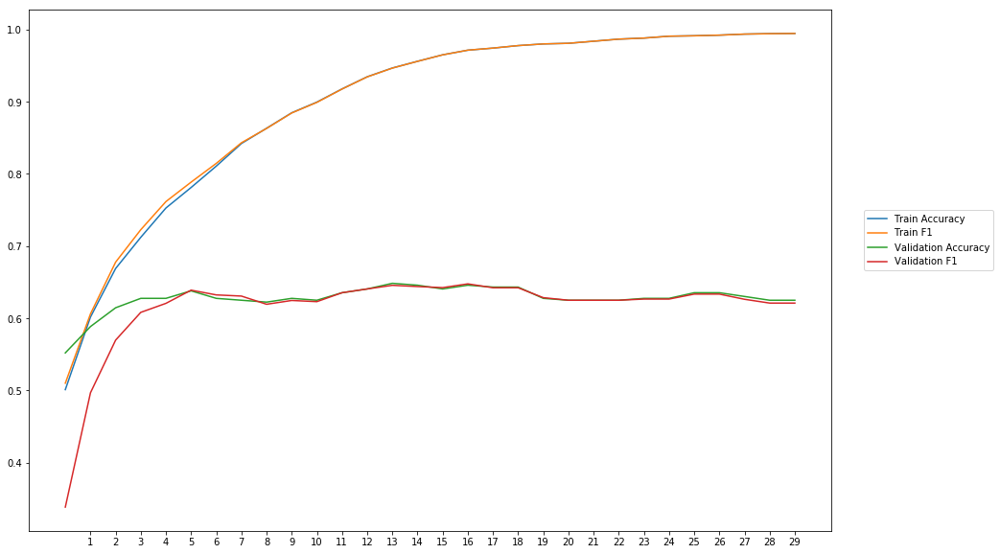

Average Accuracy: 62.76%
Average Precision: 63.09%
Average Recall: 60.68%
Average F1: 61.45%

-----Fold 3--------


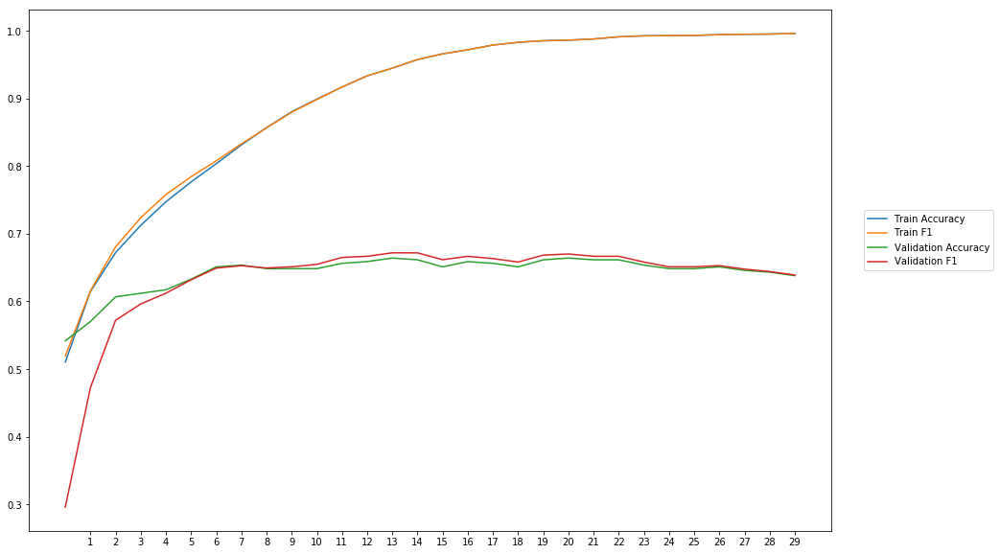

Average Accuracy: 64.22%
Average Precision: 64.09%
Average Recall: 63.44%
Average F1: 63.26%

-----Fold 4--------


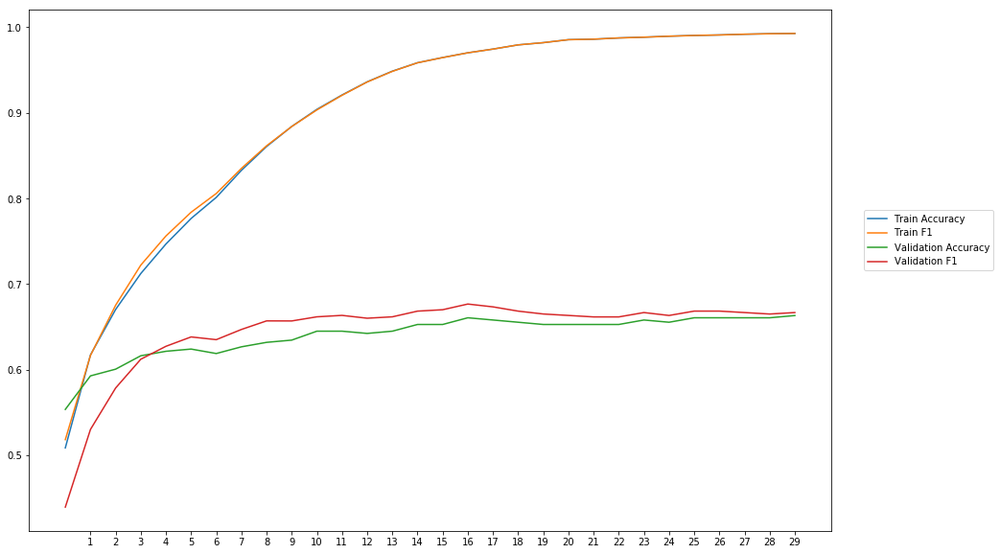

Average Accuracy: 64.02%
Average Precision: 63.26%
Average Recall: 66.18%
Average F1: 64.47%

-----Fold 5--------


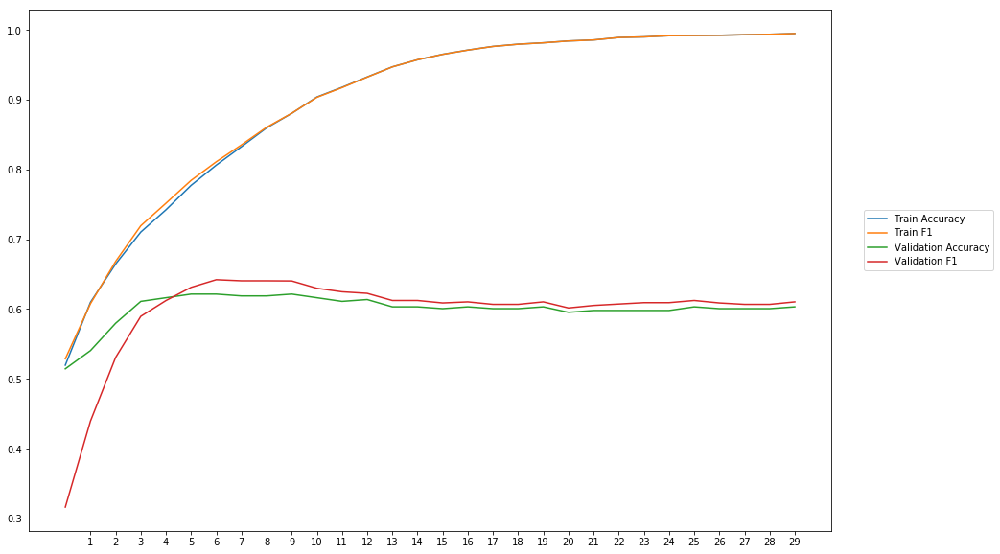

Average Accuracy: 60.04%
Average Precision: 59.67%
Average Recall: 60.40%
Average F1: 59.68%

-----Fold 6--------


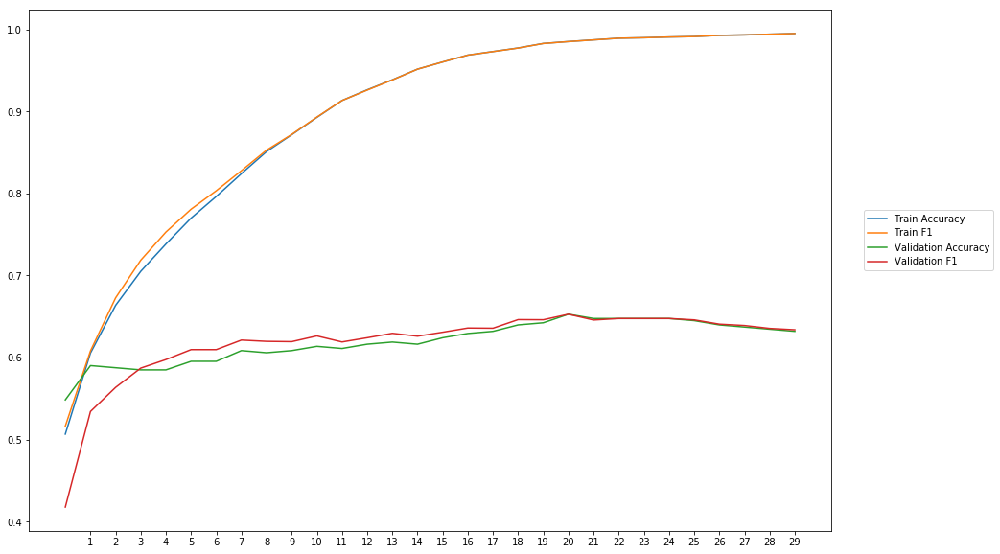

Average Accuracy: 61.94%
Average Precision: 61.74%
Average Recall: 62.20%
Average F1: 61.78%

-----Fold 7--------


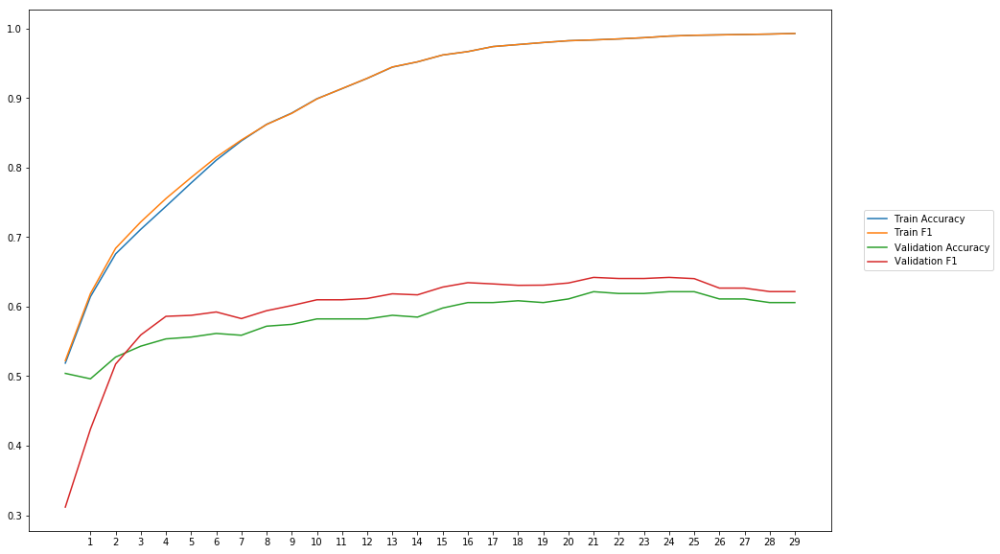

Average Accuracy: 58.45%
Average Precision: 57.40%
Average Recall: 62.88%
Average F1: 59.71%

-----Fold 8--------


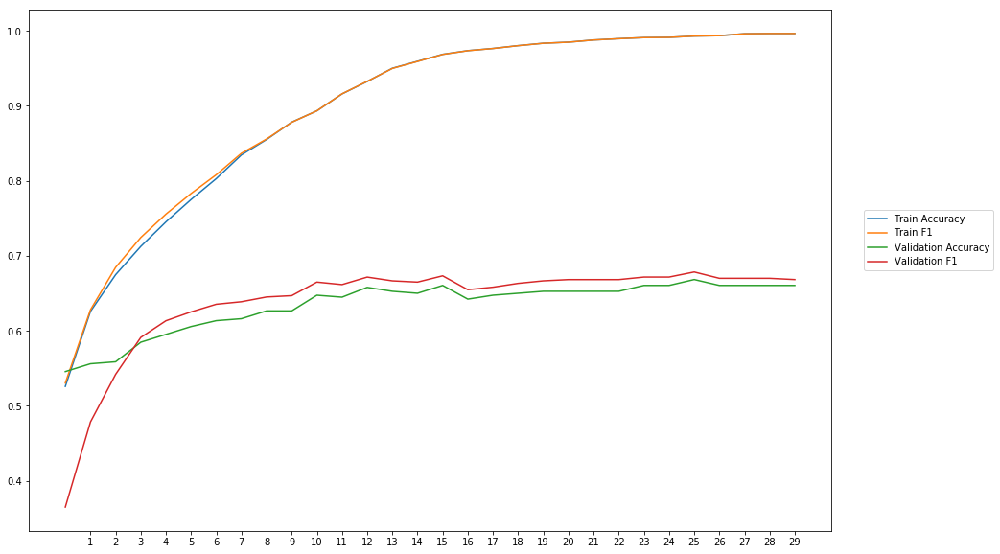

Average Accuracy: 63.42%
Average Precision: 62.59%
Average Recall: 65.74%
Average F1: 63.78%

-----Fold 9--------


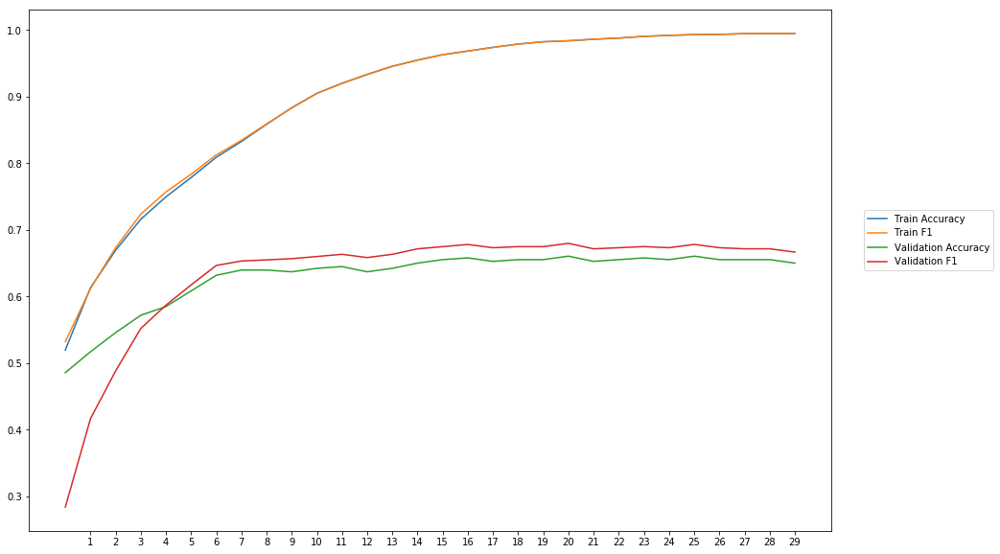

Average Accuracy: 63.05%
Average Precision: 61.71%
Average Recall: 65.69%
Average F1: 63.28%

-----Fold 10--------


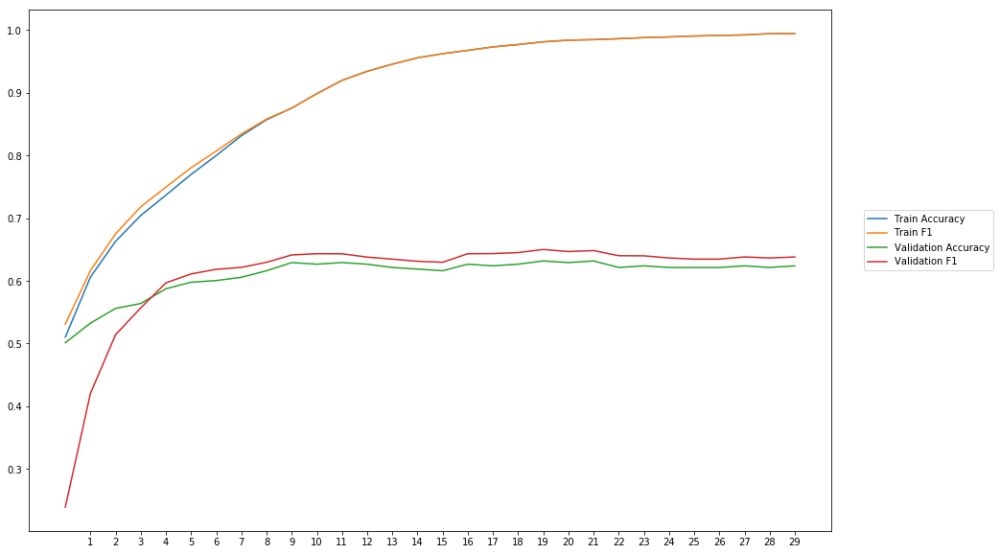

Average Accuracy: 60.93%
Average Precision: 60.10%
Average Recall: 62.55%
Average F1: 60.82%

-------Overallresults-------


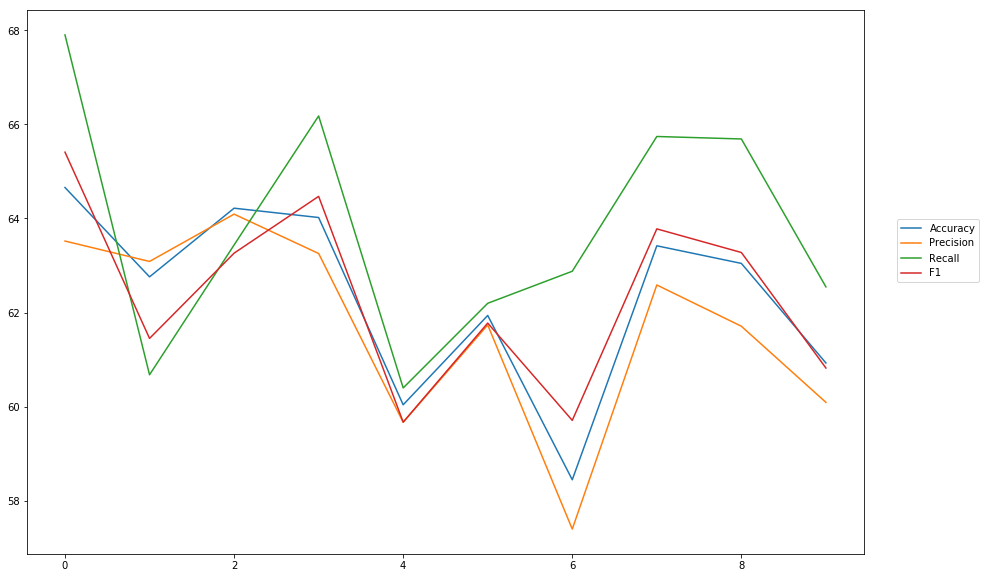

Accuracy: Mean = 62.35% (+/- 1.90%), Max = 64.66%, Min =  58.45%
Precision: Mean = 61.72% (+/- 1.98%), Max = 64.09%, Min =  57.40%
Recall: Mean = 63.77% (+/- 2.37%), Max = 67.90%, Min =  60.40%
F1: Mean = 62.36% (+/- 1.88%), Max = 65.41%, Min =  59.68%


In [21]:
cross_val_three_inputs(model_21, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_vadar, train_pos, train_labels, softmax, outputpath, 'separat_models_senti_vadar_pos')

## Separate models combine output

### average

In [22]:
#First model
wv_layer_22 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_22 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_22 = wv_layer_22(comment_input_22)
x_first_22 = Dense(600, activation='relu')(embedded_sequences_22)
x_first_22 = Flatten()(x_first_22)
first_preds_22 = Dense(2, activation='softmax')(x_first_22)

#Second model
senti_input_22_vadar = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_22 = Dense(600, activation='relu')(senti_input_22_vadar)
second_preds_22 = Dense(2, activation='softmax')(x_second_22)

#Thrid model
senti_input_22_pos = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_third_22 = Dense(600, activation='relu')(senti_input_22_pos)
third_preds_22 = Dense(2, activation='softmax')(x_third_22)

#Concat outputs
preds_22 = average([first_preds_22, second_preds_22, third_preds_22])

model_22 = Model(inputs=[comment_input_22, senti_input_22_vadar, senti_input_22_pos], outputs=preds_22)
model_22.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_19 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_7 (Embedding)         (None, 40, 300)      4118700     input_19[0][0]                   
__________________________________________________________________________________________________
dense_21 (Dense)                (None, 40, 600)      180600      embedding_7[0][0]                
__________________________________________________________________________________________________
input_20 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
input_21 (


-----Fold 1--------


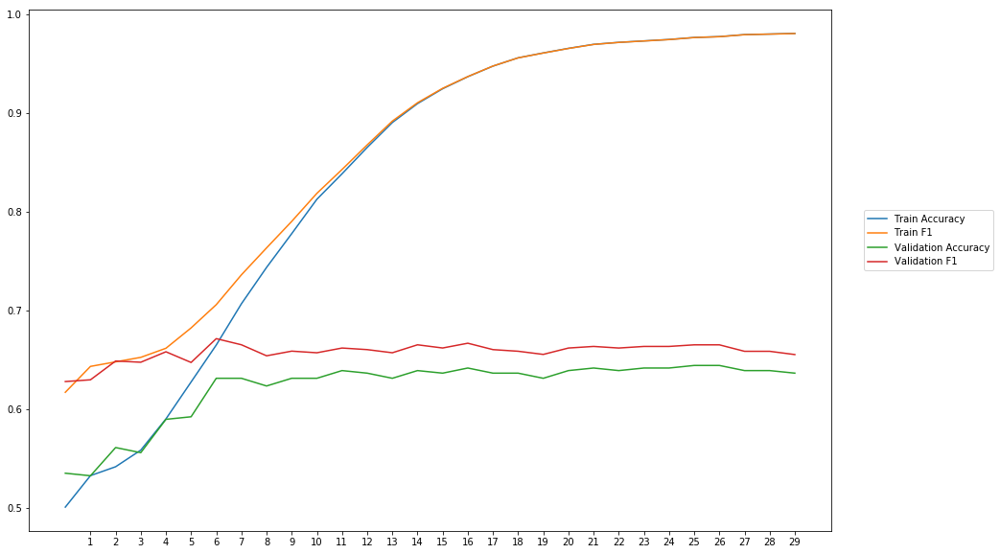

Average Accuracy: 62.16%
Average Precision: 60.29%
Average Recall: 72.73%
Average F1: 65.76%

-----Fold 2--------


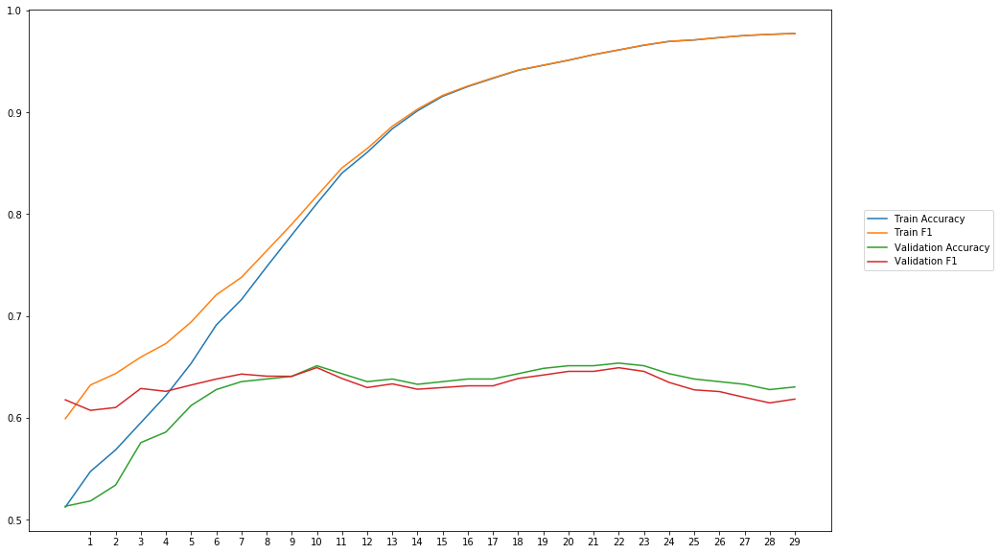

Average Accuracy: 62.33%
Average Precision: 62.12%
Average Recall: 64.92%
Average F1: 63.20%

-----Fold 3--------


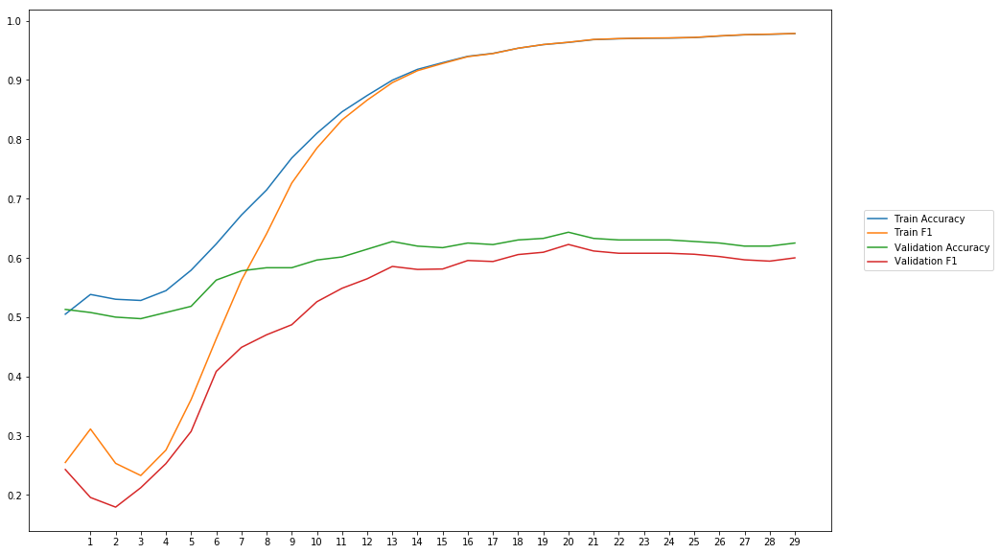

Average Accuracy: 59.41%
Average Precision: 61.48%
Average Recall: 44.50%
Average F1: 50.18%

-----Fold 4--------


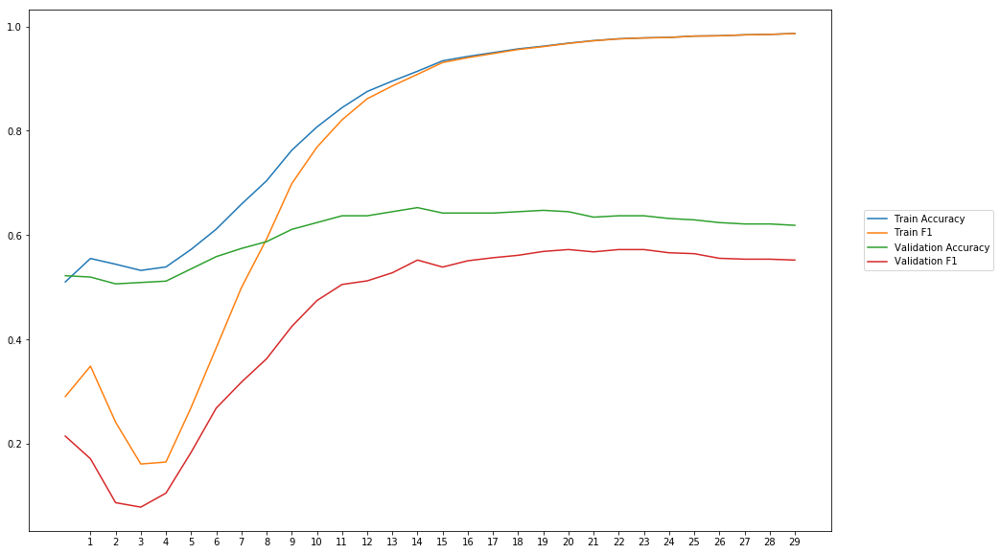

Average Accuracy: 60.50%
Average Precision: 71.14%
Average Recall: 34.33%
Average F1: 43.98%

-----Fold 5--------


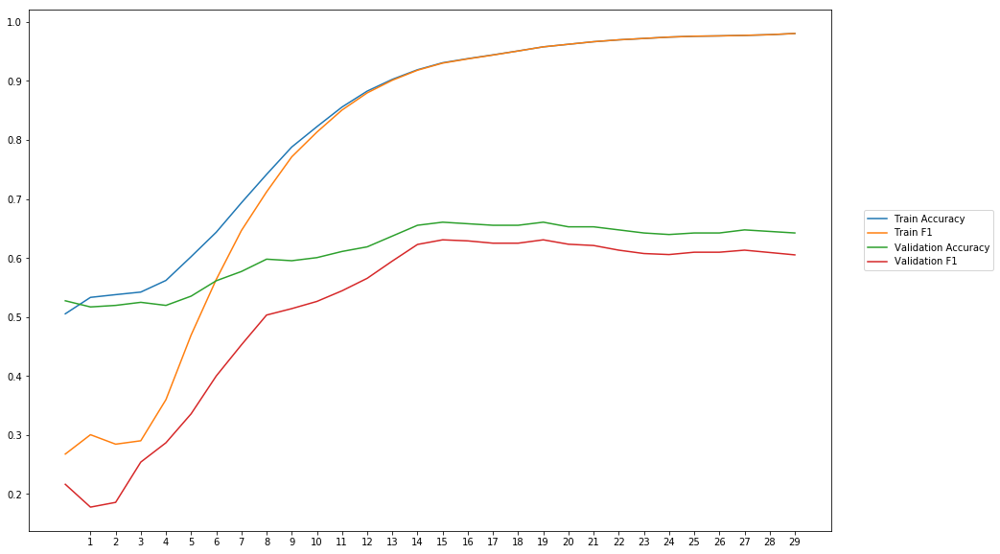

Average Accuracy: 61.14%
Average Precision: 65.26%
Average Recall: 44.76%
Average F1: 51.46%

-----Fold 6--------


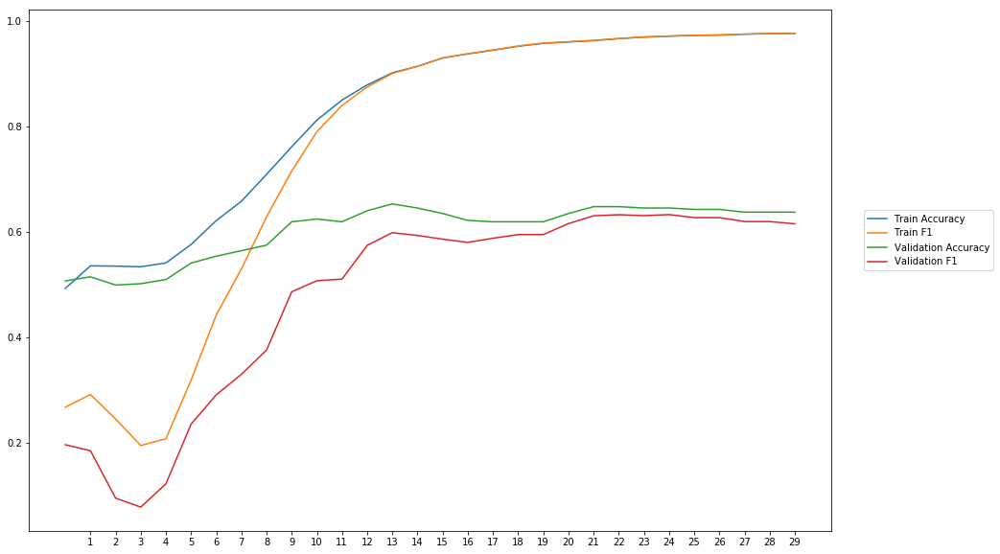

Average Accuracy: 60.30%
Average Precision: 64.92%
Average Recall: 41.83%
Average F1: 47.87%

-----Fold 7--------


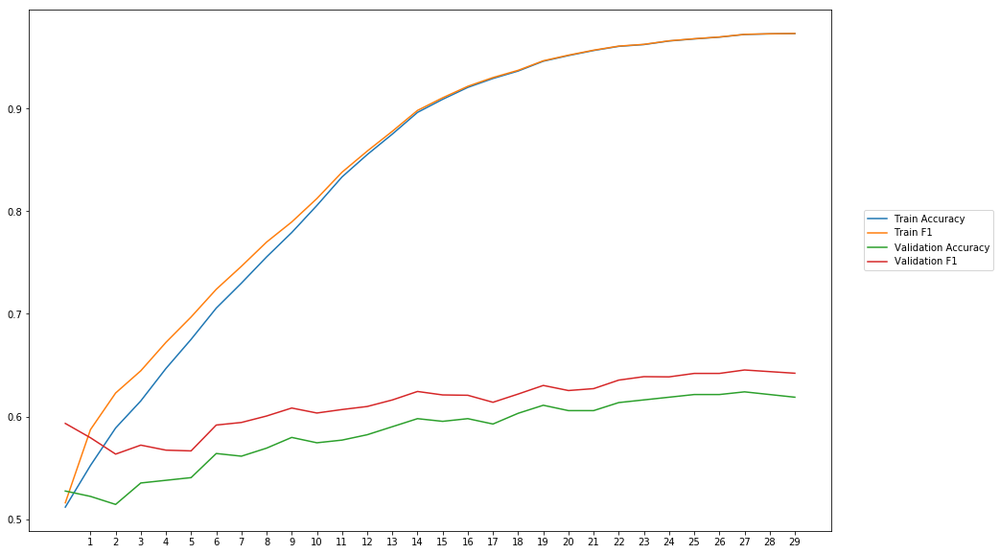

Average Accuracy: 58.47%
Average Precision: 57.37%
Average Recall: 65.83%
Average F1: 61.28%

-----Fold 8--------


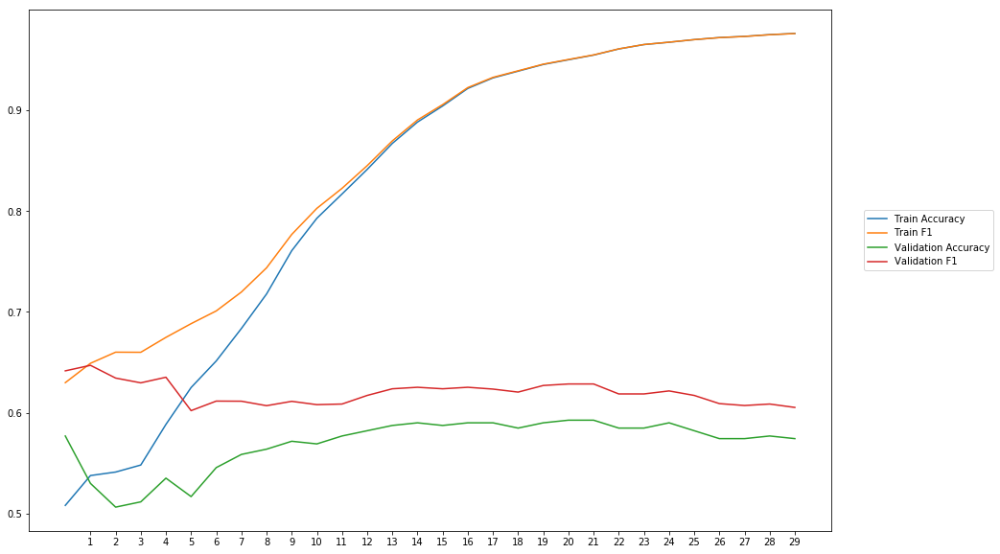

Average Accuracy: 56.98%
Average Precision: 55.65%
Average Recall: 70.49%
Average F1: 62.00%

-----Fold 9--------


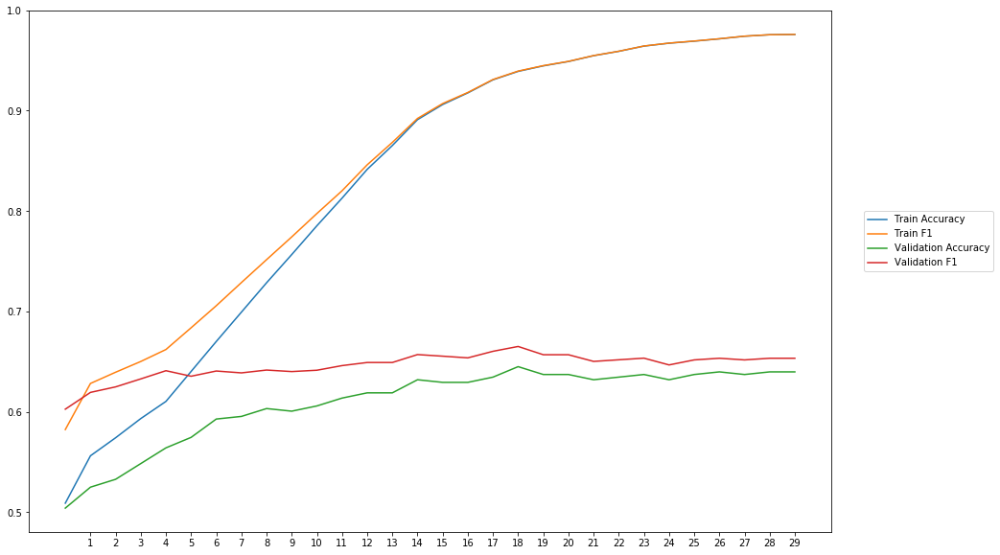

Average Accuracy: 60.90%
Average Precision: 59.34%
Average Recall: 71.24%
Average F1: 64.57%

-----Fold 10--------


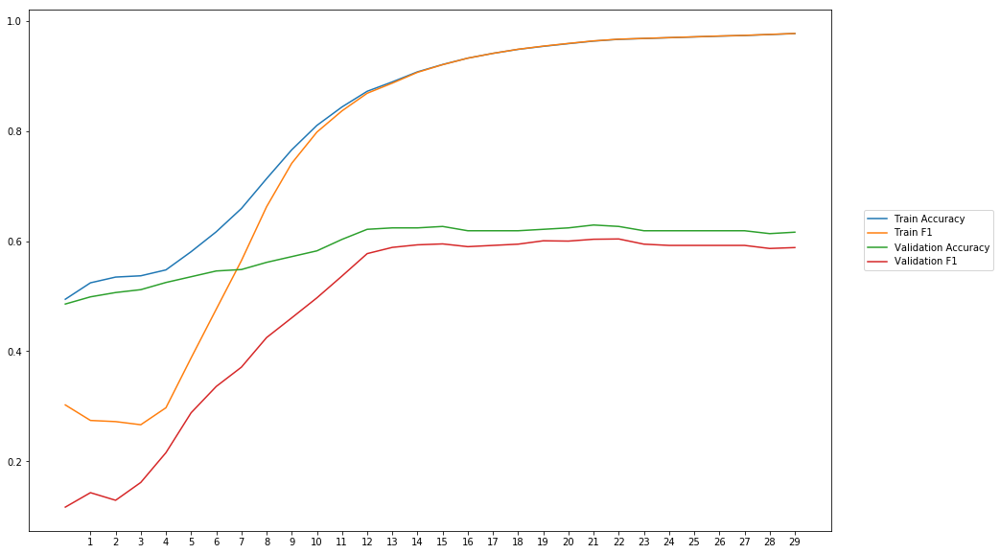

Average Accuracy: 58.84%
Average Precision: 61.42%
Average Recall: 42.25%
Average F1: 47.85%

-------Overallresults-------


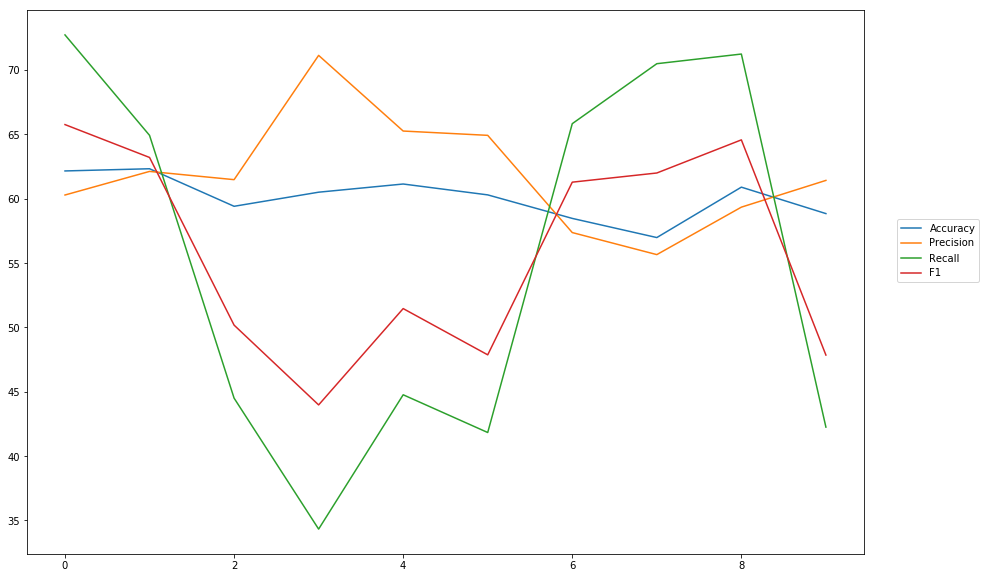

Accuracy: Mean = 60.10% (+/- 1.60%), Max = 62.33%, Min =  56.98%
Precision: Mean = 61.90% (+/- 4.18%), Max = 71.14%, Min =  55.65%
Recall: Mean = 55.29% (+/- 14.18%), Max = 72.73%, Min =  34.33%
F1: Mean = 55.81% (+/- 7.85%), Max = 65.76%, Min =  43.98%


In [23]:
cross_val_three_inputs(model_22, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_vadar, train_pos, train_labels, softmax, outputpath, 'combined_outputs_senti_vadar_pos')

# Combine POS, BLOB and Vadar

## Combine Inputs

In [10]:
#Input Words
wv_layer_23 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_23 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_23 = wv_layer_23(comment_input_23)
embedded_sequences_23 = Flatten()(embedded_sequences_23)

#Input Senti + POS
senti_input_23_blob = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
senti_input_23_vadar = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
senti_input_23_pos = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')

#Concat Inputs
concat_23 = concatenate([embedded_sequences_23, senti_input_23_blob, senti_input_23_vadar, senti_input_23_pos], axis=1)

x_23 = Dense(600, activation='relu')(concat_23)
preds_23 = Dense(2, activation='softmax')(x_23)

# build the model
model_23 = Model(inputs=[comment_input_23, senti_input_23_blob, senti_input_23_vadar, senti_input_23_pos], outputs=preds_23)
model_23.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 40, 300)      4118700     input_1[0][0]                    
__________________________________________________________________________________________________
flatten_1 (Flatten)             (None, 12000)        0           embedding_1[0][0]                
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
input_3 (I


-----Fold 1--------


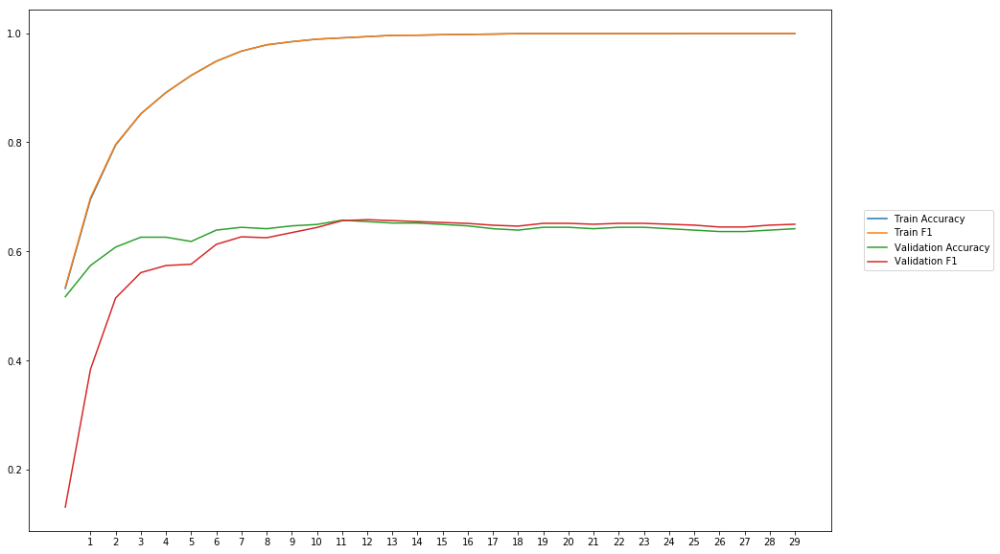

Average Accuracy: 63.45%
Average Precision: 64.60%
Average Recall: 59.67%
Average F1: 60.82%

-----Fold 2--------


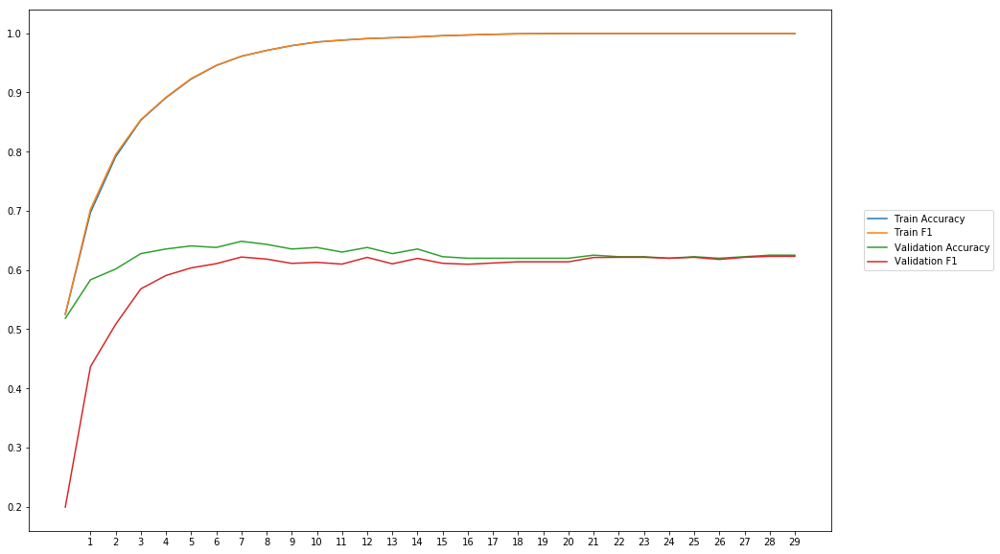

Average Accuracy: 62.22%
Average Precision: 63.62%
Average Recall: 56.30%
Average F1: 59.02%

-----Fold 3--------


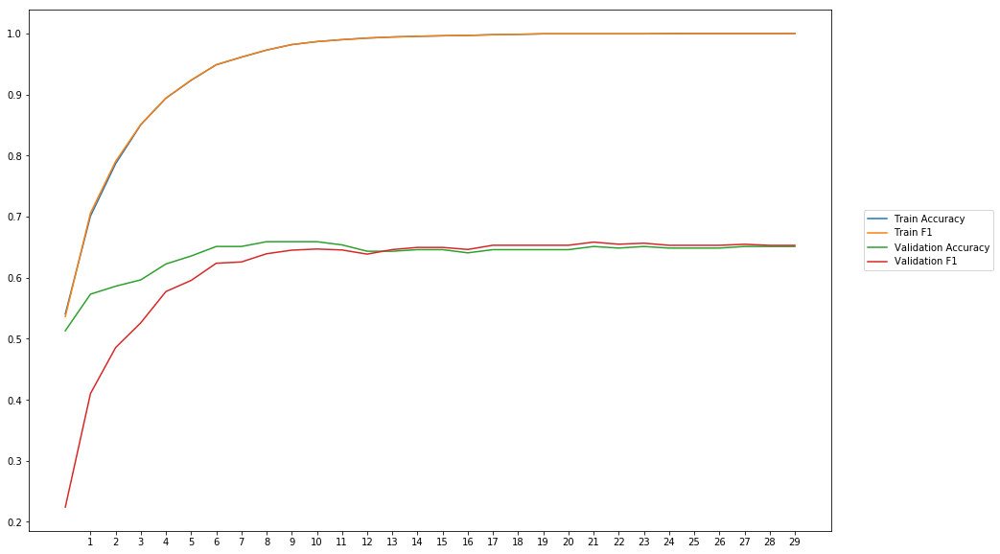

Average Accuracy: 63.70%
Average Precision: 64.39%
Average Recall: 59.81%
Average F1: 61.25%

-----Fold 4--------


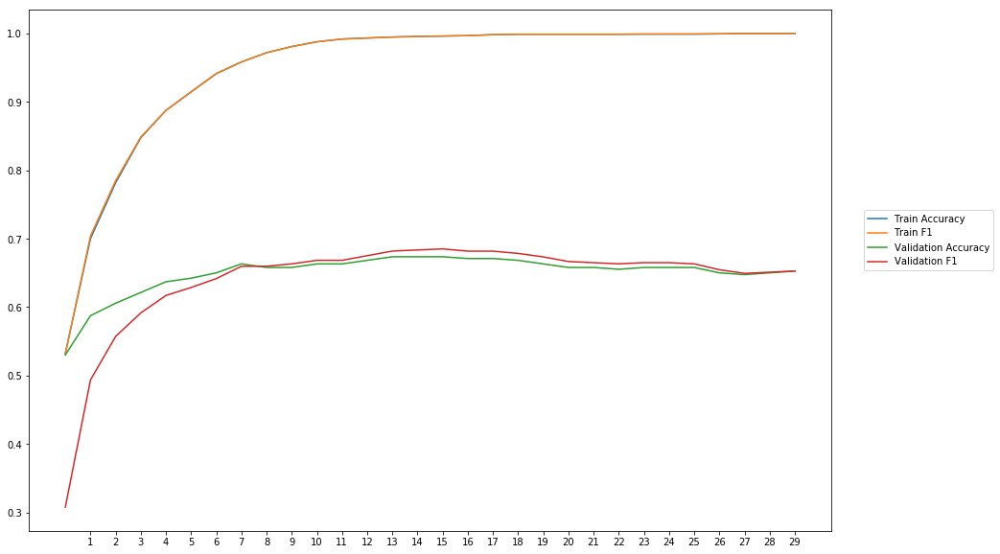

Average Accuracy: 64.96%
Average Precision: 64.96%
Average Recall: 63.91%
Average F1: 63.98%

-----Fold 5--------


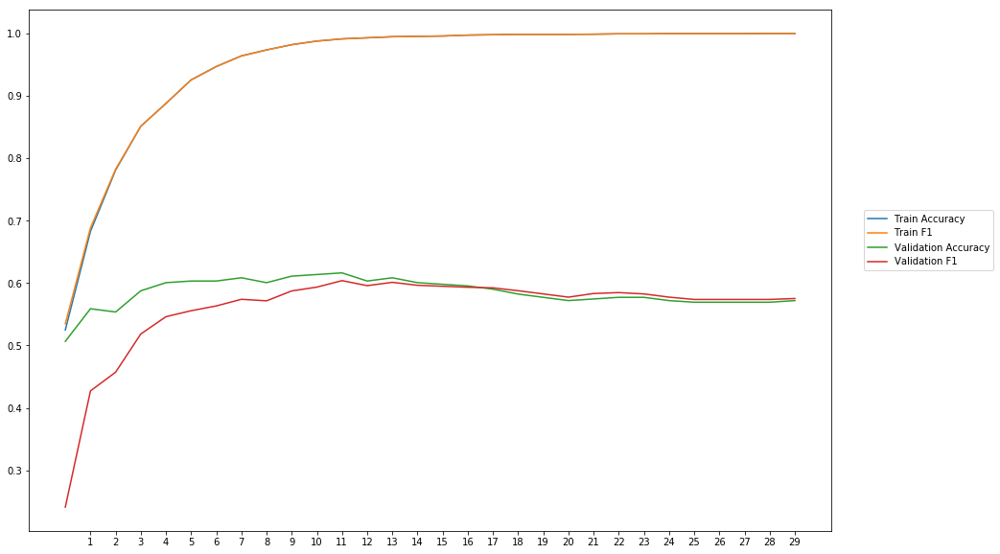

Average Accuracy: 58.46%
Average Precision: 59.19%
Average Recall: 53.91%
Average F1: 55.85%

-----Fold 6--------


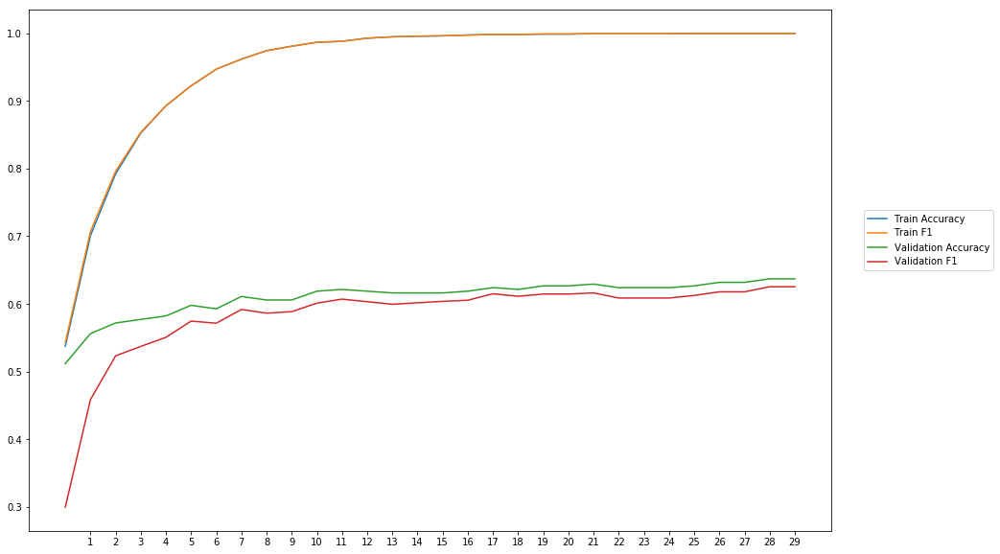

Average Accuracy: 61.01%
Average Precision: 61.95%
Average Recall: 55.55%
Average F1: 58.33%

-----Fold 7--------


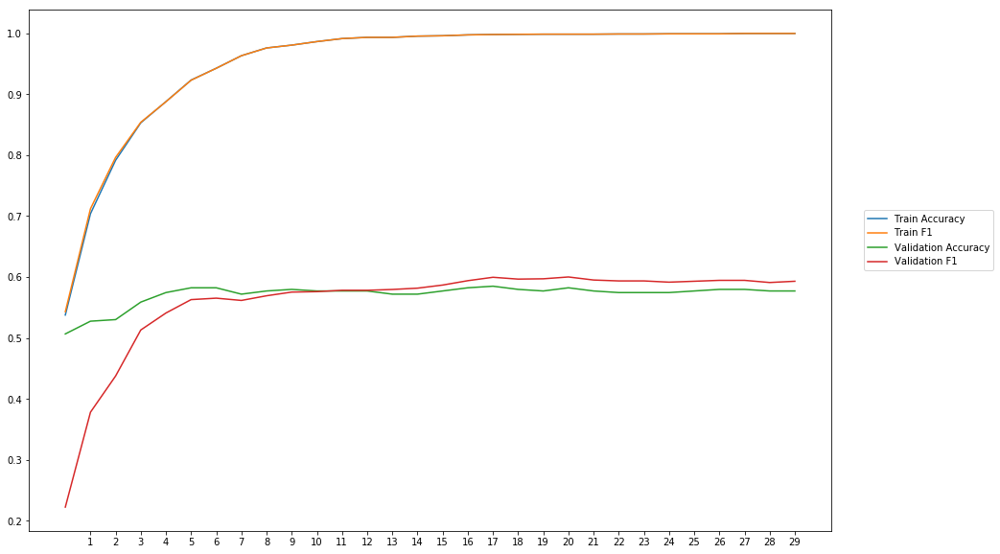

Average Accuracy: 57.13%
Average Precision: 57.02%
Average Recall: 55.81%
Average F1: 55.77%

-----Fold 8--------


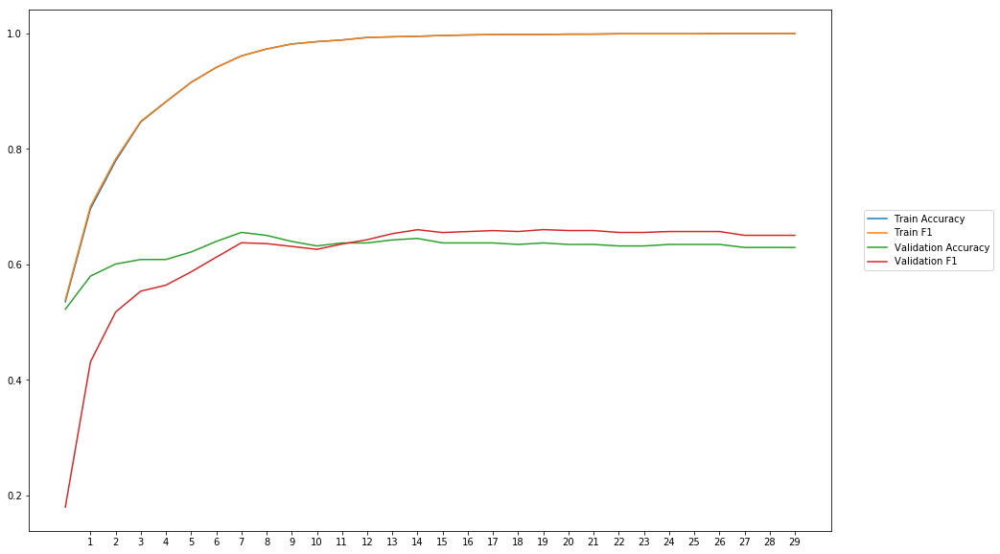

Average Accuracy: 62.75%
Average Precision: 63.06%
Average Recall: 61.87%
Average F1: 61.34%

-----Fold 9--------


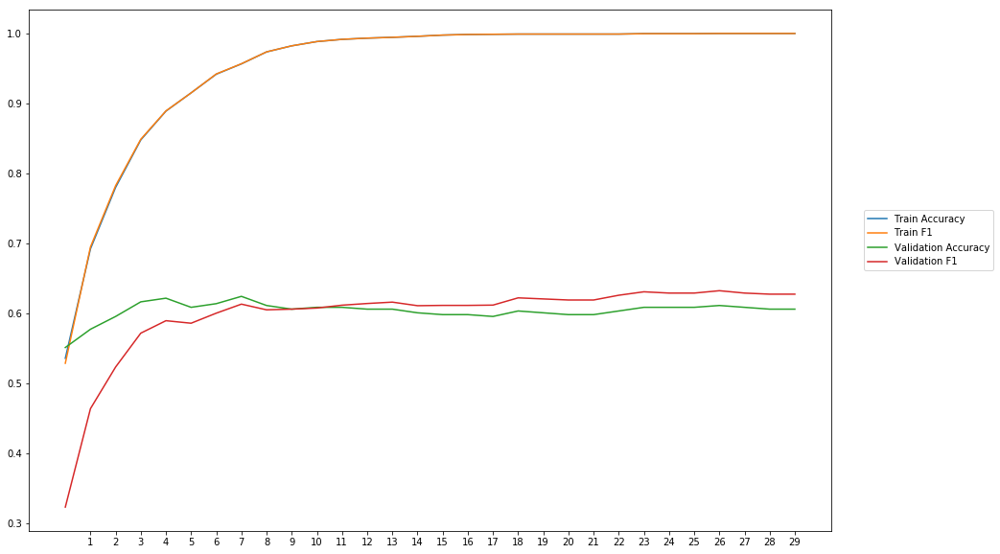

Average Accuracy: 60.34%
Average Precision: 60.59%
Average Recall: 59.97%
Average F1: 59.60%

-----Fold 10--------


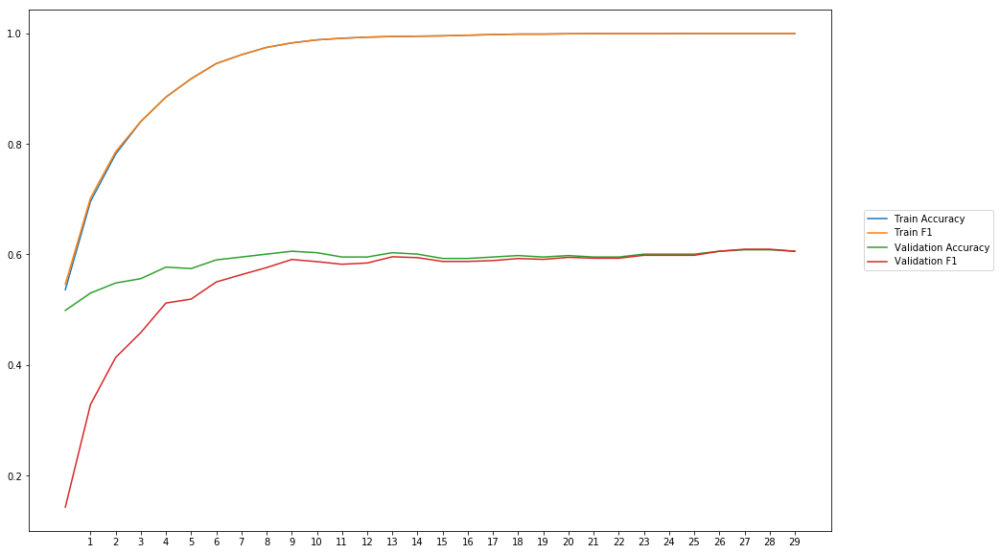

Average Accuracy: 58.89%
Average Precision: 59.57%
Average Recall: 52.84%
Average F1: 55.17%

-------Overallresults-------


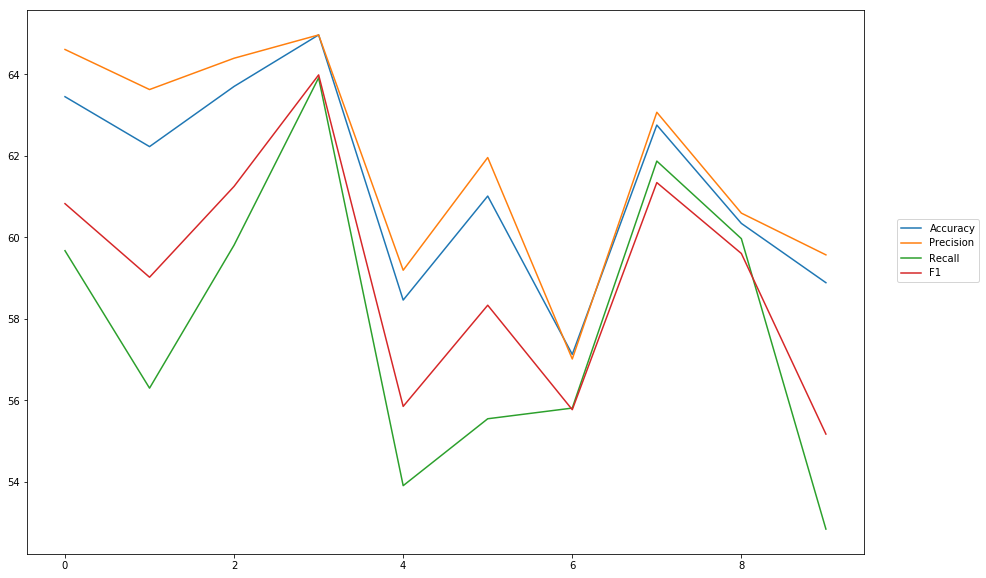

Accuracy: Mean = 61.29% (+/- 2.43%), Max = 64.96%, Min =  57.13%
Precision: Mean = 61.90% (+/- 2.56%), Max = 64.96%, Min =  57.02%
Recall: Mean = 57.96% (+/- 3.42%), Max = 63.91%, Min =  52.84%
F1: Mean = 59.11% (+/- 2.73%), Max = 63.98%, Min =  55.17%


In [11]:
cross_val_four_inputs(model_23, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_senti_vadar, train_pos, train_labels, softmax, outputpath, 'combined_input_senti_Blob_vadar_pos')

## Seperate Models combine results

In [10]:
#First part
wv_layer_24 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_24 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_24 = wv_layer_24(comment_input_24)
x_first_24 = Dense(600, activation='relu')(embedded_sequences_24)
x_first_24 = Flatten()(x_first_24)

#Second part
senti_input_24_vadar = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_24 = Dense(600, activation='relu')(senti_input_24_vadar)

#Thrid part
senti_input_24_pos = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_third_24 = Dense(600, activation='relu')(senti_input_24_pos)

#Fourth part
senti_input_24_blob = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_fourth_24 = Dense(600, activation='relu')(senti_input_24_blob)

#Concatination
concat_24 = concatenate([x_first_24, x_second_24, x_third_24, x_fourth_24])

preds_24 = Dense(2, activation='softmax')(concat_24)

model_24 = Model(inputs=[comment_input_24, senti_input_24_vadar, senti_input_24_pos, senti_input_24_blob], outputs=preds_24)
model_24.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 40, 300)      4118700     input_1[0][0]                    
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 40, 600)      180600      embedding_1[0][0]                
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 40)           0                                            
__________________________________________________________________________________________________
input_3 (I


-----Fold 1--------


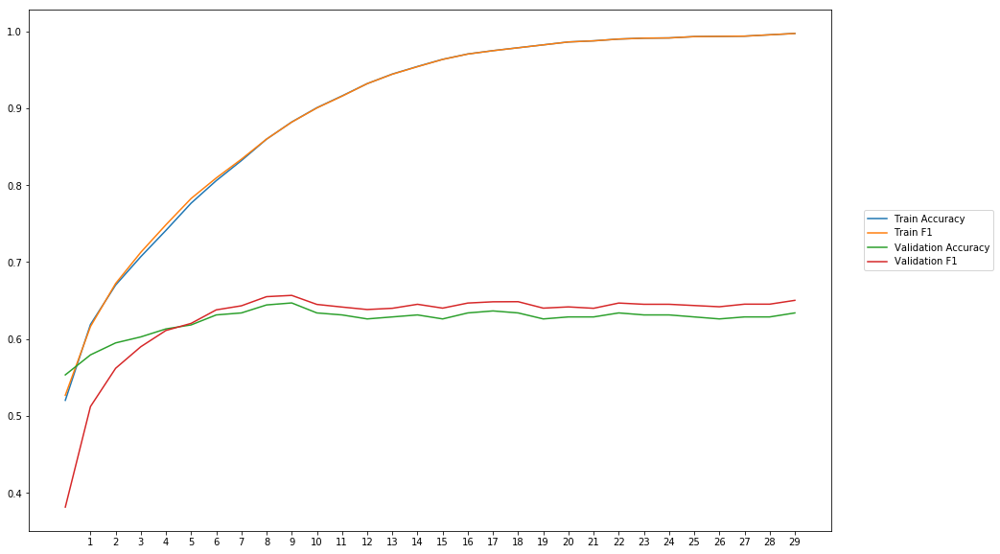

Average Accuracy: 62.41%
Average Precision: 61.94%
Average Recall: 63.72%
Average F1: 62.48%

-----Fold 2--------


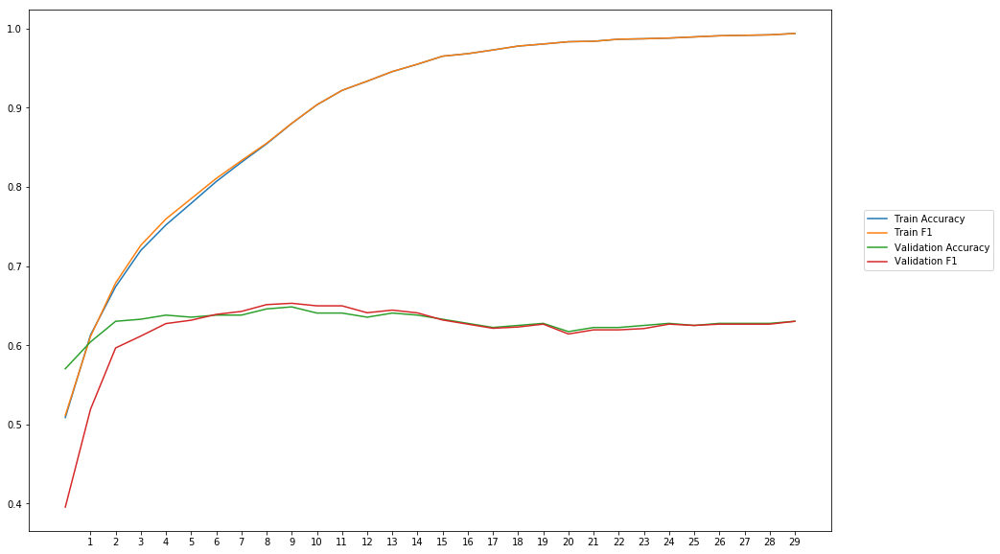

Average Accuracy: 62.88%
Average Precision: 63.15%
Average Recall: 61.29%
Average F1: 61.86%

-----Fold 3--------


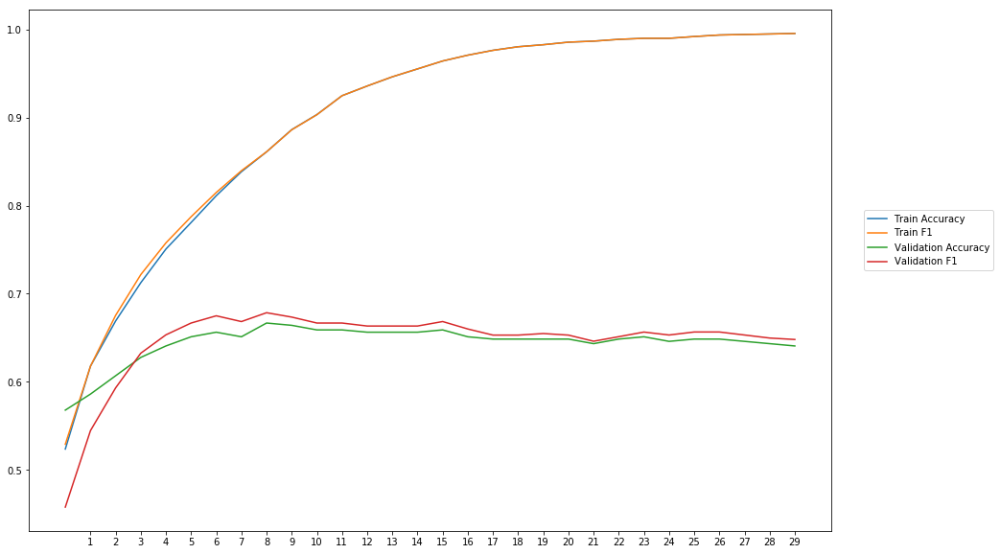

Average Accuracy: 64.41%
Average Precision: 63.70%
Average Recall: 65.83%
Average F1: 64.59%

-----Fold 4--------


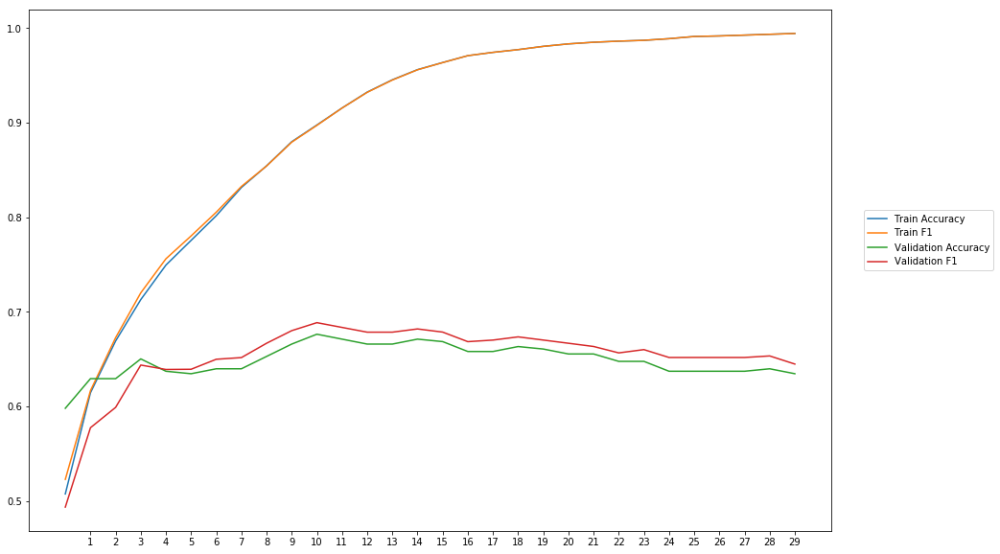

Average Accuracy: 64.87%
Average Precision: 64.34%
Average Recall: 66.54%
Average F1: 65.20%

-----Fold 5--------


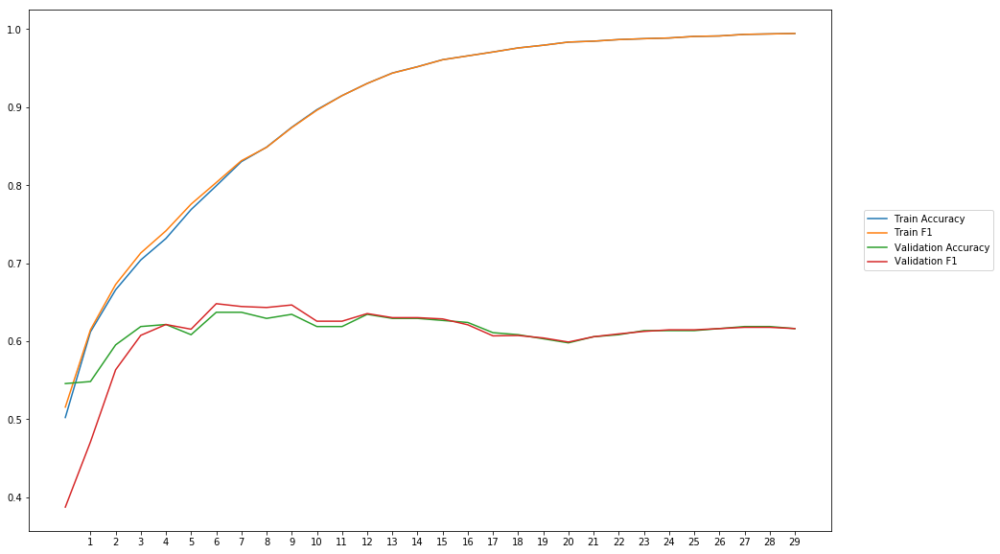

Average Accuracy: 61.34%
Average Precision: 61.34%
Average Recall: 60.40%
Average F1: 60.62%

-----Fold 6--------


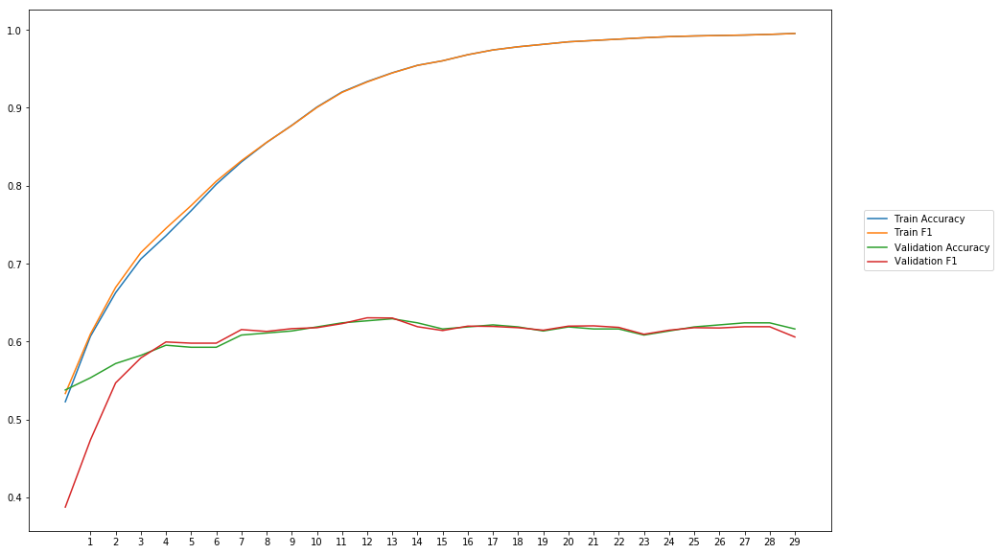

Average Accuracy: 60.83%
Average Precision: 60.90%
Average Recall: 59.49%
Average F1: 59.98%

-----Fold 7--------


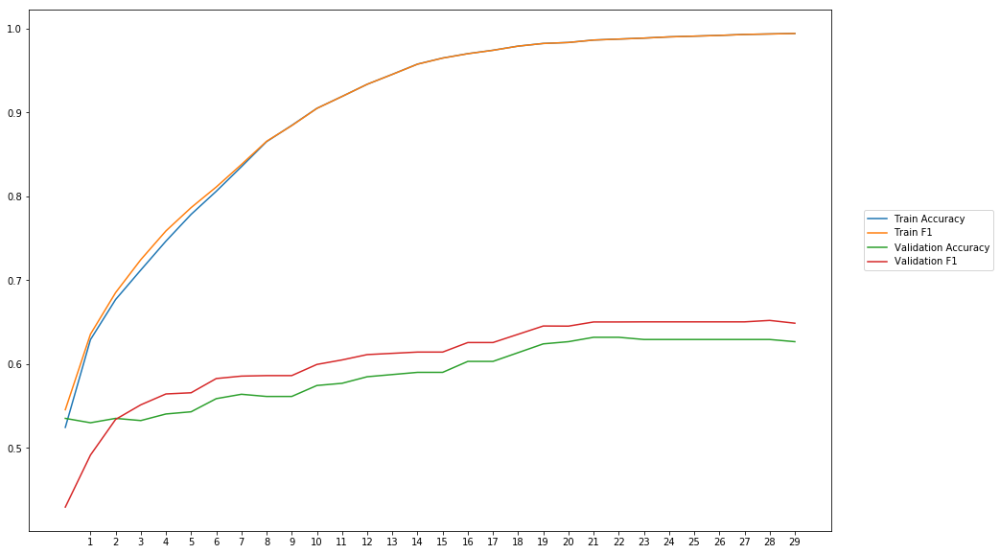

Average Accuracy: 59.01%
Average Precision: 58.03%
Average Recall: 63.61%
Average F1: 60.54%

-----Fold 8--------


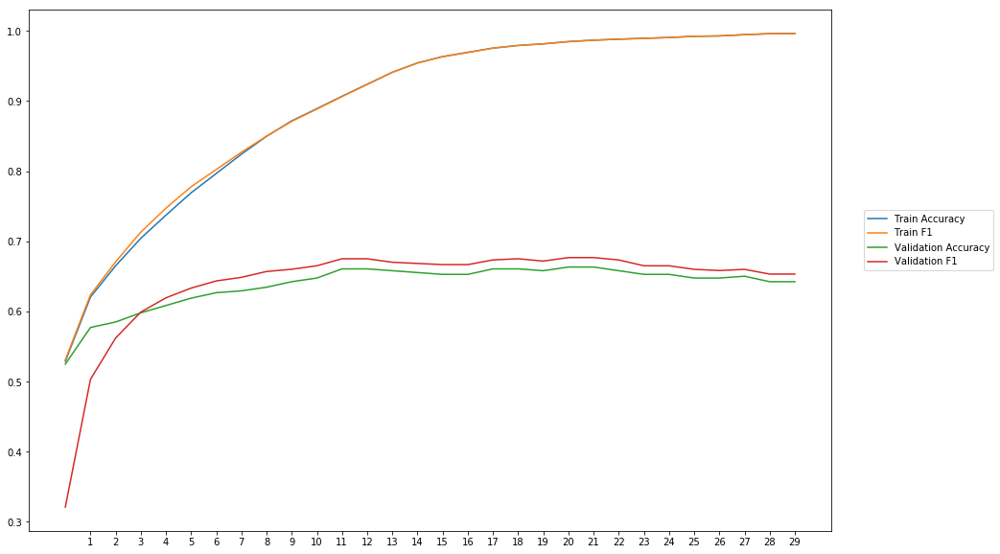

Average Accuracy: 63.77%
Average Precision: 62.89%
Average Recall: 65.86%
Average F1: 63.98%

-----Fold 9--------


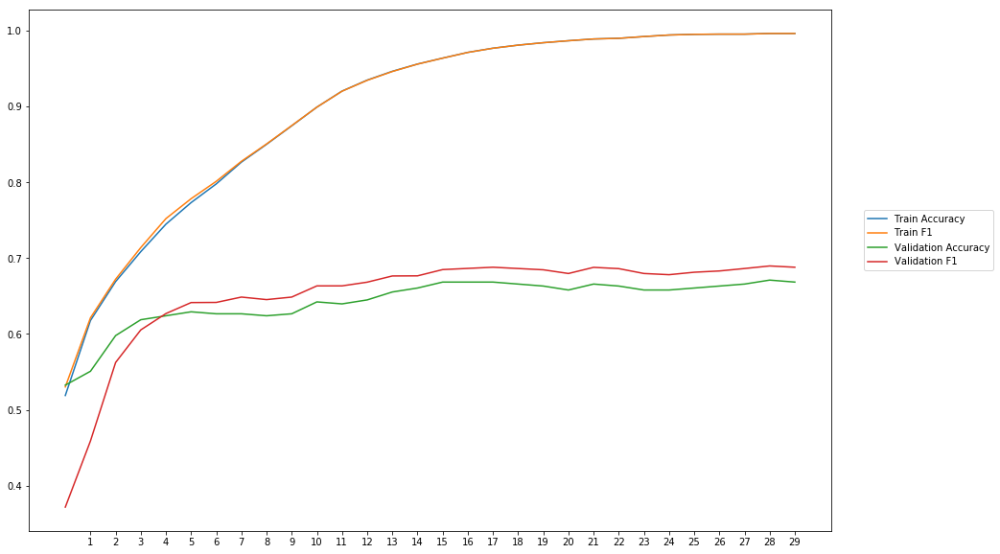

Average Accuracy: 64.22%
Average Precision: 62.94%
Average Recall: 67.77%
Average F1: 64.90%

-----Fold 10--------


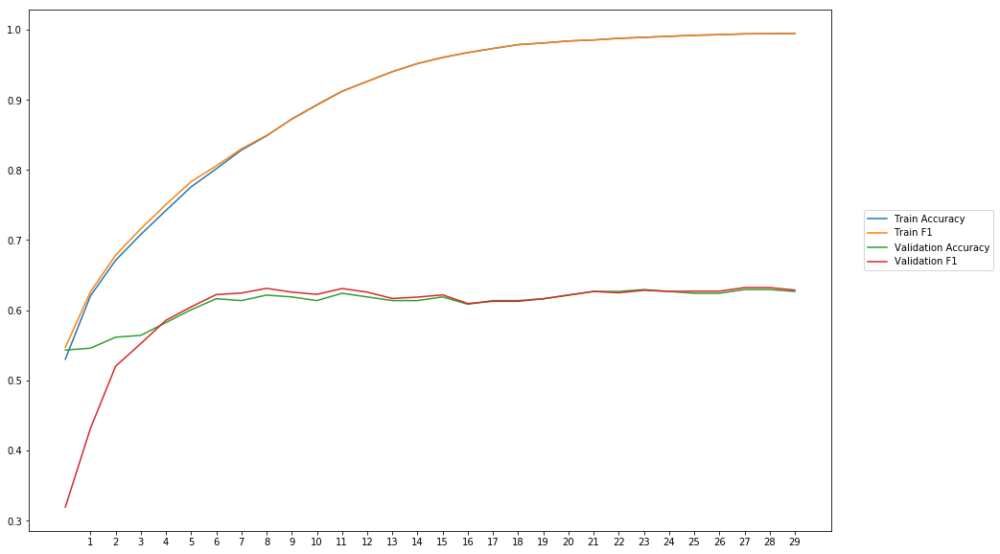

Average Accuracy: 60.95%
Average Precision: 61.04%
Average Recall: 59.70%
Average F1: 59.92%

-------Overallresults-------


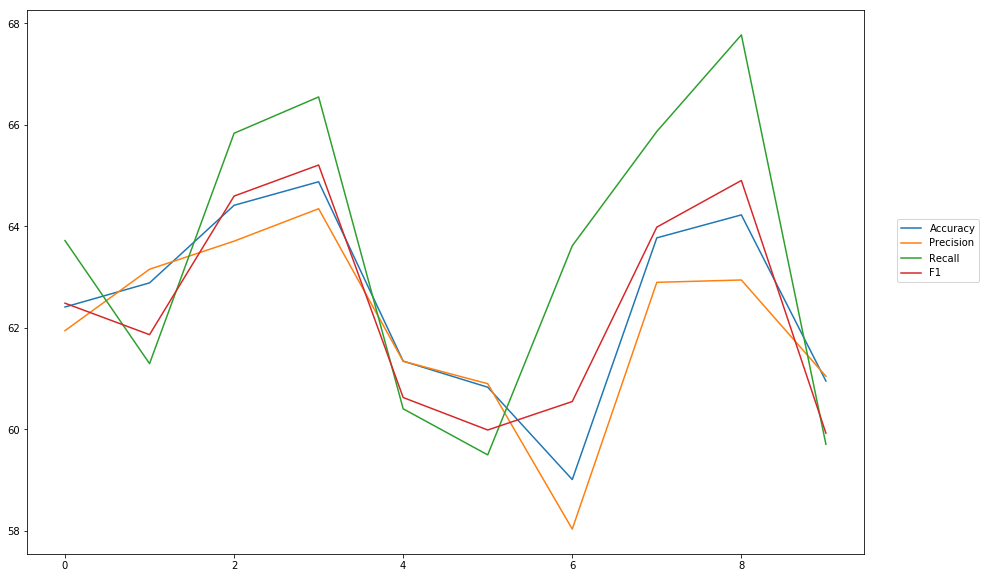

Accuracy: Mean = 62.47% (+/- 1.81%), Max = 64.87%, Min =  59.01%
Precision: Mean = 62.03% (+/- 1.72%), Max = 64.34%, Min =  58.03%
Recall: Mean = 63.42% (+/- 2.89%), Max = 67.77%, Min =  59.49%
F1: Mean = 62.41% (+/- 2.01%), Max = 65.20%, Min =  59.92%


In [14]:
cross_val_four_inputs(model_24, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_vadar, train_pos, train_senti_blob, train_labels, softmax, outputpath, 'separat_models_senti_blob_vadar_pos')

## Separate models combine output

### average

In [16]:
#First model
wv_layer_25 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

comment_input_25 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float32')
embedded_sequences_25 = wv_layer_25(comment_input_25)
x_first_25 = Dense(600, activation='relu')(embedded_sequences_25)
x_first_25 = Flatten()(x_first_25)
first_preds_25 = Dense(2, activation='softmax')(x_first_25)

#Second model
senti_input_25_vadar = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_second_25 = Dense(600, activation='relu')(senti_input_25_vadar)
second_preds_25 = Dense(2, activation='softmax')(x_second_25)

#Thrid model
senti_input_25_pos = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_third_25 = Dense(600, activation='relu')(senti_input_25_pos)
third_preds_25 = Dense(2, activation='softmax')(x_third_25)

#Fourt Model
senti_input_25_blob = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='float')
x_fourth_25 = Dense(600, activation='relu')(senti_input_25_blob)
fourth_preds_25 = Dense(2, activation='softmax')(x_fourth_25)


#Concat outputs
preds_25 = average([first_preds_25, second_preds_25, third_preds_25, fourth_preds_25])

model_25 = Model(inputs=[comment_input_25, senti_input_25_vadar, senti_input_25_pos, senti_input_25_blob], outputs=preds_25)
model_25.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_17 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
embedding_5 (Embedding)         (None, 40, 300)      4118700     input_17[0][0]                   
__________________________________________________________________________________________________
dense_20 (Dense)                (None, 40, 600)      180600      embedding_5[0][0]                
__________________________________________________________________________________________________
input_18 (InputLayer)           (None, 40)           0                                            
__________________________________________________________________________________________________
input_19 (


-----Fold 1--------


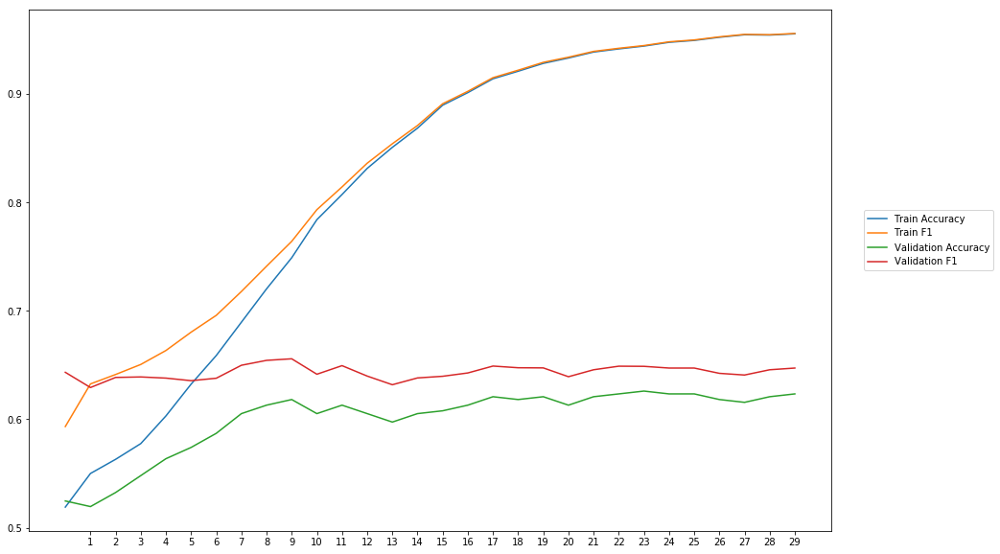

Average Accuracy: 60.00%
Average Precision: 58.28%
Average Recall: 72.29%
Average F1: 64.34%

-----Fold 2--------


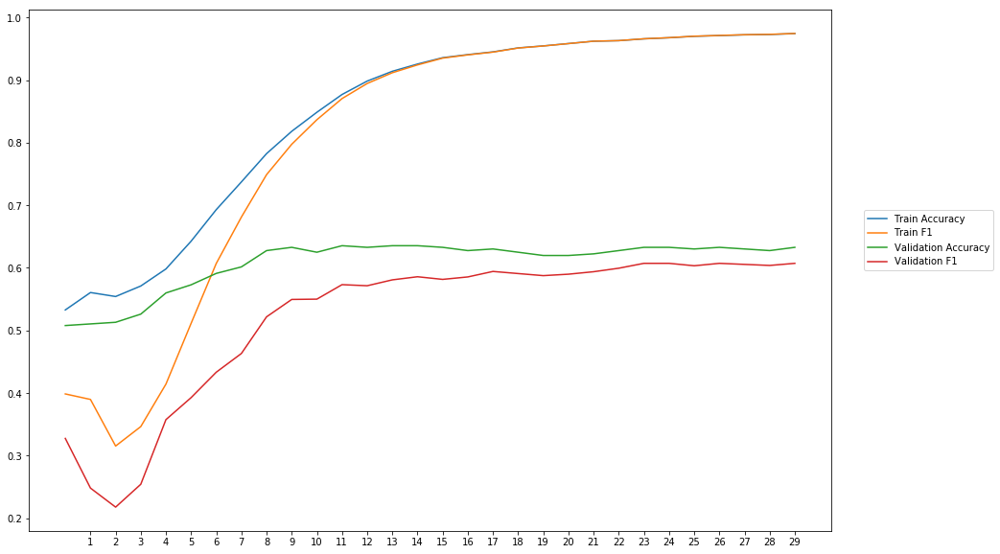

Average Accuracy: 60.77%
Average Precision: 64.76%
Average Recall: 45.15%
Average F1: 51.97%

-----Fold 3--------


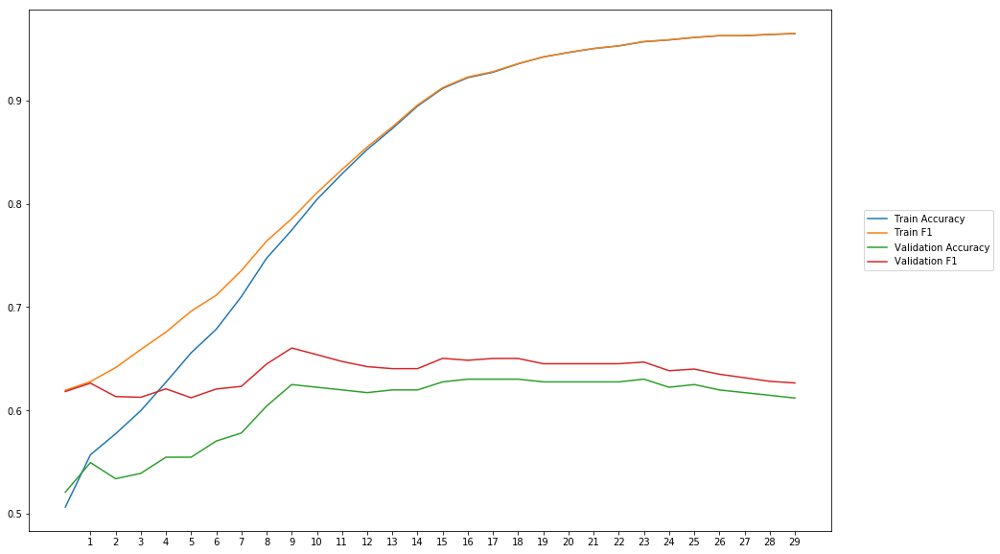

Average Accuracy: 60.33%
Average Precision: 58.81%
Average Recall: 69.77%
Average F1: 63.68%

-----Fold 4--------


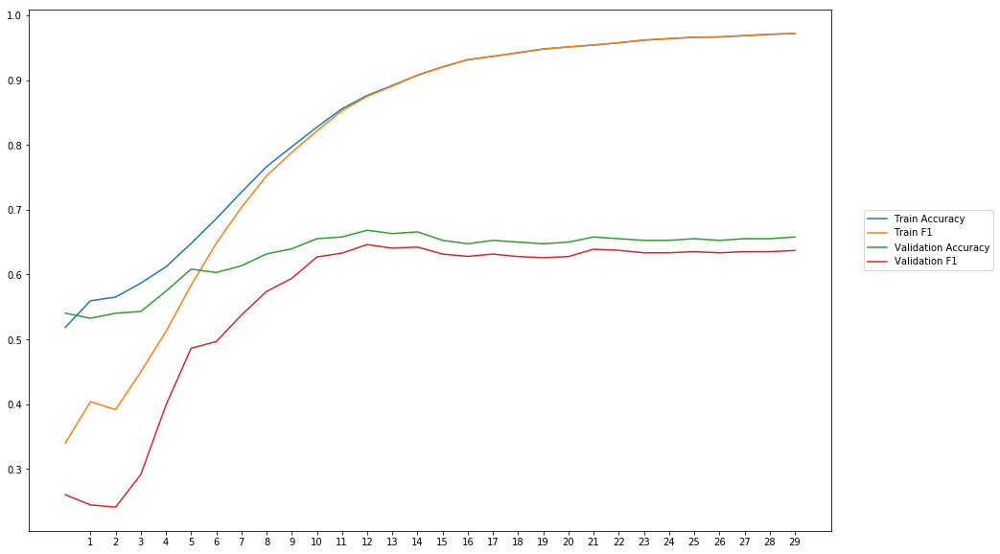

Average Accuracy: 63.12%
Average Precision: 67.23%
Average Recall: 50.51%
Average F1: 56.03%

-----Fold 5--------


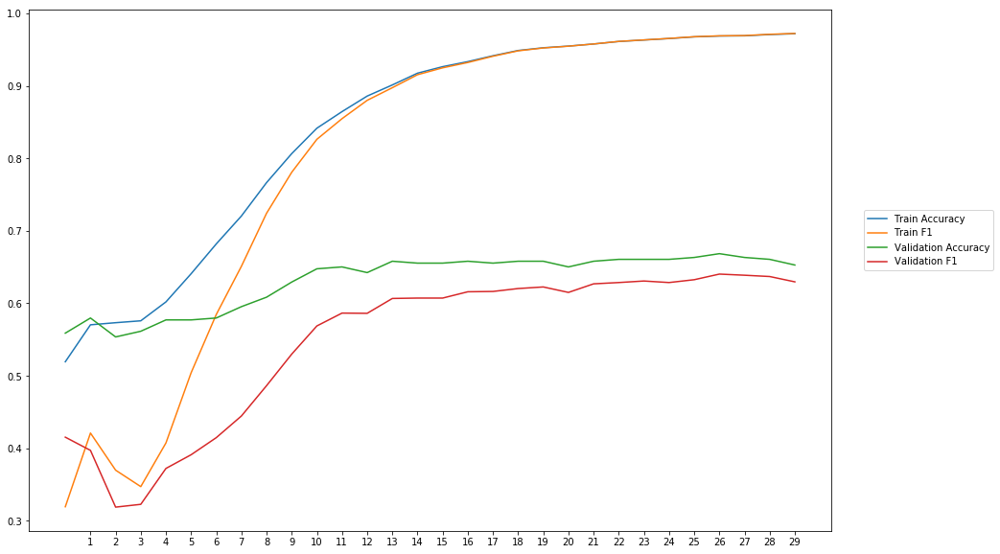

Average Accuracy: 63.19%
Average Precision: 69.35%
Average Recall: 46.91%
Average F1: 54.79%

-----Fold 6--------


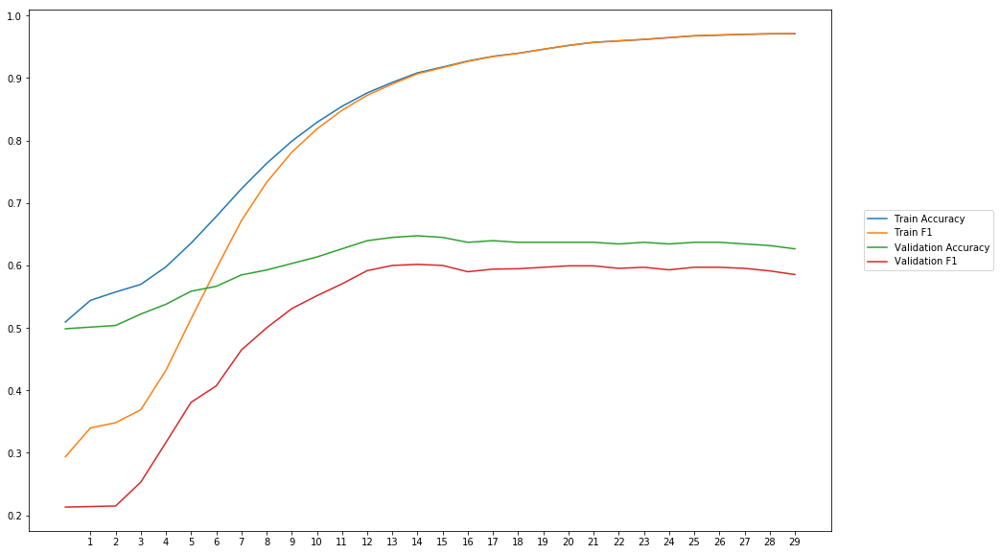

Average Accuracy: 60.62%
Average Precision: 64.35%
Average Recall: 43.94%
Average F1: 51.13%

-----Fold 7--------


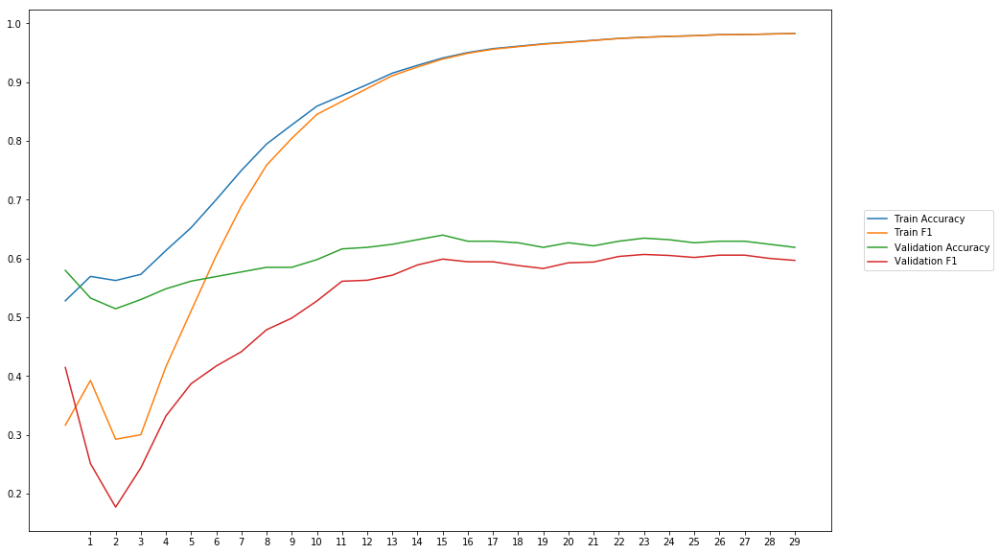

Average Accuracy: 60.29%
Average Precision: 64.37%
Average Recall: 44.83%
Average F1: 51.41%

-----Fold 8--------


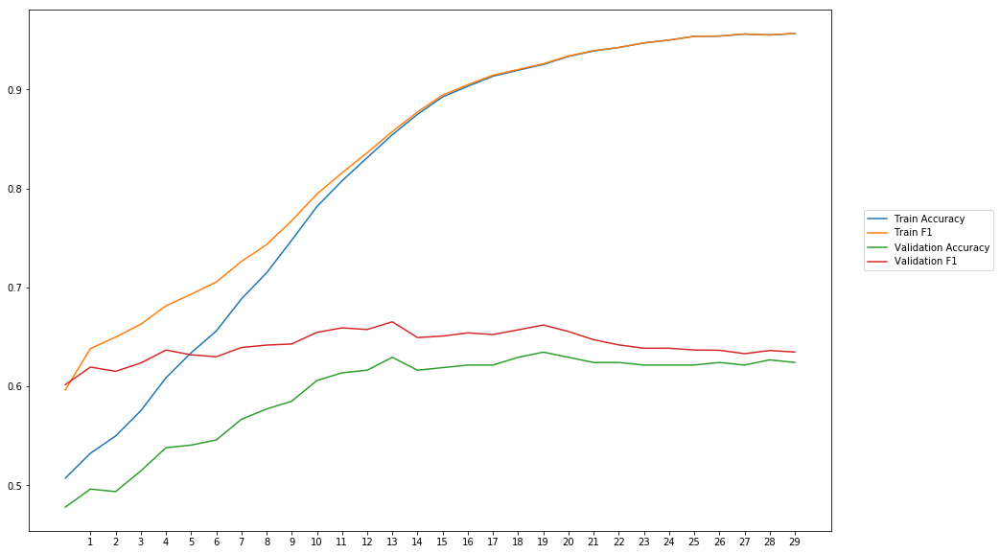

Average Accuracy: 59.26%
Average Precision: 57.81%
Average Recall: 72.81%
Average F1: 64.13%

-----Fold 9--------


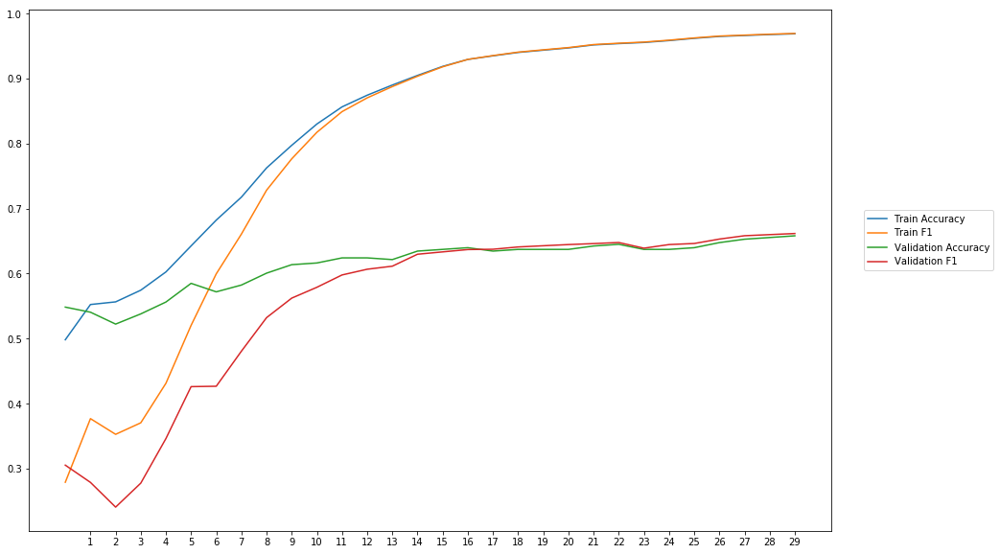

Average Accuracy: 61.38%
Average Precision: 63.84%
Average Recall: 52.06%
Average F1: 55.30%

-----Fold 10--------


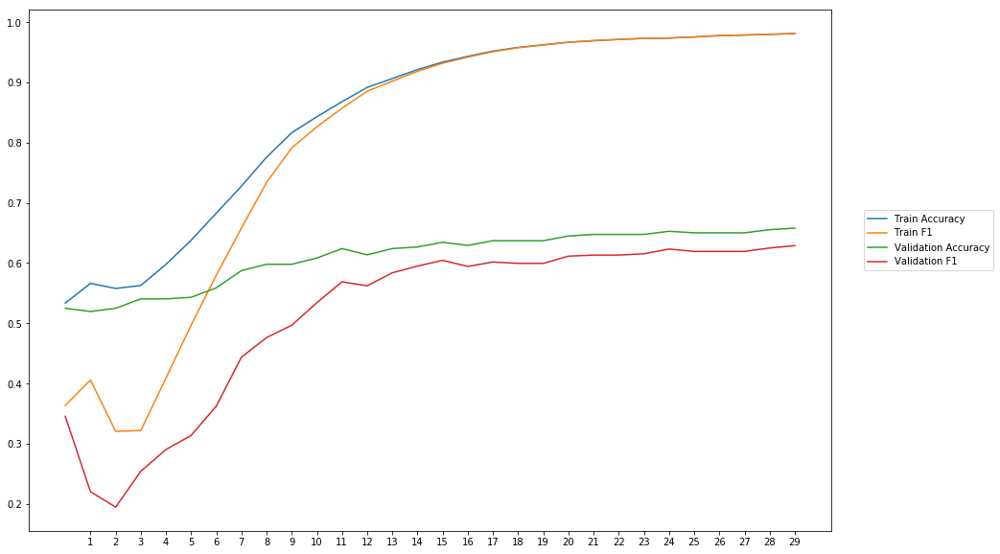

Average Accuracy: 61.04%
Average Precision: 65.68%
Average Recall: 44.54%
Average F1: 51.43%

-------Overallresults-------


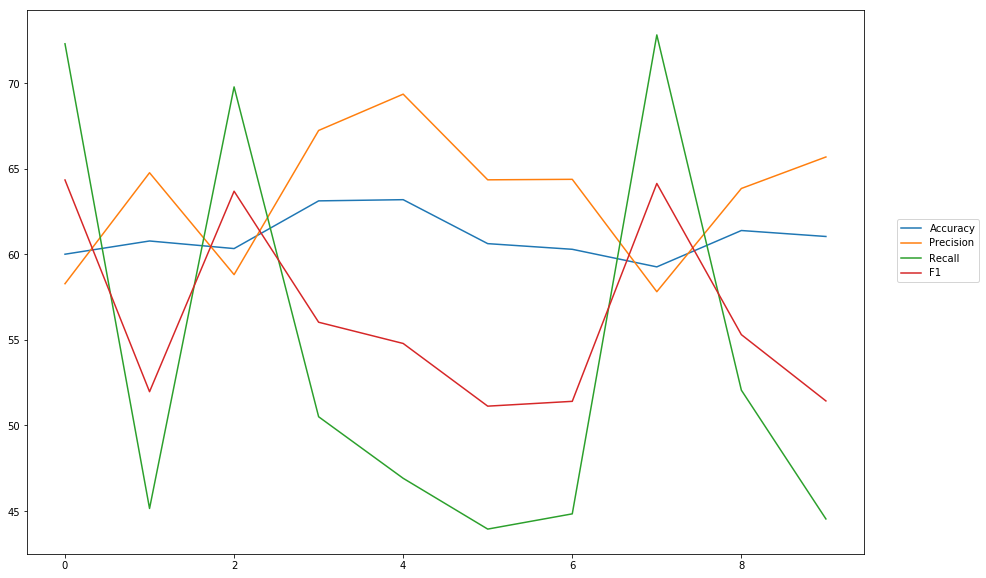

Accuracy: Mean = 61.00% (+/- 1.21%), Max = 63.19%, Min =  59.26%
Precision: Mean = 63.45% (+/- 3.71%), Max = 69.35%, Min =  57.81%
Recall: Mean = 54.28% (+/- 11.64%), Max = 72.81%, Min =  43.94%
F1: Mean = 56.42% (+/- 5.26%), Max = 64.34%, Min =  51.13%


In [18]:
cross_val_four_inputs(model_25, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_vadar, train_pos, train_senti_blob, train_labels, softmax, outputpath, 'combined_outputs_senti_blob_vadar_pos')

# Test the best model with heldout testdata

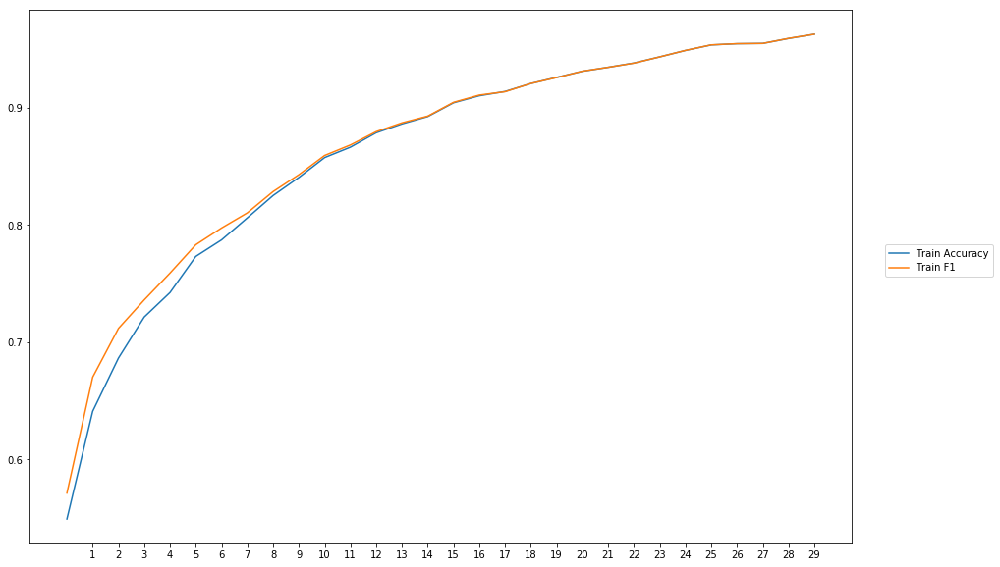


-----Test Scores----
Loss: 0.6231226945409969
Accuracy: 65.81632653061224
Precision: 55.890410943591675
Recall: 65.59485528437466
F1: 60.355024599848115


In [17]:
train_evaluate_two_inputs(model_2, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_labels, test_data, test_pos, test_labels, softmax, outputpath, 'final_additionalFeature_pos')

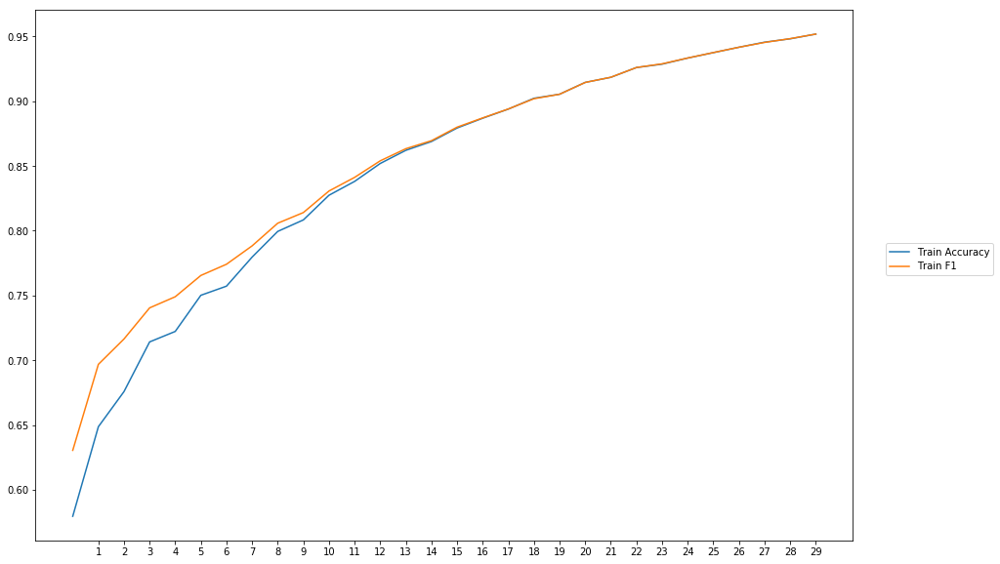


-----Test Scores----
Loss: 0.6192809246024307
Accuracy: 66.3265306122449
Precision: 56.509695275205075
Recall: 65.59485528437466
F1: 60.71428072389674


In [18]:
train_evaluate_two_inputs(model_10, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_labels, test_data, test_senti_blob, test_labels, softmax, outputpath, 'final_additionalFeature_blob')

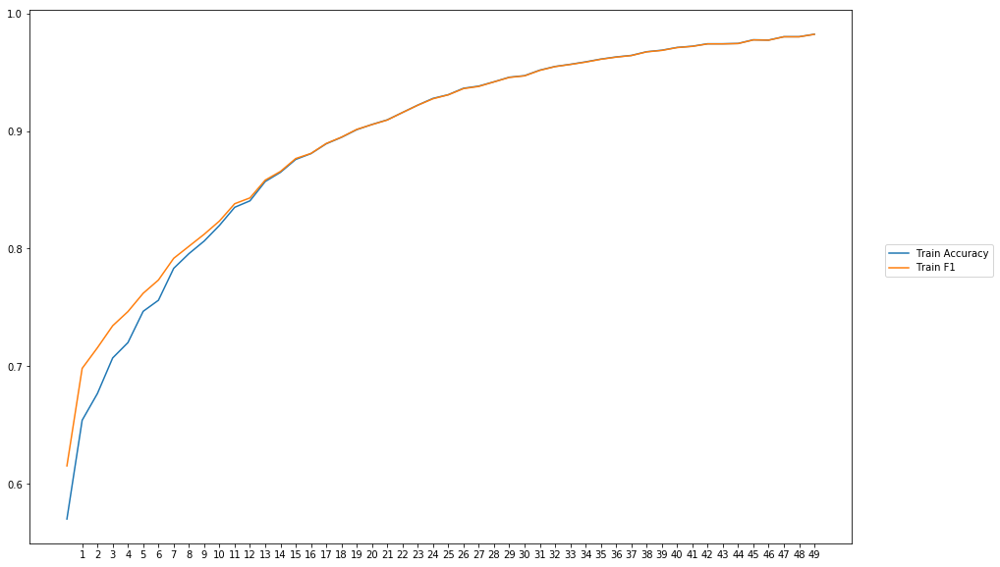


-----Test Scores----
Loss: 0.6088843941688538
Accuracy: 68.87755102040816
Precision: 59.279778376930814
Recall: 68.81028936694203
F1: 63.690471199201426


In [15]:
train_evaluate_two_inputs(model_10, 50, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_labels, test_data, test_senti_blob, test_labels, softmax, outputpath, 'final_additionalFeature_blob_more_epochs')

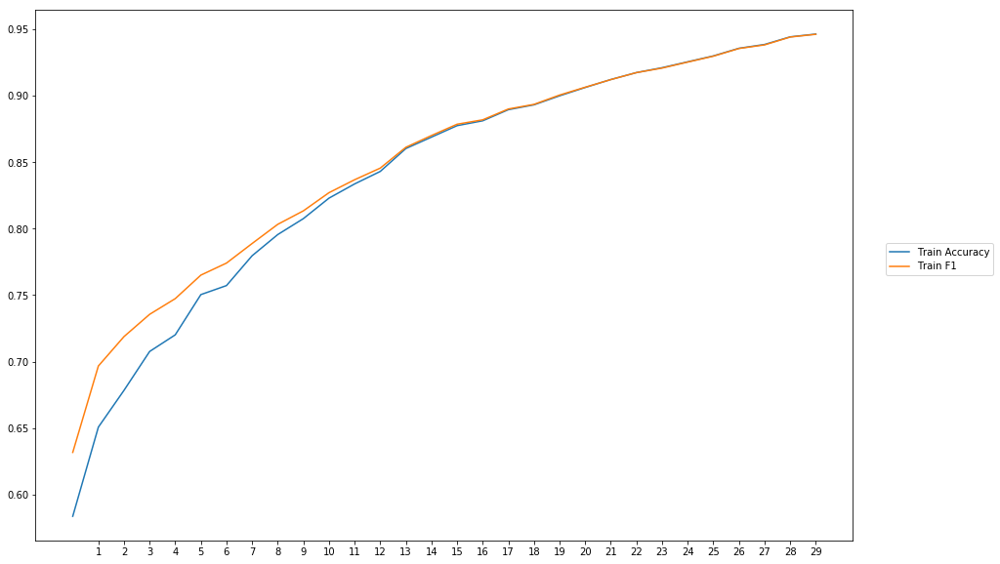


-----Test Scores----
Loss: 0.5973918024374514
Accuracy: 69.38775510204081
Precision: 59.079283872358246
Recall: 74.2765273073066
F1: 65.81196085815088


In [19]:
train_evaluate_two_inputs(model_13, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_vadar, train_labels, test_data, test_senti_vadar, test_labels, softmax, outputpath, 'final_additionalFeature_vadar')

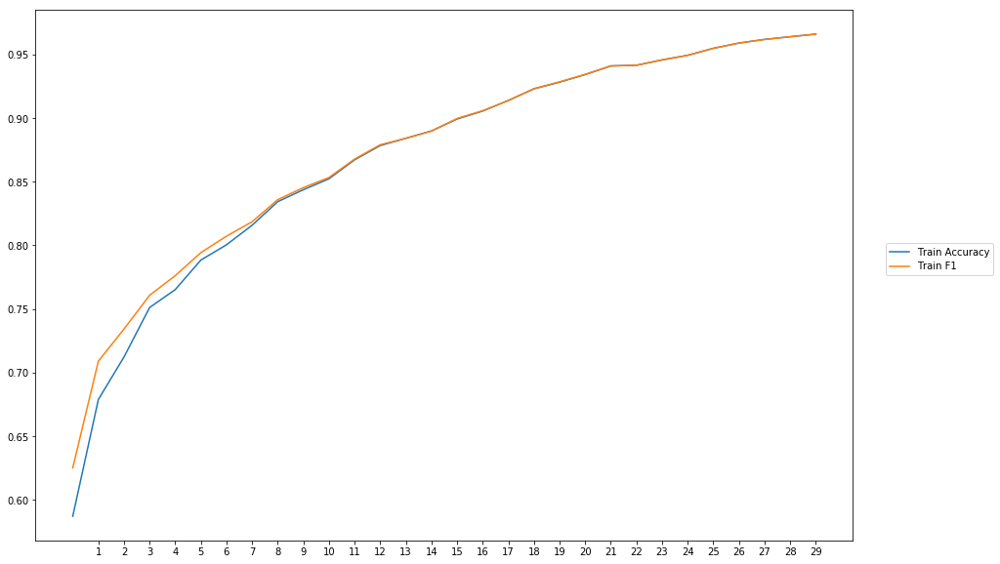


-----Test Scores----
Loss: 0.5979406833648682
Accuracy: 69.13265306122449
Precision: 58.778625939242076
Recall: 74.2765273073066
F1: 65.6249950491917


In [16]:
train_evaluate_three_inputs(model_15, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_senti_vadar, train_labels, test_data, test_senti_blob, test_senti_vadar, test_labels, softmax, outputpath, 'final_additionalFeature_blob_vadar')

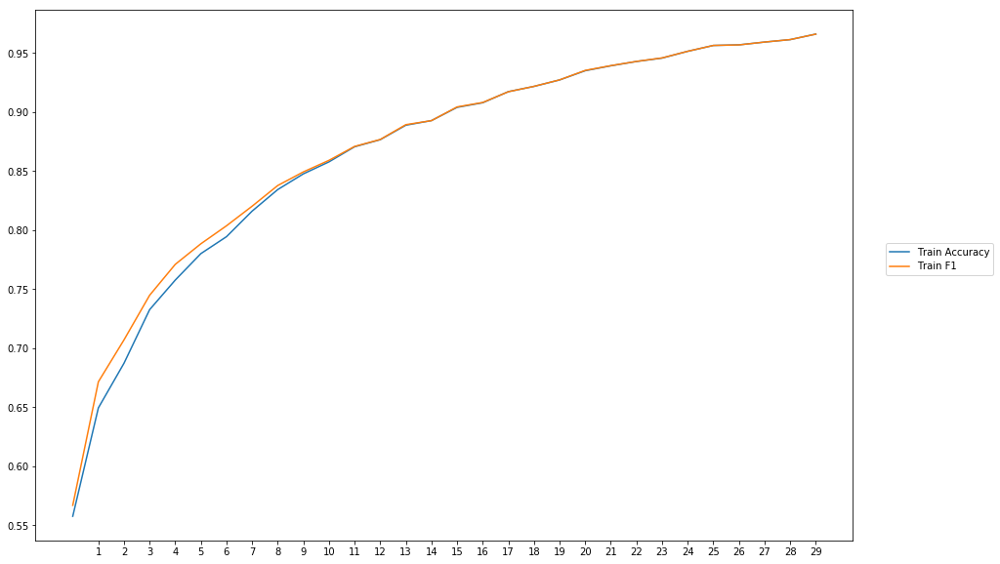


-----Test Scores----
Loss: 0.6099881517643831
Accuracy: 69.89795918367348
Precision: 59.79112269979344
Recall: 73.6334404907931
F1: 65.99423134603764


In [17]:
train_evaluate_three_inputs(model_18, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_senti_blob, train_pos, train_labels, test_data, test_senti_blob, test_pos, test_labels, softmax, outputpath, 'final_additionalFeature_blob_pos')

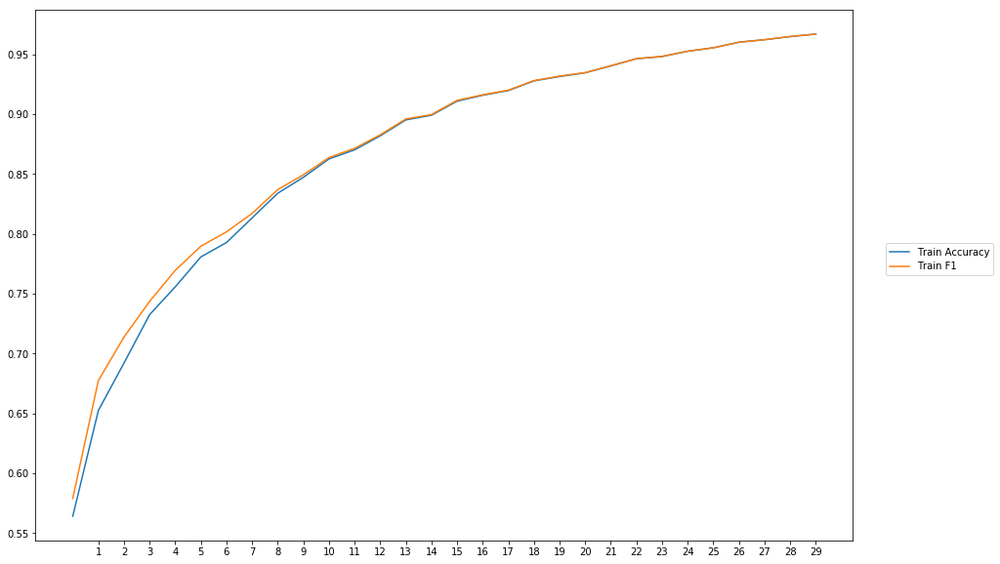


-----Test Scores----
Loss: 0.597934002778968
Accuracy: 68.87755102040816
Precision: 58.83905011640132
Recall: 71.70418004125268
F1: 64.63767618924633


In [18]:
train_evaluate_three_inputs(model_21, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_senti_vadar, train_labels, test_data, test_pos, test_senti_vadar, test_labels, softmax, outputpath, 'final_additionalFeature_pos_vadar')

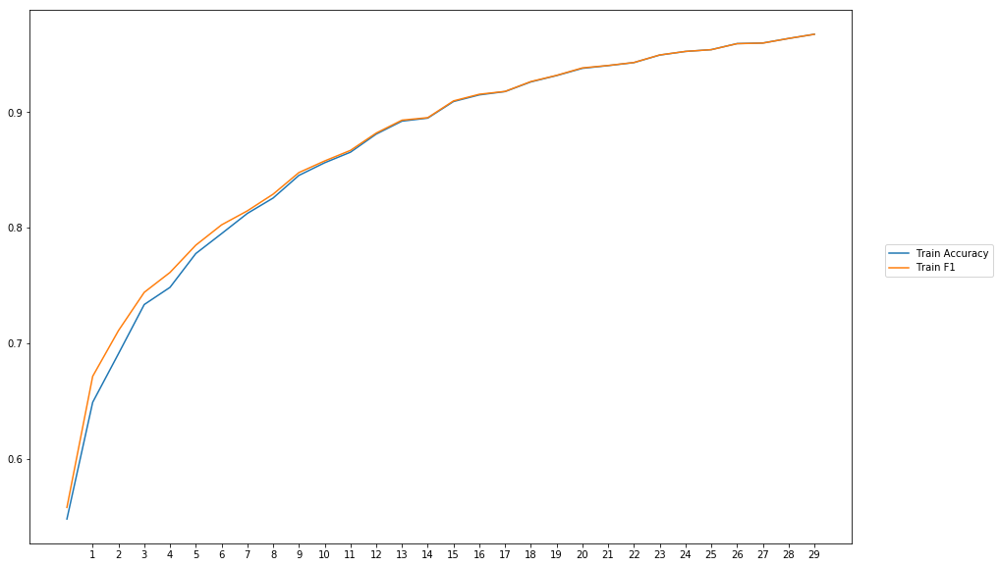


-----Test Scores----
Loss: 0.6274866473918058
Accuracy: 68.23979591836735
Precision: 58.33333331765233
Recall: 69.77491959171225
F1: 63.54318682215484


In [11]:
train_evaluate_four_inputs(model_24, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_pos, train_senti_blob, train_senti_vadar, train_labels, test_data, test_pos, test_senti_blob, test_senti_vadar, test_labels, softmax, outputpath, 'final_additionalFeature_all')